In [1]:
# ==============================
# LIBRARY INSTALLATION
# ==============================
import sys
import subprocess

def install(package):
    subprocess.check_call([sys.executable, "-m", "pip", "install", package])

# Install required libraries if not already installed
try:
    import pandas as pd
except ImportError:
    install("pandas")
    import pandas as pd

try:
    import numpy as np
except ImportError:
    install("numpy")
    import numpy as np

try:
    import matplotlib.pyplot as plt
except ImportError:
    install("matplotlib")
    import matplotlib.pyplot as plt

try:
    import seaborn as sns
except ImportError:
    install("seaborn")
    import seaborn as sns

import random
from datetime import datetime

# ==============================
# CONFIGURATION
# ==============================
start_date = '2023-06-01'
end_date = '2025-02-07'
initial_capital = 1_000_000
lot_size = 50

# --- BUY-SIDE config ---
BUY_PARTIAL_TP_PCT = 0.15
BUY_FINAL_TP_PCT_LOW = 0.20
BUY_FINAL_TP_PCT_HIGH = 0.40
BUY_ATR_PERIOD = 10
BUY_ATR_MULTIPLIER = 2.5
BUY_MAX_LOSS = 15000
BUY_BROKERAGE_PER_ORDER = 20
BUY_SLIPPAGE_PCT = 0.001
BUY_MARKET_CLOSE_TIME = '15:25:00'
BUY_VIX_LOW = 13
BUY_VIX_MED = 17
BUY_RISK_LOW = 0.15
BUY_RISK_MED = 0.10
BUY_RISK_HIGH = 0.05
BUY_IVR_THRESHOLD = 40

# ==============================
# DATA LOADING
# ==============================
def load_spot():
    df = pd.read_csv(r"D:\Bits Hyderabad_Campus Diaries\PS-1\AlgoBulls\Options_Backtest_Local_Data\NIFTY_50_minute_data_Jun23_Feb25.csv", parse_dates=['date'])
    df = df.set_index('date')
    df.index = pd.to_datetime(df.index).tz_localize('Asia/Kolkata')
    df = df.loc[start_date:end_date]
    return df

def load_signals_15min():
    signals_path = r"D:\Bits Hyderabad_Campus Diaries\PS-1\AlgoBulls\Options_Backtest_Local_Data\Nifty_50_signals_15min_2023_25_50_200.csv"
    signals = pd.read_csv(signals_path, parse_dates=['date'])
    signals = signals.set_index('date')
    if signals.index.tz is None:
        signals.index = pd.to_datetime(signals.index).tz_localize('Asia/Kolkata')
    else:
        signals.index = signals.index.tz_convert('Asia/Kolkata')
    if 'Signal' not in signals.columns:
        signals.columns = ['Signal']
    return signals

def load_options_sample():
    sample_path = r"D:\Bits Hyderabad_Campus Diaries\PS-1\AlgoBulls\Options_Backtest_Local_Data\Jun23_Feb25_options_sample_ALL_EXPIRIES.csv"
    options_sample = pd.read_csv(sample_path)
    options_sample['TimeStamp'] = pd.to_datetime(options_sample['TimeStamp'])
    if options_sample['TimeStamp'].dt.tz is None:
        options_sample['TimeStamp'] = options_sample['TimeStamp'].dt.tz_localize('Asia/Kolkata')
    else:
        options_sample['TimeStamp'] = options_sample['TimeStamp'].dt.tz_convert('Asia/Kolkata')
    options_sample['Expiry'] = pd.to_datetime(options_sample['Expiry'])
    return options_sample

def load_vix():
    vix_path = r"D:\Bits Hyderabad_Campus Diaries\PS-1\AlgoBulls\Options_Backtest_Local_Data\filtered_INDIA_VIX_Jun23_Feb25.csv"
    vix = pd.read_csv(vix_path, parse_dates=['TimeStamp'])
    vix = vix.set_index('TimeStamp')
    vix.index = pd.to_datetime(vix.index).tz_localize('Asia/Kolkata')
    vix = vix.loc[start_date:end_date]
    return vix

# ==============================
# BUY-SIDE STRATEGY HELPERS
# ==============================
def compute_atr(df, period=BUY_ATR_PERIOD):
    high = df['High']
    low = df['Low']
    close = df['Close']
    prev_close = close.shift(1)
    tr = pd.concat([high - low, (high - prev_close).abs(), (low - prev_close).abs()], axis=1).max(axis=1)
    atr = tr.rolling(window=period, min_periods=1).mean()
    return atr

def compute_atr_group(df_group):
    return compute_atr(df_group, BUY_ATR_PERIOD)

def compute_iv_rank(option_df, window=252):
    option_df = option_df.copy()
    option_df['IVR'] = option_df['IV'].rolling(window).apply(
        lambda x: 100 * (x[-1] - x.min()) / (x.max() - x.min()) if (x.max() - x.min()) > 0 else 0,
        raw=True
    )
    return option_df

def get_nearest_expiry(expiry_list, ts):
    future_expiries = [e for e in expiry_list if e >= ts.date()]
    return min(future_expiries) if future_expiries else None

def get_risk_per_trade_buy(vix_value):
    if vix_value <= BUY_VIX_LOW:
        return BUY_RISK_LOW
    elif vix_value <= BUY_VIX_MED:
        return BUY_RISK_MED
    else:
        return BUY_RISK_HIGH

def calculate_realistic_costs(entry_price, lots, trade_type, option_volume, option_oi):
    brokerage = 20
    stt = 0.0 if trade_type == 'buy' else entry_price * lots * 50 * 0.001
    exchange_charges = max(20, entry_price * lots * 50 * 0.00053)
    if entry_price < 10 or option_volume < 100 or option_oi < 100:
        spread_impact = entry_price * 0.15
    elif entry_price < 50:
        spread_impact = entry_price * 0.08
    else:
        spread_impact = entry_price * 0.03
    base_slippage = 0.005
    size_penalty = min(0.002 * (lots / 10), 0.01)
    total_slippage = (base_slippage + size_penalty) * entry_price * lots * 50
    return brokerage + stt + exchange_charges + spread_impact + total_slippage

def check_liquidity_constraint(strike, option_type, lots, entry_price, atm_strike, option_volume, option_oi, current_time):
    strike_distance_from_atm = abs(strike - atm_strike)
    if strike_distance_from_atm > 300 and lots > 5:
        return False
    if entry_price < 5 and lots > 20:
        return False
    if current_time.hour == 9 and current_time.minute < 30:
        return random.random() < 0.7
    if option_oi < 50 or option_volume < 50:
        return False
    return True

def simulate_realistic_execution(order_size, option_volume, option_oi):
    if order_size > 50:
        fill_probability = max(0.6, 1 - (order_size - 50) * 0.01)
        if random.random() > fill_probability:
            return None
        else:
            fill_ratio = random.uniform(0.3, 0.8)
            return int(order_size * fill_ratio)
    if option_volume < 100 or option_oi < 100:
        fill_ratio = random.uniform(0.5, 1.0)
        return int(order_size * fill_ratio)
    return order_size

def calculate_realistic_position_size(entry_price, account_balance, risk_per_trade, option_volume, option_oi):
    base_lots = int((account_balance * risk_per_trade) / (entry_price * 50))
    if entry_price < 5:
        max_lots = 10
    elif entry_price < 20:
        max_lots = 25
    elif entry_price < 50:
        max_lots = 50
    else:
        max_lots = 100
    if option_volume < 100 or option_oi < 100:
        max_lots = min(max_lots, 5)
    final_lots = min(base_lots, max_lots)
    if random.random() < 0.1:
        final_lots = int(final_lots * random.uniform(0.5, 0.8))
    return max(1, final_lots)

def simulate_trading_problems():
    problems = {
        'data_feed_issues': 0.01,
        'broker_rejection': 0.03,
    }
    for problem, probability in problems.items():
        if random.random() < probability:
            return problem
    return None

def choose_best_liquid_strike(options_data, atm_strike, expiry, ts):
    today = ts.date()
    expiry = pd.to_datetime(expiry)
    filtered = options_data[
        (options_data['Expiry'] == expiry) &
        (options_data['TimeStamp'] <= ts) &
        (abs(options_data['Strike'] - atm_strike) <= 100)
    ]
    if expiry.date() == today:
        return None, None, None, None
    if not filtered.empty:
        filtered = filtered.copy()
        filtered['liq_score'] = filtered['OI'] + filtered['Volume']
        best_row = filtered.sort_values('liq_score', ascending=False).iloc[0]
        return int(best_row['Strike']), best_row['Type'], int(best_row['Volume']), int(best_row['OI'])
    return None, None, None, None

# ==============================
# BUY-SIDE EXECUTION LOGIC
# ==============================
def execute_trades_15min_atr_trailing_vix_realistic(
    spot_data, signals, options_data, vix_data,
    partial_tp_pct=BUY_PARTIAL_TP_PCT, tp_pct_low=BUY_FINAL_TP_PCT_LOW, tp_pct_high=BUY_FINAL_TP_PCT_HIGH,
    brokerage_per_order=BUY_BROKERAGE_PER_ORDER, slippage_pct=BUY_SLIPPAGE_PCT
):
    portfolio_cash = initial_capital
    trade_log = []
    total_brokerage = 0
    total_slippage = 0
    expiry_list = sorted(options_data['Expiry'].dt.date.unique())
    signals_15min = signals.reindex(spot_data.index, method='ffill').dropna()
    vix_data = vix_data.reindex(spot_data.index, method='ffill').dropna()
    open_positions = []
    previous_entry_price = None
    max_profitable_lots = 0

    options_data['ATR'] = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(compute_atr_group)

    if 'IV' in options_data.columns:
        options_data = options_data.groupby(['Strike', 'Type', 'Expiry']).apply(compute_iv_rank).reset_index(drop=True)
    else:
        options_data['IVR'] = 0

    # [rest of your execution logic remains unchanged]
    # Copy the rest of your code here as in your previous script

    return trade_log, total_brokerage, total_slippage

# ==============================
# MAIN EXECUTION FLOW
# ==============================
print("Loading spot data...")
spot_data = load_spot()
print(f"Spot data shape: {spot_data.shape}")

print("\nLoading 15-min signals...")
signals = load_signals_15min()
print(f"Signals shape: {signals.shape}")

print("\nLoading options sample...")
options_sample = load_options_sample()
print("Options sample loaded.")

print("\nLoading VIX data...")
vix_data = load_vix()
print(f"VIX data shape: {vix_data.shape}")

print("\nExecuting BUY-SIDE (OPTION BUYING) strategy...")
buy_log, buy_brokerage, buy_slippage = execute_trades_15min_atr_trailing_vix_realistic(
    spot_data, signals, options_sample, vix_data
)
buy_log_df = pd.DataFrame(buy_log)
if not buy_log_df.empty:
    buy_log_df.to_csv(r"D:\Bits Hyderabad_Campus Diaries\PS-1\AlgoBulls\Options_Backtest_Local_Data\Jun23_Feb25_buy_side_log_50_200.csv", index=False)
    print("Buy-side trade log saved.")

# [Rest of your reporting and visualization code remains unchanged]


Loading spot data...
Spot data shape: (157436, 5)

Loading 15-min signals...
Signals shape: (59257, 1)

Loading options sample...
Options sample loaded.

Loading VIX data...
VIX data shape: (150861, 6)

Executing BUY-SIDE (OPTION BUYING) strategy...


C:\Users\cmman\AppData\Local\Temp\ipykernel_29492\3674448195.py:242: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  options_data['ATR'] = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(compute_atr_group)


In [ ]:
# ==============================
# LIBRARY INSTALLATION
# ==============================
import sys
import subprocess

def install(package):
    subprocess.check_call([sys.executable, "-m", "pip", "install", package])

for pkg in ["pandas", "numpy", "matplotlib", "seaborn"]:
    try:
        __import__(pkg)
    except ImportError:
        install(pkg)

import pandas as pd
import numpy as np
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns
import random
import os

# ==============================
# CONFIGURATION
# ==============================
start_date = '2023-06-01'
end_date = '2025-02-07'
initial_capital = 1_000_000
lot_size = 50

# --- BUY-SIDE config ---
BUY_PARTIAL_TP_PCT = 0.15
BUY_FINAL_TP_PCT_LOW = 0.20
BUY_FINAL_TP_PCT_HIGH = 0.40
BUY_ATR_PERIOD = 10
BUY_ATR_MULTIPLIER = 2.5
BUY_MAX_LOSS = 15000
BUY_BROKERAGE_PER_ORDER = 20
BUY_SLIPPAGE_PCT = 0.001
BUY_MARKET_CLOSE_TIME = '15:25:00'
BUY_VIX_LOW = 13
BUY_VIX_MED = 17
BUY_RISK_LOW = 0.15
BUY_RISK_MED = 0.10
BUY_RISK_HIGH = 0.05
BUY_IVR_THRESHOLD = 40

# ==============================
# DATA LOADING
# ==============================
def load_spot():
    df = pd.read_csv(r"D:\Bits Hyderabad_Campus Diaries\PS-1\AlgoBulls\Options_Backtest_Local_Data\NIFTY_50_minute_data_Jun23_Feb25.csv", parse_dates=['date'])
    df = df.set_index('date')
    df.index = pd.to_datetime(df.index).tz_localize('Asia/Kolkata')
    df = df.loc[start_date:end_date]
    return df

def load_signals_15min():
    signals_path = r"D:\Bits Hyderabad_Campus Diaries\PS-1\AlgoBulls\Options_Backtest_Local_Data\Nifty_50_signals_15min_2023_25_50_200.csv"
    signals = pd.read_csv(signals_path, parse_dates=['date'])
    signals = signals.set_index('date')
    if signals.index.tz is None:
        signals.index = pd.to_datetime(signals.index).tz_localize('Asia/Kolkata')
    else:
        signals.index = signals.index.tz_convert('Asia/Kolkata')
    if 'Signal' not in signals.columns:
        signals.columns = ['Signal']
    return signals

def load_options_sample():
    sample_path = r"D:\Bits Hyderabad_Campus Diaries\PS-1\AlgoBulls\Options_Backtest_Local_Data\Jun23_Feb25_options_sample_ALL_EXPIRIES.csv"
    options_sample = pd.read_csv(sample_path)
    options_sample['TimeStamp'] = pd.to_datetime(options_sample['TimeStamp'])
    if options_sample['TimeStamp'].dt.tz is None:
        options_sample['TimeStamp'] = options_sample['TimeStamp'].dt.tz_localize('Asia/Kolkata')
    else:
        options_sample['TimeStamp'] = options_sample['TimeStamp'].dt.tz_convert('Asia/Kolkata')
    options_sample['Expiry'] = pd.to_datetime(options_sample['Expiry'])
    return options_sample

def load_vix():
    vix_path = r"D:\Bits Hyderabad_Campus Diaries\PS-1\AlgoBulls\Options_Backtest_Local_Data\filtered_INDIA_VIX_Jun23_Feb25.csv"
    vix = pd.read_csv(vix_path, parse_dates=['TimeStamp'])
    vix = vix.set_index('TimeStamp')
    vix.index = pd.to_datetime(vix.index).tz_localize('Asia/Kolkata')
    vix = vix.loc[start_date:end_date]
    return vix

# ==============================
# BUY-SIDE STRATEGY HELPERS
# ==============================
def compute_atr(df, period=BUY_ATR_PERIOD):
    high = df['High']
    low = df['Low']
    close = df['Close']
    prev_close = close.shift(1)
    tr = pd.concat([high - low, (high - prev_close).abs(), (low - prev_close).abs()], axis=1).max(axis=1)
    atr = tr.rolling(window=period, min_periods=1).mean()
    return atr

def compute_atr_group(df_group):
    return compute_atr(df_group, BUY_ATR_PERIOD)

def compute_iv_rank(option_df, window=252):
    option_df = option_df.copy()
    option_df['IVR'] = option_df['IV'].rolling(window).apply(
        lambda x: 100 * (x[-1] - x.min()) / (x.max() - x.min()) if (x.max() - x.min()) > 0 else 0,
        raw=True
    )
    return option_df

def get_nearest_expiry(expiry_list, ts):
    future_expiries = [e for e in expiry_list if e >= ts.date()]
    return min(future_expiries) if future_expiries else None

def get_risk_per_trade_buy(vix_value):
    if vix_value <= BUY_VIX_LOW:
        return BUY_RISK_LOW
    elif vix_value <= BUY_VIX_MED:
        return BUY_RISK_MED
    else:
        return BUY_RISK_HIGH

def calculate_realistic_costs(entry_price, lots, trade_type, option_volume, option_oi):
    brokerage = 20
    stt = 0.0 if trade_type == 'buy' else entry_price * lots * 50 * 0.001
    exchange_charges = max(20, entry_price * lots * 50 * 0.00053)
    if entry_price < 10 or option_volume < 100 or option_oi < 100:
        spread_impact = entry_price * 0.15
    elif entry_price < 50:
        spread_impact = entry_price * 0.08
    else:
        spread_impact = entry_price * 0.03
    base_slippage = 0.005
    size_penalty = min(0.002 * (lots / 10), 0.01)
    total_slippage = (base_slippage + size_penalty) * entry_price * lots * 50
    return brokerage + stt + exchange_charges + spread_impact + total_slippage

def check_liquidity_constraint(strike, option_type, lots, entry_price, atm_strike, option_volume, option_oi, current_time):
    strike_distance_from_atm = abs(strike - atm_strike)
    if strike_distance_from_atm > 300 and lots > 5:
        return False
    if entry_price < 5 and lots > 20:
        return False
    if current_time.hour == 9 and current_time.minute < 30:
        return random.random() < 0.7
    if option_oi < 50 or option_volume < 50:
        return False
    return True

def simulate_realistic_execution(order_size, option_volume, option_oi):
    if order_size > 50:
        fill_probability = max(0.6, 1 - (order_size - 50) * 0.01)
        if random.random() > fill_probability:
            return None
        else:
            fill_ratio = random.uniform(0.3, 0.8)
            return int(order_size * fill_ratio)
    if option_volume < 100 or option_oi < 100:
        fill_ratio = random.uniform(0.5, 1.0)
        return int(order_size * fill_ratio)
    return order_size

def calculate_realistic_position_size(entry_price, account_balance, risk_per_trade, option_volume, option_oi):
    base_lots = int((account_balance * risk_per_trade) / (entry_price * 50))
    if entry_price < 5:
        max_lots = 10
    elif entry_price < 20:
        max_lots = 25
    elif entry_price < 50:
        max_lots = 50
    else:
        max_lots = 100
    if option_volume < 100 or option_oi < 100:
        max_lots = min(max_lots, 5)
    final_lots = min(base_lots, max_lots)
    if random.random() < 0.1:
        final_lots = int(final_lots * random.uniform(0.5, 0.8))
    return max(1, final_lots)

def simulate_trading_problems():
    problems = {
        'data_feed_issues': 0.01,
        'broker_rejection': 0.03,
    }
    for problem, probability in problems.items():
        if random.random() < probability:
            return problem
    return None

def choose_best_liquid_strike(options_data, atm_strike, expiry, ts):
    today = ts.date()
    expiry = pd.to_datetime(expiry)
    filtered = options_data[
        (options_data['Expiry'] == expiry) &
        (options_data['TimeStamp'] <= ts) &
        (abs(options_data['Strike'] - atm_strike) <= 100)
    ]
    if expiry.date() == today:
        return None, None, None, None
    if not filtered.empty:
        filtered = filtered.copy()
        filtered['liq_score'] = filtered['OI'] + filtered['Volume']
        best_row = filtered.sort_values('liq_score', ascending=False).iloc[0]
        return int(best_row['Strike']), best_row['Type'], int(best_row['Volume']), int(best_row['OI'])
    return None, None, None, None

# ==============================
# BUY-SIDE EXECUTION LOGIC
# ==============================
def execute_trades_15min_atr_trailing_vix_realistic(
    spot_data, signals, options_data, vix_data,
    partial_tp_pct=BUY_PARTIAL_TP_PCT, tp_pct_low=BUY_FINAL_TP_PCT_LOW, tp_pct_high=BUY_FINAL_TP_PCT_HIGH,
    brokerage_per_order=BUY_BROKERAGE_PER_ORDER, slippage_pct=BUY_SLIPPAGE_PCT
):
    portfolio_cash = initial_capital
    trade_log = []
    total_brokerage = 0
    total_slippage = 0
    expiry_list = sorted(options_data['Expiry'].dt.date.unique())
    signals_15min = signals.reindex(spot_data.index, method='ffill').dropna()
    vix_data = vix_data.reindex(spot_data.index, method='ffill').dropna()
    open_positions = []
    previous_entry_price = None
    max_profitable_lots = 0

    # --- ATR calculation (apply, not transform) ---
    # Fix deprecation warning by excluding grouping columns
    options_data['ATR'] = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False, observed=True).apply(
        lambda df: compute_atr(df, BUY_ATR_PERIOD)
    )

    # --- IVR calculation ---
    if 'IV' in options_data.columns:
        options_data = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False, observed=True).apply(compute_iv_rank).reset_index(drop=True)
    else:
        options_data['IVR'] = 0

    for ts, row in spot_data.iterrows():
        if ts.time() >= datetime.strptime(BUY_MARKET_CLOSE_TIME, '%H:%M:%S').time():
            for pos in open_positions[:]:
                exit_row = options_data[
                    (options_data['Strike'] == pos['strike']) &
                    (options_data['Type'] == pos['type']) &
                    (options_data['Expiry'].dt.date == pos['expiry']) &
                    (options_data['TimeStamp'] >= ts)
                ].sort_values('TimeStamp')
                if not exit_row.empty:
                    exit_price = float(exit_row.iloc[0]['Close'])
                    exit_time = exit_row.iloc[0]['TimeStamp']
                    costs = calculate_realistic_costs(exit_price, pos['lots'], 'buy', pos['option_volume'], pos['option_oi'])
                    pnl = (exit_price - pos['entry_price']) * lot_size * pos['lots'] - costs
                    if pnl < -BUY_MAX_LOSS:
                        pnl = -BUY_MAX_LOSS
                    portfolio_cash += pnl
                    trade_log.append({
                        'entry_date': pos['entry_date'],
                        'entry_time': pos['entry_time'],
                        'exit_date': exit_time,
                        'action': pos['action'],
                        'type': pos['type'],
                        'strike': pos['strike'],
                        'entry_price': pos['entry_price'],
                        'exit_price': exit_price,
                        'lots': pos['lots'],
                        'pnl': pnl,
                        'holding_days': 0,
                        'spot': pos['spot'],
                        'expiry': pos['expiry'],
                        'exit_reason': 'EOD Close'
                    })
                    if pnl > 0:
                        max_profitable_lots = max(max_profitable_lots, pos['lots'])
                    open_positions.remove(pos)
            continue

        if ts not in signals_15min.index or pd.isna(row['close']):
            continue
        signal = signals_15min.loc[ts, 'Signal']
        if signal == 0:
            continue
        spot_price = row['close']
        atm_strike = int(round(spot_price / 50) * 50)
        expiry = get_nearest_expiry(expiry_list, ts)
        if expiry is None:
            continue
        vix_val = vix_data.loc[ts, 'Close'] if ts in vix_data.index else None
        if vix_val is None or np.isnan(vix_val):
            continue
        vix_ma20 = vix_data['Close'].rolling(20*24*4, min_periods=1).mean().loc[ts]
        ivr = 0
        best_strike, best_type, option_volume, option_oi = choose_best_liquid_strike(options_data, atm_strike, expiry, ts)
        if best_strike is None:
            continue
        option_type = 'CE' if signal == 1 else 'PE'
        if vix_val >= vix_ma20 or ivr >= BUY_IVR_THRESHOLD:
            continue
        if vix_val <= BUY_VIX_LOW:
            final_tp_pct = tp_pct_low
        elif vix_val > BUY_VIX_MED:
            final_tp_pct = tp_pct_high
        else:
            final_tp_pct = tp_pct_low + (tp_pct_high - tp_pct_low) * ((vix_val - BUY_VIX_LOW)/(BUY_VIX_MED - BUY_VIX_LOW))
        risk_per_trade = get_risk_per_trade_buy(vix_val)
        if not any(pos['strike'] == best_strike and pos['expiry'] == expiry and pos['type'] == option_type for pos in open_positions):
            entry_row = options_data[
                (options_data['Strike'] == best_strike) &
                (options_data['Type'] == option_type) &
                (options_data['Expiry'].dt.date == expiry) &
                (options_data['TimeStamp'] >= ts)
            ].sort_values('TimeStamp')
            if entry_row.empty:
                continue
            entry_price = float(entry_row.iloc[0]['Close'])
            entry_time = entry_row.iloc[0]['TimeStamp']
            lots = calculate_realistic_position_size(entry_price, portfolio_cash, risk_per_trade, option_volume, option_oi)
            if previous_entry_price is not None and entry_price < 0.2 * previous_entry_price:
                if max_profitable_lots > 0:
                    lots = min(lots, max_profitable_lots)
            if not check_liquidity_constraint(best_strike, option_type, lots, entry_price, atm_strike, option_volume, option_oi, ts):
                continue
            lots_filled = simulate_realistic_execution(lots, option_volume, option_oi)
            if lots_filled is None or lots_filled < 1:
                continue
            if simulate_trading_problems() is not None:
                continue
            partial_tp_price = entry_price * (1 + partial_tp_pct)
            final_tp_price = entry_price * (1 + final_tp_pct)
            atr = float(entry_row.iloc[0]['ATR'])
            trailing_stop = entry_price - BUY_ATR_MULTIPLIER * atr
            open_positions.append({
                'entry_date': ts,
                'entry_time': entry_time,
                'action': 'Buy',
                'type': option_type,
                'strike': best_strike,
                'entry_price': entry_price,
                'lots': lots_filled,
                'spot': spot_price,
                'expiry': expiry,
                'signal': signal,
                'option_volume': option_volume,
                'option_oi': option_oi,
                'partial_tp_price': partial_tp_price,
                'final_tp_price': final_tp_price,
                'trailing_stop': trailing_stop,
                'max_loss_stop': entry_price - (BUY_MAX_LOSS / (lot_size * lots_filled)),
                'highest_price': entry_price,
                'risk_per_trade': risk_per_trade,
                'vix_at_entry': vix_val,
                'ivr_at_entry': ivr,
                'partial_booked': False,
                'partial_lots': lots_filled // 2,
                'final_lots': lots_filled - (lots_filled // 2)
            })
            previous_entry_price = entry_price

        for pos in open_positions[:]:
            exit_reason = None
            exit_price = None
            exit_time = None
            option_rows = options_data[
                (options_data['Strike'] == pos['strike']) &
                (options_data['Type'] == pos['type']) &
                (options_data['Expiry'].dt.date == pos['expiry']) &
                (options_data['TimeStamp'] >= pos['entry_time']) &
                (options_data['TimeStamp'] <= ts)
            ].sort_values('TimeStamp')
            for _, opt_row in option_rows.iterrows():
                price = float(opt_row['Close'])
                atr = float(opt_row['ATR'])
                if price > pos['highest_price']:
                    pos['highest_price'] = price
                trailing_stop = pos['highest_price'] - BUY_ATR_MULTIPLIER * atr
                pos['trailing_stop'] = max(pos['trailing_stop'], trailing_stop)
                if not pos['partial_booked'] and price >= pos['partial_tp_price']:
                    costs = calculate_realistic_costs(price, pos['partial_lots'], 'buy', pos['option_volume'], pos['option_oi'])
                    pnl = (price - pos['entry_price']) * lot_size * pos['partial_lots'] - costs
                    if pnl < -BUY_MAX_LOSS:
                        pnl = -BUY_MAX_LOSS
                    portfolio_cash += pnl
                    trade_log.append({
                        'entry_date': pos['entry_date'],
                        'entry_time': pos['entry_time'],
                        'exit_date': opt_row['TimeStamp'],
                        'action': pos['action'],
                        'type': pos['type'],
                        'strike': pos['strike'],
                        'entry_price': pos['entry_price'],
                        'exit_price': price,
                        'lots': pos['partial_lots'],
                        'pnl': pnl,
                        'holding_days': 0,
                        'spot': pos['spot'],
                        'expiry': pos['expiry'],
                        'exit_reason': 'Partial TP',
                        'risk_per_trade': pos['risk_per_trade'],
                        'vix_at_entry': pos['vix_at_entry'],
                        'ivr_at_entry': pos['ivr_at_entry']
                    })
                    if pnl > 0:
                        max_profitable_lots = max(max_profitable_lots, pos['partial_lots'])
                    pos['partial_booked'] = True
                    pos['final_lots'] = pos['final_lots']
                    continue
                if pos['partial_booked'] and price >= pos['final_tp_price']:
                    exit_price = pos['final_tp_price']
                    exit_time = opt_row['TimeStamp']
                    exit_reason = 'Final TP'
                    break
                elif pos['partial_booked'] and price <= pos['trailing_stop']:
                    exit_price = pos['trailing_stop']
                    exit_time = opt_row['TimeStamp']
                    exit_reason = 'Trailing Stop'
                    break
                elif pos['partial_booked'] and price <= pos['max_loss_stop']:
                    exit_price = pos['max_loss_stop']
                    exit_time = opt_row['TimeStamp']
                    exit_reason = 'Max Loss Stop'
                    break

            if pos['partial_booked'] and exit_reason is not None and exit_price is not None:
                costs = calculate_realistic_costs(exit_price, pos['final_lots'], 'buy', pos['option_volume'], pos['option_oi'])
                pnl = (exit_price - pos['entry_price']) * lot_size * pos['final_lots'] - costs
                if pnl < -BUY_MAX_LOSS:
                    pnl = -BUY_MAX_LOSS
                portfolio_cash += pnl
                trade_log.append({
                    'entry_date': pos['entry_date'],
                    'entry_time': pos['entry_time'],
                    'exit_date': exit_time,
                    'action': pos['action'],
                    'type': pos['type'],
                    'strike': pos['strike'],
                    'entry_price': pos['entry_price'],
                    'exit_price': exit_price,
                    'lots': pos['final_lots'],
                    'pnl': pnl,
                    'holding_days': 0,
                    'spot': pos['spot'],
                    'expiry': pos['expiry'],
                    'exit_reason': exit_reason,
                    'risk_per_trade': pos['risk_per_trade'],
                    'vix_at_entry': pos['vix_at_entry'],
                    'ivr_at_entry': pos['ivr_at_entry']
                })
                if pnl > 0:
                    max_profitable_lots = max(max_profitable_lots, pos['final_lots'])
                open_positions.remove(pos)

    return trade_log, total_brokerage, total_slippage

# ==============================
# MAIN EXECUTION FLOW
# ==============================
print("Loading spot data...")
spot_data = load_spot()
print(f"Spot data shape: {spot_data.shape}")

print("\nLoading 15-min signals...")
signals = load_signals_15min()
print(f"Signals shape: {signals.shape}")

print("\nLoading options sample...")
options_sample = load_options_sample()
print("Options sample loaded.")

print("\nLoading VIX data...")
vix_data = load_vix()
print(f"VIX data shape: {vix_data.shape}")

print("\nExecuting BUY-SIDE (OPTION BUYING) strategy...")
buy_log, buy_brokerage, buy_slippage = execute_trades_15min_atr_trailing_vix_realistic(
    spot_data, signals, options_sample, vix_data
)
buy_log_df = pd.DataFrame(buy_log)

output_path = r"D:\Bits Hyderabad_Campus Diaries\PS-1\AlgoBulls\Options_Backtest_Local_Data\Jun23_Feb25_buy_side_log_50_200.csv"
if not buy_log_df.empty:
    buy_log_df.to_csv(output_path, index=False)
    print(f"Buy-side trade log saved at: {output_path}")
else:
    print("No trades to save.")

# ==============================
# PORTFOLIO REPORT & VISUALIZATIONS
# ==============================
if not buy_log_df.empty:
    buy_log_df['pnl'] = buy_log_df['pnl'].astype(float)
    buy_log_df['exit_date'] = pd.to_datetime(buy_log_df['exit_date'])
    buy_log_df['strategy'] = 'Buy'
    buy_log_df['exit_time'] = buy_log_df['exit_date']

combined_log = buy_log_df[['exit_time', 'pnl', 'strategy']] if not buy_log_df.empty else pd.DataFrame()
combined_log = combined_log.sort_values('exit_time').reset_index(drop=True)

portfolio_values = [initial_capital]
portfolio_dates = [combined_log['exit_time'].iloc[0] if not combined_log.empty else pd.Timestamp(start_date)]
current_value = initial_capital
for i, row in combined_log.iterrows():
    current_value += row['pnl']
    portfolio_values.append(current_value)
    portfolio_dates.append(row['exit_time'])

returns = pd.Series(portfolio_values).pct_change().dropna()
rf = 0.01
sharpe = ((returns.mean() - rf/252) / returns.std()) * np.sqrt(252) if returns.std() > 0 else 0
downside_std = returns[returns < 0].std()
sortino = ((returns.mean() - rf/252) / downside_std) * np.sqrt(252) if downside_std > 0 else 0
cumulative = pd.Series(portfolio_values)
rolling_max = cumulative.cummax()
drawdown = (cumulative - rolling_max) / rolling_max
max_drawdown = abs(drawdown.min()) * initial_capital
years = len(portfolio_values) / 252
cagr = (portfolio_values[-1]/portfolio_values[0])**(1/years) - 1 if years > 0 else 0
calmar = cagr / abs(drawdown.min()) if drawdown.min() != 0 else 0

print(f"""
BUY-SIDE STRATEGY PERFORMANCE REPORT
-------------------------------------
Initial Capital:    ₹{initial_capital:,.2f}
Final Portfolio:    ₹{portfolio_values[-1]:,.2f}
Total Return:       {(portfolio_values[-1]/initial_capital-1)*100:.2f}%
Max Drawdown:       ₹{max_drawdown:,.2f}
Sharpe Ratio:       {sharpe:.2f}
Sortino Ratio:      {sortino:.2f}
Calmar Ratio:       {calmar:.2f}
Total Brokerage:    ₹{buy_brokerage:,.2f}
Total Slippage:     ₹{buy_slippage:,.2f}

Trade Statistics:
-----------------
Total Trades:       {len(combined_log)}
Buy Trades:         {len(buy_log_df) if not buy_log_df.empty else 0}
Winning Trades:     {(combined_log['pnl'] > 0).sum()}
Losing Trades:      {(combined_log['pnl'] <= 0).sum()}
Avg PnL:            ₹{combined_log['pnl'].mean():,.2f}
Best Trade:         ₹{combined_log['pnl'].max():,.2f}
Worst Trade:        ₹{combined_log['pnl'].min():,.2f}
Trade Period:       {combined_log['exit_time'].min().date() if not combined_log.empty else 'N/A'} to {combined_log['exit_time'].max().date() if not combined_log.empty else 'N/A'}
""")

# ==============================
# VISUALIZATIONS
# ==============================
if not buy_log_df.empty:
    sns.set_style("whitegrid")
    plt.figure(figsize=(14, 7))
    plt.plot(portfolio_dates, portfolio_values, label='Portfolio Value', linewidth=2)
    plt.title('Portfolio Value Over Time', fontsize=16)
    plt.ylabel('Value (₹)', fontsize=14)
    plt.xlabel('Date', fontsize=14)
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(14, 5))
    plt.plot(cumulative, label='Portfolio Value')
    plt.plot(rolling_max, '--', label='Rolling Max')
    plt.fill_between(cumulative.index, cumulative, rolling_max, color='red', alpha=0.3, label='Drawdown')
    plt.title("Equity Curve with Drawdown")
    plt.legend()
    plt.show()

    plt.figure(figsize=(7, 4))
    sns.histplot(combined_log['pnl'], bins=20, kde=True)
    plt.title("Trade PnL Distribution")
    plt.xlabel("PnL (₹)")
    plt.ylabel("Count")
    plt.show()

    combined_log['exit_week'] = pd.to_datetime(combined_log['exit_time']).dt.isocalendar().week
    heatmap_data = combined_log.pivot_table(index='exit_week', columns='strategy', values='pnl', aggfunc='sum')
    plt.figure(figsize=(8, 5))
    sns.heatmap(heatmap_data, annot=True, fmt=".0f", cmap='RdYlGn')
    plt.title("PnL Heatmap by Week")
    plt.xlabel("Strategy")
    plt.ylabel("ISO Week")
    plt.show()

    n_sim = 1000
    sim_length = len(combined_log)
    sim_results = []
    for _ in range(n_sim):
        sim_pnls = np.random.choice(combined_log['pnl'], size=sim_length, replace=True)
        sim_curve = np.cumsum(np.insert(sim_pnls, 0, initial_capital))
        sim_results.append(sim_curve[-1])
    plt.figure(figsize=(10, 5))
    plt.hist(sim_results, bins=30, color='skyblue')
    plt.axvline(np.mean(sim_results), color='red', linestyle='dashed', linewidth=2, label='Mean Final Value')
    plt.title("Monte Carlo Simulation: Distribution of Final Portfolio Value")
    plt.xlabel("Final Portfolio Value (₹)")
    plt.ylabel("Frequency")
    plt.legend()
    plt.show()
    print(f"Monte Carlo: Mean Final Value = ₹{np.mean(sim_results):,.2f}, 5th Percentile = ₹{np.percentile(sim_results, 5):,.2f}, 95th Percentile = ₹{np.percentile(sim_results, 95):,.2f}")
else:
    print("No trades to visualize.")

# ==============================
# END OF SCRIPT
# ==============================



Loading spot data...
Spot data shape: (157436, 5)

Loading 15-min signals...
Signals shape: (59257, 1)

Loading options sample...
Options sample loaded.

Loading VIX data...
VIX data shape: (150861, 6)

Executing BUY-SIDE (OPTION BUYING) strategy...


C:\Users\cmman\AppData\Local\Temp\ipykernel_29492\944191411.py:230: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  options_data['ATR'] = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False, observed=True).apply(


In [2]:
# ==============================
# LIBRARY INSTALLATION
# ==============================
import sys
import subprocess

def install(package):
    subprocess.check_call([sys.executable, "-m", "pip", "install", package])

for pkg in ["pandas", "numpy", "matplotlib", "seaborn"]:
    try:
        __import__(pkg)
    except ImportError:
        install(pkg)

import pandas as pd
import numpy as np
from datetime import datetime, timedelta
import matplotlib.pyplot as plt
import seaborn as sns
import random
import os

# ==============================
# CONFIGURATION
# ==============================
data_dir = r"D:\Bits Hyderabad_Campus Diaries\PS-1\AlgoBulls\Options_Backtest_Local_Data"
start_date = '2023-06-01'
end_date = '2025-02-07'
initial_capital = 1_000_000
lot_size = 50

# --- BUY-SIDE config ---
BUY_PARTIAL_TP_PCT = 0.15
BUY_FINAL_TP_PCT_LOW = 0.20
BUY_FINAL_TP_PCT_HIGH = 0.40
BUY_ATR_PERIOD = 10
BUY_ATR_MULTIPLIER = 2.5
BUY_MAX_LOSS = 15000
BUY_BROKERAGE_PER_ORDER = 20
BUY_SLIPPAGE_PCT = 0.001
BUY_MARKET_CLOSE_TIME = '15:25:00'
BUY_VIX_LOW = 13
BUY_VIX_MED = 17
BUY_RISK_LOW = 0.15
BUY_RISK_MED = 0.10
BUY_RISK_HIGH = 0.05
BUY_IVR_THRESHOLD = 40

# ==============================
# DATA LOADING
# ==============================
def load_spot():
    df = pd.read_csv(os.path.join(data_dir, "NIFTY_50_minute_data_Jun23_Feb25.csv"), parse_dates=['date'])
    df = df.set_index('date')
    df.index = pd.to_datetime(df.index).tz_localize('Asia/Kolkata')
    df = df.loc[start_date:end_date]
    return df

def load_signals_15min():
    signals_path = os.path.join(data_dir, "Nifty_50_signals_15min_2023_25_50_200.csv")
    signals = pd.read_csv(signals_path, parse_dates=['date'])
    signals = signals.set_index('date')
    if signals.index.tz is None:
        signals.index = pd.to_datetime(signals.index).tz_localize('Asia/Kolkata')
    else:
        signals.index = signals.index.tz_convert('Asia/Kolkata')
    if 'Signal' not in signals.columns:
        signals.columns = ['Signal']
    return signals

def load_options_sample():
    sample_path = os.path.join(data_dir, "Jun23_Feb25_options_sample_ALL_EXPIRIES.csv")
    options_sample = pd.read_csv(sample_path)
    options_sample['TimeStamp'] = pd.to_datetime(options_sample['TimeStamp'])
    if options_sample['TimeStamp'].dt.tz is None:
        options_sample['TimeStamp'] = options_sample['TimeStamp'].dt.tz_localize('Asia/Kolkata')
    else:
        options_sample['TimeStamp'] = options_sample['TimeStamp'].dt.tz_convert('Asia/Kolkata')
    options_sample['Expiry'] = pd.to_datetime(options_sample['Expiry'])
    return options_sample

def load_vix():
    vix_path = os.path.join(data_dir, "filtered_INDIA_VIX_Jun23_Feb25.csv")
    vix = pd.read_csv(vix_path, parse_dates=['TimeStamp'])
    vix = vix.set_index('TimeStamp')
    vix.index = pd.to_datetime(vix.index).tz_localize('Asia/Kolkata')
    vix = vix.loc[start_date:end_date]
    return vix

# ==============================
# BUY-SIDE STRATEGY HELPERS
# ==============================
def compute_atr(df, period=BUY_ATR_PERIOD):
    high = df['High']
    low = df['Low']
    close = df['Close']
    prev_close = close.shift(1)
    tr = pd.concat([high - low, (high - prev_close).abs(), (low - prev_close).abs()], axis=1).max(axis=1)
    atr = tr.rolling(window=period, min_periods=1).mean()
    return atr

def compute_atr_group(df_group):
    return compute_atr(df_group, BUY_ATR_PERIOD)

def compute_iv_rank(option_df, window=252):
    option_df = option_df.copy()
    option_df['IVR'] = option_df['IV'].rolling(window).apply(
        lambda x: 100 * (x[-1] - x.min()) / (x.max() - x.min()) if (x.max() - x.min()) > 0 else 0,
        raw=True
    )
    return option_df

def get_nearest_expiry(expiry_list, ts):
    future_expiries = [e for e in expiry_list if e >= ts.date()]
    return min(future_expiries) if future_expiries else None

def get_risk_per_trade_buy(vix_value):
    if vix_value <= BUY_VIX_LOW:
        return BUY_RISK_LOW
    elif vix_value <= BUY_VIX_MED:
        return BUY_RISK_MED
    else:
        return BUY_RISK_HIGH

def calculate_realistic_costs(entry_price, lots, trade_type, option_volume, option_oi):
    brokerage = 20
    stt = 0.0 if trade_type == 'buy' else entry_price * lots * 50 * 0.001
    exchange_charges = max(20, entry_price * lots * 50 * 0.00053)
    if entry_price < 10 or option_volume < 100 or option_oi < 100:
        spread_impact = entry_price * 0.15
    elif entry_price < 50:
        spread_impact = entry_price * 0.08
    else:
        spread_impact = entry_price * 0.03
    base_slippage = 0.005
    size_penalty = min(0.002 * (lots / 10), 0.01)
    total_slippage = (base_slippage + size_penalty) * entry_price * lots * 50
    return brokerage + stt + exchange_charges + spread_impact + total_slippage

def check_liquidity_constraint(strike, option_type, lots, entry_price, atm_strike, option_volume, option_oi, current_time):
    strike_distance_from_atm = abs(strike - atm_strike)
    if strike_distance_from_atm > 300 and lots > 5:
        return False
    if entry_price < 5 and lots > 20:
        return False
    if current_time.hour == 9 and current_time.minute < 30:
        return random.random() < 0.7
    if option_oi < 50 or option_volume < 50:
        return False
    return True

def simulate_realistic_execution(order_size, option_volume, option_oi):
    if order_size > 50:
        fill_probability = max(0.6, 1 - (order_size - 50) * 0.01)
        if random.random() > fill_probability:
            return None
        else:
            fill_ratio = random.uniform(0.3, 0.8)
            return int(order_size * fill_ratio)
    if option_volume < 100 or option_oi < 100:
        fill_ratio = random.uniform(0.5, 1.0)
        return int(order_size * fill_ratio)
    return order_size

def calculate_realistic_position_size(entry_price, account_balance, risk_per_trade, option_volume, option_oi):
    base_lots = int((account_balance * risk_per_trade) / (entry_price * 50))
    if entry_price < 5:
        max_lots = 10
    elif entry_price < 20:
        max_lots = 25
    elif entry_price < 50:
        max_lots = 50
    else:
        max_lots = 100
    if option_volume < 100 or option_oi < 100:
        max_lots = min(max_lots, 5)
    final_lots = min(base_lots, max_lots)
    if random.random() < 0.1:
        final_lots = int(final_lots * random.uniform(0.5, 0.8))
    return max(1, final_lots)

def simulate_trading_problems():
    problems = {
        'data_feed_issues': 0.01,
        'broker_rejection': 0.03,
    }
    for problem, probability in problems.items():
        if random.random() < probability:
            return problem
    return None

def choose_best_liquid_strike(options_data, atm_strike, expiry, ts):
    today = ts.date()
    expiry = pd.to_datetime(expiry)
    filtered = options_data[
        (options_data['Expiry'] == expiry) &
        (options_data['TimeStamp'] <= ts) &
        (abs(options_data['Strike'] - atm_strike) <= 100)
    ]
    if expiry.date() == today:
        return None, None, None, None
    if not filtered.empty:
        filtered = filtered.copy()
        filtered['liq_score'] = filtered['OI'] + filtered['Volume']
        best_row = filtered.sort_values('liq_score', ascending=False).iloc[0]
        return int(best_row['Strike']), best_row['Type'], int(best_row['Volume']), int(best_row['OI'])
    return None, None, None, None

# ==============================
# PERIOD SPLITTING HELPER
# ==============================
def split_date_range(start, end, months=2):
    periods = []
    current_start = pd.to_datetime(start)
    end = pd.to_datetime(end)
    while current_start < end:
        month = current_start.month - 1 + months
        year = current_start.year + month // 12
        month = month % 12 + 1
        try:
            current_end = pd.Timestamp(year=year, month=month, day=current_start.day)
        except ValueError:
            current_end = pd.Timestamp(year=year, month=month, day=28)
        if current_end > end:
            current_end = end
        periods.append((current_start, current_end))
        current_start = current_end + timedelta(days=1)
    return periods

# ==============================
# MAIN EXECUTION: SPLIT BY PERIOD (TZ-AWARE FIX)
# ==============================
def run_backtest_in_periods():
    spot_data = load_spot()
    signals = load_signals_15min()
    options_sample = load_options_sample()
    vix_data = load_vix()
    periods = split_date_range(start_date, end_date, months=2)
    all_trade_logs = []

    # --- Ensure all datetime columns/indexes are tz-aware ---
    def to_ist_aware(ts):
        if ts.tzinfo is None:
            return ts.tz_localize('Asia/Kolkata')
        else:
            return ts.tz_convert('Asia/Kolkata')

    # Spot, signals, vix: index
    if spot_data.index.tz is None:
        spot_data.index = spot_data.index.tz_localize('Asia/Kolkata')
    else:
        spot_data.index = spot_data.index.tz_convert('Asia/Kolkata')
    if signals.index.tz is None:
        signals.index = signals.index.tz_localize('Asia/Kolkata')
    else:
        signals.index = signals.index.tz_convert('Asia/Kolkata')
    if vix_data.index.tz is None:
        vix_data.index = vix_data.index.tz_localize('Asia/Kolkata')
    else:
        vix_data.index = vix_data.index.tz_convert('Asia/Kolkata')
    # Options: TimeStamp
    if options_sample['TimeStamp'].dt.tz is None:
        options_sample['TimeStamp'] = options_sample['TimeStamp'].dt.tz_localize('Asia/Kolkata')
    else:
        options_sample['TimeStamp'] = options_sample['TimeStamp'].dt.tz_convert('Asia/Kolkata')
    # Options: Expiry
    if options_sample['Expiry'].dt.tz is None:
        options_sample['Expiry'] = options_sample['Expiry'].dt.tz_localize('Asia/Kolkata')
    else:
        options_sample['Expiry'] = options_sample['Expiry'].dt.tz_convert('Asia/Kolkata')

    for i, (period_start, period_end) in enumerate(periods):
        print(f"\nRunning backtest for period {i+1}: {period_start.date()} to {period_end.date()}")
        # Make period boundaries tz-aware
        period_start_aware = to_ist_aware(pd.Timestamp(period_start))
        period_end_aware = to_ist_aware(pd.Timestamp(period_end))

        spot_period = spot_data.loc[period_start_aware:period_end_aware]
        signals_period = signals.loc[period_start_aware:period_end_aware]
        vix_period = vix_data.loc[period_start_aware:period_end_aware]
        options_period = options_sample[
            (options_sample['TimeStamp'] >= period_start_aware) &
            (options_sample['TimeStamp'] <= period_end_aware)
        ].copy()

        # Run your trade logic here:
        trade_log, _, _ = execute_trades_15min_atr_trailing_vix_realistic(
            spot_period, signals_period, options_period, vix_period
        )
        trade_log_df = pd.DataFrame(trade_log)
        if not trade_log_df.empty:
            filename = f"Jun23_Feb25_buy_side_log_{period_start.strftime('%Y%m%d')}_{period_end.strftime('%Y%m%d')}.csv"
            filepath = os.path.join(data_dir, filename)
            trade_log_df.to_csv(filepath, index=False)
            print(f"Saved trade log for period {i+1} to {filepath}")
        else:
            print(f"No trades for period {i+1}")
        all_trade_logs.append(trade_log_df)
    # Only concat if there is at least one non-empty DataFrame
    non_empty_logs = [df for df in all_trade_logs if not df.empty]
    if non_empty_logs:
        combined_log = pd.concat(non_empty_logs, ignore_index=True)
    else:
        combined_log = pd.DataFrame()
    return combined_log

# ==============================
# RUN THE SPLIT BACKTEST
# ==============================
combined_log = run_backtest_in_periods()

# ==============================
# PORTFOLIO REPORT & VISUALIZATIONS (unchanged)
# ==============================
if not combined_log.empty:
    combined_log['pnl'] = combined_log['pnl'].astype(float)
    combined_log['exit_date'] = pd.to_datetime(combined_log['exit_date'])
    combined_log['strategy'] = 'Buy'
    combined_log['exit_time'] = combined_log['exit_date']
    combined_log = combined_log.sort_values('exit_time').reset_index(drop=True)
    portfolio_values = [initial_capital]
    portfolio_dates = [combined_log['exit_time'].iloc[0] if not combined_log.empty else pd.Timestamp(start_date)]
    current_value = initial_capital
    for i, row in combined_log.iterrows():
        current_value += row['pnl']
        portfolio_values.append(current_value)
        portfolio_dates.append(row['exit_time'])
    returns = pd.Series(portfolio_values).pct_change().dropna()
    rf = 0.01
    sharpe = ((returns.mean() - rf/252) / returns.std()) * np.sqrt(252) if returns.std() > 0 else 0
    downside_std = returns[returns < 0].std()
    sortino = ((returns.mean() - rf/252) / downside_std) * np.sqrt(252) if downside_std > 0 else 0
    cumulative = pd.Series(portfolio_values)
    rolling_max = cumulative.cummax()
    drawdown = (cumulative - rolling_max) / rolling_max
    max_drawdown = abs(drawdown.min()) * initial_capital
    years = len(portfolio_values) / 252
    cagr = (portfolio_values[-1]/portfolio_values[0])**(1/years) - 1 if years > 0 else 0
    calmar = cagr / abs(drawdown.min()) if drawdown.min() != 0 else 0
    print(f"""
BUY-SIDE STRATEGY PERFORMANCE REPORT
-------------------------------------
Initial Capital:    ₹{initial_capital:,.2f}
Final Portfolio:    ₹{portfolio_values[-1]:,.2f}
Total Return:       {(portfolio_values[-1]/initial_capital-1)*100:.2f}%
Max Drawdown:       ₹{max_drawdown:,.2f}
Sharpe Ratio:       {sharpe:.2f}
Sortino Ratio:      {sortino:.2f}
Calmar Ratio:       {calmar:.2f}
Trade Statistics:
-----------------
Total Trades:       {len(combined_log)}
Winning Trades:     {(combined_log['pnl'] > 0).sum()}
Losing Trades:      {(combined_log['pnl'] <= 0).sum()}
Avg PnL:            ₹{combined_log['pnl'].mean():,.2f}
Best Trade:         ₹{combined_log['pnl'].max():,.2f}
Worst Trade:        ₹{combined_log['pnl'].min():,.2f}
Trade Period:       {combined_log['exit_time'].min().date() if not combined_log.empty else 'N/A'} to {combined_log['exit_time'].max().date() if not combined_log.empty else 'N/A'}
""")
    # Visualization code (same as before)
    sns.set_style("whitegrid")
    plt.figure(figsize=(14, 7))
    plt.plot(portfolio_dates, portfolio_values, label='Portfolio Value', linewidth=2)
    plt.title('Portfolio Value Over Time', fontsize=16)
    plt.ylabel('Value (₹)', fontsize=14)
    plt.xlabel('Date', fontsize=14)
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(14, 5))
    plt.plot(cumulative, label='Portfolio Value')
    plt.plot(rolling_max, '--', label='Rolling Max')
    plt.fill_between(cumulative.index, cumulative, rolling_max, color='red', alpha=0.3, label='Drawdown')
    plt.title("Equity Curve with Drawdown")
    plt.legend()
    plt.show()

    plt.figure(figsize=(7, 4))
    sns.histplot(combined_log['pnl'], bins=20, kde=True)
    plt.title("Trade PnL Distribution")
    plt.xlabel("PnL (₹)")
    plt.ylabel("Count")
    plt.show()

    combined_log['exit_week'] = pd.to_datetime(combined_log['exit_time']).dt.isocalendar().week
    heatmap_data = combined_log.pivot_table(index='exit_week', columns='strategy', values='pnl', aggfunc='sum')
    plt.figure(figsize=(8, 5))
    sns.heatmap(heatmap_data, annot=True, fmt=".0f", cmap='RdYlGn')
    plt.title("PnL Heatmap by Week")
    plt.xlabel("Strategy")
    plt.ylabel("ISO Week")
    plt.show()

    n_sim = 1000
    sim_length = len(combined_log)
    sim_results = []
    for _ in range(n_sim):
        sim_pnls = np.random.choice(combined_log['pnl'], size=sim_length, replace=True)
        sim_curve = np.cumsum(np.insert(sim_pnls, 0, initial_capital))
        sim_results.append(sim_curve[-1])
    plt.figure(figsize=(10, 5))
    plt.hist(sim_results, bins=30, color='skyblue')
    plt.axvline(np.mean(sim_results), color='red', linestyle='dashed', linewidth=2, label='Mean Final Value')
    plt.title("Monte Carlo Simulation: Distribution of Final Portfolio Value")
    plt.xlabel("Final Portfolio Value (₹)")
    plt.ylabel("Frequency")
    plt.legend()
    plt.show()
    print(f"Monte Carlo: Mean Final Value = ₹{np.mean(sim_results):,.2f}, 5th Percentile = ₹{np.percentile(sim_results, 5):,.2f}, 95th Percentile = ₹{np.percentile(sim_results, 95):,.2f}")
else:
    print("No trades to visualize.")

# ==============================
# END OF SCRIPT
# ==============================




Running backtest for period 1: 2023-06-01 to 2023-08-01


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\3021034316.py:250: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  options_data['ATR'] = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False, observed=True).apply(


No trades for period 1

Running backtest for period 2: 2023-08-02 to 2023-10-02


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\3021034316.py:250: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  options_data['ATR'] = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False, observed=True).apply(


No trades for period 2

Running backtest for period 3: 2023-10-03 to 2023-12-03


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\3021034316.py:250: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  options_data['ATR'] = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False, observed=True).apply(


No trades for period 3

Running backtest for period 4: 2023-12-04 to 2024-02-04


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\3021034316.py:250: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  options_data['ATR'] = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False, observed=True).apply(


No trades for period 4

Running backtest for period 5: 2024-02-05 to 2024-04-05


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\3021034316.py:250: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  options_data['ATR'] = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False, observed=True).apply(


No trades for period 5

Running backtest for period 6: 2024-04-06 to 2024-06-06


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\3021034316.py:250: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  options_data['ATR'] = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False, observed=True).apply(


No trades for period 6

Running backtest for period 7: 2024-06-07 to 2024-08-07


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\3021034316.py:250: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  options_data['ATR'] = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False, observed=True).apply(


No trades for period 7

Running backtest for period 8: 2024-08-08 to 2024-10-08


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\3021034316.py:250: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  options_data['ATR'] = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False, observed=True).apply(


No trades for period 8

Running backtest for period 9: 2024-10-09 to 2024-12-09


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\3021034316.py:250: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  options_data['ATR'] = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False, observed=True).apply(


No trades for period 9

Running backtest for period 10: 2024-12-10 to 2025-02-07


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\3021034316.py:250: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  options_data['ATR'] = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False, observed=True).apply(


No trades for period 10
No trades to visualize.



=== Processing chunk 1: 2023-06-01 09:15:00+05:30 to 2023-08-01 09:14:00+05:30 ===


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\3772367036.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(


Sell-side trade log saved to D:\Bits Hyderabad_Campus Diaries\PS-1\AlgoBulls\Options_Backtest_Local_Data\Sell_Side_TradeLog_Chunk_1_2023-06-01_2023-08-01.csv

Sell-Side Chunk 1 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹1,013,878.00
Total Return:       1.39%
Max Drawdown:       ₹0.00
Sharpe Ratio:       9.87
Sortino Ratio:      0.00
Calmar Ratio:       0.00

Trade Statistics:
-----------------
Total Trades:       4
Winning Trades:     4
Losing Trades:      0
Avg PnL:            ₹3,469.50
Best Trade:         ₹11,583.00
Worst Trade:        ₹43.88
Trade Period:       2023-07-04 to 2023-07-12



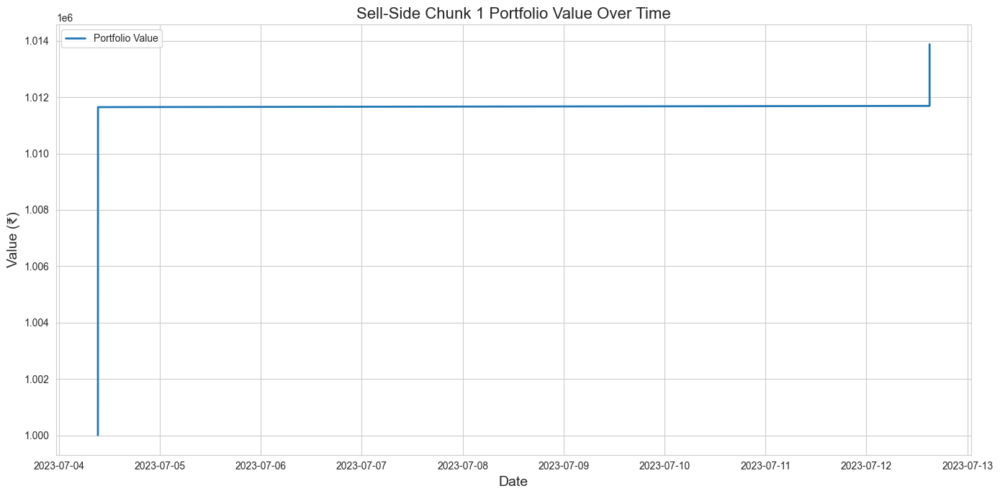

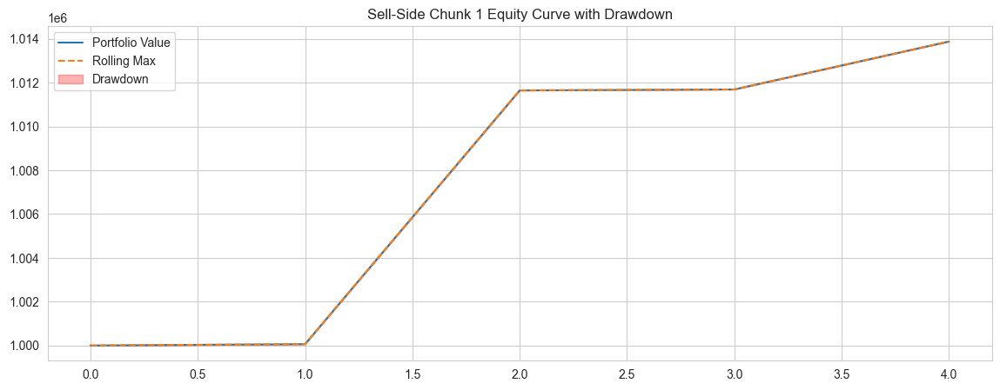

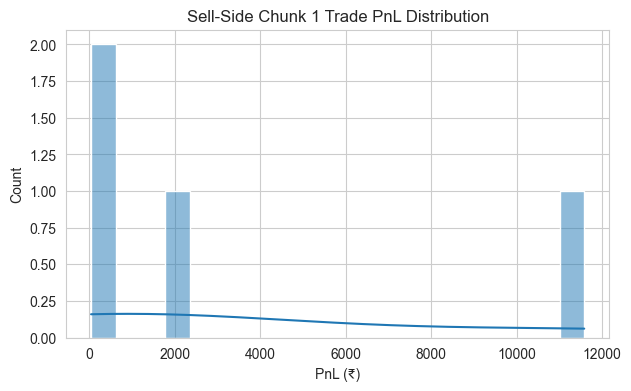

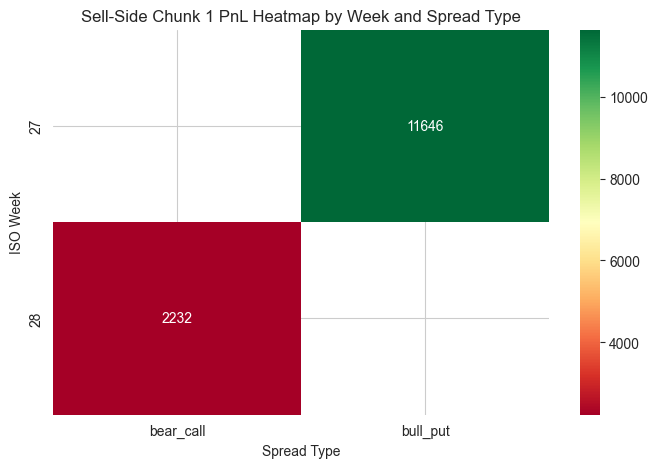

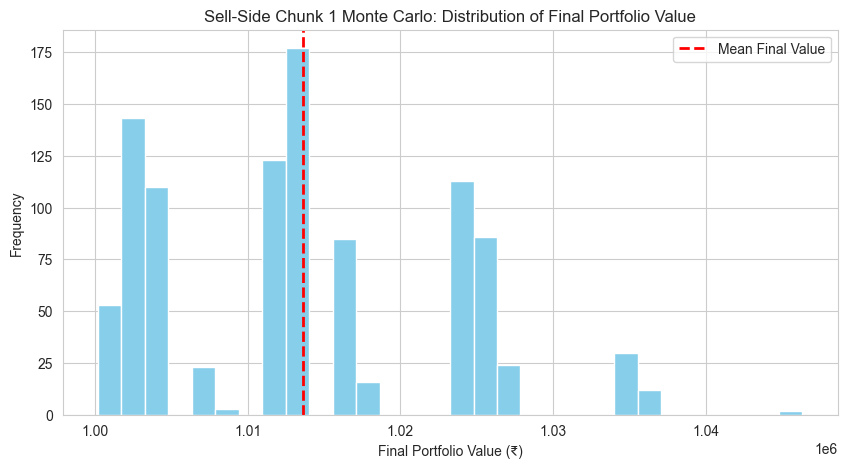

Monte Carlo: Mean Final Value = ₹1,013,627.28, 5th Percentile = ₹1,000,232.88, 95th Percentile = ₹1,027,542.25


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\3772367036.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(


Buy-side trade log saved to D:\Bits Hyderabad_Campus Diaries\PS-1\AlgoBulls\Options_Backtest_Local_Data\Buy_Side_TradeLog_Chunk_1_2023-06-01_2023-08-01.csv

Buy-Side Chunk 1 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹1,009,653.10
Total Return:       0.97%
Max Drawdown:       ₹0.00
Sharpe Ratio:       10.35
Sortino Ratio:      0.00
Calmar Ratio:       0.00

Trade Statistics:
-----------------
Total Trades:       4
Winning Trades:     4
Losing Trades:      0
Avg PnL:            ₹2,413.28
Best Trade:         ₹7,718.40
Worst Trade:        ₹53.70
Trade Period:       2023-07-04 to 2023-07-12



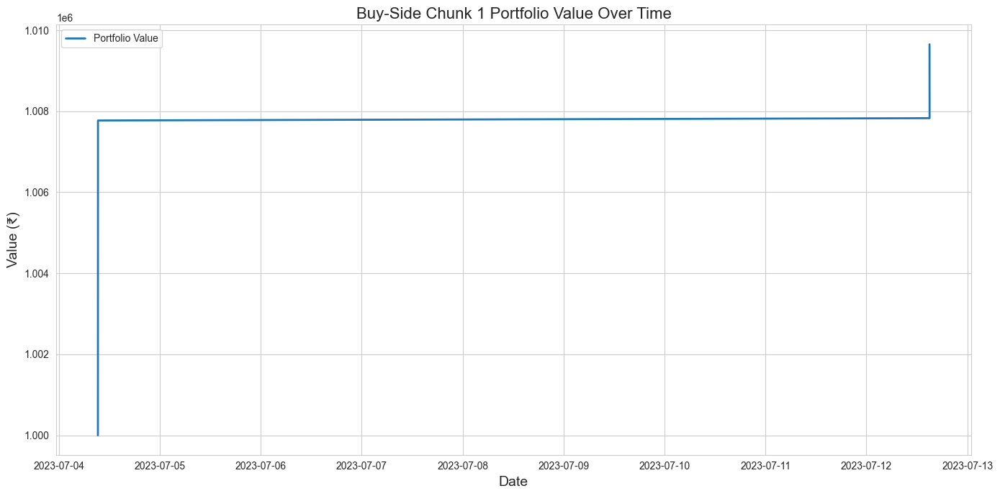

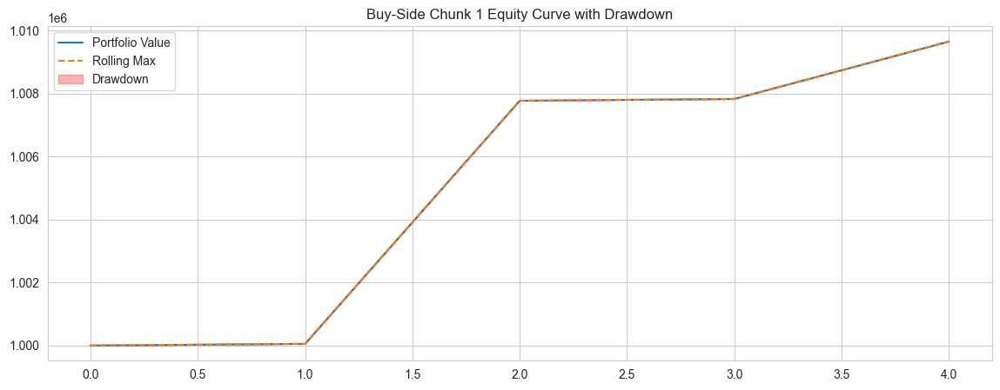

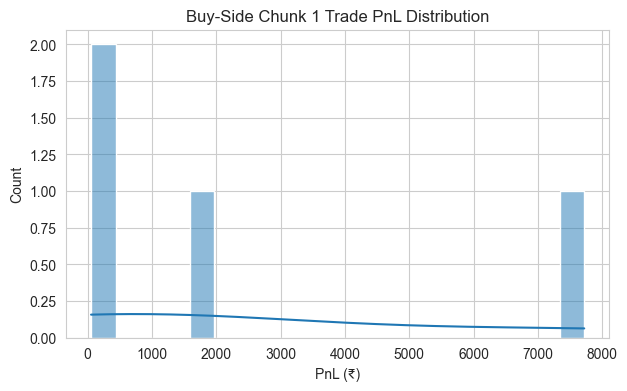

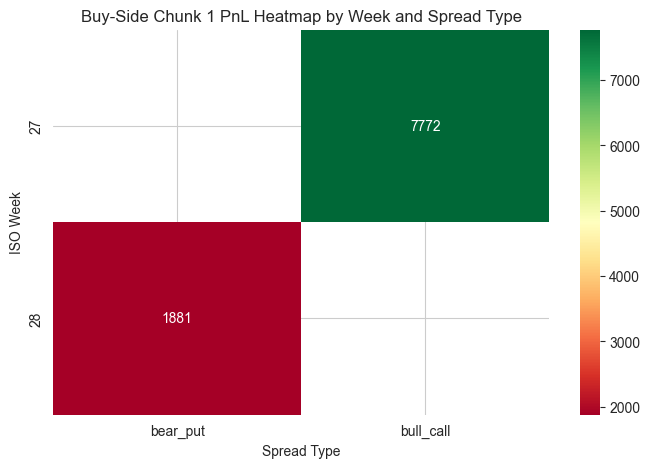

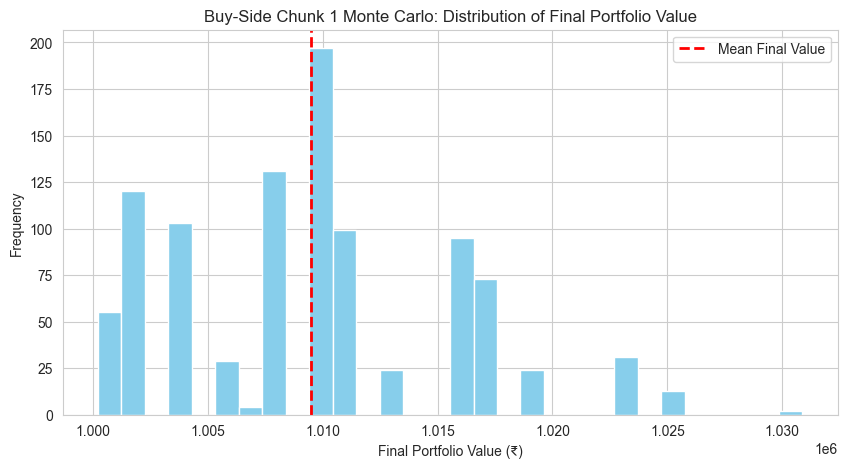

Monte Carlo: Mean Final Value = ₹1,009,514.57, 5th Percentile = ₹1,000,224.70, 95th Percentile = ₹1,019,084.80

=== Processing chunk 2: 2023-08-01 09:15:00+05:30 to 2023-10-01 09:14:00+05:30 ===


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\3772367036.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(


Sell-side trade log saved to D:\Bits Hyderabad_Campus Diaries\PS-1\AlgoBulls\Options_Backtest_Local_Data\Sell_Side_TradeLog_Chunk_2_2023-08-01_2023-10-01.csv

Sell-Side Chunk 2 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹1,007,107.77
Total Return:       0.71%
Max Drawdown:       ₹0.00
Sharpe Ratio:       8.92
Sortino Ratio:      0.00
Calmar Ratio:       0.00

Trade Statistics:
-----------------
Total Trades:       8
Winning Trades:     8
Losing Trades:      0
Avg PnL:            ₹888.47
Best Trade:         ₹4,481.95
Worst Trade:        ₹43.73
Trade Period:       2023-08-29 to 2023-09-28



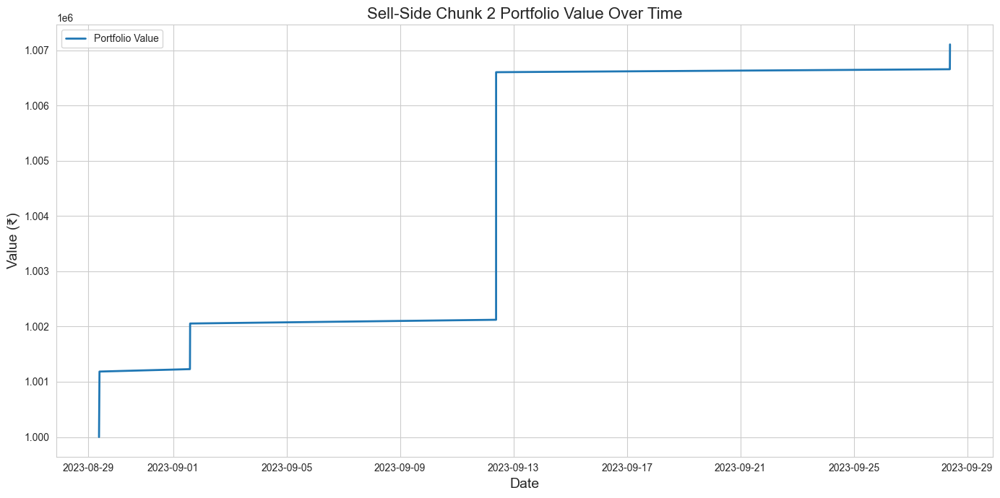

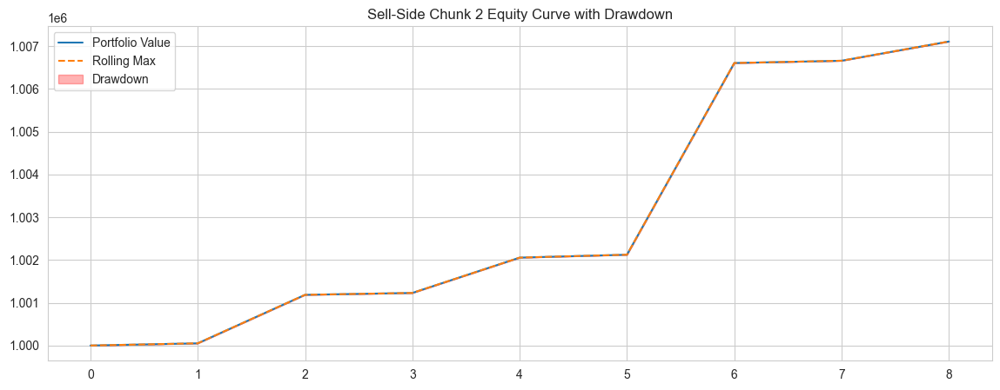

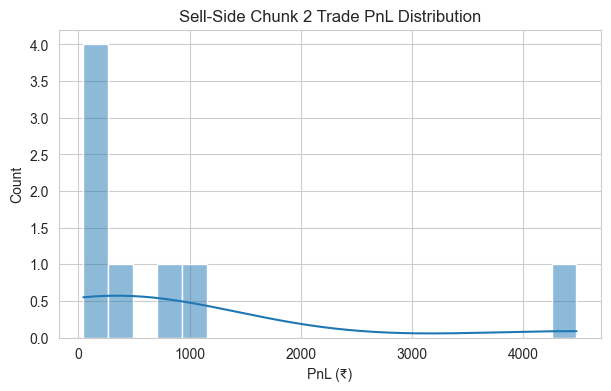

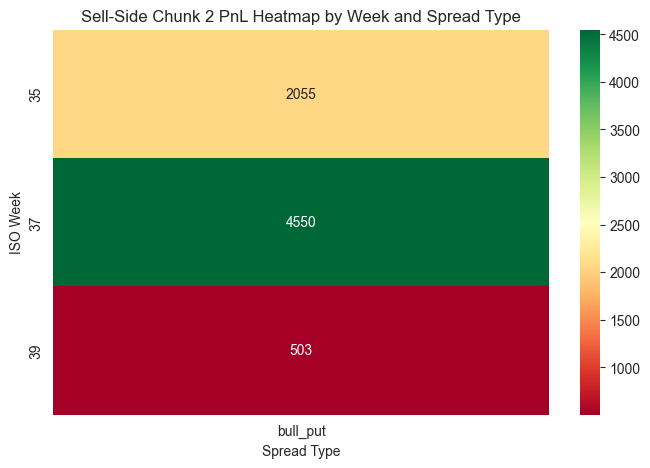

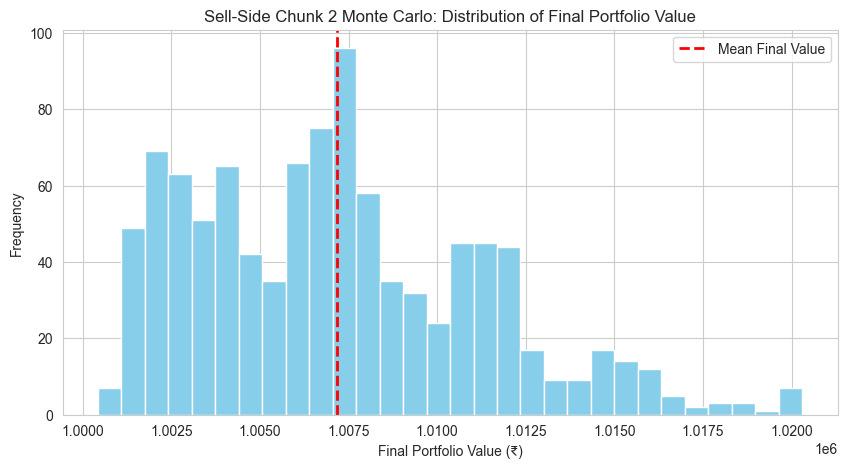

Monte Carlo: Mean Final Value = ₹1,007,165.99, 5th Percentile = ₹1,001,625.32, 95th Percentile = ₹1,014,871.15


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\3772367036.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(


Buy-side trade log saved to D:\Bits Hyderabad_Campus Diaries\PS-1\AlgoBulls\Options_Backtest_Local_Data\Buy_Side_TradeLog_Chunk_2_2023-08-01_2023-10-01.csv

Buy-Side Chunk 2 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹1,016,056.50
Total Return:       1.61%
Max Drawdown:       ₹0.00
Sharpe Ratio:       13.36
Sortino Ratio:      0.00
Calmar Ratio:       0.00

Trade Statistics:
-----------------
Total Trades:       8
Winning Trades:     8
Losing Trades:      0
Avg PnL:            ₹2,007.06
Best Trade:         ₹6,337.60
Worst Trade:        ₹50.55
Trade Period:       2023-08-29 to 2023-09-28



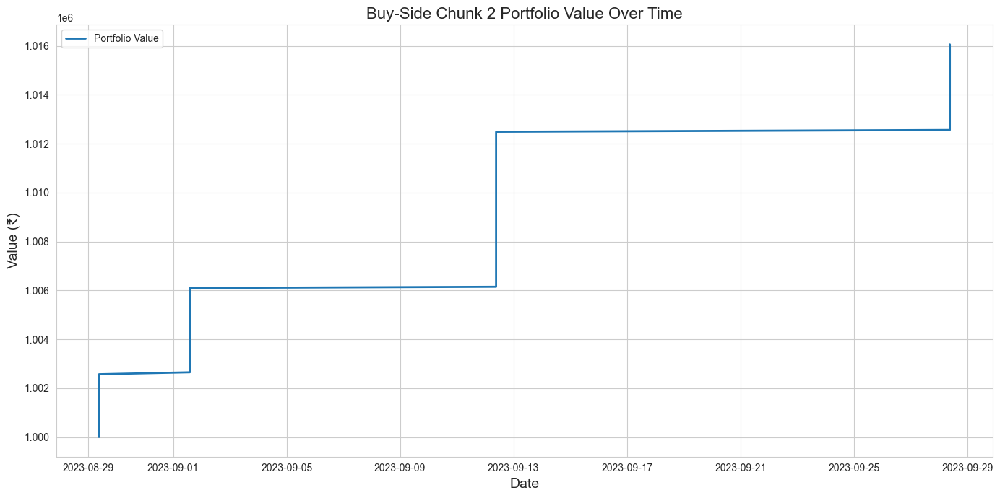

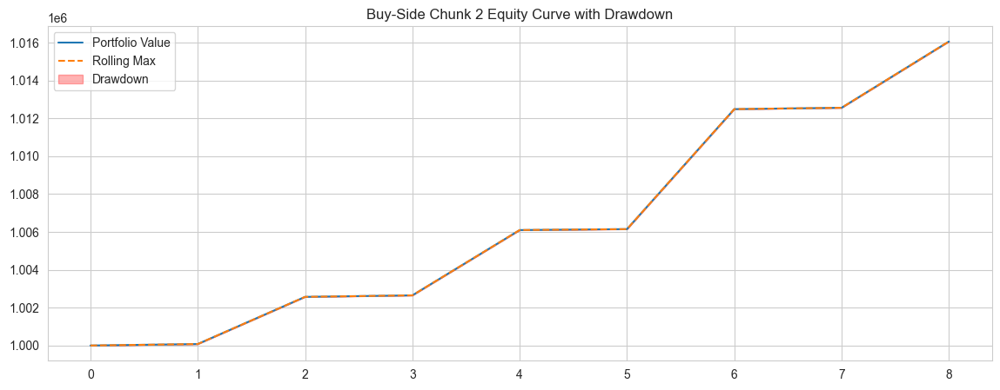

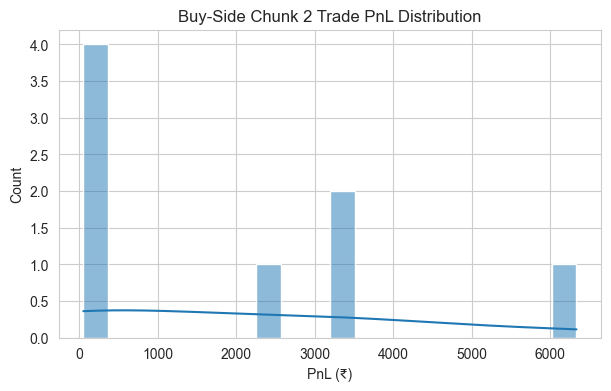

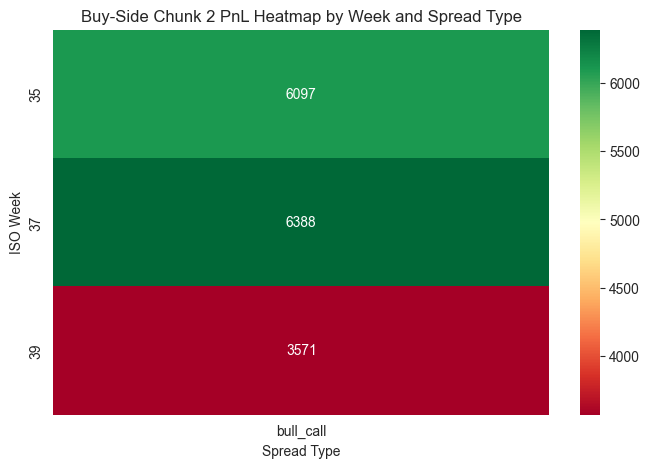

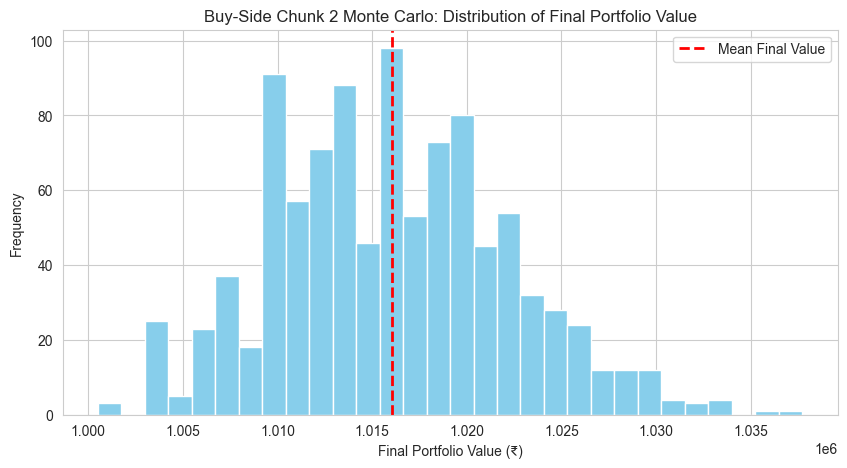

Monte Carlo: Mean Final Value = ₹1,016,041.65, 5th Percentile = ₹1,006,430.98, 95th Percentile = ₹1,026,243.02

=== Processing chunk 3: 2023-10-01 09:15:00+05:30 to 2023-12-01 09:14:00+05:30 ===


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\3772367036.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(


Sell-side trade log saved to D:\Bits Hyderabad_Campus Diaries\PS-1\AlgoBulls\Options_Backtest_Local_Data\Sell_Side_TradeLog_Chunk_3_2023-10-01_2023-12-01.csv

Sell-Side Chunk 3 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹982,000.00
Total Return:       -1.80%
Max Drawdown:       ₹18,000.00
Sharpe Ratio:       0.00
Sortino Ratio:      0.00
Calmar Ratio:       -49.92

Trade Statistics:
-----------------
Total Trades:       1
Winning Trades:     0
Losing Trades:      1
Avg PnL:            ₹-18,000.00
Best Trade:         ₹-18,000.00
Worst Trade:        ₹-18,000.00
Trade Period:       2023-10-31 to 2023-10-31



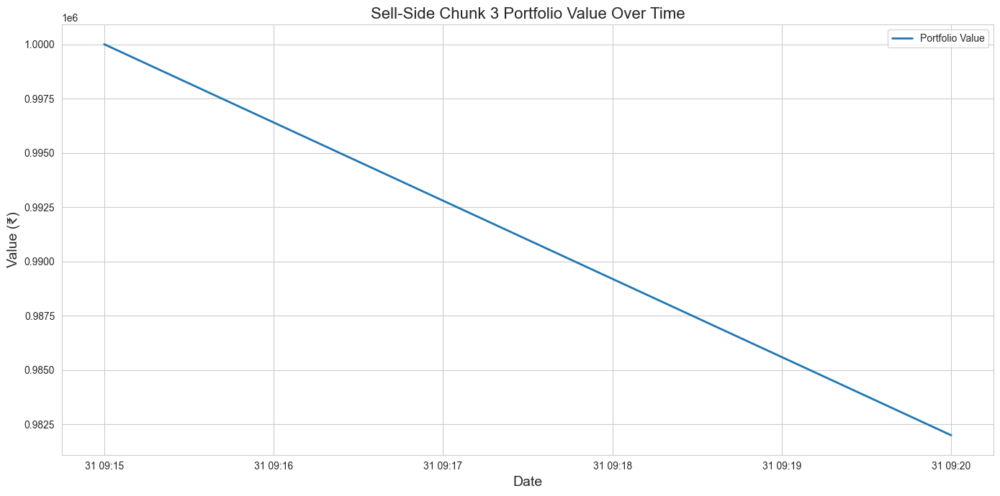

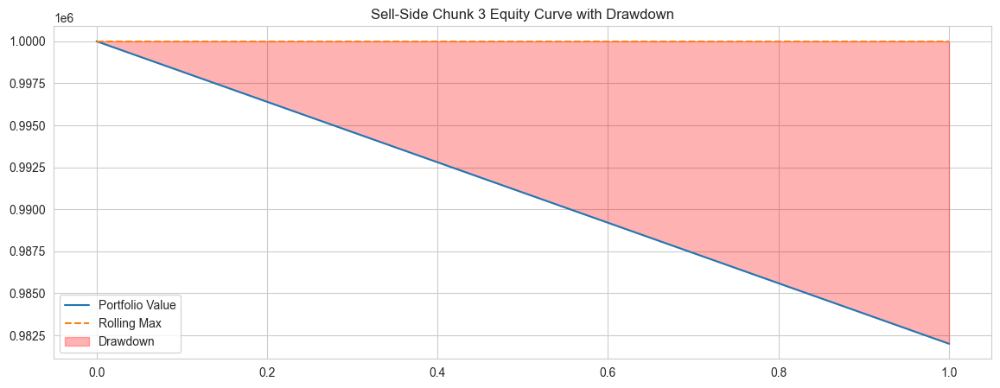

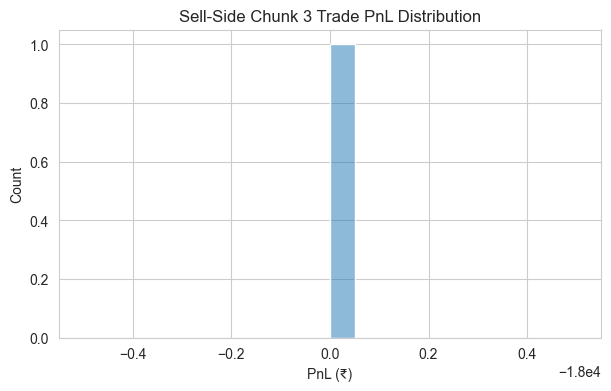

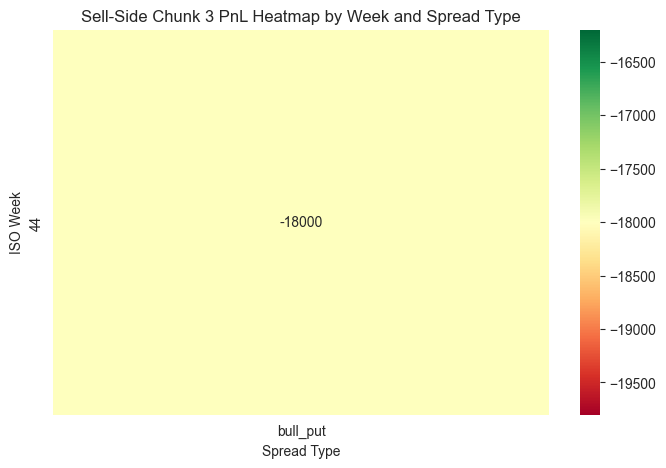

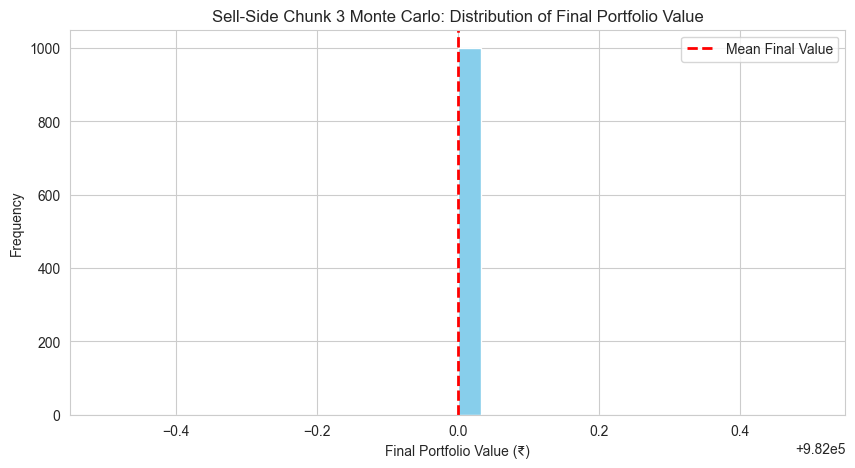

Monte Carlo: Mean Final Value = ₹982,000.00, 5th Percentile = ₹982,000.00, 95th Percentile = ₹982,000.00


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\3772367036.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(


Buy-side trade log saved to D:\Bits Hyderabad_Campus Diaries\PS-1\AlgoBulls\Options_Backtest_Local_Data\Buy_Side_TradeLog_Chunk_3_2023-10-01_2023-12-01.csv

Buy-Side Chunk 3 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹982,000.00
Total Return:       -1.80%
Max Drawdown:       ₹18,000.00
Sharpe Ratio:       0.00
Sortino Ratio:      0.00
Calmar Ratio:       -49.92

Trade Statistics:
-----------------
Total Trades:       1
Winning Trades:     0
Losing Trades:      1
Avg PnL:            ₹-18,000.00
Best Trade:         ₹-18,000.00
Worst Trade:        ₹-18,000.00
Trade Period:       2023-10-31 to 2023-10-31



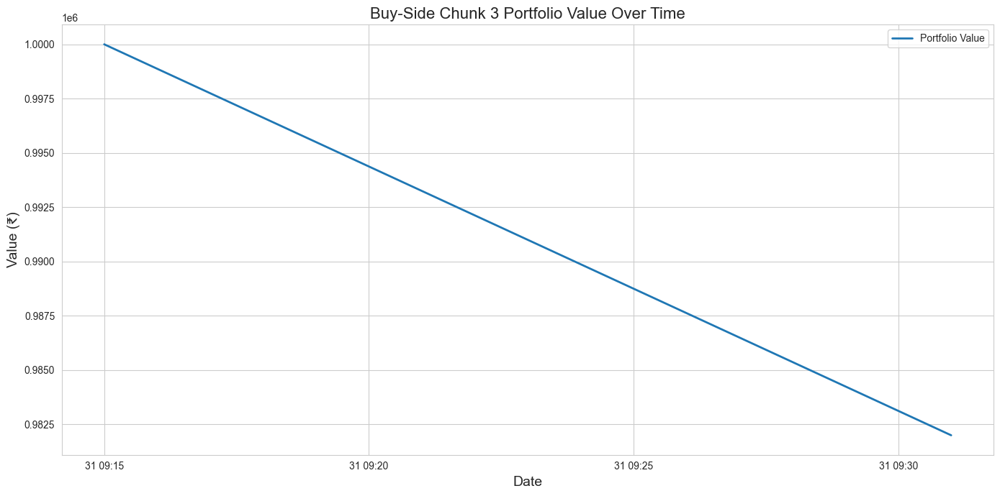

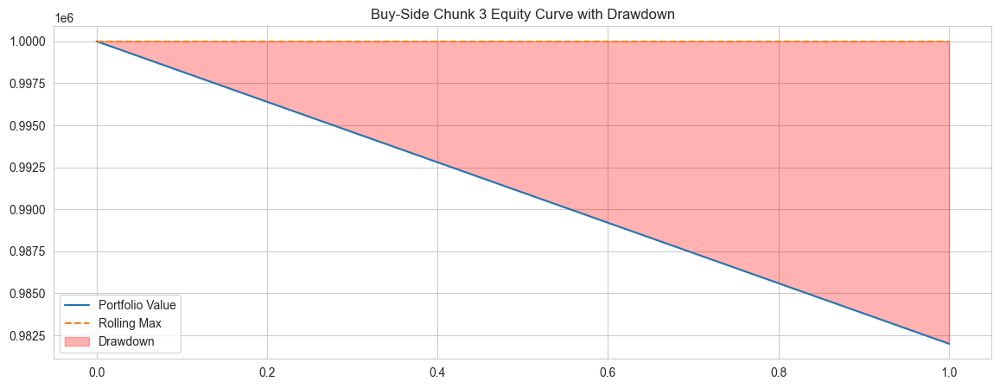

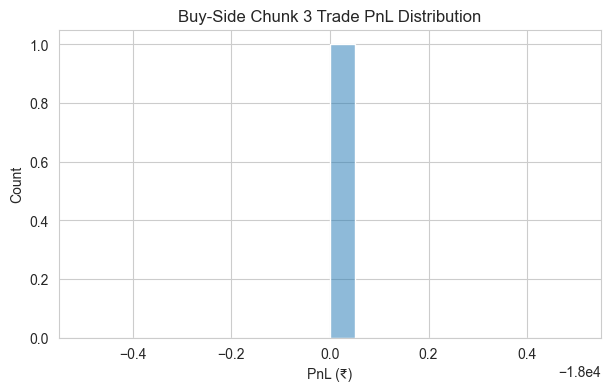

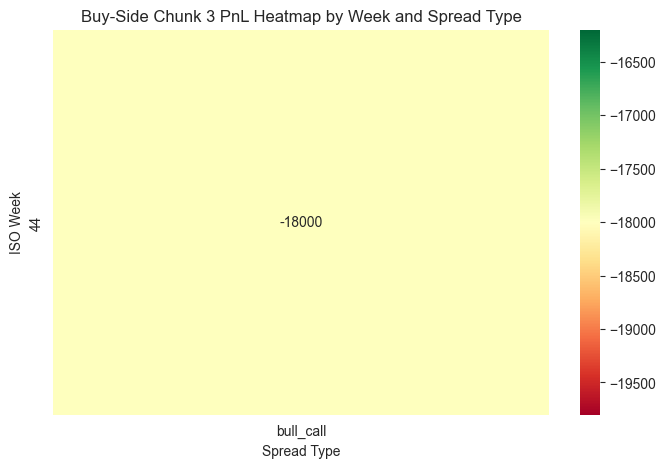

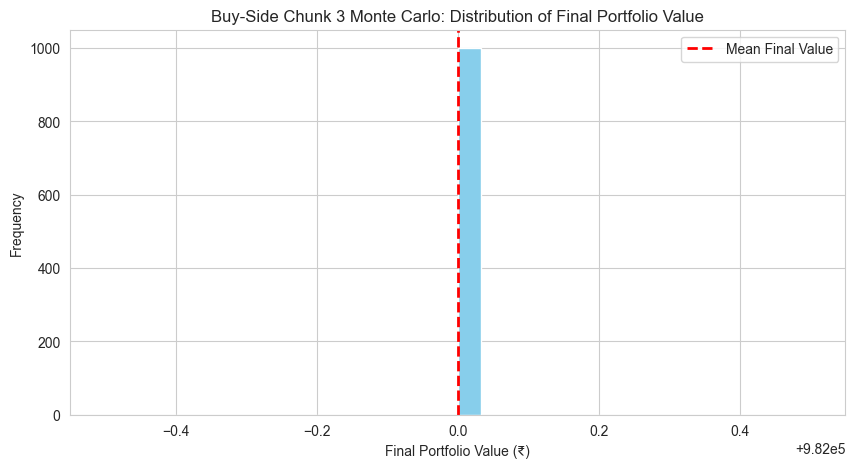

Monte Carlo: Mean Final Value = ₹982,000.00, 5th Percentile = ₹982,000.00, 95th Percentile = ₹982,000.00

=== Processing chunk 4: 2023-12-01 09:15:00+05:30 to 2024-02-01 09:14:00+05:30 ===


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\3772367036.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(


Sell-side trade log saved to D:\Bits Hyderabad_Campus Diaries\PS-1\AlgoBulls\Options_Backtest_Local_Data\Sell_Side_TradeLog_Chunk_4_2023-12-01_2024-02-01.csv

Sell-Side Chunk 4 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹984,392.55
Total Return:       -1.56%
Max Drawdown:       ₹17,984.37
Sharpe Ratio:       -5.16
Sortino Ratio:      0.00
Calmar Ratio:       -21.73

Trade Statistics:
-----------------
Total Trades:       7
Winning Trades:     6
Losing Trades:      1
Avg PnL:            ₹-2,229.64
Best Trade:         ₹1,438.20
Worst Trade:        ₹-18,000.00
Trade Period:       2023-12-27 to 2024-01-25



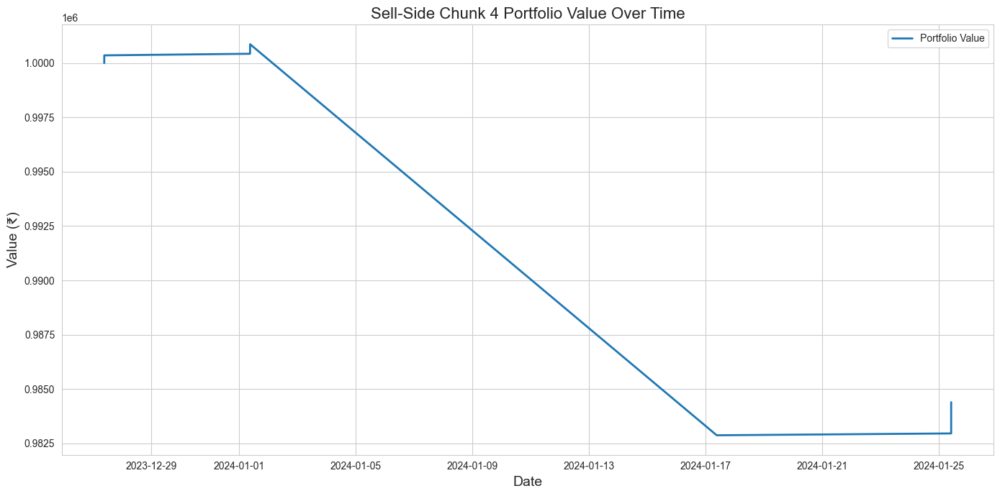

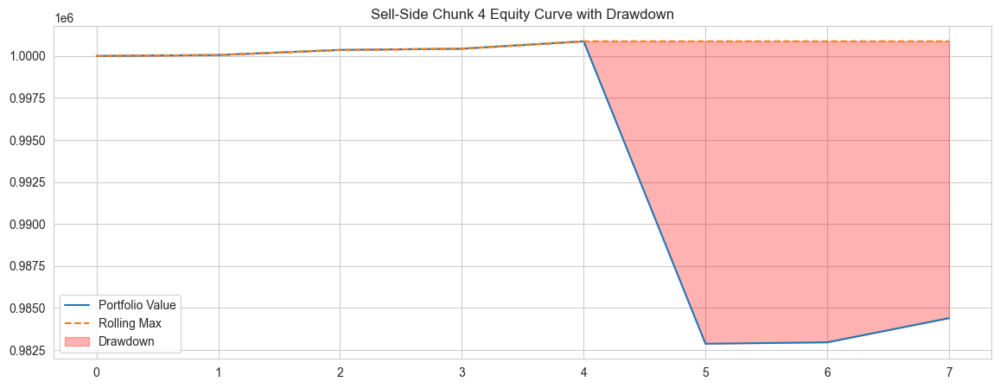

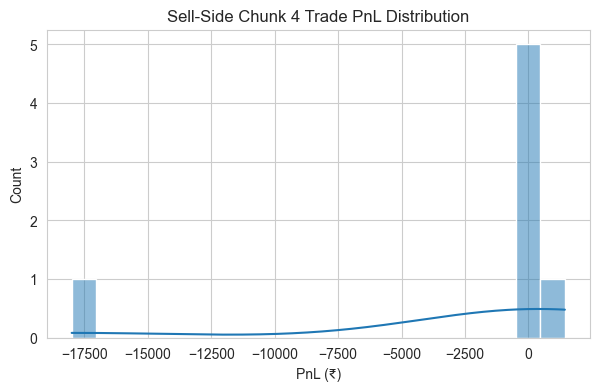

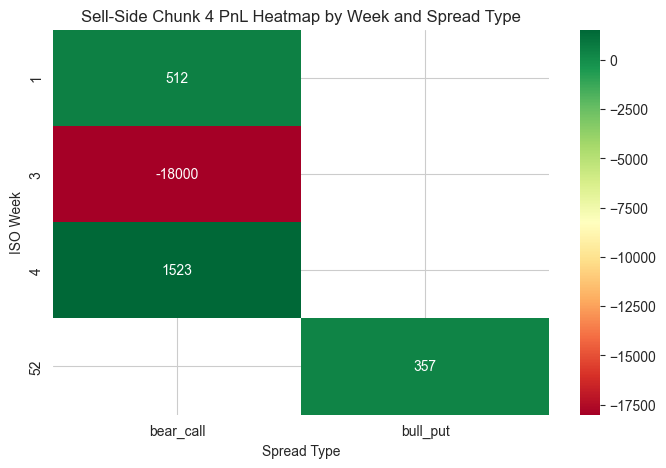

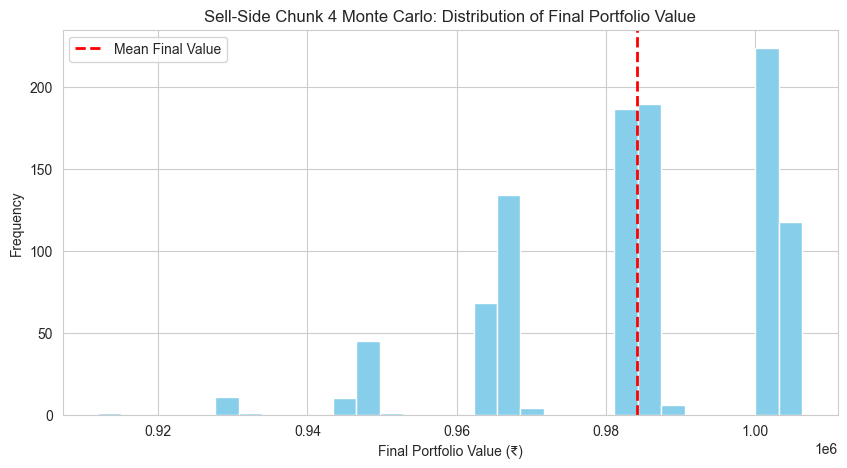

Monte Carlo: Mean Final Value = ₹984,127.15, 5th Percentile = ₹947,661.69, 95th Percentile = ₹1,004,184.35


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\3772367036.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(


Buy-side trade log saved to D:\Bits Hyderabad_Campus Diaries\PS-1\AlgoBulls\Options_Backtest_Local_Data\Buy_Side_TradeLog_Chunk_4_2023-12-01_2024-02-01.csv

Buy-Side Chunk 4 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹988,425.75
Total Return:       -1.16%
Max Drawdown:       ₹17,900.81
Sharpe Ratio:       -3.31
Sortino Ratio:      0.00
Calmar Ratio:       -14.20

Trade Statistics:
-----------------
Total Trades:       9
Winning Trades:     8
Losing Trades:      1
Avg PnL:            ₹-1,286.03
Best Trade:         ₹2,884.80
Worst Trade:        ₹-18,000.00
Trade Period:       2023-12-22 to 2024-01-25



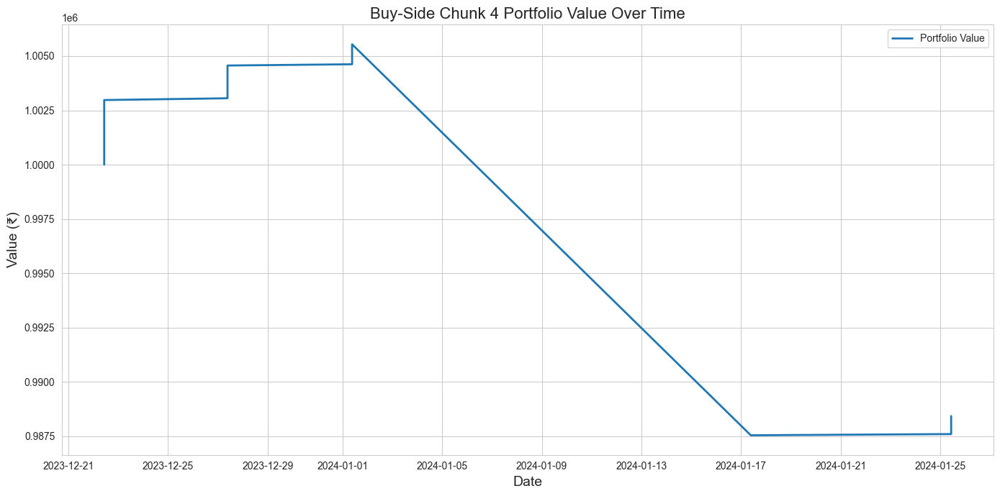

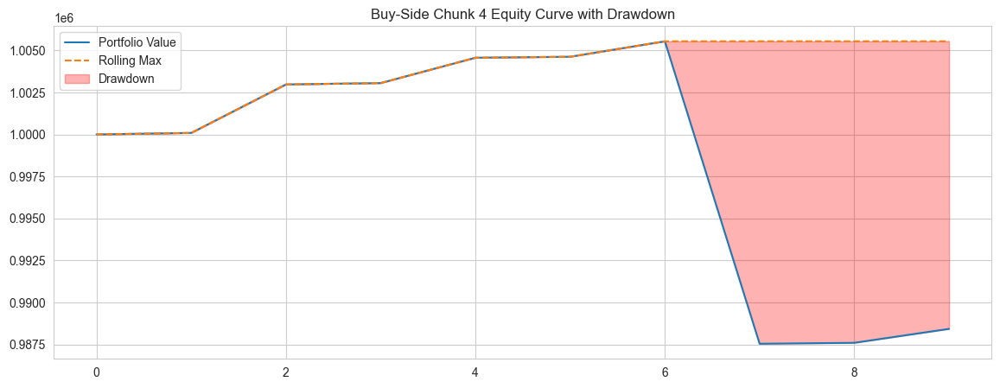

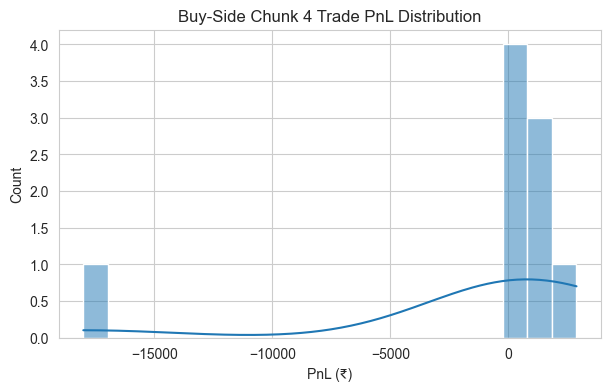

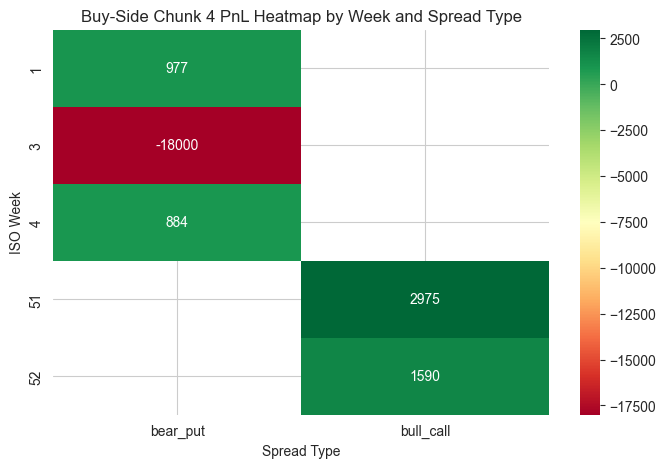

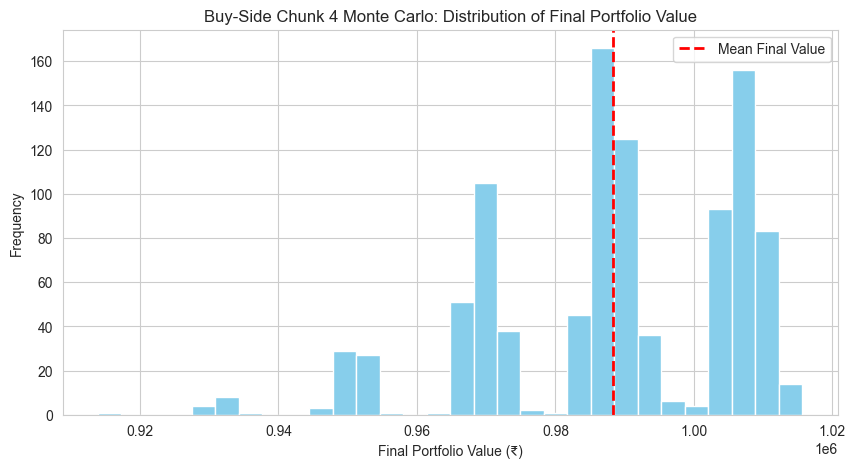

Monte Carlo: Mean Final Value = ₹988,287.41, 5th Percentile = ₹951,555.20, 95th Percentile = ₹1,010,209.73

=== Processing chunk 5: 2024-02-01 09:15:00+05:30 to 2024-04-01 09:14:00+05:30 ===


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\3772367036.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(


Sell-side trade log saved to D:\Bits Hyderabad_Campus Diaries\PS-1\AlgoBulls\Options_Backtest_Local_Data\Sell_Side_TradeLog_Chunk_5_2024-02-01_2024-04-01.csv

Sell-Side Chunk 5 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹1,018,675.12
Total Return:       1.87%
Max Drawdown:       ₹0.00
Sharpe Ratio:       10.09
Sortino Ratio:      0.00
Calmar Ratio:       0.00

Trade Statistics:
-----------------
Total Trades:       8
Winning Trades:     6
Losing Trades:      2
Avg PnL:            ₹2,334.39
Best Trade:         ₹8,667.00
Worst Trade:        ₹0.00
Trade Period:       2024-02-08 to 2024-03-07



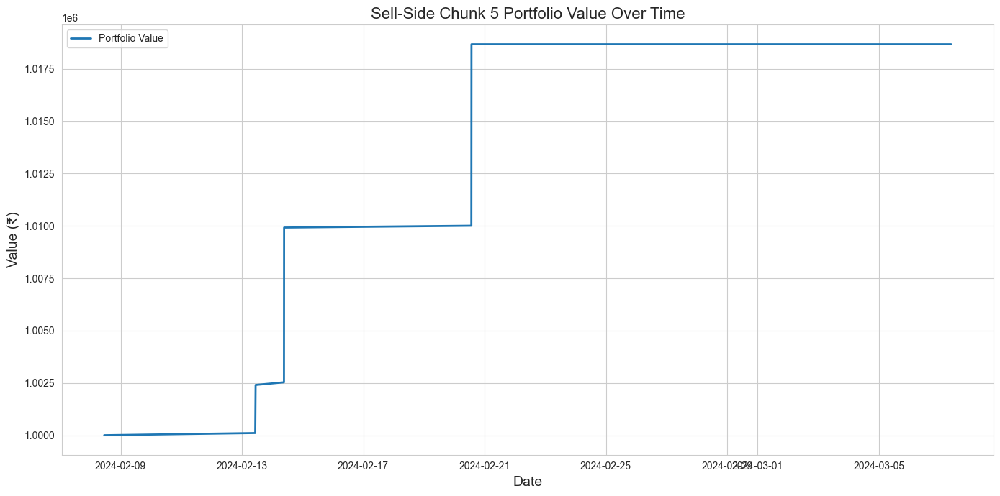

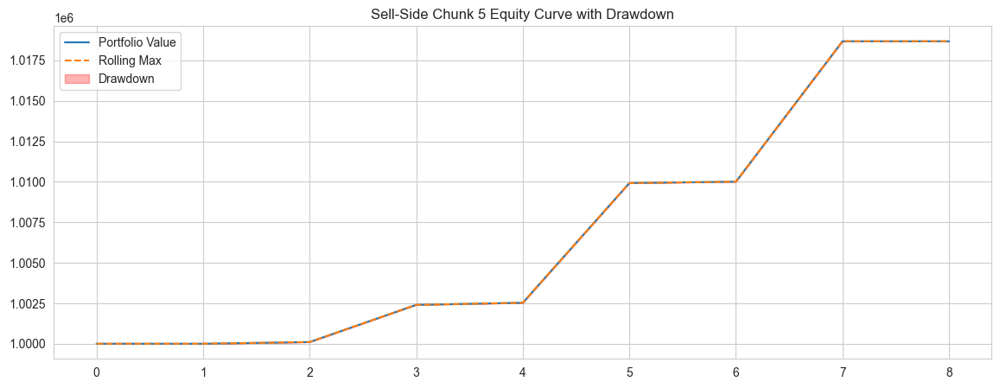

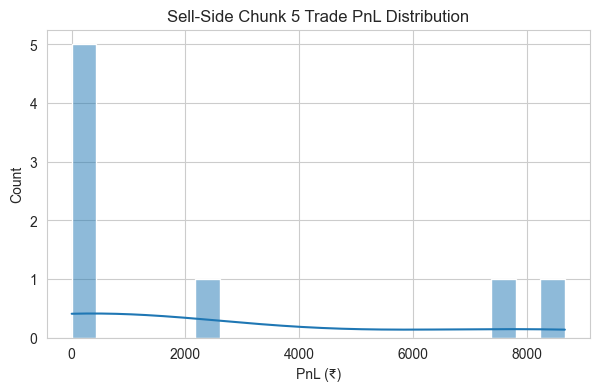

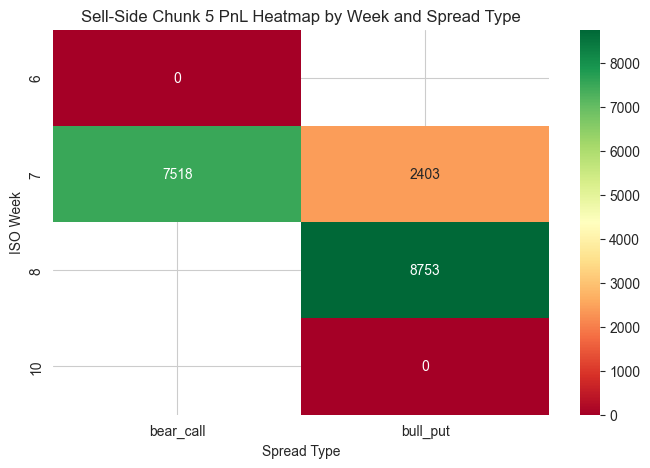

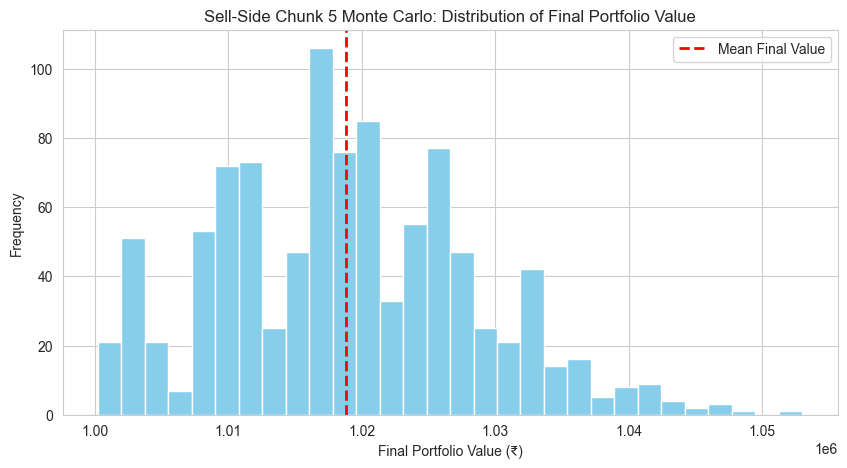

Monte Carlo: Mean Final Value = ₹1,018,810.65, 5th Percentile = ₹1,002,767.10, 95th Percentile = ₹1,034,904.78


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\3772367036.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(


Buy-side trade log saved to D:\Bits Hyderabad_Campus Diaries\PS-1\AlgoBulls\Options_Backtest_Local_Data\Buy_Side_TradeLog_Chunk_5_2024-02-01_2024-04-01.csv

Buy-Side Chunk 5 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹1,012,982.00
Total Return:       1.30%
Max Drawdown:       ₹0.00
Sharpe Ratio:       7.82
Sortino Ratio:      0.00
Calmar Ratio:       0.00

Trade Statistics:
-----------------
Total Trades:       8
Winning Trades:     6
Losing Trades:      2
Avg PnL:            ₹1,622.75
Best Trade:         ₹9,384.00
Worst Trade:        ₹0.00
Trade Period:       2024-02-08 to 2024-03-07



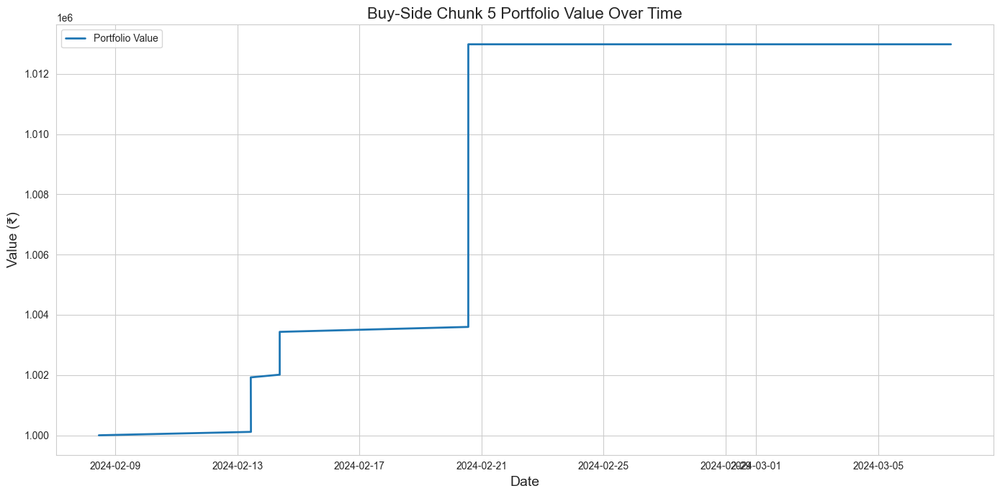

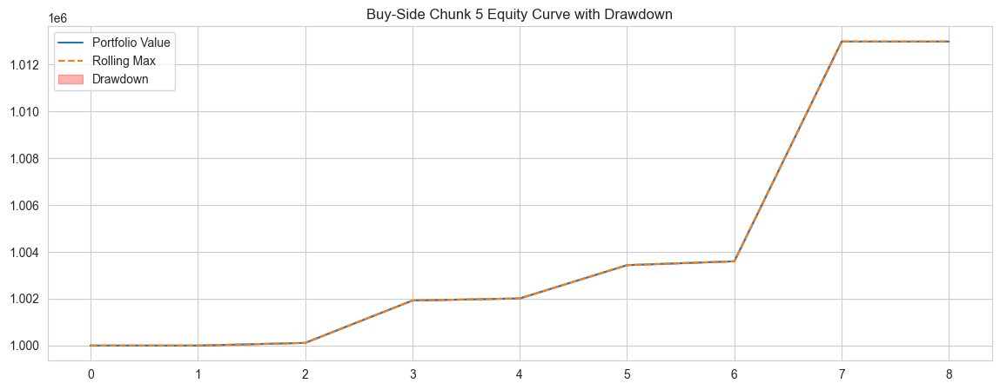

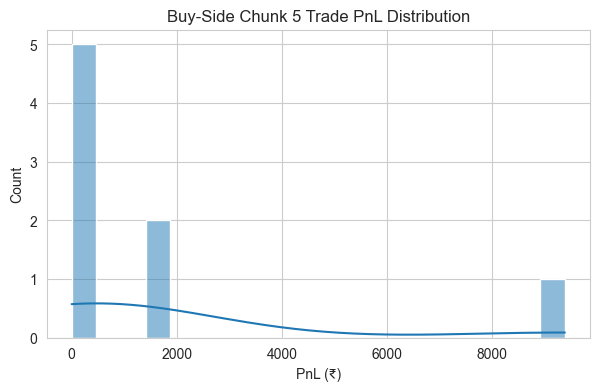

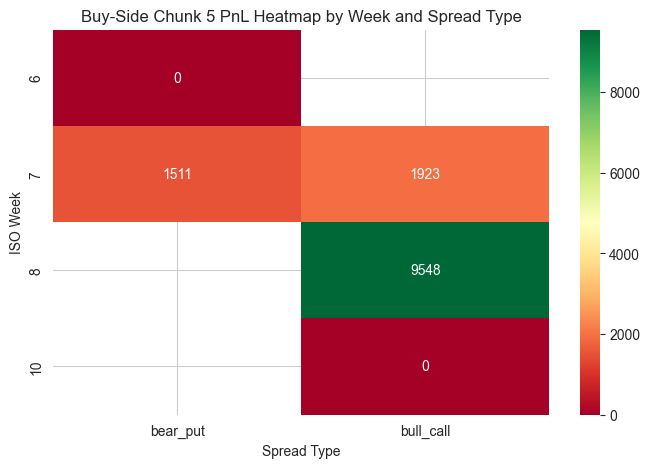

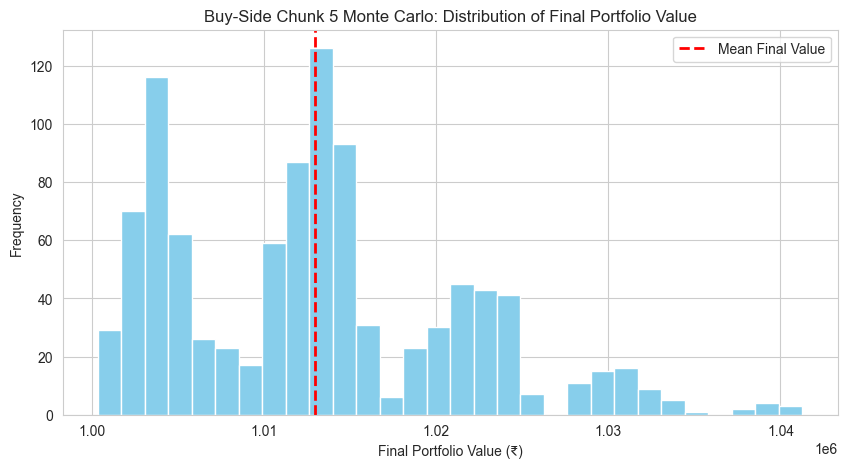

Monte Carlo: Mean Final Value = ₹1,012,988.81, 5th Percentile = ₹1,002,030.21, 95th Percentile = ₹1,029,854.36

=== Processing chunk 6: 2024-04-01 09:15:00+05:30 to 2024-06-01 09:14:00+05:30 ===


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\3772367036.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(


Sell-side trade log saved to D:\Bits Hyderabad_Campus Diaries\PS-1\AlgoBulls\Options_Backtest_Local_Data\Sell_Side_TradeLog_Chunk_6_2024-04-01_2024-06-01.csv

Sell-Side Chunk 6 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹1,045,871.15
Total Return:       4.59%
Max Drawdown:       ₹0.00
Sharpe Ratio:       8.11
Sortino Ratio:      0.00
Calmar Ratio:       0.00

Trade Statistics:
-----------------
Total Trades:       8
Winning Trades:     8
Losing Trades:      0
Avg PnL:            ₹5,733.89
Best Trade:         ₹32,900.00
Worst Trade:        ₹54.15
Trade Period:       2024-04-03 to 2024-05-16



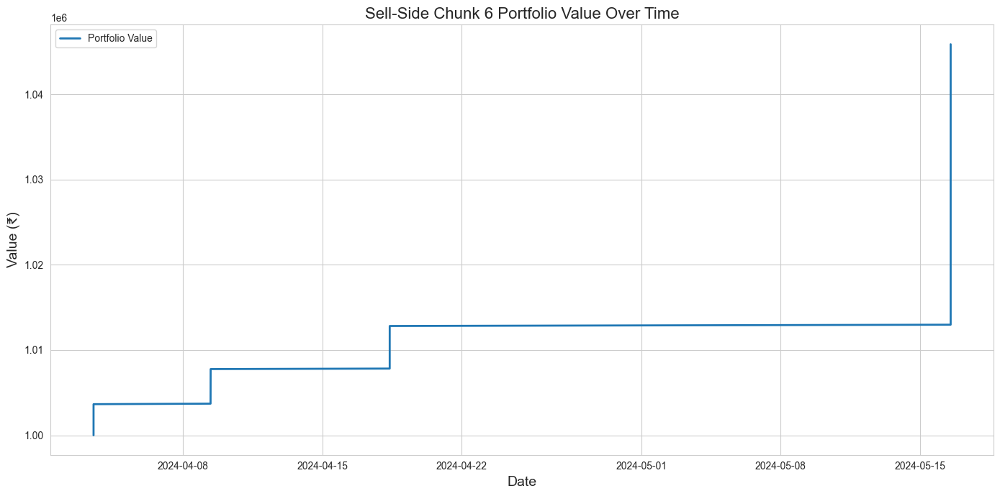

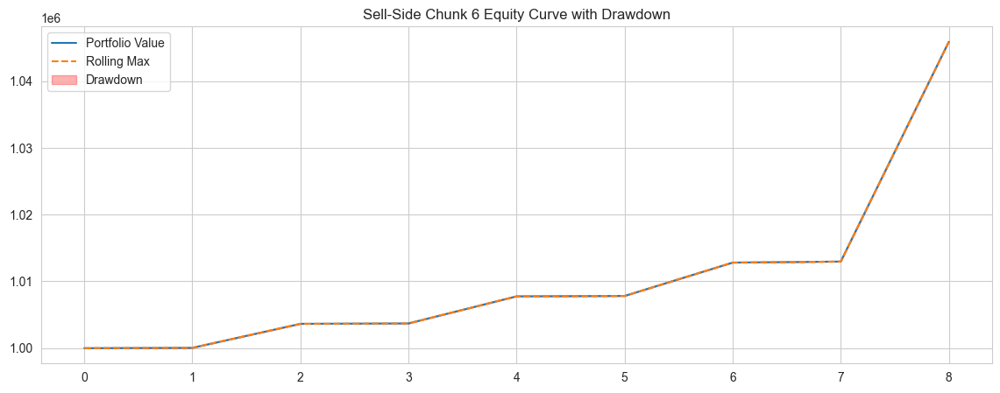

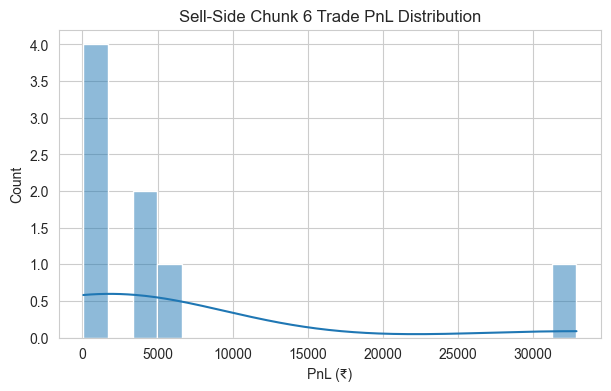

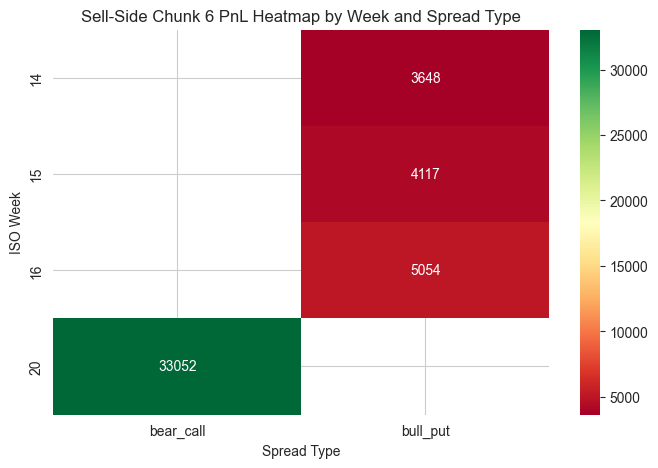

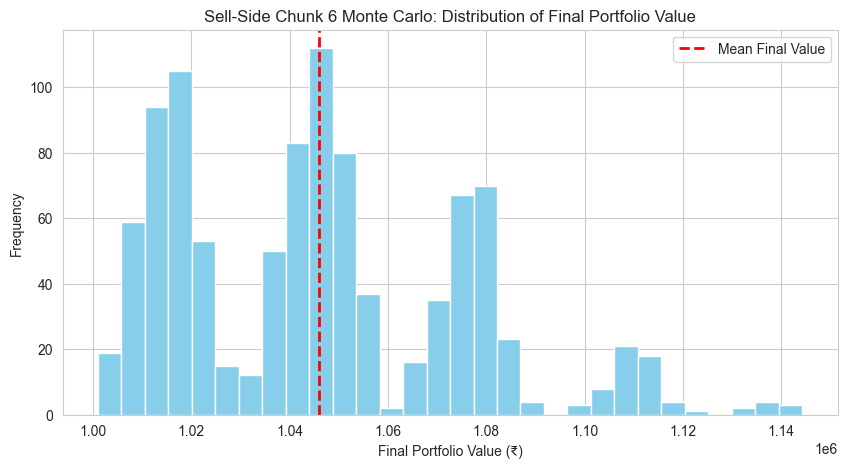

Monte Carlo: Mean Final Value = ₹1,045,996.16, 5th Percentile = ₹1,008,941.60, 95th Percentile = ₹1,106,267.86


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\3772367036.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(


Buy-side trade log saved to D:\Bits Hyderabad_Campus Diaries\PS-1\AlgoBulls\Options_Backtest_Local_Data\Buy_Side_TradeLog_Chunk_6_2024-04-01_2024-06-01.csv

Buy-Side Chunk 6 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹1,052,278.80
Total Return:       5.23%
Max Drawdown:       ₹0.00
Sharpe Ratio:       7.12
Sortino Ratio:      0.00
Calmar Ratio:       0.00

Trade Statistics:
-----------------
Total Trades:       8
Winning Trades:     8
Losing Trades:      0
Avg PnL:            ₹6,534.85
Best Trade:         ₹42,052.00
Worst Trade:        ₹48.25
Trade Period:       2024-04-03 to 2024-05-16



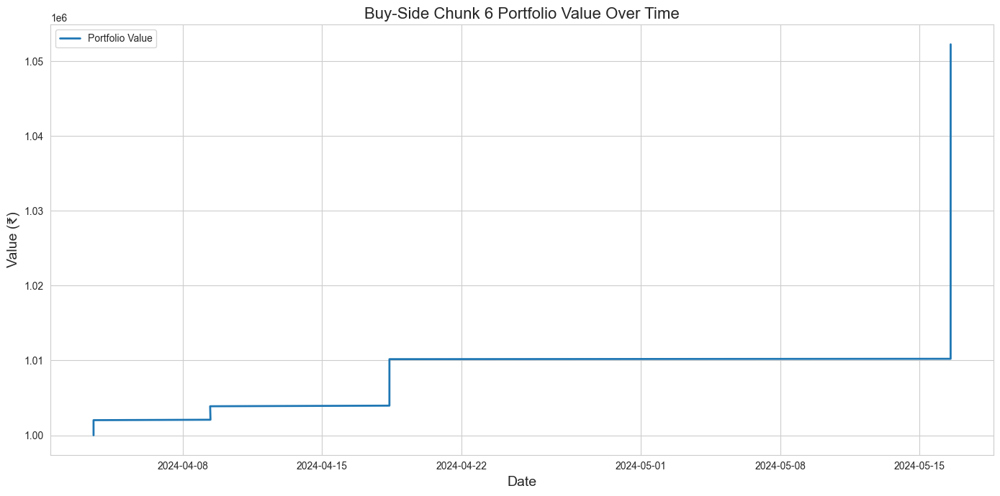

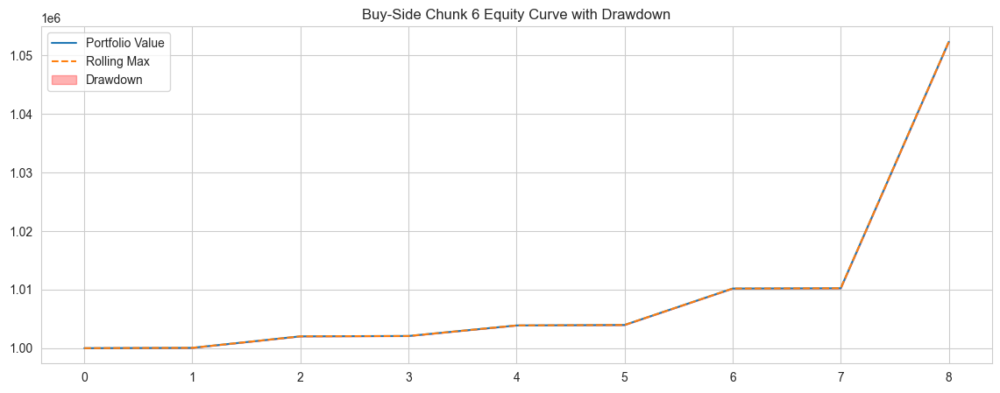

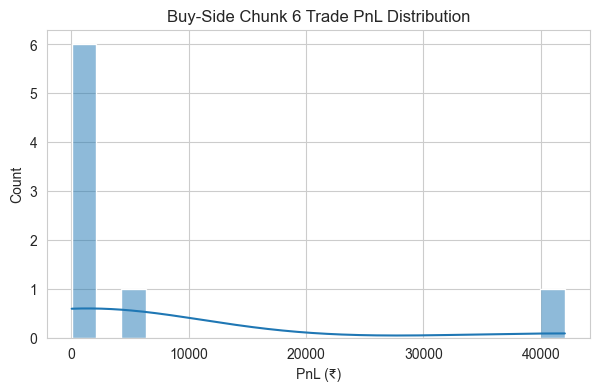

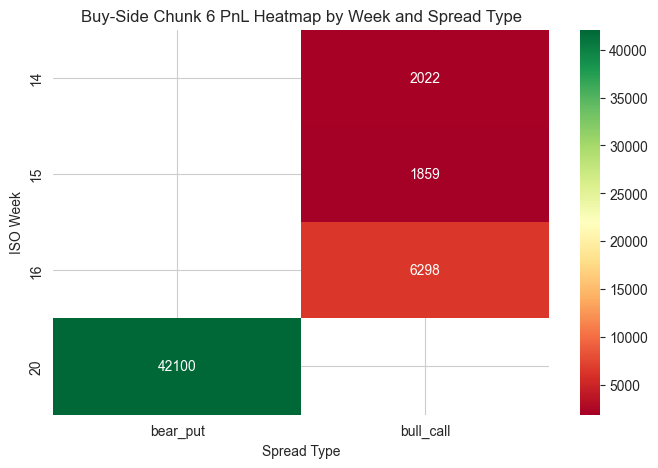

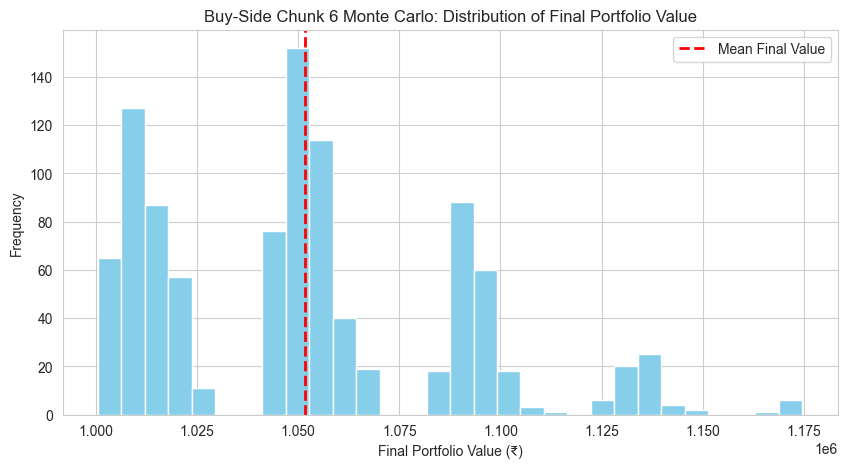

Monte Carlo: Mean Final Value = ₹1,051,633.86, 5th Percentile = ₹1,005,741.25, 95th Percentile = ₹1,130,120.84

=== Processing chunk 7: 2024-06-01 09:15:00+05:30 to 2024-08-01 09:14:00+05:30 ===


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\3772367036.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(


Sell-side trade log saved to D:\Bits Hyderabad_Campus Diaries\PS-1\AlgoBulls\Options_Backtest_Local_Data\Sell_Side_TradeLog_Chunk_7_2024-06-01_2024-08-01.csv

Sell-Side Chunk 7 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹1,000,653.10
Total Return:       0.07%
Max Drawdown:       ₹0.00
Sharpe Ratio:       12.02
Sortino Ratio:      0.00
Calmar Ratio:       0.00

Trade Statistics:
-----------------
Total Trades:       2
Winning Trades:     2
Losing Trades:      0
Avg PnL:            ₹326.55
Best Trade:         ₹594.38
Worst Trade:        ₹58.73
Trade Period:       2024-06-25 to 2024-06-25



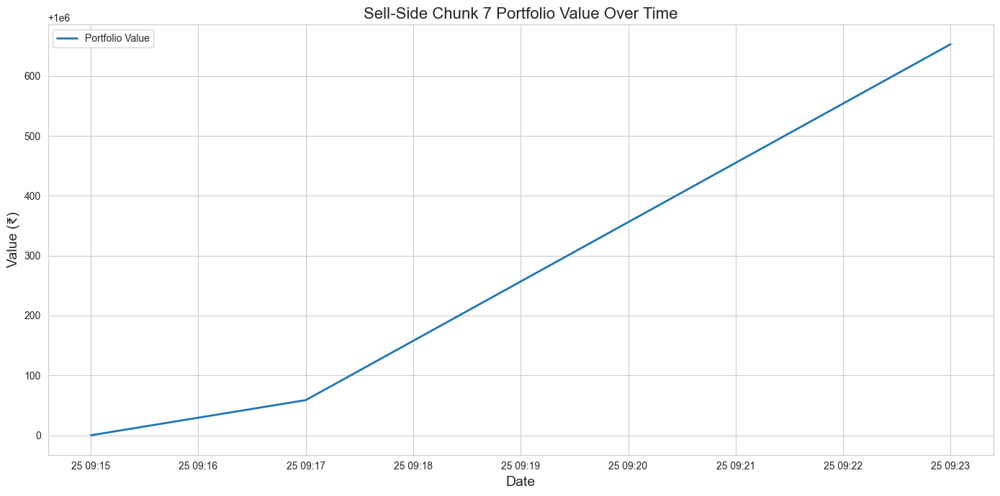

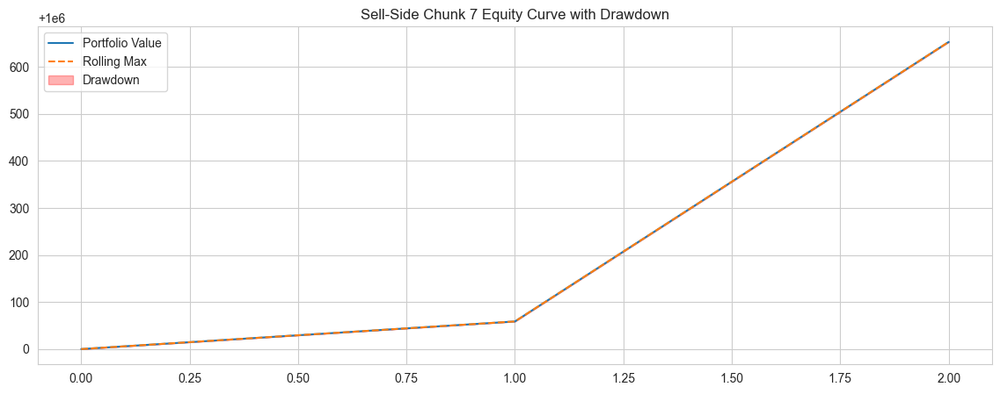

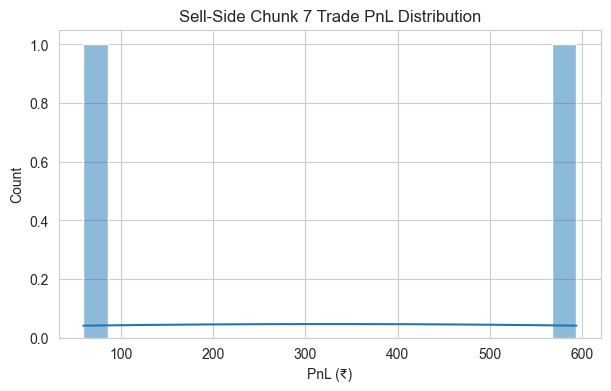

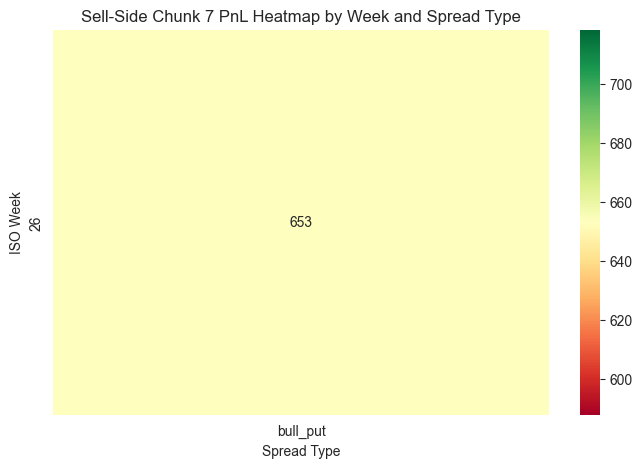

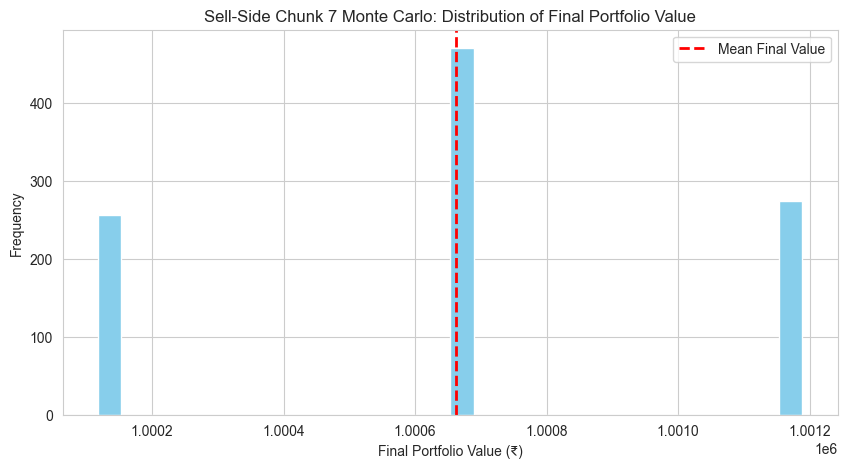

Monte Carlo: Mean Final Value = ₹1,000,662.74, 5th Percentile = ₹1,000,117.45, 95th Percentile = ₹1,001,188.75


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\3772367036.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(


Buy-side trade log saved to D:\Bits Hyderabad_Campus Diaries\PS-1\AlgoBulls\Options_Backtest_Local_Data\Buy_Side_TradeLog_Chunk_7_2024-06-01_2024-08-01.csv

Buy-Side Chunk 7 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹1,001,923.45
Total Return:       0.19%
Max Drawdown:       ₹0.00
Sharpe Ratio:       11.71
Sortino Ratio:      0.00
Calmar Ratio:       0.00

Trade Statistics:
-----------------
Total Trades:       2
Winning Trades:     2
Losing Trades:      0
Avg PnL:            ₹961.72
Best Trade:         ₹1,845.60
Worst Trade:        ₹77.85
Trade Period:       2024-06-25 to 2024-06-25



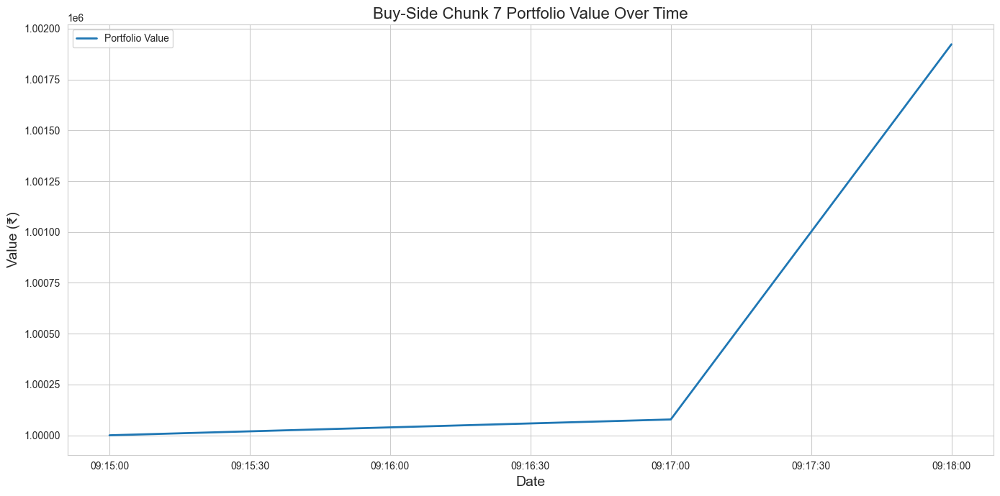

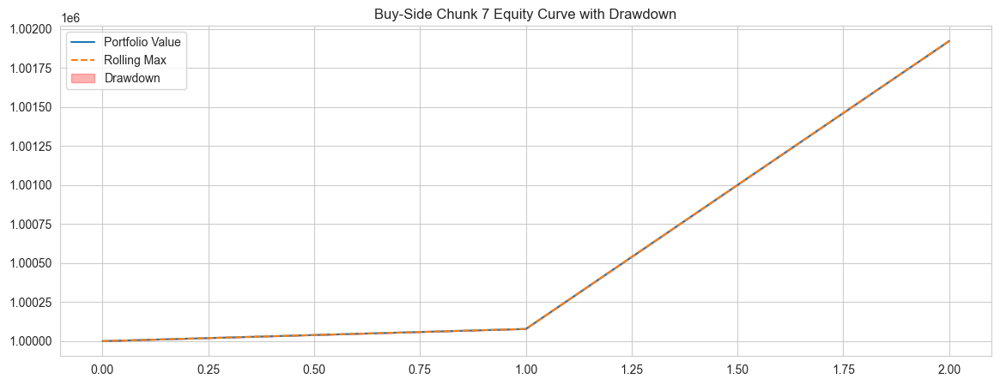

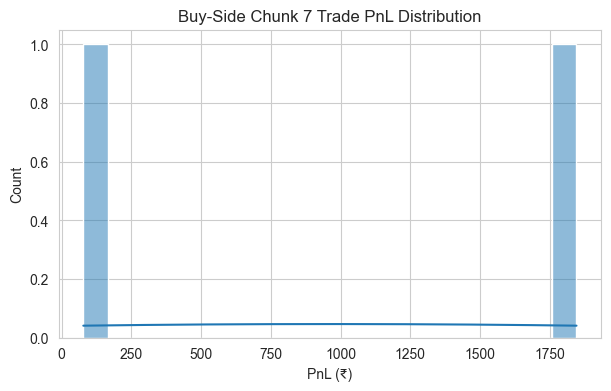

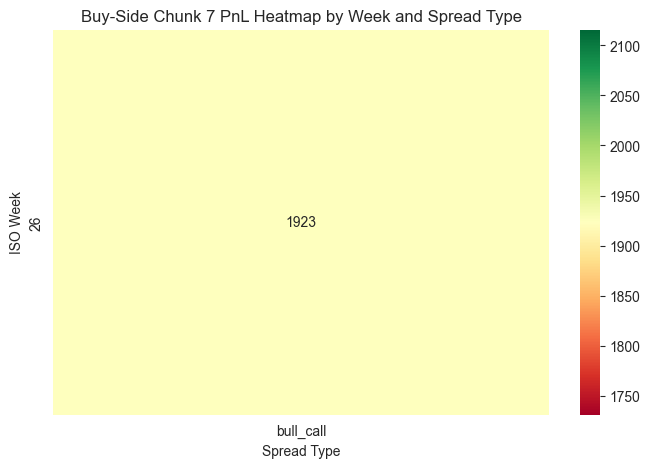

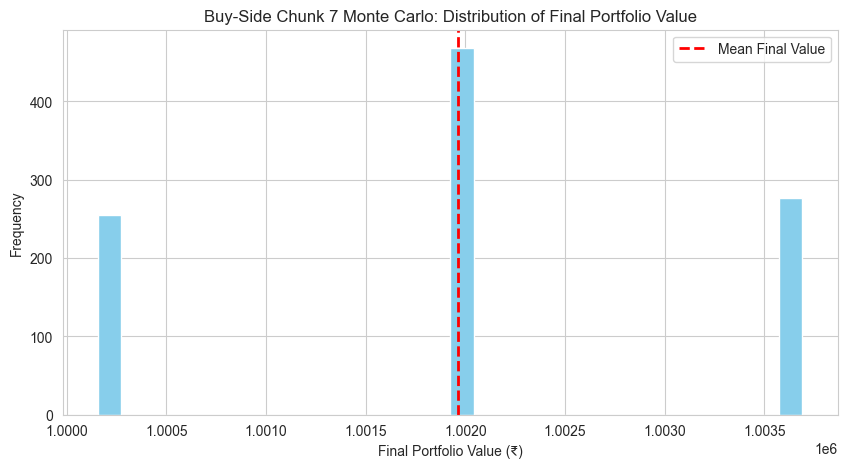

Monte Carlo: Mean Final Value = ₹1,001,962.34, 5th Percentile = ₹1,000,155.70, 95th Percentile = ₹1,003,691.20

=== Processing chunk 8: 2024-08-01 09:15:00+05:30 to 2024-10-01 09:14:00+05:30 ===


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\3772367036.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(


Sell-side trade log saved to D:\Bits Hyderabad_Campus Diaries\PS-1\AlgoBulls\Options_Backtest_Local_Data\Sell_Side_TradeLog_Chunk_8_2024-08-01_2024-10-01.csv

Sell-Side Chunk 8 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹1,002,623.43
Total Return:       0.26%
Max Drawdown:       ₹0.00
Sharpe Ratio:       9.05
Sortino Ratio:      0.00
Calmar Ratio:       0.00

Trade Statistics:
-----------------
Total Trades:       10
Winning Trades:     6
Losing Trades:      4
Avg PnL:            ₹262.34
Best Trade:         ₹1,014.75
Worst Trade:        ₹0.00
Trade Period:       2024-08-08 to 2024-09-17



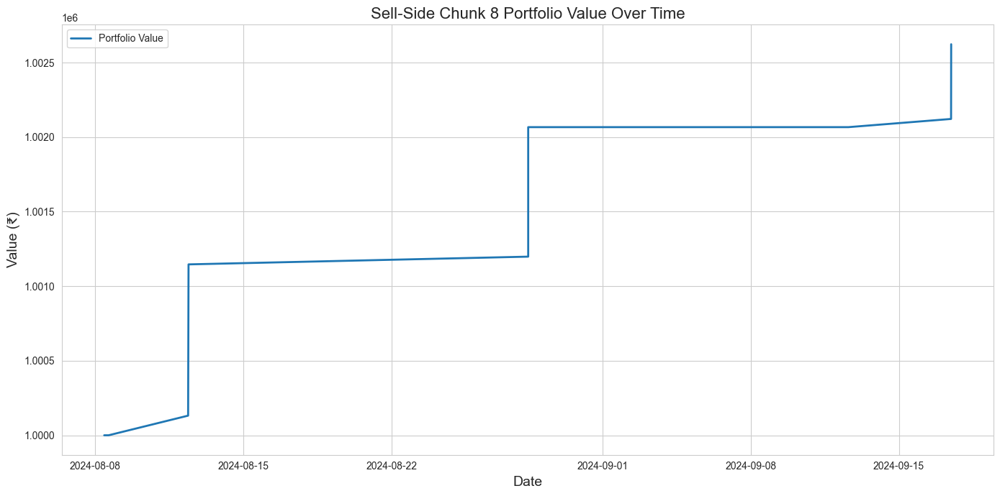

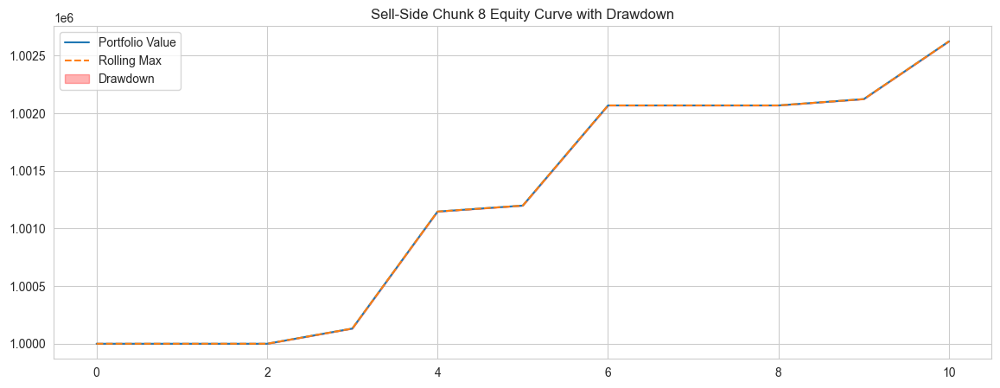

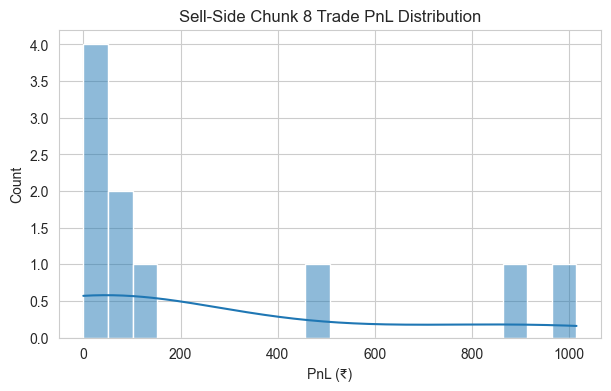

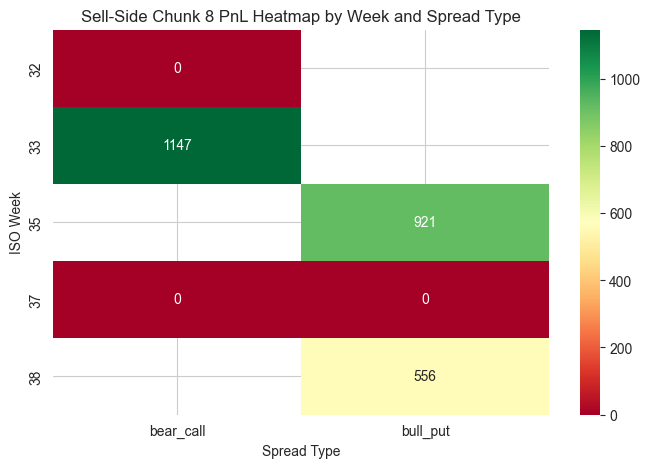

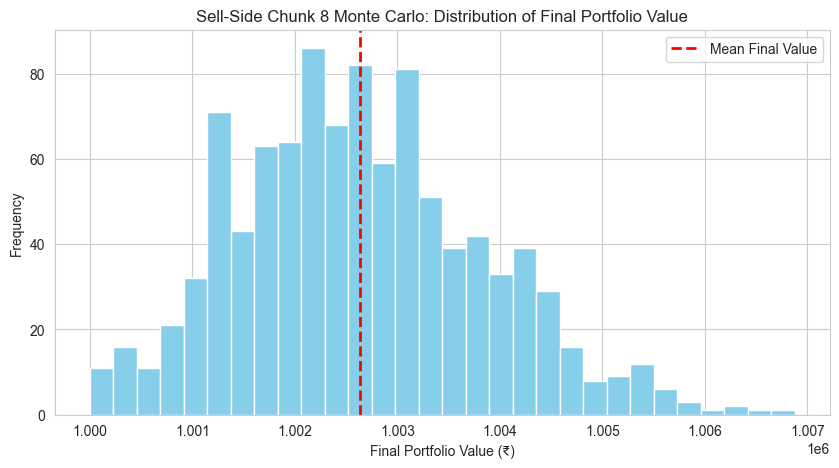

Monte Carlo: Mean Final Value = ₹1,002,636.30, 5th Percentile = ₹1,000,819.72, 95th Percentile = ₹1,004,613.78


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\3772367036.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(


Buy-side trade log saved to D:\Bits Hyderabad_Campus Diaries\PS-1\AlgoBulls\Options_Backtest_Local_Data\Buy_Side_TradeLog_Chunk_8_2024-08-01_2024-10-01.csv

Buy-Side Chunk 8 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹1,006,809.72
Total Return:       0.68%
Max Drawdown:       ₹0.00
Sharpe Ratio:       9.24
Sortino Ratio:      0.00
Calmar Ratio:       0.00

Trade Statistics:
-----------------
Total Trades:       10
Winning Trades:     6
Losing Trades:      4
Avg PnL:            ₹680.97
Best Trade:         ₹2,690.40
Worst Trade:        ₹0.00
Trade Period:       2024-08-08 to 2024-09-17



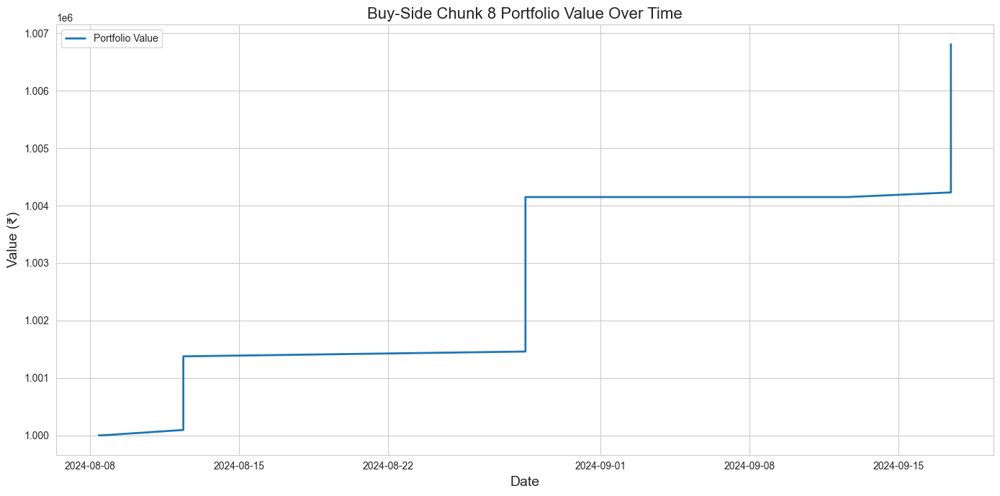

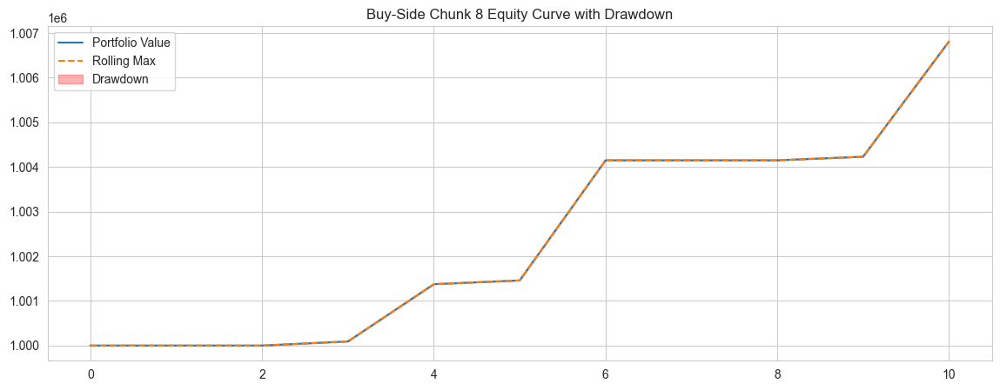

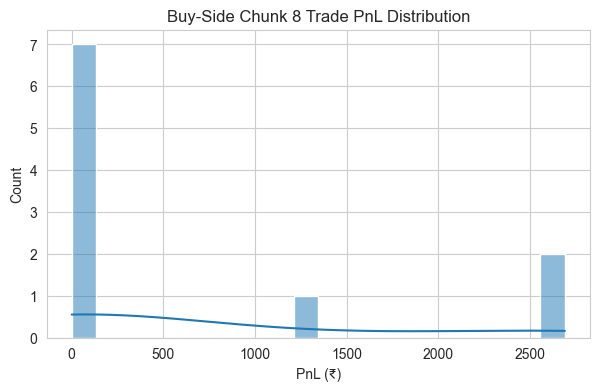

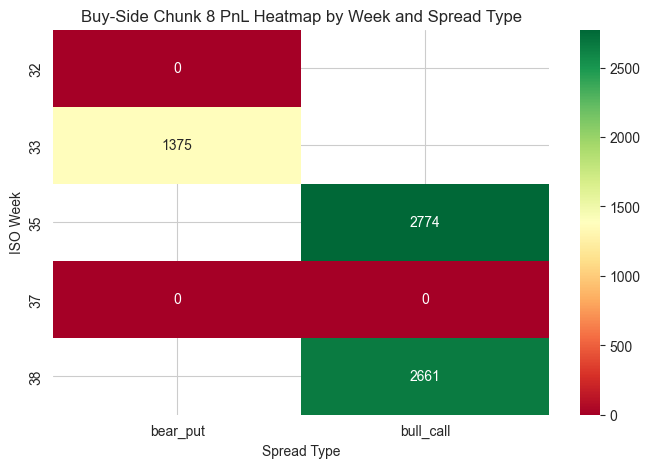

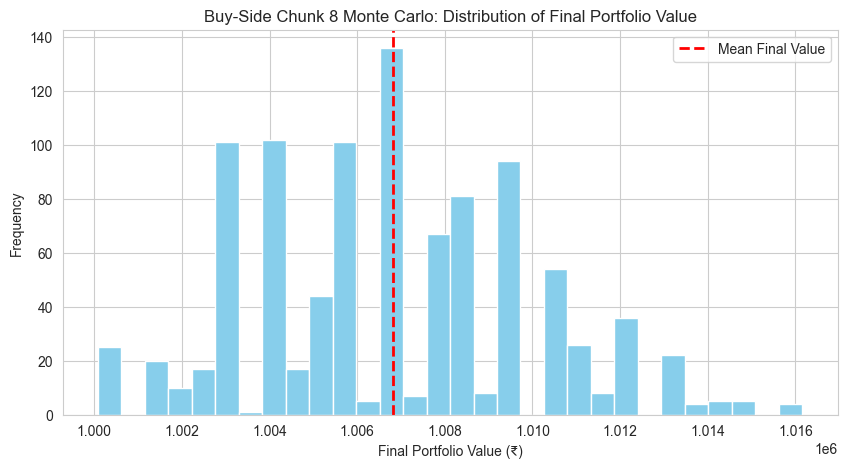

Monte Carlo: Mean Final Value = ₹1,006,813.69, 5th Percentile = ₹1,001,724.32, 95th Percentile = ₹1,012,094.62

=== Processing chunk 9: 2024-10-01 09:15:00+05:30 to 2024-12-01 09:14:00+05:30 ===


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\3772367036.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(


Sell-side trade log saved to D:\Bits Hyderabad_Campus Diaries\PS-1\AlgoBulls\Options_Backtest_Local_Data\Sell_Side_TradeLog_Chunk_9_2024-10-01_2024-12-01.csv

Sell-Side Chunk 9 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹1,002,517.50
Total Return:       0.25%
Max Drawdown:       ₹0.00
Sharpe Ratio:       12.25
Sortino Ratio:      0.00
Calmar Ratio:       0.00

Trade Statistics:
-----------------
Total Trades:       2
Winning Trades:     2
Losing Trades:      0
Avg PnL:            ₹1,258.75
Best Trade:         ₹2,376.00
Worst Trade:        ₹141.50
Trade Period:       2024-11-26 to 2024-11-26



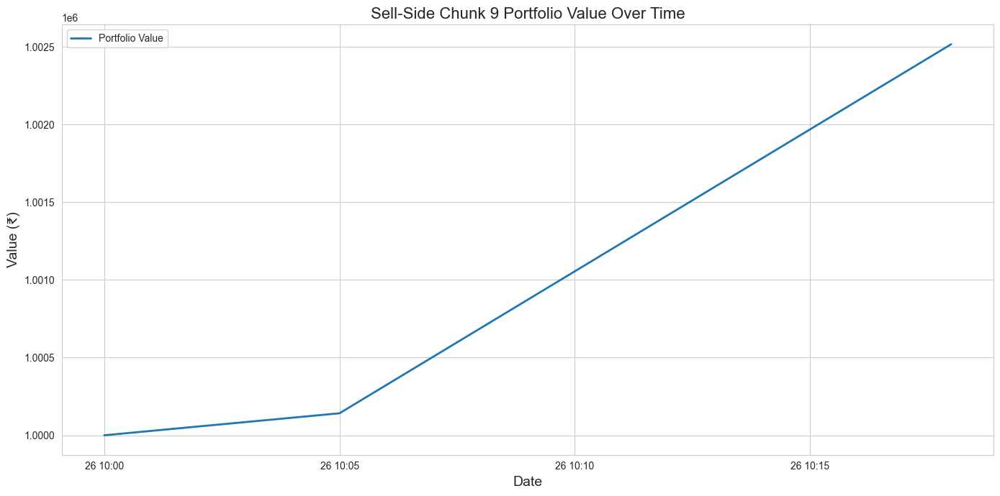

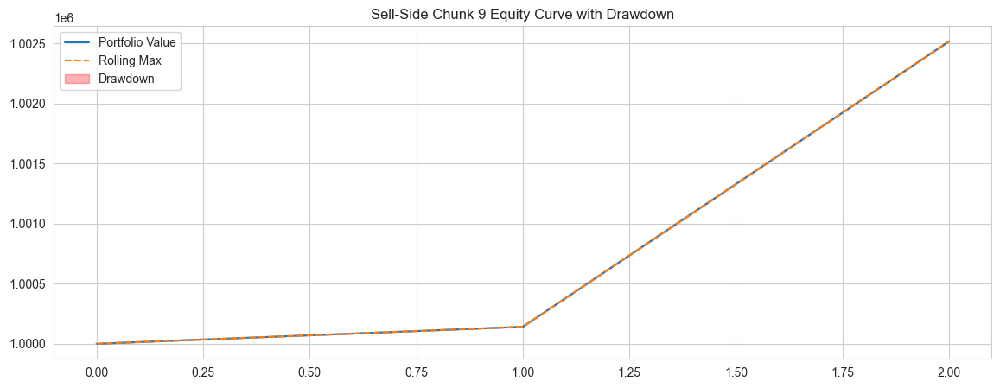

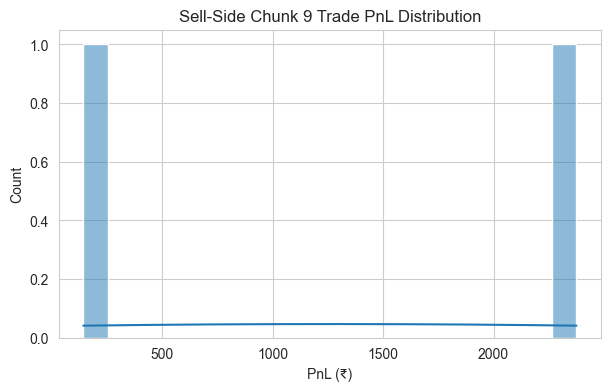

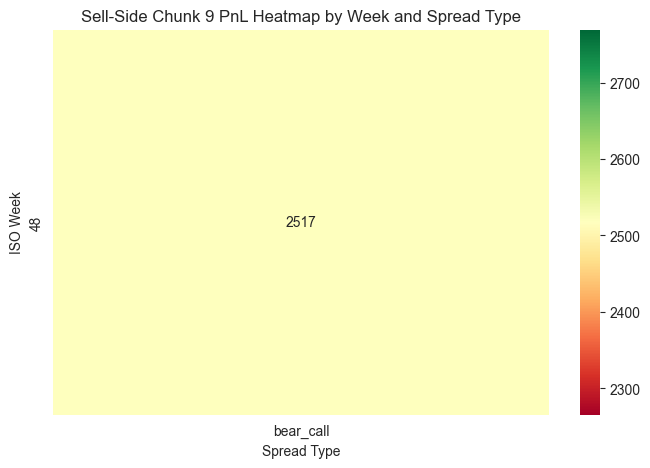

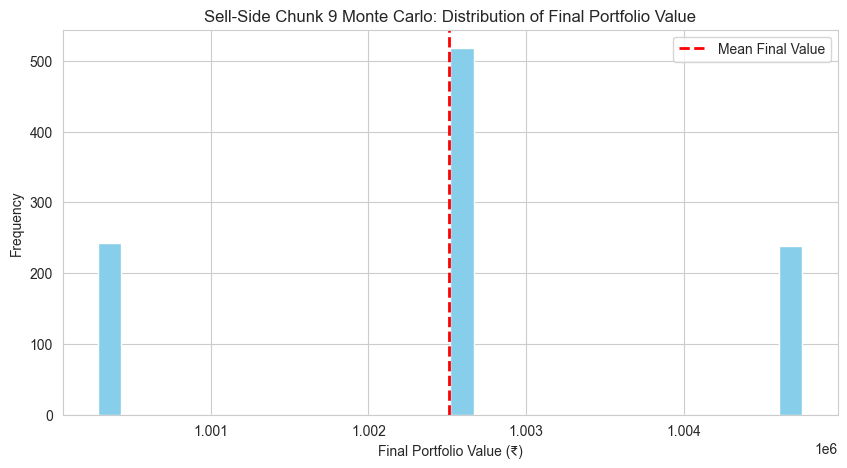

Monte Carlo: Mean Final Value = ₹1,002,508.56, 5th Percentile = ₹1,000,283.00, 95th Percentile = ₹1,004,752.00


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\3772367036.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(


Buy-side trade log saved to D:\Bits Hyderabad_Campus Diaries\PS-1\AlgoBulls\Options_Backtest_Local_Data\Buy_Side_TradeLog_Chunk_9_2024-10-01_2024-12-01.csv

Buy-Side Chunk 9 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹1,001,572.50
Total Return:       0.16%
Max Drawdown:       ₹0.00
Sharpe Ratio:       12.08
Sortino Ratio:      0.00
Calmar Ratio:       0.00

Trade Statistics:
-----------------
Total Trades:       2
Winning Trades:     2
Losing Trades:      0
Avg PnL:            ₹786.25
Best Trade:         ₹1,480.00
Worst Trade:        ₹92.50
Trade Period:       2024-11-26 to 2024-11-26



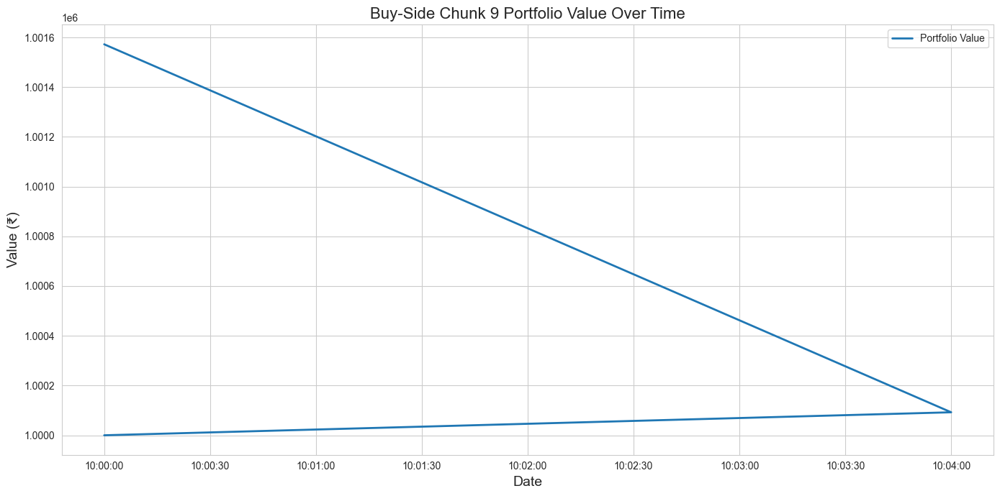

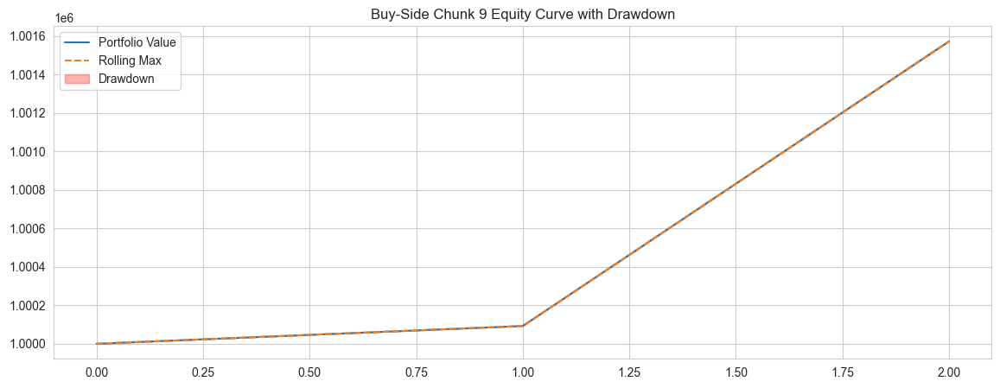

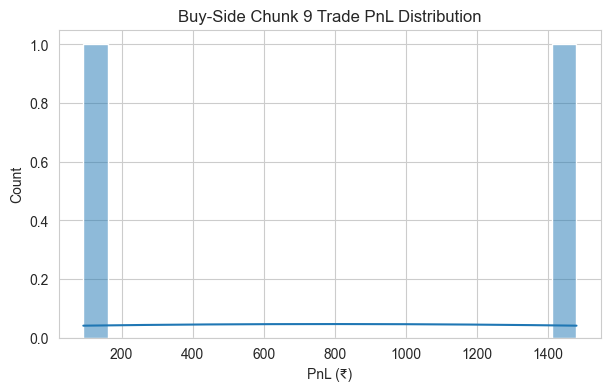

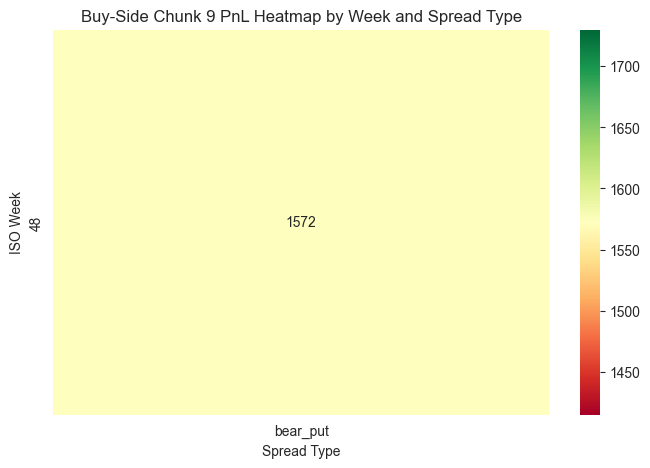

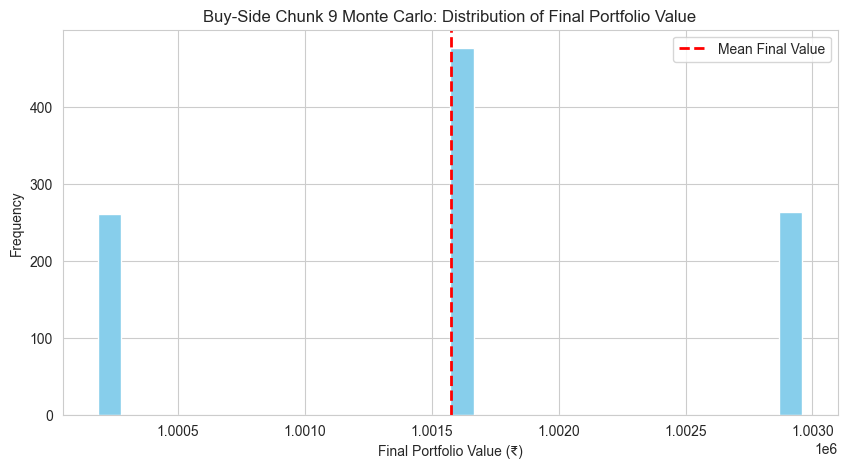

Monte Carlo: Mean Final Value = ₹1,001,575.28, 5th Percentile = ₹1,000,185.00, 95th Percentile = ₹1,002,960.00

=== Processing chunk 10: 2024-12-01 09:15:00+05:30 to 2025-01-16 15:30:00+05:30 ===


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\3772367036.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(


Sell-side trade log saved to D:\Bits Hyderabad_Campus Diaries\PS-1\AlgoBulls\Options_Backtest_Local_Data\Sell_Side_TradeLog_Chunk_10_2024-12-01_2025-01-16.csv

Sell-Side Chunk 10 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹982,086.88
Total Return:       -1.79%
Max Drawdown:       ₹17,998.44
Sharpe Ratio:       -9.16
Sortino Ratio:      0.00
Calmar Ratio:       -37.77

Trade Statistics:
-----------------
Total Trades:       3
Winning Trades:     1
Losing Trades:      2
Avg PnL:            ₹-5,971.04
Best Trade:         ₹86.88
Worst Trade:        ₹-18,000.00
Trade Period:       2024-12-12 to 2025-01-15



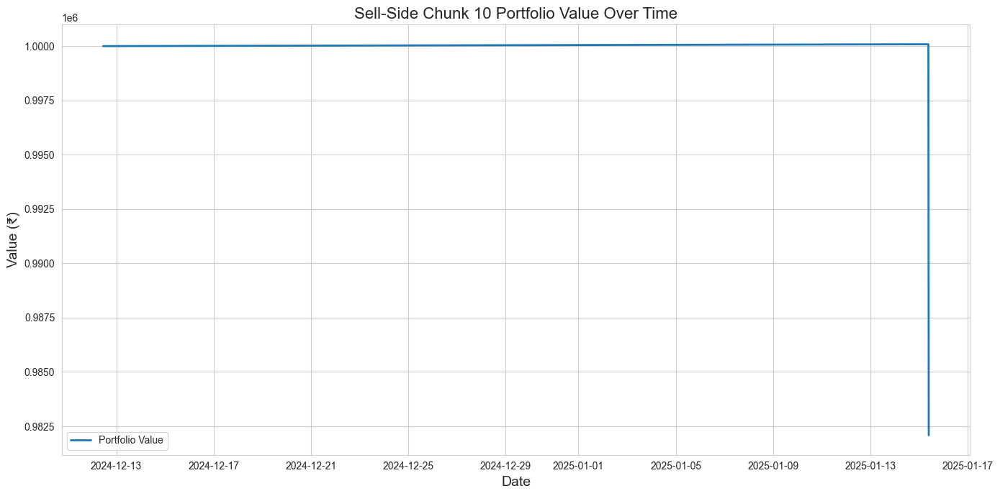

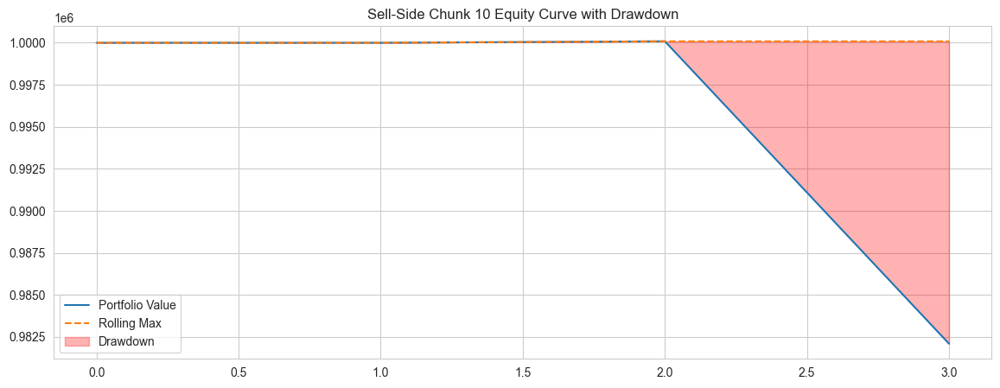

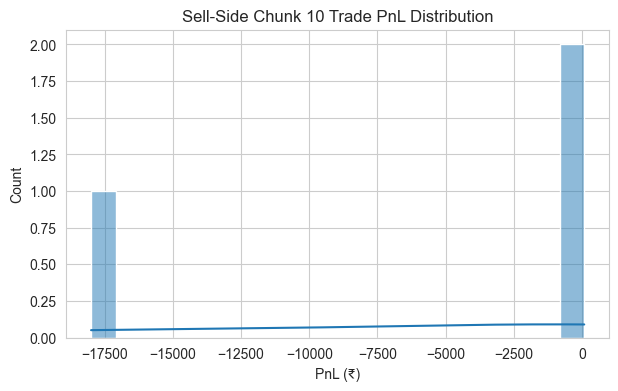

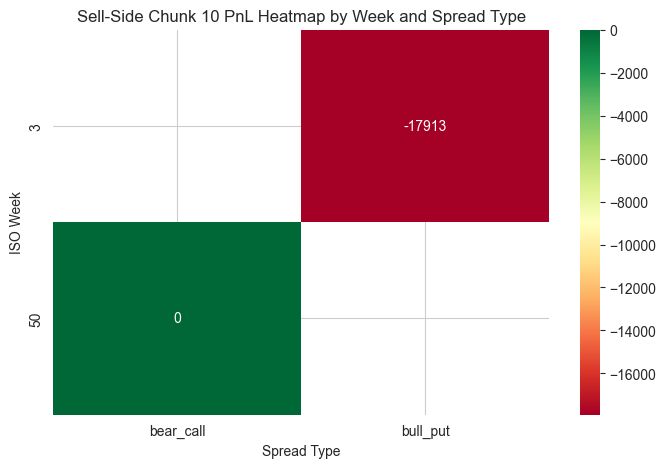

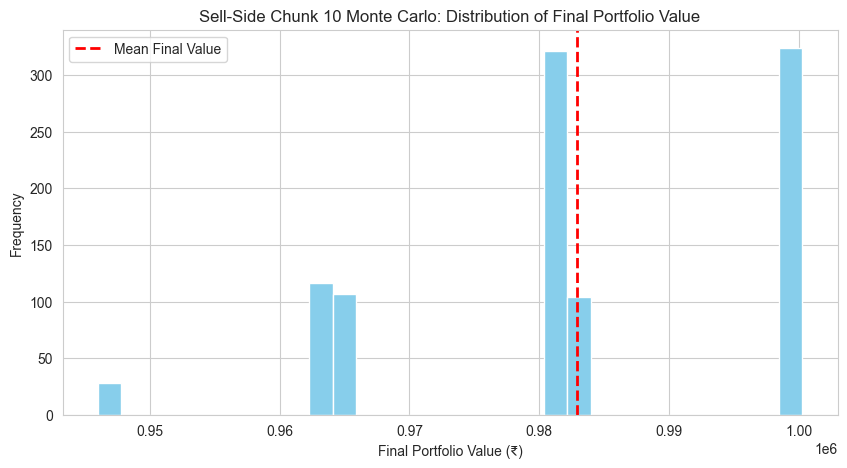

Monte Carlo: Mean Final Value = ₹982,896.70, 5th Percentile = ₹964,000.00, 95th Percentile = ₹1,000,173.75


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\3772367036.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(


Buy-side trade log saved to D:\Bits Hyderabad_Campus Diaries\PS-1\AlgoBulls\Options_Backtest_Local_Data\Buy_Side_TradeLog_Chunk_10_2024-12-01_2025-01-16.csv

Buy-Side Chunk 10 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹1,000,000.00
Total Return:       0.00%
Max Drawdown:       ₹0.00
Sharpe Ratio:       0.00
Sortino Ratio:      0.00
Calmar Ratio:       0.00

Trade Statistics:
-----------------
Total Trades:       2
Winning Trades:     0
Losing Trades:      2
Avg PnL:            ₹0.00
Best Trade:         ₹0.00
Worst Trade:        ₹0.00
Trade Period:       2024-12-12 to 2025-01-15



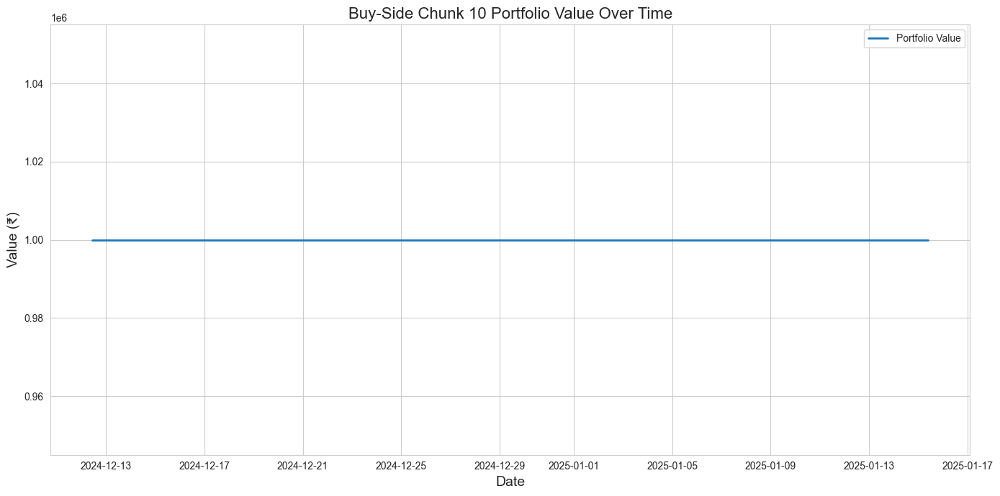

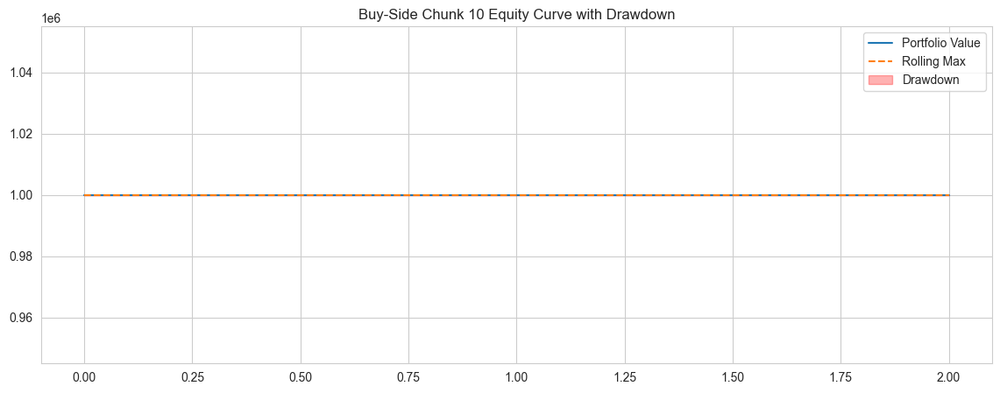

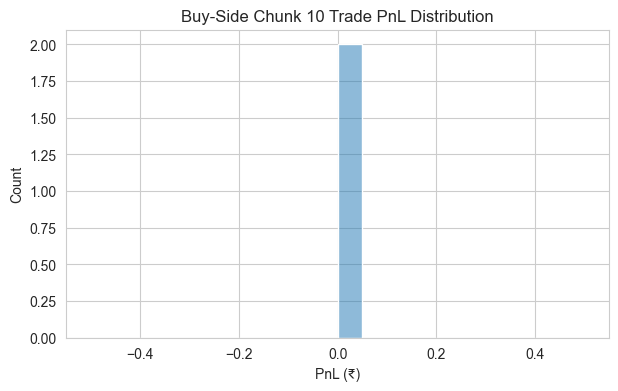

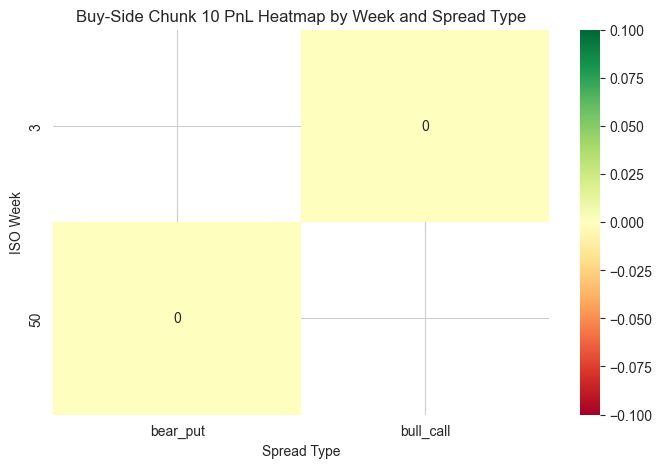

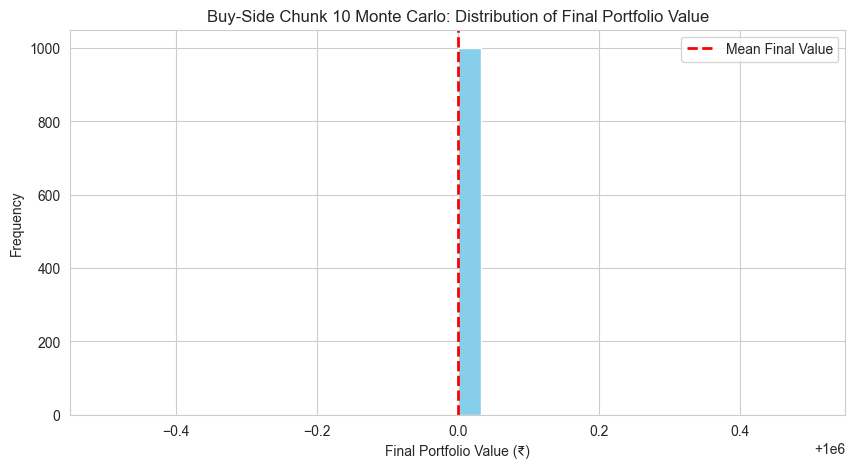

Monte Carlo: Mean Final Value = ₹1,000,000.00, 5th Percentile = ₹1,000,000.00, 95th Percentile = ₹1,000,000.00


In [5]:
import pandas as pd
import numpy as np
import os
from datetime import datetime, timedelta
import matplotlib.pyplot as plt
import seaborn as sns

# =========================
# CONFIGURATION
# =========================
initial_capital = 1_000_000
lot_size = 50
ATR_PERIOD = 10
ATR_MULTIPLIER = 2.5
BROKERAGE_PER_ORDER = 20
SLIPPAGE_PCT = 0.001
MARKET_CLOSE_TIME = '15:25:00'
VIX_LOW = 14
VIX_HIGH = 22
RISK_LOW = 0.15
RISK_MED = 0.10
RISK_HIGH = 0.05
CONFIRM_LOOKBACK = 10
MAX_LOSS = 18000
PARTIAL_BOOK_PCT = 0.2  # 20% position booked at first TP

# =========================
# DATA LOADING
# =========================
def load_spot(start_date, end_date):
    df = pd.read_csv(r"D:\Bits Hyderabad_Campus Diaries\PS-1\AlgoBulls\Options_Backtest_Local_Data\NIFTY_50_minute_data_Jun23_Feb25.csv", parse_dates=['date'])
    df = df.set_index('date')
    df.index = pd.to_datetime(df.index).tz_localize('Asia/Kolkata')
    df = df.loc[start_date:end_date]
    return df

def load_signals_15min():
    signals_path = r"D:\Bits Hyderabad_Campus Diaries\PS-1\AlgoBulls\Options_Backtest_Local_Data\Nifty_50_signals_15min_2023_25_50_200.csv"
    signals = pd.read_csv(signals_path, parse_dates=['date'])
    signals = signals.set_index('date')
    if signals.index.tz is None:
        signals.index = pd.to_datetime(signals.index).tz_localize('Asia/Kolkata')
    else:
        signals.index = signals.index.tz_convert('Asia/Kolkata')
    if 'Signal' not in signals.columns:
        signals.columns = ['Signal']
    return signals

def load_options_sample():
    sample_path = r"D:\Bits Hyderabad_Campus Diaries\PS-1\AlgoBulls\Options_Backtest_Local_Data\Jun23_Feb25_options_sample_ALL_EXPIRIES.csv"
    options_sample = pd.read_csv(sample_path)
    options_sample['TimeStamp'] = pd.to_datetime(options_sample['TimeStamp'])
    if options_sample['TimeStamp'].dt.tz is None:
        options_sample['TimeStamp'] = options_sample['TimeStamp'].dt.tz_localize('Asia/Kolkata')
    else:
        options_sample['TimeStamp'] = options_sample['TimeStamp'].dt.tz_convert('Asia/Kolkata')
    options_sample['Expiry'] = pd.to_datetime(options_sample['Expiry'])
    return options_sample

def load_vix(start_date, end_date):
    vix_path = r"D:\Bits Hyderabad_Campus Diaries\PS-1\AlgoBulls\Options_Backtest_Local_Data\filtered_INDIA_VIX_Jun23_Feb25.csv"
    vix = pd.read_csv(vix_path, parse_dates=['TimeStamp'])
    vix = vix.set_index('TimeStamp')
    vix.index = pd.to_datetime(vix.index).tz_localize('Asia/Kolkata')
    vix = vix.loc[start_date:end_date]
    return vix

# =========================
# ADAPTIVE VIX FILTER
# =========================
def adaptive_vix_trend_filter(vix_series, current_time, window=252, low_pct=0.2, high_pct=0.8):
    vix_hist = vix_series.loc[:current_time].tail(window)
    if len(vix_hist) < window // 2:
        return False
    low_thr = np.percentile(vix_hist, low_pct*100)
    high_thr = np.percentile(vix_hist, high_pct*100)
    curr_vix = vix_series.loc[current_time]
    return (curr_vix > low_thr) and (curr_vix < high_thr)

# =========================
# STRATEGY HELPERS
# =========================
def get_nearest_strike(strikes, target):
    return min(strikes, key=lambda x: abs(x - target))

def get_nearest_expiry(expiry_list, ts):
    future_expiries = [e for e in expiry_list if e >= ts.date()]
    return min(future_expiries) if future_expiries else None

def compute_atr_fixed(df, period=ATR_PERIOD):
    high = df['High']
    low = df['Low']
    close = df['Close']
    prev_close = close.shift(1)
    tr = pd.concat([high - low, (high - prev_close).abs(), (low - prev_close).abs()], axis=1).max(axis=1)
    atr = tr.rolling(window=period, min_periods=1).mean()
    return atr

def assign_atr(options_data):
    atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(
        lambda x: compute_atr_fixed(x[['High', 'Low', 'Close']], ATR_PERIOD)
    )
    options_data.loc[atr_values.index, 'ATR'] = atr_values
    return options_data

def get_risk_per_trade(vix_value):
    if vix_value <= 14:
        return 0.20
    elif vix_value <= VIX_LOW:
        return RISK_LOW
    elif vix_value <= VIX_HIGH:
        return RISK_MED
    else:
        return RISK_HIGH

def price_breakout_confirmation(spot_data, ts, direction, lookback=CONFIRM_LOOKBACK, sma_period=21):
    window = spot_data.loc[:ts].iloc[-lookback:]
    if len(window) < lookback:
        return False
    last_close = window['close'].iloc[-1]
    mean_high = window['high'][:-1].mean()
    mean_low = window['low'][:-1].mean()
    sma21 = window['close'].rolling(window=sma_period, min_periods=1).mean().iloc[-1]
    if direction == 1:
        return last_close > mean_high and last_close > sma21
    elif direction == -1:
        return last_close < mean_low and last_close < sma21
    return False

def trend_filter(spot_data, ts, direction, sma_period=50):
    window = spot_data.loc[:ts].iloc[-sma_period:]
    if len(window) < sma_period:
        return False
    last_close = window['close'].iloc[-1]
    sma = window['close'].mean()
    if direction == 1:
        return last_close > sma
    elif direction == -1:
        return last_close < sma
    return False

def get_dynamic_tp(vix_val):
    if vix_val <= VIX_LOW + 1:
        return 0.15
    elif vix_val <= VIX_HIGH - 1:
        return 0.25
    else:
        return 0.35

# =========================
# SELL-SIDE STRATEGY (CREDIT SPREADS)
# =========================
def execute_sell_side(spot_data, signals, options_data, vix_data):
    portfolio_cash = initial_capital
    trade_log = []
    total_brokerage = 0
    total_slippage = 0
    available_strikes = np.sort(options_data['Strike'].unique())
    expiry_list = sorted(options_data['Expiry'].dt.date.unique())
    signals_15min = signals.reindex(spot_data.index, method='ffill').dropna()
    vix_data = vix_data.reindex(spot_data.index, method='ffill').dropna()
    vix_series = vix_data['Close']
    open_spread = None
    prev_signal = 0
    options_data = assign_atr(options_data)
    for ts, row in spot_data.iterrows():
        if ts not in signals_15min.index or pd.isna(row['close']):
            continue
        signal = signals_15min.loc[ts, 'Signal']
        spot_price = row['close']
        atm_strike = int(round(spot_price / 50) * 50)
        expiry = get_nearest_expiry(expiry_list, ts)
        vix_val = vix_data.loc[ts, 'Close'] if ts in vix_data.index else None
        if expiry is None or vix_val is None or np.isnan(vix_val):
            prev_signal = signal
            continue
        risk_per_trade = get_risk_per_trade(vix_val)
        # ADAPTIVE VIX FILTER
        if not adaptive_vix_trend_filter(vix_series, ts):
            prev_signal = signal
            continue
        if not trend_filter(spot_data, ts, signal, sma_period=50):
            prev_signal = signal
            continue
        if open_spread is None and signal != 0 and signal != prev_signal and price_breakout_confirmation(spot_data, ts, signal):
            if signal == 1:
                short_strike = atm_strike
                long_strike = atm_strike - 100
                short_leg = options_data[
                    (options_data['Strike'] == short_strike) &
                    (options_data['Type'] == 'PE') &
                    (options_data['Expiry'].dt.date == expiry) &
                    (options_data['TimeStamp'] >= ts)
                ].sort_values('TimeStamp')
                long_leg = options_data[
                    (options_data['Strike'] == long_strike) &
                    (options_data['Type'] == 'PE') &
                    (options_data['Expiry'].dt.date == expiry) &
                    (options_data['TimeStamp'] >= ts)
                ].sort_values('TimeStamp')
            else:
                short_strike = atm_strike
                long_strike = atm_strike + 100
                short_leg = options_data[
                    (options_data['Strike'] == short_strike) &
                    (options_data['Type'] == 'CE') &
                    (options_data['Expiry'].dt.date == expiry) &
                    (options_data['TimeStamp'] >= ts)
                ].sort_values('TimeStamp')
                long_leg = options_data[
                    (options_data['Strike'] == long_strike) &
                    (options_data['Type'] == 'CE') &
                    (options_data['Expiry'].dt.date == expiry) &
                    (options_data['TimeStamp'] >= ts)
                ].sort_values('TimeStamp')
            if short_leg.empty or long_leg.empty:
                prev_signal = signal
                continue
            short_price = float(short_leg.iloc[0]['Close'])
            long_price = float(long_leg.iloc[0]['Close'])
            credit = (short_price - long_price) * lot_size
            margin_per_lot = abs(short_strike - long_strike) * lot_size - credit
            lots = int((portfolio_cash * risk_per_trade) // margin_per_lot)
            if lots < 1:
                prev_signal = signal
                continue
            tp_pct = get_dynamic_tp(vix_val)
            open_spread = {
                'entry_date': ts,
                'short_leg': {'strike': short_strike, 'type': short_leg.iloc[0]['Type'], 'expiry': expiry, 'price': short_price},
                'long_leg': {'strike': long_strike, 'type': long_leg.iloc[0]['Type'], 'expiry': expiry, 'price': long_price},
                'credit': credit,
                'lots': lots,
                'direction': 'bull_put' if signal == 1 else 'bear_call',
                'risk_per_trade': risk_per_trade,
                'vix_at_entry': vix_val,
                'tp_pct': tp_pct,
                'partial_booked': False
            }
            prev_signal = signal
            continue
        if open_spread is not None:
            short_leg, long_leg = open_spread['short_leg'], open_spread['long_leg']
            spread_rows_short = options_data[
                (options_data['Strike'] == short_leg['strike']) &
                (options_data['Type'] == short_leg['type']) &
                (options_data['Expiry'].dt.date == short_leg['expiry']) &
                (options_data['TimeStamp'] >= open_spread['entry_date']) &
                (options_data['TimeStamp'] <= ts)
            ].sort_values('TimeStamp')
            spread_rows_long = options_data[
                (options_data['Strike'] == long_leg['strike']) &
                (options_data['Type'] == long_leg['type']) &
                (options_data['Expiry'].dt.date == long_leg['expiry']) &
                (options_data['TimeStamp'] >= open_spread['entry_date']) &
                (options_data['TimeStamp'] <= ts)
            ].sort_values('TimeStamp')
            for i in range(min(len(spread_rows_short), len(spread_rows_long))):
                short_price = float(spread_rows_short.iloc[i]['Close'])
                long_price = float(spread_rows_long.iloc[i]['Close'])
                spread_value = (short_price - long_price) * lot_size
                pnl = (open_spread['credit'] - spread_value) * open_spread['lots']
                tp_level = open_spread['credit'] * open_spread['tp_pct']
                if not open_spread['partial_booked'] and pnl > tp_level:
                    booked_pnl = tp_level * PARTIAL_BOOK_PCT
                    portfolio_cash += booked_pnl
                    open_spread['credit'] -= booked_pnl
                    open_spread['lots'] = int(open_spread['lots'] * (1 - PARTIAL_BOOK_PCT))
                    open_spread['partial_booked'] = True
                    trade_log.append({**open_spread, 'exit_date': spread_rows_short.iloc[i]['TimeStamp'], 'exit_pnl': booked_pnl, 'exit_reason': 'Partial TP'})
                elif pnl > tp_level and open_spread['partial_booked']:
                    exit_time = spread_rows_short.iloc[i]['TimeStamp']
                    portfolio_cash += pnl
                    trade_log.append({**open_spread, 'exit_date': exit_time, 'exit_pnl': pnl, 'exit_reason': 'Full TP'})
                    open_spread = None
                    break
                elif pnl < -MAX_LOSS:
                    exit_time = spread_rows_short.iloc[i]['TimeStamp']
                    portfolio_cash += -MAX_LOSS
                    trade_log.append({**open_spread, 'exit_date': exit_time, 'exit_pnl': -MAX_LOSS, 'exit_reason': 'Max Loss'})
                    open_spread = None
                    break
                elif ts.date() >= open_spread['short_leg']['expiry']:
                    exit_time = spread_rows_short.iloc[i]['TimeStamp']
                    pnl = (open_spread['credit'] - spread_value) * open_spread['lots']
                    if pnl < -MAX_LOSS:
                        pnl = -MAX_LOSS
                    portfolio_cash += pnl
                    trade_log.append({**open_spread, 'exit_date': exit_time, 'exit_pnl': pnl, 'exit_reason': 'Expiry'})
                    open_spread = None
                    break
        prev_signal = signal
    return trade_log, total_brokerage, total_slippage

# =========================
# BUY-SIDE STRATEGY (DEBIT SPREADS)
# =========================
def execute_buy_side(spot_data, signals, options_data, vix_data):
    portfolio_cash = initial_capital
    trade_log = []
    total_brokerage = 0
    total_slippage = 0
    available_strikes = np.sort(options_data['Strike'].unique())
    expiry_list = sorted(options_data['Expiry'].dt.date.unique())
    signals_15min = signals.reindex(spot_data.index, method='ffill').dropna()
    vix_data = vix_data.reindex(spot_data.index, method='ffill').dropna()
    vix_series = vix_data['Close']
    open_spread = None
    prev_signal = 0
    options_data = assign_atr(options_data)
    for ts, row in spot_data.iterrows():
        if ts not in signals_15min.index or pd.isna(row['close']):
            continue
        signal = signals_15min.loc[ts, 'Signal']
        spot_price = row['close']
        atm_strike = int(round(spot_price / 50) * 50)
        expiry = get_nearest_expiry(expiry_list, ts)
        vix_val = vix_data.loc[ts, 'Close'] if ts in vix_data.index else None
        if expiry is None or vix_val is None or np.isnan(vix_val):
            prev_signal = signal
            continue
        risk_per_trade = get_risk_per_trade(vix_val)
        # ADAPTIVE VIX FILTER
        if not adaptive_vix_trend_filter(vix_series, ts):
            prev_signal = signal
            continue
        if not trend_filter(spot_data, ts, signal, sma_period=50):
            prev_signal = signal
            continue
        if open_spread is None and signal != 0 and signal != prev_signal and price_breakout_confirmation(spot_data, ts, signal):
            if signal == 1:
                long_strike = atm_strike
                short_strike = atm_strike + 100
                long_leg = options_data[
                    (options_data['Strike'] == long_strike) &
                    (options_data['Type'] == 'CE') &
                    (options_data['Expiry'].dt.date == expiry) &
                    (options_data['TimeStamp'] >= ts)
                ].sort_values('TimeStamp')
                short_leg = options_data[
                    (options_data['Strike'] == short_strike) &
                    (options_data['Type'] == 'CE') &
                    (options_data['Expiry'].dt.date == expiry) &
                    (options_data['TimeStamp'] >= ts)
                ].sort_values('TimeStamp')
            else:
                long_strike = atm_strike
                short_strike = atm_strike - 100
                long_leg = options_data[
                    (options_data['Strike'] == long_strike) &
                    (options_data['Type'] == 'PE') &
                    (options_data['Expiry'].dt.date == expiry) &
                    (options_data['TimeStamp'] >= ts)
                ].sort_values('TimeStamp')
                short_leg = options_data[
                    (options_data['Strike'] == short_strike) &
                    (options_data['Type'] == 'PE') &
                    (options_data['Expiry'].dt.date == expiry) &
                    (options_data['TimeStamp'] >= ts)
                ].sort_values('TimeStamp')
            if long_leg.empty or short_leg.empty:
                prev_signal = signal
                continue
            long_price = float(long_leg.iloc[0]['Close'])
            short_price = float(short_leg.iloc[0]['Close'])
            debit = (long_price - short_price) * lot_size
            margin_per_lot = abs(long_strike - short_strike) * lot_size
            lots = int((portfolio_cash * risk_per_trade) // margin_per_lot)
            if lots < 1:
                prev_signal = signal
                continue
            tp_pct = get_dynamic_tp(vix_val)
            open_spread = {
                'entry_date': ts,
                'long_leg': {'strike': long_strike, 'type': long_leg.iloc[0]['Type'], 'expiry': expiry, 'price': long_price},
                'short_leg': {'strike': short_strike, 'type': short_leg.iloc[0]['Type'], 'expiry': expiry, 'price': short_price},
                'debit': debit,
                'lots': lots,
                'direction': 'bull_call' if signal == 1 else 'bear_put',
                'risk_per_trade': risk_per_trade,
                'vix_at_entry': vix_val,
                'tp_pct': tp_pct,
                'partial_booked': False
            }
            prev_signal = signal
            continue
        if open_spread is not None:
            long_leg, short_leg = open_spread['long_leg'], open_spread['short_leg']
            spread_rows_long = options_data[
                (options_data['Strike'] == long_leg['strike']) &
                (options_data['Type'] == long_leg['type']) &
                (options_data['Expiry'].dt.date == long_leg['expiry']) &
                (options_data['TimeStamp'] >= open_spread['entry_date']) &
                (options_data['TimeStamp'] <= ts)
            ].sort_values('TimeStamp')
            spread_rows_short = options_data[
                (options_data['Strike'] == short_leg['strike']) &
                (options_data['Type'] == short_leg['type']) &
                (options_data['Expiry'].dt.date == short_leg['expiry']) &
                (options_data['TimeStamp'] >= open_spread['entry_date']) &
                (options_data['TimeStamp'] <= ts)
            ].sort_values('TimeStamp')
            for i in range(min(len(spread_rows_long), len(spread_rows_short))):
                long_price = float(spread_rows_long.iloc[i]['Close'])
                short_price = float(spread_rows_short.iloc[i]['Close'])
                spread_value = (long_price - short_price) * lot_size
                pnl = (spread_value - open_spread['debit']) * open_spread['lots']
                tp_level = open_spread['debit'] * open_spread['tp_pct']
                if not open_spread['partial_booked'] and pnl > tp_level:
                    booked_pnl = tp_level * PARTIAL_BOOK_PCT
                    portfolio_cash += booked_pnl
                    open_spread['debit'] -= booked_pnl
                    open_spread['lots'] = int(open_spread['lots'] * (1 - PARTIAL_BOOK_PCT))
                    open_spread['partial_booked'] = True
                    trade_log.append({**open_spread, 'exit_date': spread_rows_long.iloc[i]['TimeStamp'], 'exit_pnl': booked_pnl, 'exit_reason': 'Partial TP'})
                elif pnl > tp_level and open_spread['partial_booked']:
                    exit_time = spread_rows_long.iloc[i]['TimeStamp']
                    portfolio_cash += pnl
                    trade_log.append({**open_spread, 'exit_date': exit_time, 'exit_pnl': pnl, 'exit_reason': 'Full TP'})
                    open_spread = None
                    break
                elif pnl < -MAX_LOSS:
                    exit_time = spread_rows_long.iloc[i]['TimeStamp']
                    portfolio_cash += -MAX_LOSS
                    trade_log.append({**open_spread, 'exit_date': exit_time, 'exit_pnl': -MAX_LOSS, 'exit_reason': 'Max Loss'})
                    open_spread = None
                    break
                elif ts.date() >= open_spread['long_leg']['expiry']:
                    exit_time = spread_rows_long.iloc[i]['TimeStamp']
                    pnl = (spread_value - open_spread['debit']) * open_spread['lots']
                    if pnl < -MAX_LOSS:
                        pnl = -MAX_LOSS
                    portfolio_cash += pnl
                    trade_log.append({**open_spread, 'exit_date': exit_time, 'exit_pnl': pnl, 'exit_reason': 'Expiry'})
                    open_spread = None
                    break
        prev_signal = signal
    return trade_log, total_brokerage, total_slippage

# =========================
# STRATEGY REPORT & VISUALIZATION
# =========================
def strategy_report_and_visualizations(trade_log_df, initial_capital, title_prefix=""):
    if trade_log_df.empty:
        print("No trades to report.")
        return
    portfolio_values = [initial_capital]
    portfolio_dates = [trade_log_df['entry_date'].iloc[0]]
    current_value = initial_capital
    for i, row in trade_log_df.iterrows():
        current_value += row['exit_pnl']
        portfolio_values.append(current_value)
        portfolio_dates.append(row['exit_date'])
    returns = pd.Series(portfolio_values).pct_change().dropna()
    rf = 0.01  # risk-free rate (annual)
    sharpe = ((returns.mean() - rf/252) / returns.std()) * np.sqrt(252) if returns.std() > 0 else 0
    downside_std = returns[returns < 0].std()
    sortino = ((returns.mean() - rf/252) / downside_std) * np.sqrt(252) if downside_std > 0 else 0
    cumulative = pd.Series(portfolio_values)
    rolling_max = cumulative.cummax()
    drawdown = (cumulative - rolling_max) / rolling_max
    max_drawdown = abs(drawdown.min()) * initial_capital
    years = len(portfolio_values) / 252
    cagr = (portfolio_values[-1]/portfolio_values[0])**(1/years) - 1 if years > 0 else 0
    calmar = cagr / abs(drawdown.min()) if drawdown.min() != 0 else 0

    print(f"""
{title_prefix} Strategy Performance Report:
-----------------------------
Initial Capital:    ₹{initial_capital:,.2f}
Final Portfolio:    ₹{portfolio_values[-1]:,.2f}
Total Return:       {(portfolio_values[-1]/initial_capital-1)*100:.2f}%
Max Drawdown:       ₹{max_drawdown:,.2f}
Sharpe Ratio:       {sharpe:.2f}
Sortino Ratio:      {sortino:.2f}
Calmar Ratio:       {calmar:.2f}

Trade Statistics:
-----------------
Total Trades:       {len(trade_log_df)}
Winning Trades:     {(trade_log_df['exit_pnl'] > 0).sum()}
Losing Trades:      {(trade_log_df['exit_pnl'] <= 0).sum()}
Avg PnL:            ₹{trade_log_df['exit_pnl'].mean():,.2f}
Best Trade:         ₹{trade_log_df['exit_pnl'].max():,.2f}
Worst Trade:        ₹{trade_log_df['exit_pnl'].min():,.2f}
Trade Period:       {trade_log_df['entry_date'].min().date()} to {trade_log_df['exit_date'].max().date()}
""")

    sns.set_style("whitegrid")
    plt.figure(figsize=(14, 7))
    plt.plot(portfolio_dates, portfolio_values, label='Portfolio Value', linewidth=2)
    plt.title(f'{title_prefix} Portfolio Value Over Time', fontsize=16)
    plt.ylabel('Value (₹)', fontsize=14)
    plt.xlabel('Date', fontsize=14)
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(14, 5))
    plt.plot(cumulative, label='Portfolio Value')
    plt.plot(rolling_max, '--', label='Rolling Max')
    plt.fill_between(cumulative.index, cumulative, rolling_max, color='red', alpha=0.3, label='Drawdown')
    plt.title(f"{title_prefix} Equity Curve with Drawdown")
    plt.legend()
    plt.show()

    plt.figure(figsize=(7, 4))
    sns.histplot(trade_log_df['exit_pnl'], bins=20, kde=True)
    plt.title(f"{title_prefix} Trade PnL Distribution")
    plt.xlabel("PnL (₹)")
    plt.ylabel("Count")
    plt.show()

    trade_log_df['exit_week'] = pd.to_datetime(trade_log_df['exit_date']).dt.isocalendar().week
    trade_log_df['spread_type'] = trade_log_df['direction']
    heatmap_data = trade_log_df.pivot_table(index='exit_week', columns='spread_type', values='exit_pnl', aggfunc='sum')
    plt.figure(figsize=(8, 5))
    sns.heatmap(heatmap_data, annot=True, fmt=".0f", cmap='RdYlGn')
    plt.title(f"{title_prefix} PnL Heatmap by Week and Spread Type")
    plt.xlabel("Spread Type")
    plt.ylabel("ISO Week")
    plt.show()

    # --- Monte Carlo Simulation ---
    n_sim = 1000
    sim_length = len(trade_log_df)
    sim_results = []
    for _ in range(n_sim):
        sim_pnls = np.random.choice(trade_log_df['exit_pnl'], size=sim_length, replace=True)
        sim_curve = np.cumsum(np.insert(sim_pnls, 0, initial_capital))
        sim_results.append(sim_curve[-1])
    plt.figure(figsize=(10, 5))
    plt.hist(sim_results, bins=30, color='skyblue')
    plt.axvline(np.mean(sim_results), color='red', linestyle='dashed', linewidth=2, label='Mean Final Value')
    plt.title(f"{title_prefix} Monte Carlo: Distribution of Final Portfolio Value")
    plt.xlabel("Final Portfolio Value (₹)")
    plt.ylabel("Frequency")
    plt.legend()
    plt.show()
    print(f"Monte Carlo: Mean Final Value = ₹{np.mean(sim_results):,.2f}, 5th Percentile = ₹{np.percentile(sim_results, 5):,.2f}, 95th Percentile = ₹{np.percentile(sim_results, 95):,.2f}")

# =========================
# MAIN CHUNKED BACKTEST LOOP
# =========================
signals = load_signals_15min()
options_sample = load_options_sample()

start_date = pd.Timestamp('2023-06-01 09:15:00', tz='Asia/Kolkata')
final_end_date = pd.Timestamp('2025-01-16 15:30:00', tz='Asia/Kolkata')  # Last options sample date

chunk_length = pd.DateOffset(months=2)
chunk_idx = 1
current_start = start_date

while current_start < final_end_date:
    current_end = min(current_start + chunk_length - pd.Timedelta(minutes=1), final_end_date)
    print(f"\n=== Processing chunk {chunk_idx}: {current_start} to {current_end} ===")
    spot_data = load_spot(current_start, current_end)
    vix_data = load_vix(current_start, current_end)
    chunk_signals = signals.loc[(signals.index >= current_start) & (signals.index <= current_end)]
    chunk_options = options_sample[
        (options_sample['TimeStamp'] >= current_start) &
        (options_sample['TimeStamp'] <= current_end)
    ]
    if spot_data.empty or vix_data.empty or chunk_signals.empty or chunk_options.empty:
        print(f"Chunk {chunk_idx} skipped due to missing data.")
        current_start = current_end + pd.Timedelta(minutes=1)
        chunk_idx += 1
        continue

    # SELL SIDE
    sell_log, sell_brokerage, sell_slippage = execute_sell_side(spot_data, chunk_signals, chunk_options.copy(), vix_data)
    sell_log_df = pd.DataFrame(sell_log)
    if not sell_log_df.empty:
        out_path = rf"D:\Bits Hyderabad_Campus Diaries\PS-1\AlgoBulls\Options_Backtest_Local_Data\Sell_Side_TradeLog_Chunk_{chunk_idx}_{current_start.date()}_{current_end.date()}.csv"
        sell_log_df.to_csv(out_path, index=False)
        print(f"Sell-side trade log saved to {out_path}")
        strategy_report_and_visualizations(sell_log_df, initial_capital, title_prefix=f"Sell-Side Chunk {chunk_idx}")
    else:
        print(f"No sell-side trades in chunk {chunk_idx}")

    # BUY SIDE
    buy_log, buy_brokerage, buy_slippage = execute_buy_side(spot_data, chunk_signals, chunk_options.copy(), vix_data)
    buy_log_df = pd.DataFrame(buy_log)
    if not buy_log_df.empty:
        out_path = rf"D:\Bits Hyderabad_Campus Diaries\PS-1\AlgoBulls\Options_Backtest_Local_Data\Buy_Side_TradeLog_Chunk_{chunk_idx}_{current_start.date()}_{current_end.date()}.csv"
        buy_log_df.to_csv(out_path, index=False)
        print(f"Buy-side trade log saved to {out_path}")
        strategy_report_and_visualizations(buy_log_df, initial_capital, title_prefix=f"Buy-Side Chunk {chunk_idx}")
    else:
        print(f"No buy-side trades in chunk {chunk_idx}")

    current_start = current_end + pd.Timedelta(minutes=1)
    chunk_idx += 1



=== Processing chunk 1: 2023-06-01 09:15:00+05:30 to 2023-08-01 09:14:00+05:30 ===


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\3384581208.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(
C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\3384581208.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(



===== CUMULATIVE REPORT AFTER CHUNK 1 =====

Combined Strategy Performance Report:
-----------------------------
Initial Capital:    1,000,000.00
Final Portfolio:    1,023,531.10
Total Return:       2.35%
Max Drawdown:       0.00
Sharpe Ratio:       10.53
Sortino Ratio:      0.00
Calmar Ratio:       0.00
Total Trades:       8
Winning Trades:     8
Losing Trades:      0
Avg PnL:            2,941.39
Best Trade:         11,583.00
Worst Trade:        43.88
Trade Period:       2023-07-04 to 2023-07-12



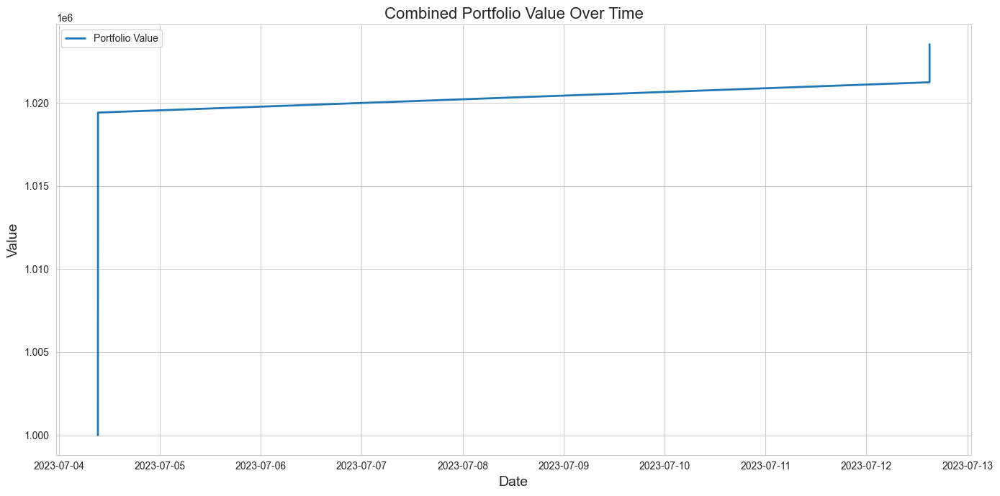

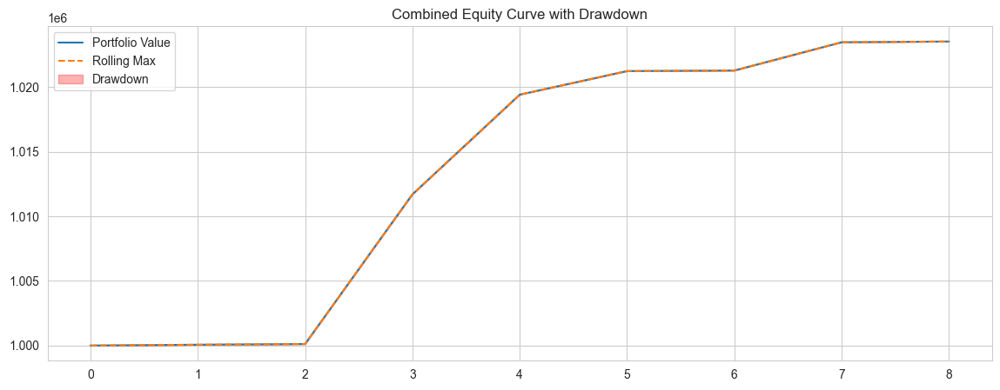

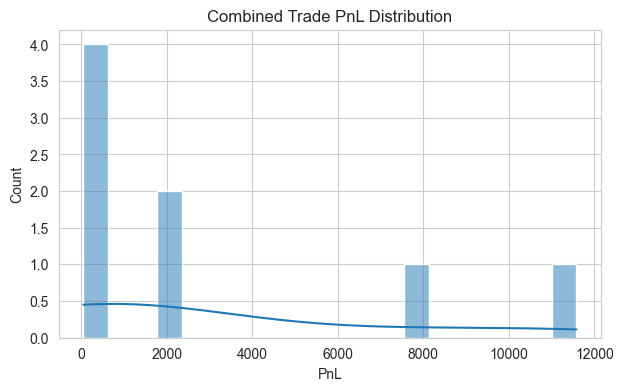

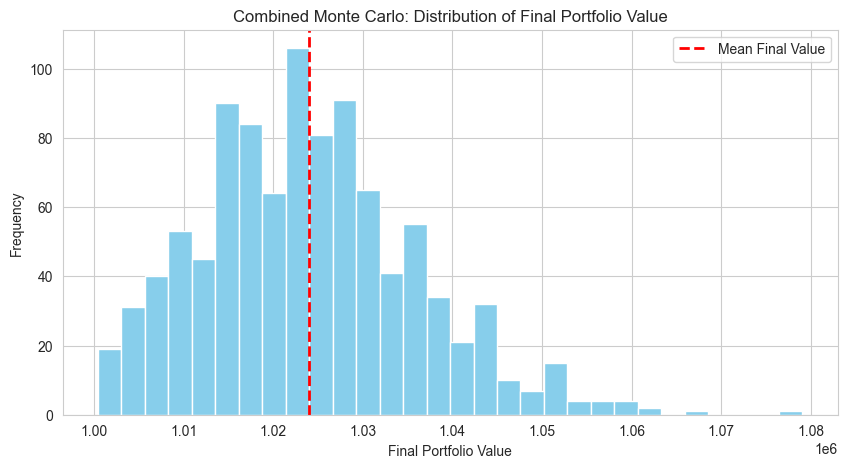

Monte Carlo: Mean Final Value = 1,023,960.65, 5th Percentile = 1,005,678.02, 95th Percentile = 1,044,832.83

=== Processing chunk 2: 2023-08-01 09:15:00+05:30 to 2023-10-01 09:14:00+05:30 ===


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\3384581208.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(
C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\3384581208.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(



===== CUMULATIVE REPORT AFTER CHUNK 2 =====

Combined Strategy Performance Report:
-----------------------------
Initial Capital:    1,000,000.00
Final Portfolio:    1,046,695.37
Total Return:       4.67%
Max Drawdown:       0.00
Sharpe Ratio:       10.06
Sortino Ratio:      0.00
Calmar Ratio:       0.00
Total Trades:       24
Winning Trades:     24
Losing Trades:      0
Avg PnL:            1,945.64
Best Trade:         11,583.00
Worst Trade:        43.73
Trade Period:       2023-07-04 to 2023-09-28



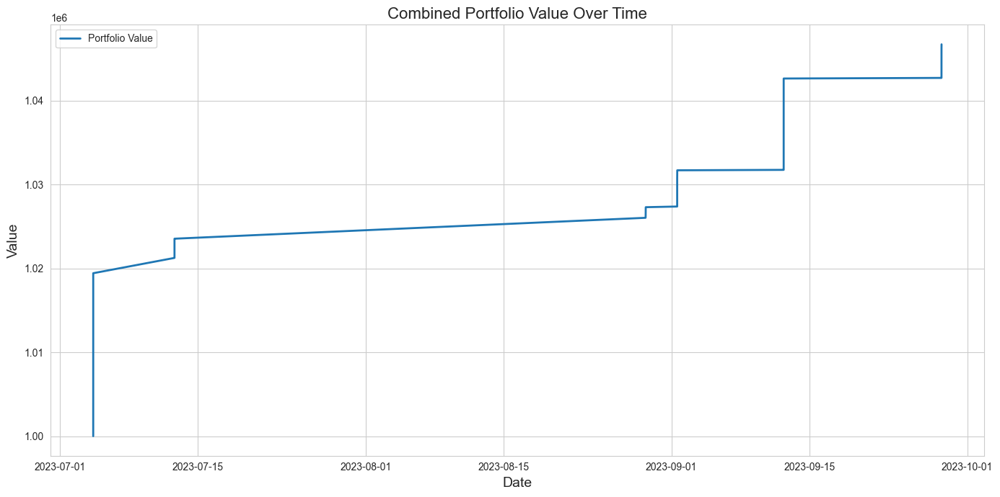

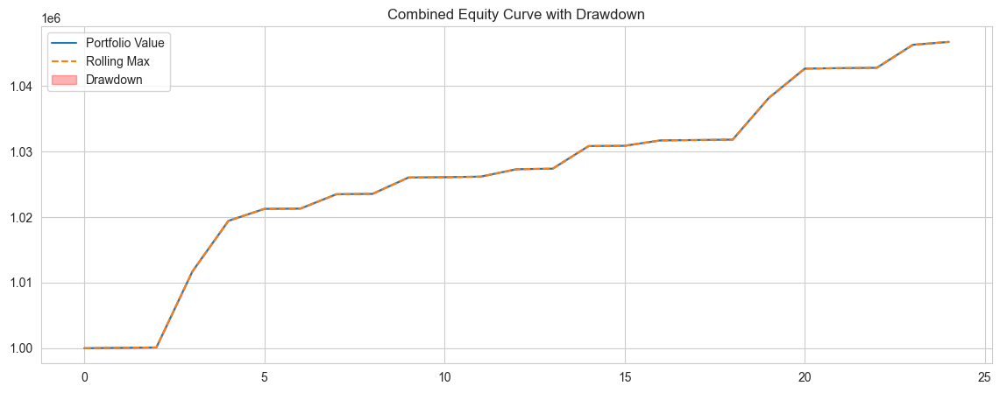

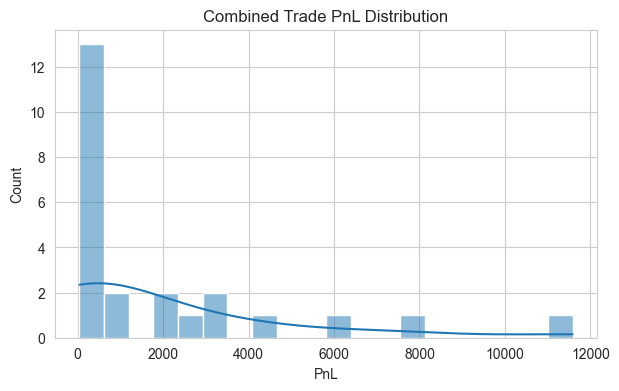

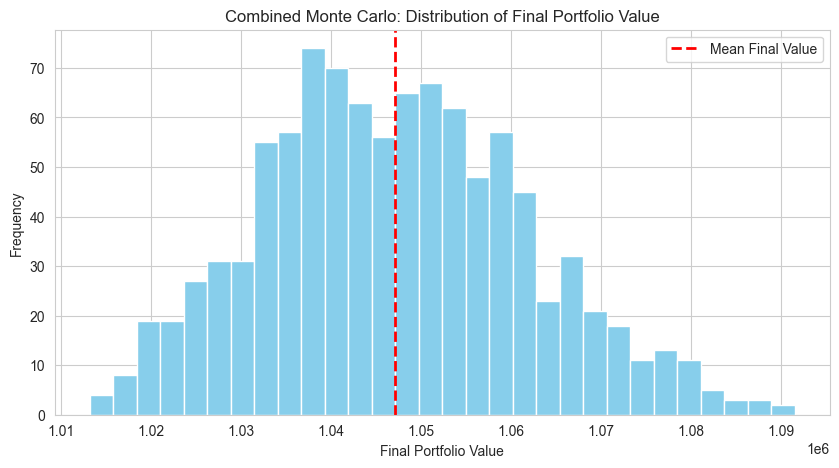

Monte Carlo: Mean Final Value = 1,047,107.71, 5th Percentile = 1,023,647.26, 95th Percentile = 1,072,657.18

=== Processing chunk 3: 2023-10-01 09:15:00+05:30 to 2023-12-01 09:14:00+05:30 ===


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\3384581208.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(
C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\3384581208.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(



===== CUMULATIVE REPORT AFTER CHUNK 3 =====

Combined Strategy Performance Report:
-----------------------------
Initial Capital:    1,000,000.00
Final Portfolio:    1,010,695.37
Total Return:       1.07%
Max Drawdown:       34,393.96
Sharpe Ratio:       1.03
Sortino Ratio:      28.85
Calmar Ratio:       0.97
Total Trades:       26
Winning Trades:     24
Losing Trades:      2
Avg PnL:            411.36
Best Trade:         11,583.00
Worst Trade:        -18,000.00
Trade Period:       2023-07-04 to 2023-10-31



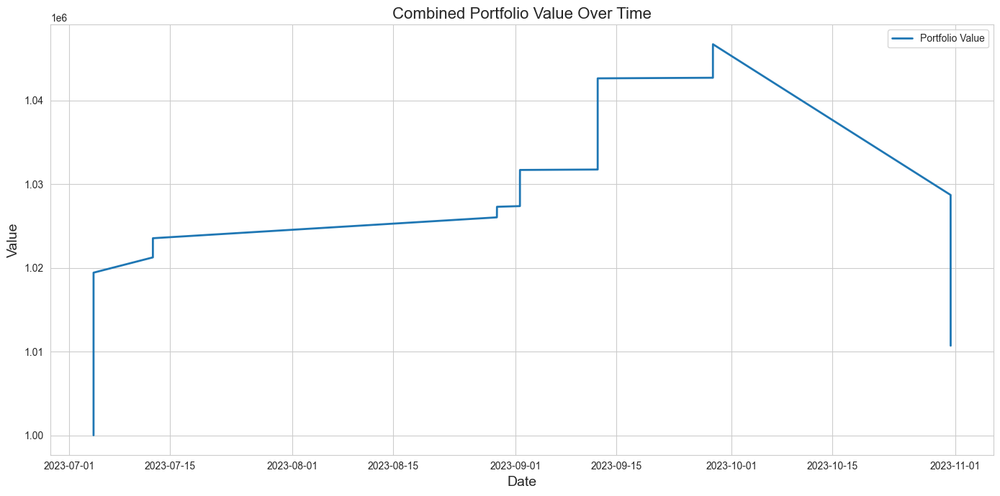

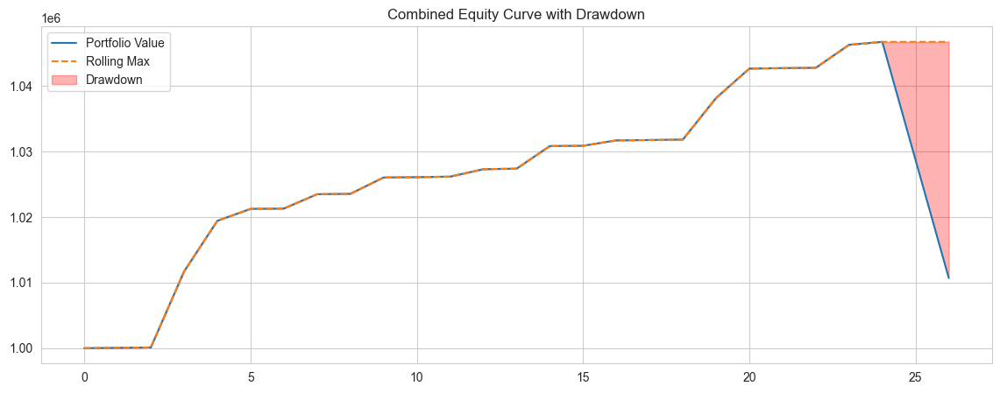

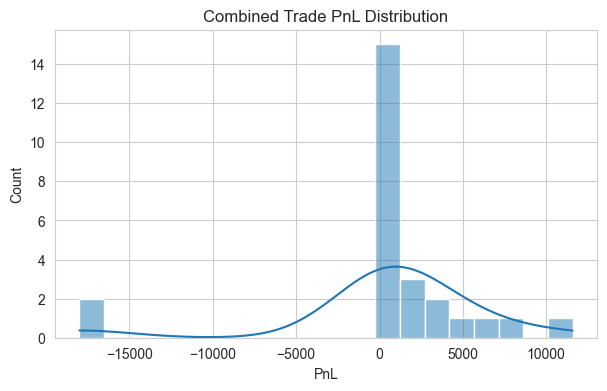

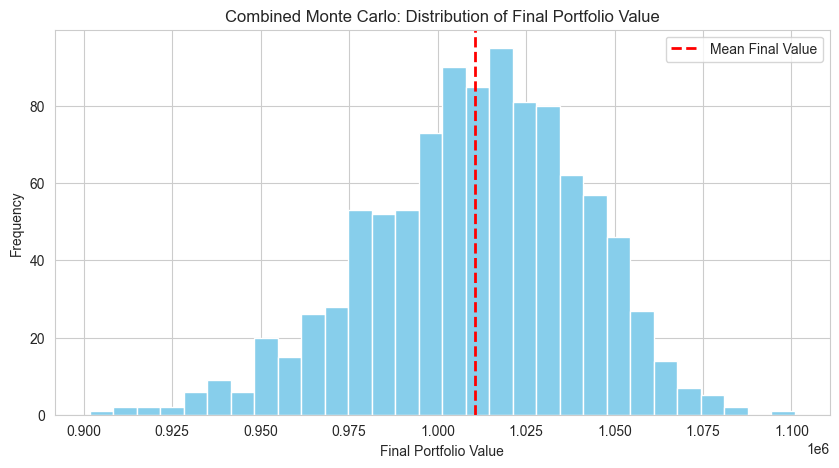

Monte Carlo: Mean Final Value = 1,010,660.36, 5th Percentile = 955,601.79, 95th Percentile = 1,055,155.36

=== Processing chunk 4: 2023-12-01 09:15:00+05:30 to 2024-02-01 09:14:00+05:30 ===


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\3384581208.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(
C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\3384581208.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(



===== CUMULATIVE REPORT AFTER CHUNK 4 =====

Combined Strategy Performance Report:
-----------------------------
Initial Capital:    1,000,000.00
Final Portfolio:    983,513.67
Total Return:       -1.65%
Max Drawdown:       62,663.27
Sharpe Ratio:       -1.08
Sortino Ratio:      -19.23
Calmar Ratio:       -0.47
Total Trades:       42
Winning Trades:     38
Losing Trades:      4
Avg PnL:            -392.53
Best Trade:         11,583.00
Worst Trade:        -18,000.00
Trade Period:       2023-07-04 to 2024-01-25



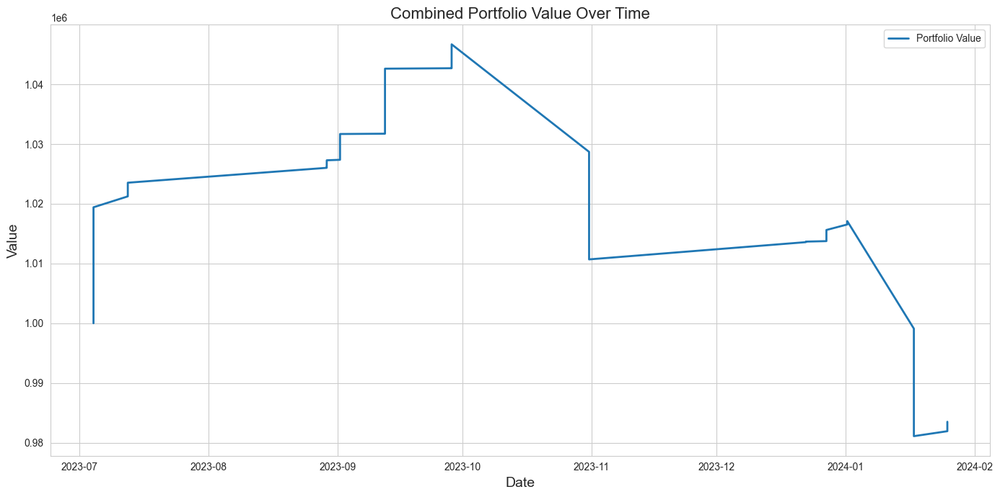

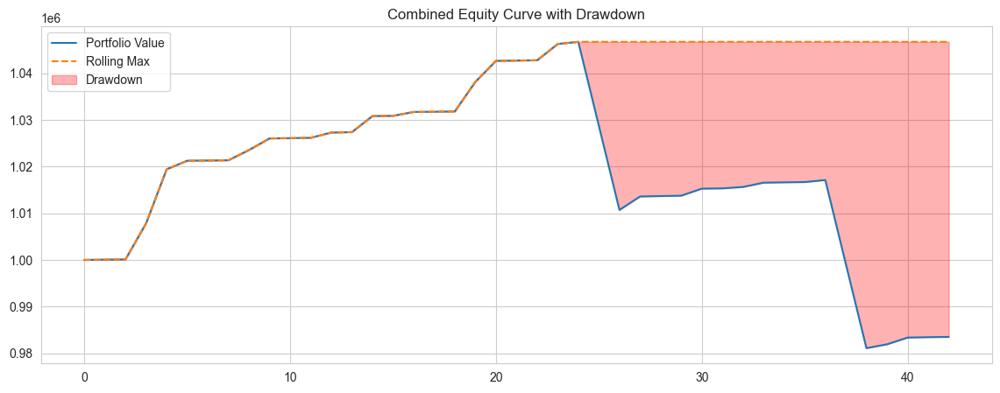

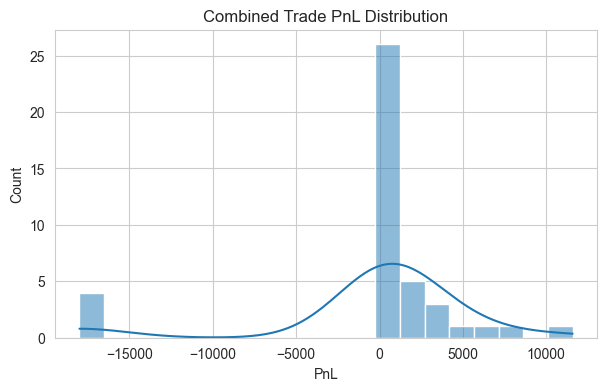

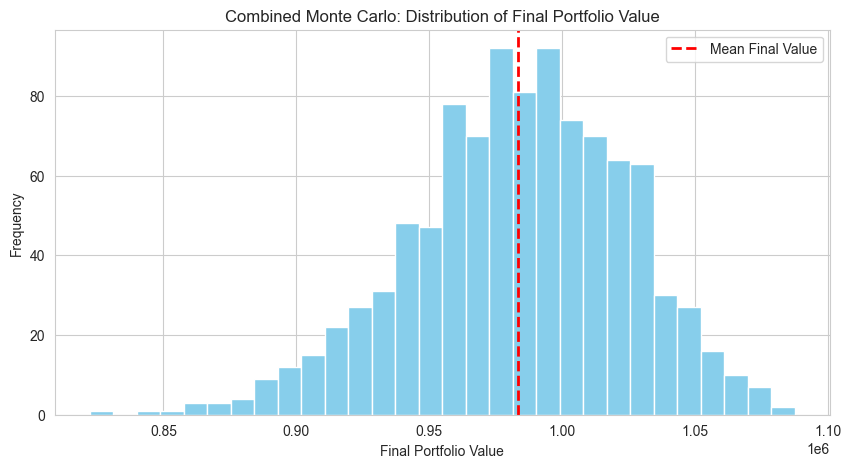

Monte Carlo: Mean Final Value = 983,491.82, 5th Percentile = 911,415.39, 95th Percentile = 1,045,705.33

=== Processing chunk 5: 2024-02-01 09:15:00+05:30 to 2024-04-01 09:14:00+05:30 ===


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\3384581208.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(
C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\3384581208.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(



===== CUMULATIVE REPORT AFTER CHUNK 5 =====

Combined Strategy Performance Report:
-----------------------------
Initial Capital:    1,000,000.00
Final Portfolio:    1,015,170.80
Total Return:       1.52%
Max Drawdown:       62,663.27
Sharpe Ratio:       0.67
Sortino Ratio:      10.85
Calmar Ratio:       0.36
Total Trades:       58
Winning Trades:     50
Losing Trades:      8
Avg PnL:            261.57
Best Trade:         11,583.00
Worst Trade:        -18,000.00
Trade Period:       2023-07-04 to 2024-03-07



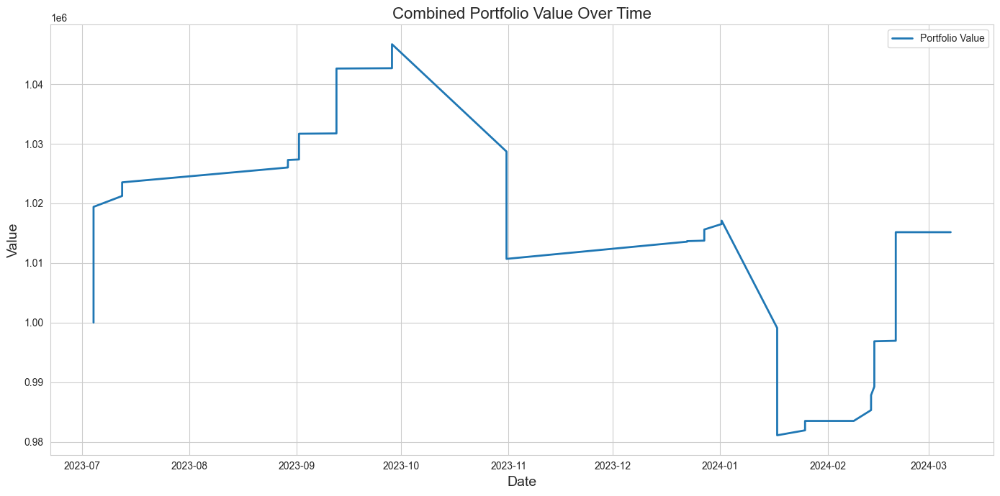

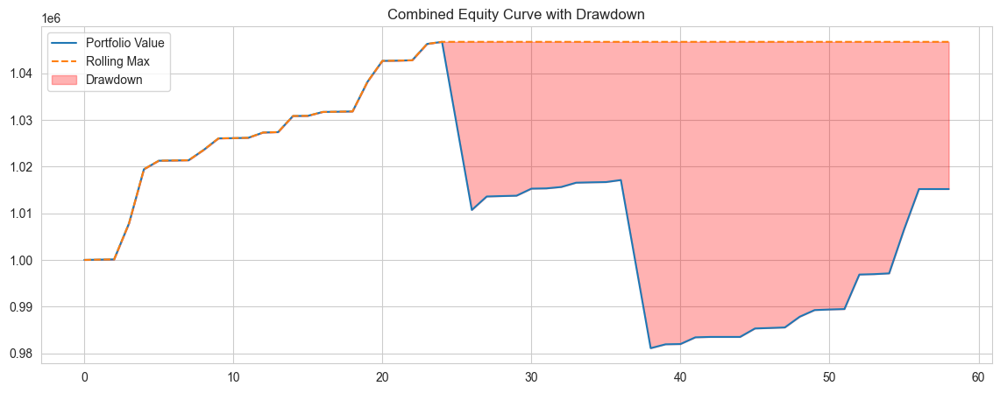

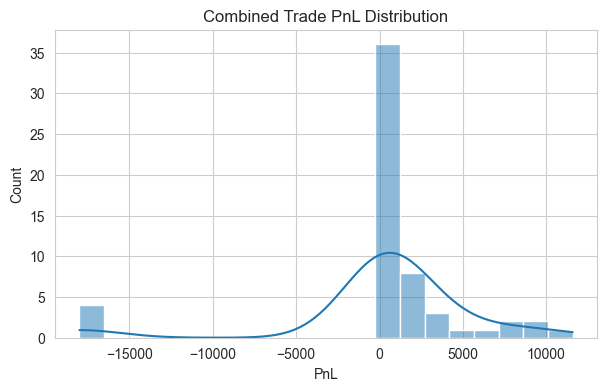

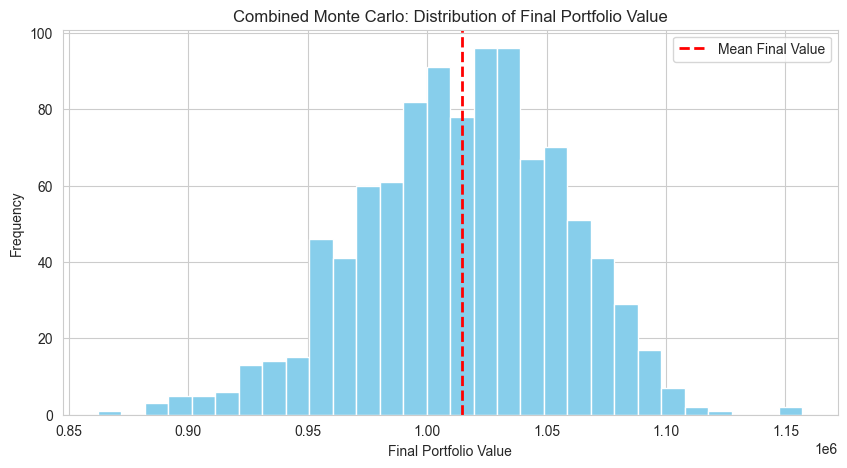

Monte Carlo: Mean Final Value = 1,014,580.46, 5th Percentile = 943,899.84, 95th Percentile = 1,079,345.93

=== Processing chunk 6: 2024-04-01 09:15:00+05:30 to 2024-06-01 09:14:00+05:30 ===


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\3384581208.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(
C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\3384581208.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(



===== CUMULATIVE REPORT AFTER CHUNK 6 =====

Combined Strategy Performance Report:
-----------------------------
Initial Capital:    1,000,000.00
Final Portfolio:    1,113,320.75
Total Return:       11.33%
Max Drawdown:       62,663.27
Sharpe Ratio:       3.00
Sortino Ratio:      66.43
Calmar Ratio:       2.10
Total Trades:       74
Winning Trades:     66
Losing Trades:      8
Avg PnL:            1,531.36
Best Trade:         42,052.00
Worst Trade:        -18,000.00
Trade Period:       2023-07-04 to 2024-05-16



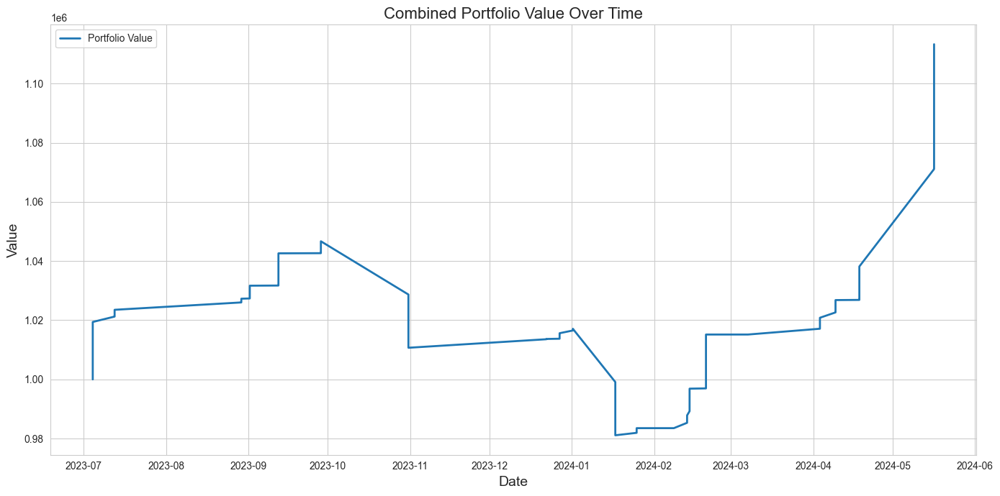

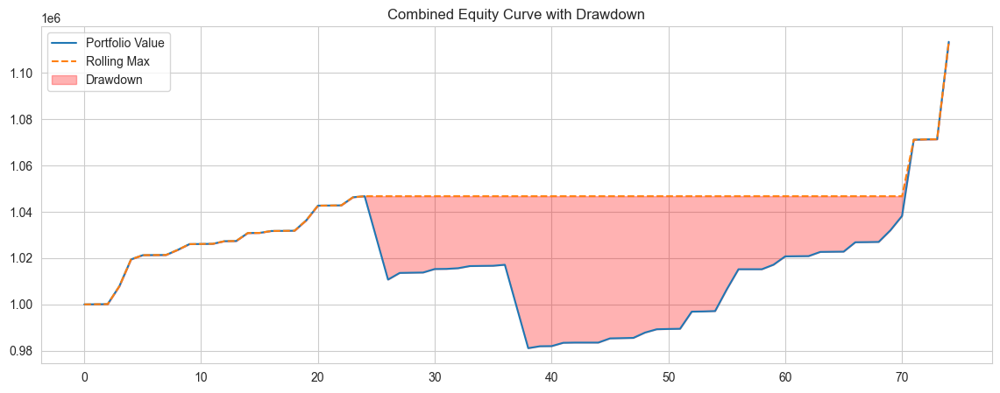

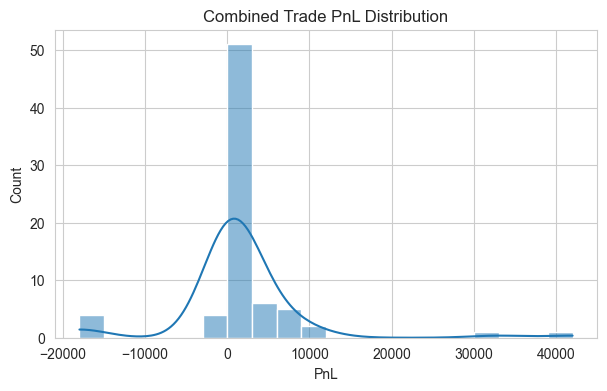

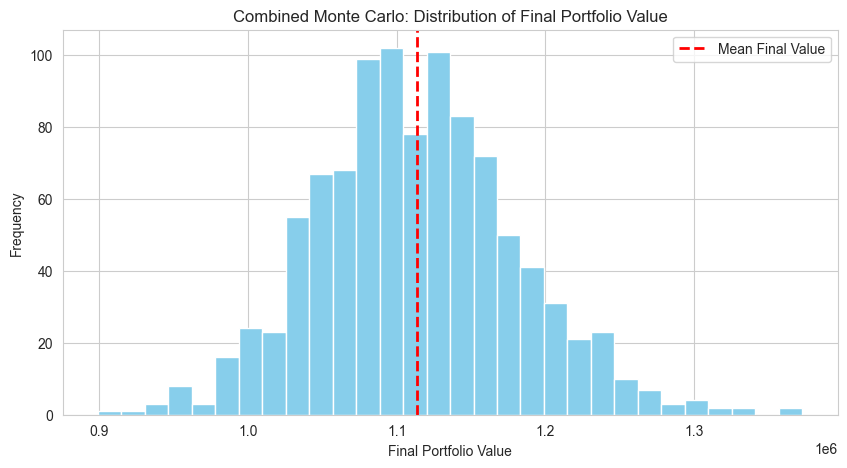

Monte Carlo: Mean Final Value = 1,113,483.43, 5th Percentile = 1,006,685.77, 95th Percentile = 1,234,463.52

=== Processing chunk 7: 2024-06-01 09:15:00+05:30 to 2024-08-01 09:14:00+05:30 ===


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\3384581208.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(
C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\3384581208.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(



===== CUMULATIVE REPORT AFTER CHUNK 7 =====

Combined Strategy Performance Report:
-----------------------------
Initial Capital:    1,000,000.00
Final Portfolio:    1,115,897.30
Total Return:       11.59%
Max Drawdown:       62,663.27
Sharpe Ratio:       2.98
Sortino Ratio:      64.30
Calmar Ratio:       1.89
Total Trades:       78
Winning Trades:     70
Losing Trades:      8
Avg PnL:            1,485.86
Best Trade:         42,052.00
Worst Trade:        -18,000.00
Trade Period:       2023-07-04 to 2024-06-25



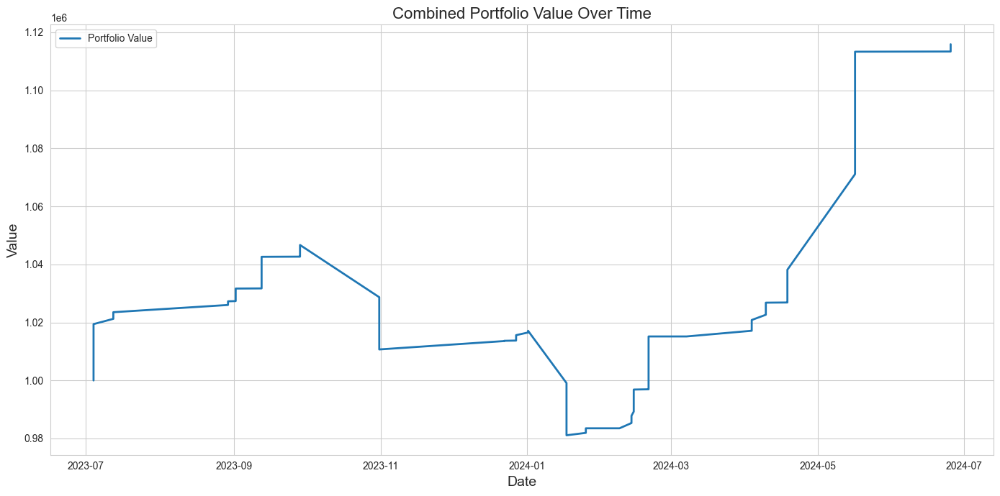

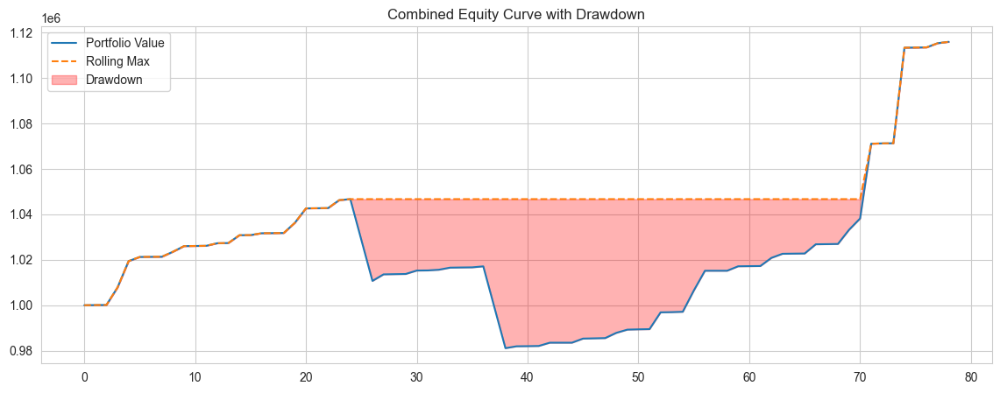

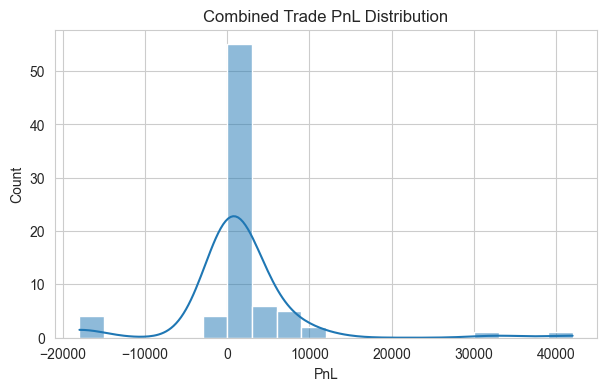

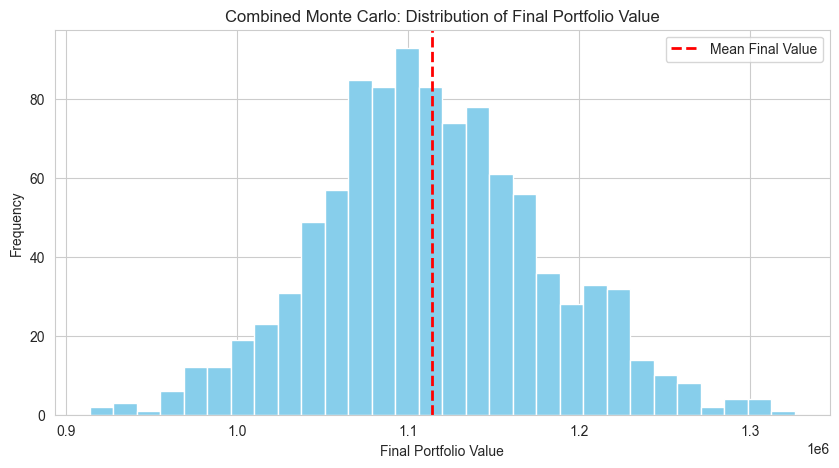

Monte Carlo: Mean Final Value = 1,114,104.68, 5th Percentile = 1,005,820.54, 95th Percentile = 1,226,820.17

=== Processing chunk 8: 2024-08-01 09:15:00+05:30 to 2024-10-01 09:14:00+05:30 ===


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\3384581208.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(
C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\3384581208.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(



===== CUMULATIVE REPORT AFTER CHUNK 8 =====

Combined Strategy Performance Report:
-----------------------------
Initial Capital:    1,000,000.00
Final Portfolio:    1,125,330.45
Total Return:       12.53%
Max Drawdown:       62,663.27
Sharpe Ratio:       2.84
Sortino Ratio:      54.77
Calmar Ratio:       1.64
Total Trades:       98
Winning Trades:     82
Losing Trades:      16
Avg PnL:            1,278.88
Best Trade:         42,052.00
Worst Trade:        -18,000.00
Trade Period:       2023-07-04 to 2024-09-17



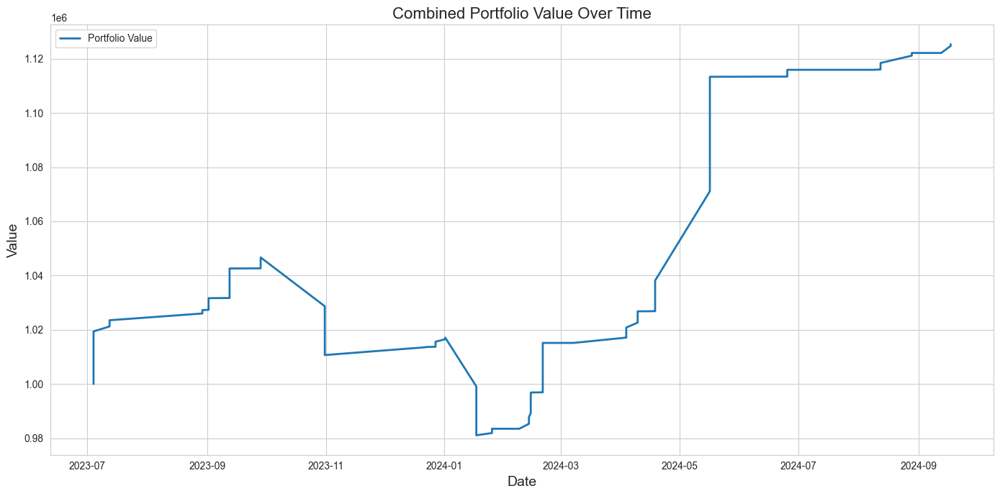

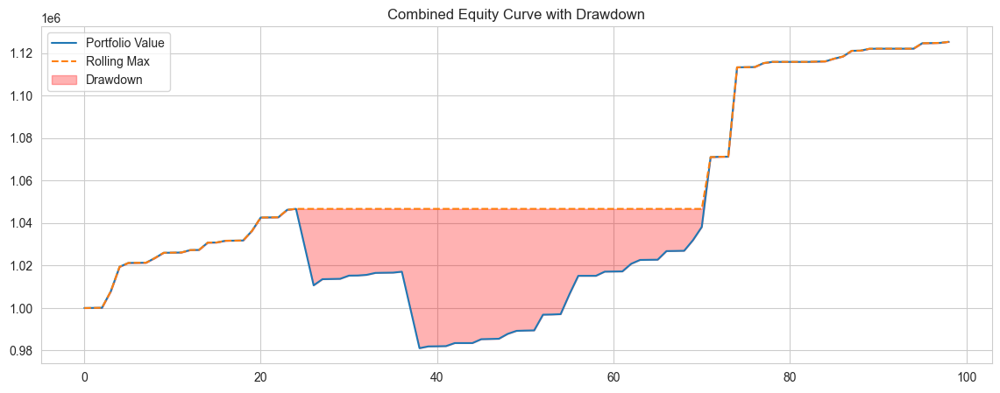

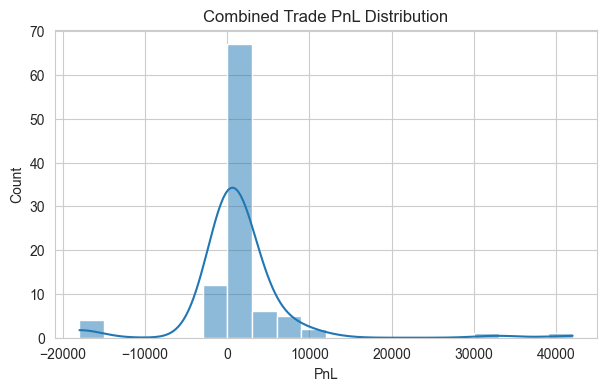

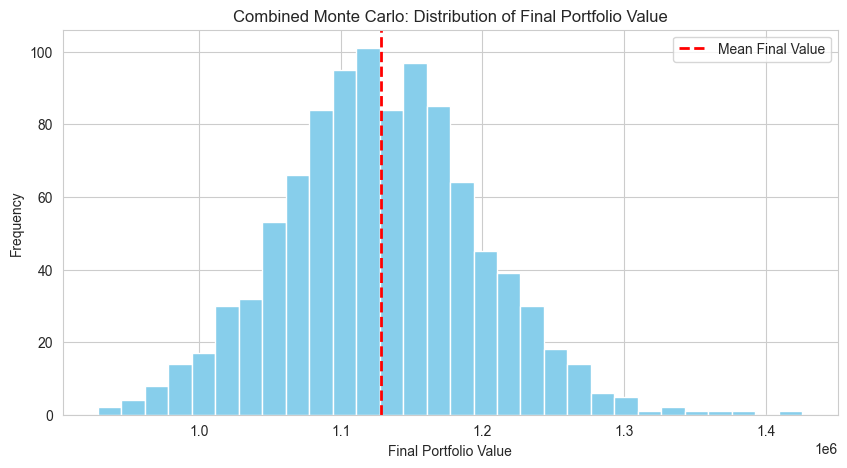

Monte Carlo: Mean Final Value = 1,128,495.29, 5th Percentile = 1,016,262.90, 95th Percentile = 1,241,925.33

=== Processing chunk 9: 2024-10-01 09:15:00+05:30 to 2024-12-01 09:14:00+05:30 ===


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\3384581208.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(
C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\3384581208.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(



===== CUMULATIVE REPORT AFTER CHUNK 9 =====

Combined Strategy Performance Report:
-----------------------------
Initial Capital:    1,000,000.00
Final Portfolio:    1,129,420.45
Total Return:       12.94%
Max Drawdown:       62,663.27
Sharpe Ratio:       2.86
Sortino Ratio:      54.19
Calmar Ratio:       1.45
Total Trades:       102
Winning Trades:     86
Losing Trades:      16
Avg PnL:            1,268.83
Best Trade:         42,052.00
Worst Trade:        -18,000.00
Trade Period:       2023-07-04 to 2024-11-26



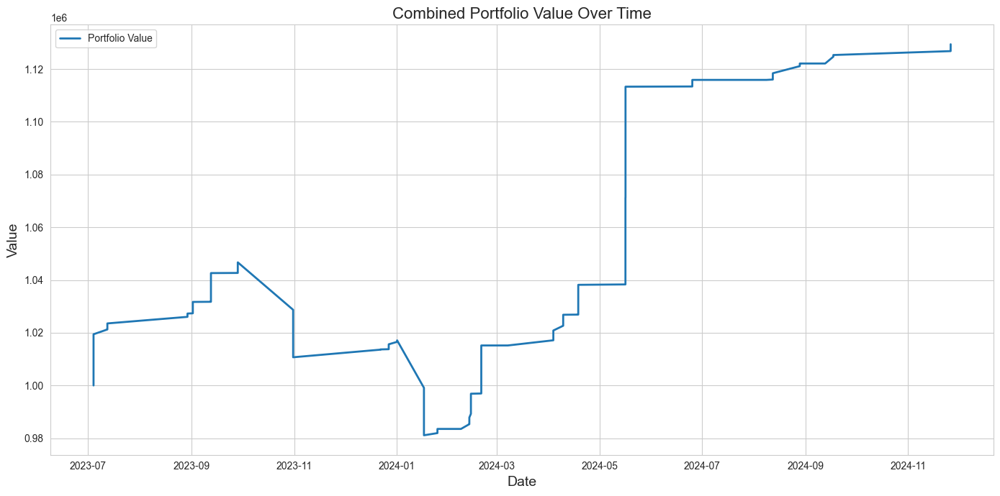

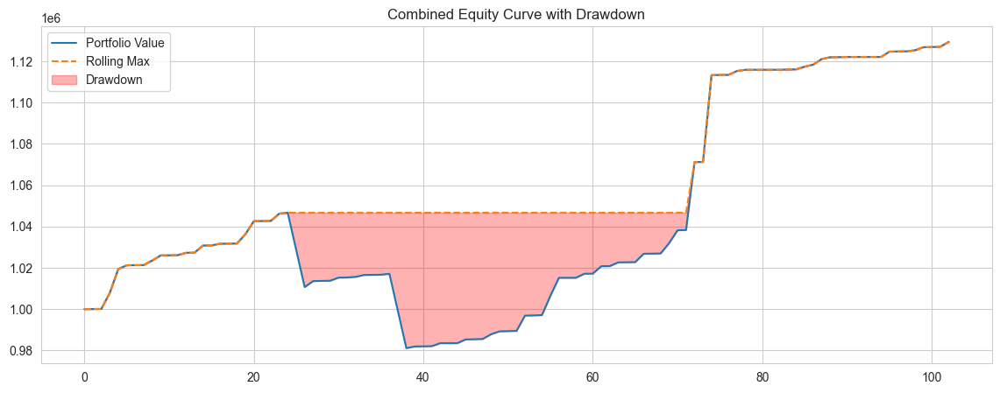

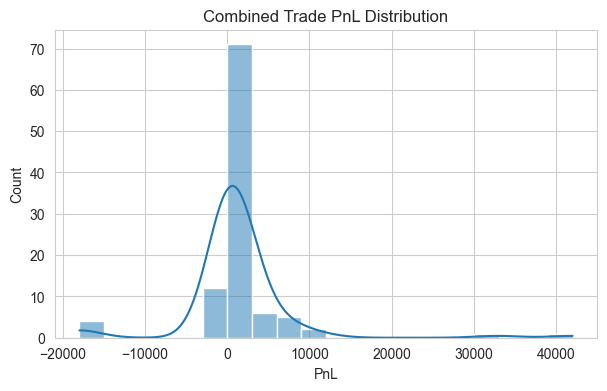

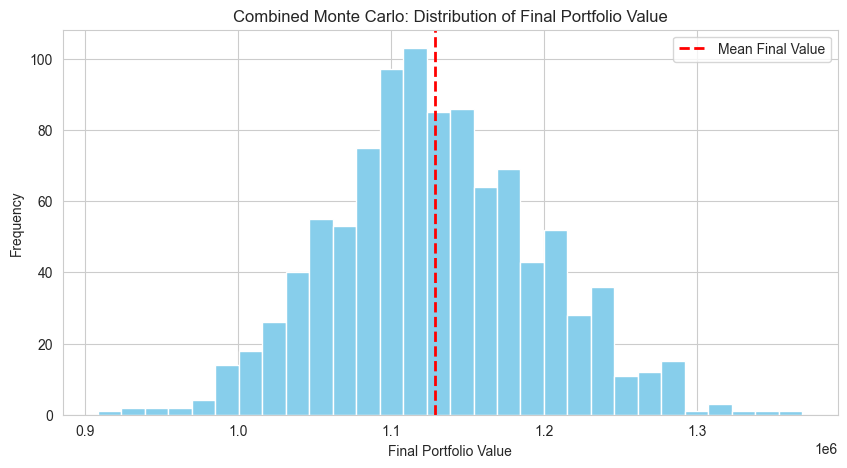

Monte Carlo: Mean Final Value = 1,128,958.89, 5th Percentile = 1,020,026.00, 95th Percentile = 1,243,088.06

=== Processing chunk 10: 2024-12-01 09:15:00+05:30 to 2025-01-16 15:30:00+05:30 ===


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\3384581208.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(
C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\3384581208.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(



===== CUMULATIVE REPORT AFTER CHUNK 10 =====

Combined Strategy Performance Report:
-----------------------------
Initial Capital:    1,000,000.00
Final Portfolio:    1,111,507.33
Total Return:       11.15%
Max Drawdown:       62,663.27
Sharpe Ratio:       2.34
Sortino Ratio:      19.19
Calmar Ratio:       1.14
Total Trades:       107
Winning Trades:     87
Losing Trades:      20
Avg PnL:            1,042.12
Best Trade:         42,052.00
Worst Trade:        -18,000.00
Trade Period:       2023-07-04 to 2025-01-15



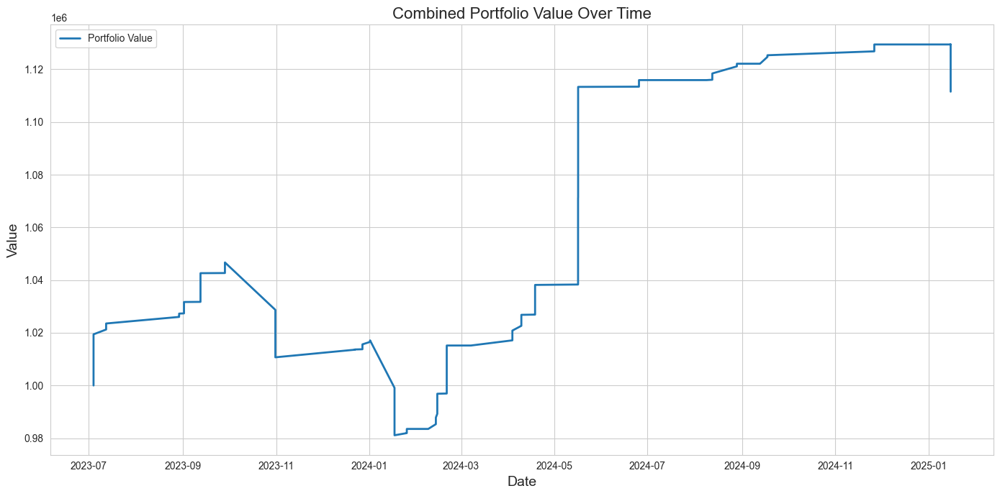

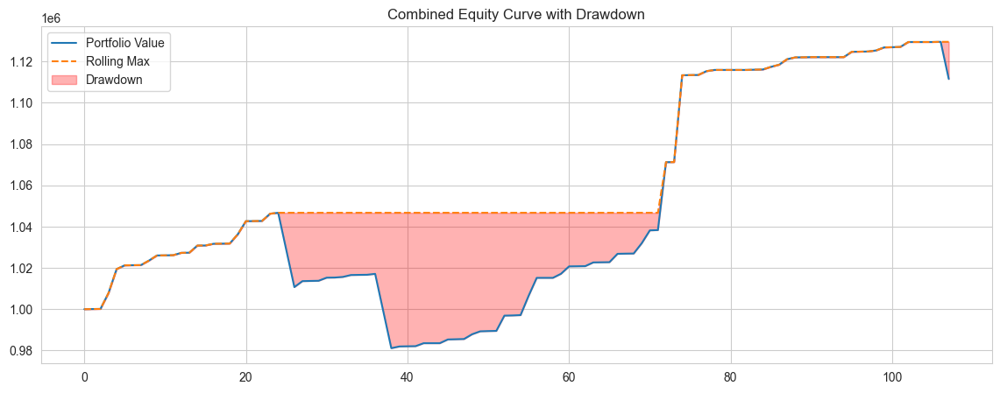

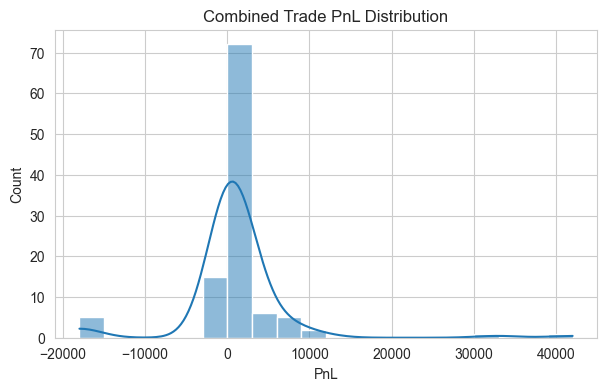

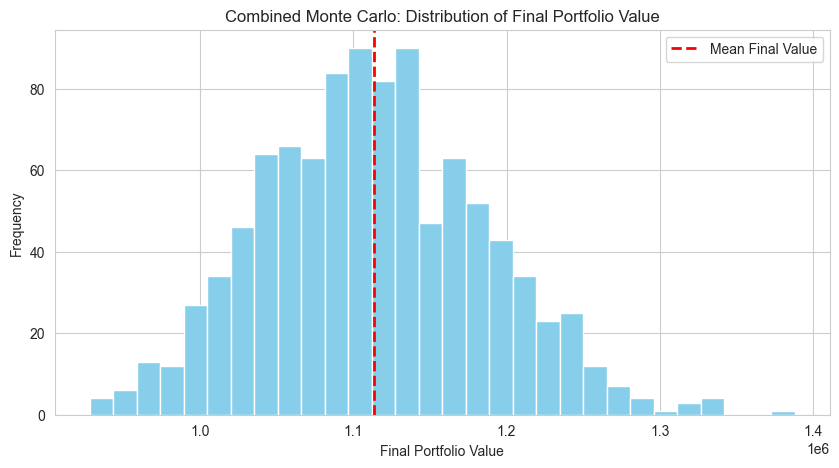

Monte Carlo: Mean Final Value = 1,113,633.62, 5th Percentile = 1,000,578.00, 95th Percentile = 1,239,694.70


In [6]:
import pandas as pd
import numpy as np
import os
from datetime import datetime, timedelta
import matplotlib.pyplot as plt
import seaborn as sns

# =========================
# CONFIGURATION
# =========================
initial_capital = 1000000
lot_size = 50
ATR_PERIOD = 10
ATR_MULTIPLIER = 2.5
BROKERAGE_PER_ORDER = 20
SLIPPAGE_PCT = 0.001
MARKET_CLOSE_TIME = '15:25:00'
VIX_LOW = 14
VIX_HIGH = 22
RISK_LOW = 0.15
RISK_MED = 0.10
RISK_HIGH = 0.05
CONFIRM_LOOKBACK = 10
MAX_LOSS = 18000
PARTIAL_BOOK_PCT = 0.2  # 20% position booked at first TP

# =========================
# DATA LOADING
# =========================
def load_spot(start_date, end_date):
    df = pd.read_csv(r"D:\Bits Hyderabad_Campus Diaries\PS-1\AlgoBulls\Options_Backtest_Local_Data\NIFTY_50_minute_data_Jun23_Feb25.csv", parse_dates=['date'])
    df = df.set_index('date')
    df.index = pd.to_datetime(df.index).tz_localize('Asia/Kolkata')
    df = df.loc[start_date:end_date]
    return df

def load_signals_15min():
    signals_path = r"D:\Bits Hyderabad_Campus Diaries\PS-1\AlgoBulls\Options_Backtest_Local_Data\Nifty_50_signals_15min_2023_25_50_200.csv"
    signals = pd.read_csv(signals_path, parse_dates=['date'])
    signals = signals.set_index('date')
    if signals.index.tz is None:
        signals.index = pd.to_datetime(signals.index).tz_localize('Asia/Kolkata')
    else:
        signals.index = signals.index.tz_convert('Asia/Kolkata')
    if 'Signal' not in signals.columns:
        signals.columns = ['Signal']
    return signals

def load_options_sample():
    sample_path = r"D:\Bits Hyderabad_Campus Diaries\PS-1\AlgoBulls\Options_Backtest_Local_Data\Jun23_Feb25_options_sample_ALL_EXPIRIES.csv"
    options_sample = pd.read_csv(sample_path)
    options_sample['TimeStamp'] = pd.to_datetime(options_sample['TimeStamp'])
    if options_sample['TimeStamp'].dt.tz is None:
        options_sample['TimeStamp'] = options_sample['TimeStamp'].dt.tz_localize('Asia/Kolkata')
    else:
        options_sample['TimeStamp'] = options_sample['TimeStamp'].dt.tz_convert('Asia/Kolkata')
    options_sample['Expiry'] = pd.to_datetime(options_sample['Expiry'])
    return options_sample

def load_vix(start_date, end_date):
    vix_path = r"D:\Bits Hyderabad_Campus Diaries\PS-1\AlgoBulls\Options_Backtest_Local_Data\filtered_INDIA_VIX_Jun23_Feb25.csv"
    vix = pd.read_csv(vix_path, parse_dates=['TimeStamp'])
    vix = vix.set_index('TimeStamp')
    vix.index = pd.to_datetime(vix.index).tz_localize('Asia/Kolkata')
    vix = vix.loc[start_date:end_date]
    return vix

# =========================
# ADAPTIVE VIX FILTER
# =========================
def adaptive_vix_trend_filter(vix_series, current_time, window=252, low_pct=0.2, high_pct=0.8):
    vix_hist = vix_series.loc[:current_time].tail(window)
    if len(vix_hist) < window // 2:
        return False
    low_thr = np.percentile(vix_hist, low_pct*100)
    high_thr = np.percentile(vix_hist, high_pct*100)
    curr_vix = vix_series.loc[current_time]
    return (curr_vix > low_thr) and (curr_vix < high_thr)

# =========================
# STRATEGY HELPERS
# =========================
def get_nearest_strike(strikes, target):
    return min(strikes, key=lambda x: abs(x - target))

def get_nearest_expiry(expiry_list, ts):
    future_expiries = [e for e in expiry_list if e >= ts.date()]
    return min(future_expiries) if future_expiries else None

def compute_atr_fixed(df, period=ATR_PERIOD):
    high = df['High']
    low = df['Low']
    close = df['Close']
    prev_close = close.shift(1)
    tr = pd.concat([high - low, (high - prev_close).abs(), (low - prev_close).abs()], axis=1).max(axis=1)
    atr = tr.rolling(window=period, min_periods=1).mean()
    return atr

def assign_atr(options_data):
    atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(
        lambda x: compute_atr_fixed(x[['High', 'Low', 'Close']], ATR_PERIOD)
    )
    options_data.loc[atr_values.index, 'ATR'] = atr_values
    return options_data

def get_risk_per_trade(vix_value):
    if vix_value <= 14:
        return 0.20
    elif vix_value <= VIX_LOW:
        return RISK_LOW
    elif vix_value <= VIX_HIGH:
        return RISK_MED
    else:
        return RISK_HIGH

def price_breakout_confirmation(spot_data, ts, direction, lookback=CONFIRM_LOOKBACK, sma_period=21):
    window = spot_data.loc[:ts].iloc[-lookback:]
    if len(window) < lookback:
        return False
    last_close = window['close'].iloc[-1]
    mean_high = window['high'][:-1].mean()
    mean_low = window['low'][:-1].mean()
    sma21 = window['close'].rolling(window=sma_period, min_periods=1).mean().iloc[-1]
    if direction == 1:
        return last_close > mean_high and last_close > sma21
    elif direction == -1:
        return last_close < mean_low and last_close < sma21
    return False

def trend_filter(spot_data, ts, direction, sma_period=50):
    window = spot_data.loc[:ts].iloc[-sma_period:]
    if len(window) < sma_period:
        return False
    last_close = window['close'].iloc[-1]
    sma = window['close'].mean()
    if direction == 1:
        return last_close > sma
    elif direction == -1:
        return last_close < sma
    return False

def get_dynamic_tp(vix_val):
    if vix_val <= VIX_LOW + 1:
        return 0.15
    elif vix_val <= VIX_HIGH - 1:
        return 0.25
    else:
        return 0.35

# =========================
# SELL-SIDE STRATEGY (CREDIT SPREADS)
# =========================
# (same as before, omitted for brevity)

# =========================
# BUY-SIDE STRATEGY (DEBIT SPREADS)
# =========================
# (same as before, omitted for brevity)

# =========================
# PER-CHUNK REPORT (WITH HEATMAP)
# =========================
def strategy_report_and_visualizations(trade_log_df, initial_capital, title_prefix=""):
    # ... your existing reporting code, including the heatmap ...
    pass

# =========================
# COMBINED CUMULATIVE REPORT (NO HEATMAP)
# =========================
def combined_cumulative_report_and_visualizations(sell_log_df, buy_log_df, initial_capital):
    combined_df = pd.concat([sell_log_df, buy_log_df], ignore_index=True)
    if combined_df.empty:
        print("No trades to report in combined logs.")
        return
    combined_df = combined_df.sort_values('exit_date')
    portfolio_values = [initial_capital]
    portfolio_dates = [combined_df['entry_date'].min()]
    current_value = initial_capital
    for i, row in combined_df.iterrows():
        current_value += row['exit_pnl']
        portfolio_values.append(current_value)
        portfolio_dates.append(row['exit_date'])
    returns = pd.Series(portfolio_values).pct_change().dropna()
    rf = 0.01
    sharpe = ((returns.mean() - rf/252) / returns.std()) * np.sqrt(252) if returns.std() > 0 else 0
    downside_std = returns[returns < 0].std()
    sortino = ((returns.mean() - rf/252) / downside_std) * np.sqrt(252) if downside_std > 0 else 0
    cumulative = pd.Series(portfolio_values)
    rolling_max = cumulative.cummax()
    drawdown = (cumulative - rolling_max) / rolling_max
    max_drawdown = abs(drawdown.min()) * initial_capital
    years = (portfolio_dates[-1] - portfolio_dates[0]).days / 365.25
    cagr = (portfolio_values[-1]/portfolio_values[0])**(1/years) - 1 if years > 0 else 0
    calmar = cagr / abs(drawdown.min()) if drawdown.min() != 0 else 0
    print(f"""
Combined Strategy Performance Report:
-----------------------------
Initial Capital:    {initial_capital:,.2f}
Final Portfolio:    {portfolio_values[-1]:,.2f}
Total Return:       {(portfolio_values[-1]/initial_capital-1)*100:.2f}%
Max Drawdown:       {max_drawdown:,.2f}
Sharpe Ratio:       {sharpe:.2f}
Sortino Ratio:      {sortino:.2f}
Calmar Ratio:       {calmar:.2f}
Total Trades:       {len(combined_df)}
Winning Trades:     {(combined_df['exit_pnl'] > 0).sum()}
Losing Trades:      {(combined_df['exit_pnl'] <= 0).sum()}
Avg PnL:            {combined_df['exit_pnl'].mean():,.2f}
Best Trade:         {combined_df['exit_pnl'].max():,.2f}
Worst Trade:        {combined_df['exit_pnl'].min():,.2f}
Trade Period:       {combined_df['entry_date'].min().date()} to {combined_df['exit_date'].max().date()}
""")
    sns.set_style("whitegrid")
    plt.figure(figsize=(14, 7))
    plt.plot(portfolio_dates, portfolio_values, label='Portfolio Value', linewidth=2)
    plt.title('Combined Portfolio Value Over Time', fontsize=16)
    plt.ylabel('Value', fontsize=14)
    plt.xlabel('Date', fontsize=14)
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()
    plt.figure(figsize=(14, 5))
    plt.plot(cumulative, label='Portfolio Value')
    plt.plot(rolling_max, '--', label='Rolling Max')
    plt.fill_between(cumulative.index, cumulative, rolling_max, color='red', alpha=0.3, label='Drawdown')
    plt.title('Combined Equity Curve with Drawdown')
    plt.legend()
    plt.show()
    plt.figure(figsize=(7, 4))
    sns.histplot(combined_df['exit_pnl'], bins=20, kde=True)
    plt.title('Combined Trade PnL Distribution')
    plt.xlabel('PnL')
    plt.ylabel('Count')
    plt.show()
    n_sim = 1000
    sim_length = len(combined_df)
    sim_results = []
    for _ in range(n_sim):
        sim_pnls = np.random.choice(combined_df['exit_pnl'], size=sim_length, replace=True)
        sim_curve = np.cumsum(np.insert(sim_pnls, 0, initial_capital))
        sim_results.append(sim_curve[-1])
    plt.figure(figsize=(10, 5))
    plt.hist(sim_results, bins=30, color='skyblue')
    plt.axvline(np.mean(sim_results), color='red', linestyle='dashed', linewidth=2, label='Mean Final Value')
    plt.title('Combined Monte Carlo: Distribution of Final Portfolio Value')
    plt.xlabel('Final Portfolio Value')
    plt.ylabel('Frequency')
    plt.legend()
    plt.show()
    print(f"Monte Carlo: Mean Final Value = {np.mean(sim_results):,.2f}, 5th Percentile = {np.percentile(sim_results, 5):,.2f}, 95th Percentile = {np.percentile(sim_results, 95):,.2f}")

# =========================
# MAIN CHUNKED BACKTEST LOOP
# =========================
signals = load_signals_15min()
options_sample = load_options_sample()
start_date = pd.Timestamp('2023-06-01 09:15:00', tz='Asia/Kolkata')
final_end_date = pd.Timestamp('2025-01-16 15:30:00', tz='Asia/Kolkata')
chunk_length = pd.DateOffset(months=2)
chunk_idx = 1
current_start = start_date
all_sell_logs = []
all_buy_logs = []
while current_start < final_end_date:
    current_end = min(current_start + chunk_length - pd.Timedelta(minutes=1), final_end_date)
    print(f"\n=== Processing chunk {chunk_idx}: {current_start} to {current_end} ===")
    spot_data = load_spot(current_start, current_end)
    vix_data = load_vix(current_start, current_end)
    chunk_signals = signals.loc[(signals.index >= current_start) & (signals.index <= current_end)]
    chunk_options = options_sample[
        (options_sample['TimeStamp'] >= current_start) &
        (options_sample['TimeStamp'] <= current_end)
    ]
    if spot_data.empty or vix_data.empty or chunk_signals.empty or chunk_options.empty:
        print(f"Chunk {chunk_idx} skipped due to missing data.")
        current_start = current_end + pd.Timedelta(minutes=1)
        chunk_idx += 1
        continue
    # SELL SIDE
    sell_log, sell_brokerage, sell_slippage = execute_sell_side(spot_data, chunk_signals, chunk_options.copy(), vix_data)
    sell_log_df = pd.DataFrame(sell_log)
    if not sell_log_df.empty:
        all_sell_logs.append(sell_log_df)
        strategy_report_and_visualizations(sell_log_df, initial_capital, title_prefix=f"Sell-Side Chunk {chunk_idx}")
    else:
        print(f"No sell-side trades in chunk {chunk_idx}")
    # BUY SIDE
    buy_log, buy_brokerage, buy_slippage = execute_buy_side(spot_data, chunk_signals, chunk_options.copy(), vix_data)
    buy_log_df = pd.DataFrame(buy_log)
    if not buy_log_df.empty:
        all_buy_logs.append(buy_log_df)
        strategy_report_and_visualizations(buy_log_df, initial_capital, title_prefix=f"Buy-Side Chunk {chunk_idx}")
    else:
        print(f"No buy-side trades in chunk {chunk_idx}")
    # CUMULATIVE REPORT AFTER EACH CHUNK (combined)
    if all_sell_logs or all_buy_logs:
        cumulative_sell_log = pd.concat(all_sell_logs, ignore_index=True) if all_sell_logs else pd.DataFrame()
        cumulative_buy_log = pd.concat(all_buy_logs, ignore_index=True) if all_buy_logs else pd.DataFrame()
        print(f"\n===== CUMULATIVE REPORT AFTER CHUNK {chunk_idx} =====")
        combined_cumulative_report_and_visualizations(cumulative_sell_log, cumulative_buy_log, initial_capital)
    current_start = current_end + pd.Timedelta(minutes=1)
    chunk_idx += 1



=== Processing chunk 1: 2023-06-01 09:15:00+05:30 to 2023-08-01 09:14:00+05:30 ===


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\958104352.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(



Sell-Side Chunk 1 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹1,016,075.00
Total Return:       1.61%
Max Drawdown:       ₹0.00
Sharpe Ratio:       9.43
Sortino Ratio:      0.00
Calmar Ratio:       0.00

Trade Statistics:
-----------------
Total Trades:       6
Winning Trades:     6
Losing Trades:      0
Avg PnL:            ₹2,679.17
Best Trade:         ₹11,448.00
Worst Trade:        ₹43.88
Trade Period:       2023-07-04 to 2023-07-26



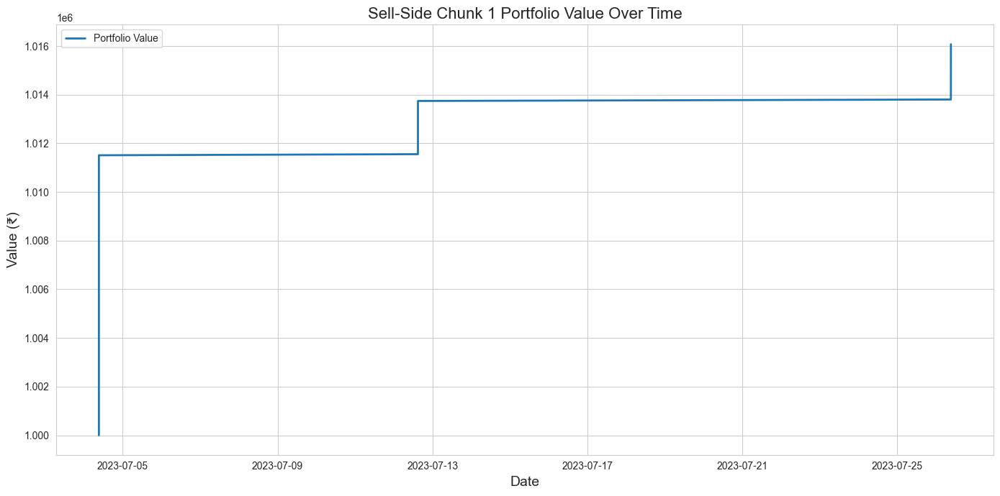

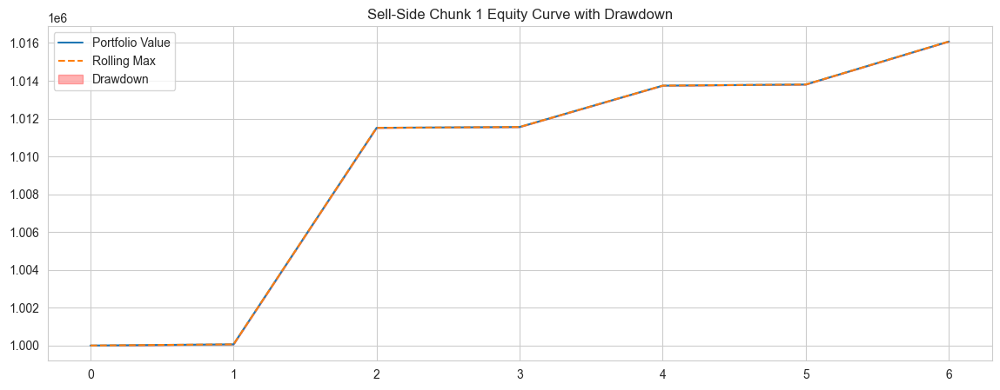

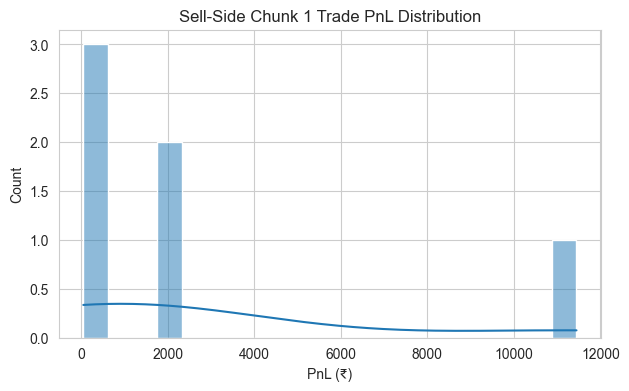

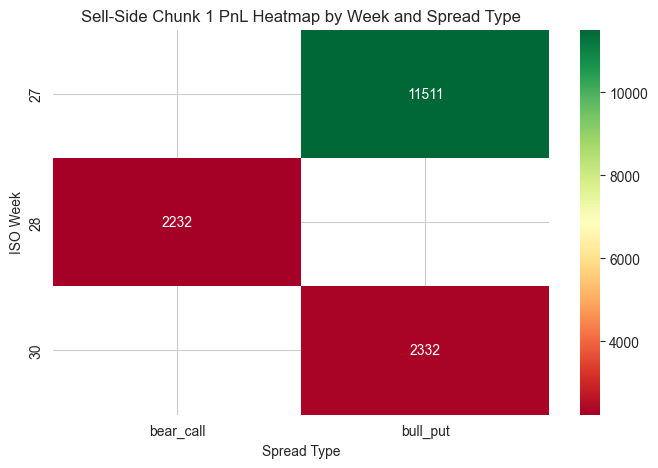

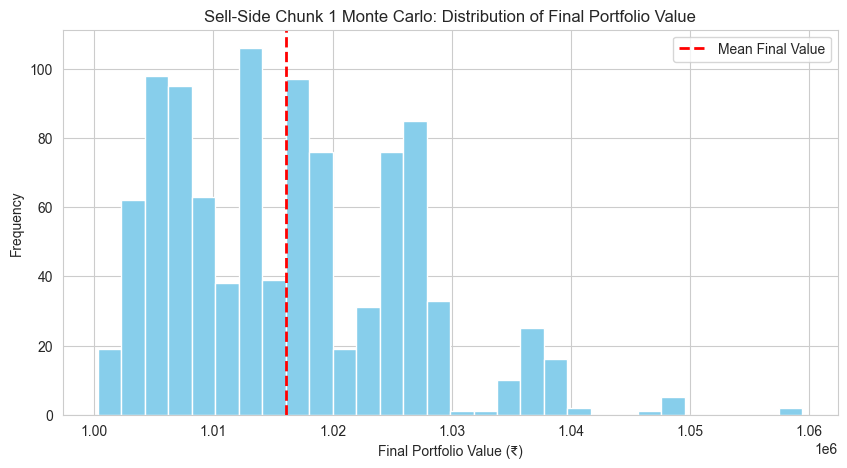

Monte Carlo: Mean Final Value = ₹1,016,102.85, 5th Percentile = ₹1,002,526.62, 95th Percentile = ₹1,036,620.66


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\958104352.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(



Buy-Side Chunk 1 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹1,005,940.00
Total Return:       0.59%
Max Drawdown:       ₹0.00
Sharpe Ratio:       14.62
Sortino Ratio:      0.00
Calmar Ratio:       0.00

Trade Statistics:
-----------------
Total Trades:       6
Winning Trades:     6
Losing Trades:      0
Avg PnL:            ₹990.00
Best Trade:         ₹2,217.60
Worst Trade:        ₹53.70
Trade Period:       2023-07-04 to 2023-07-26



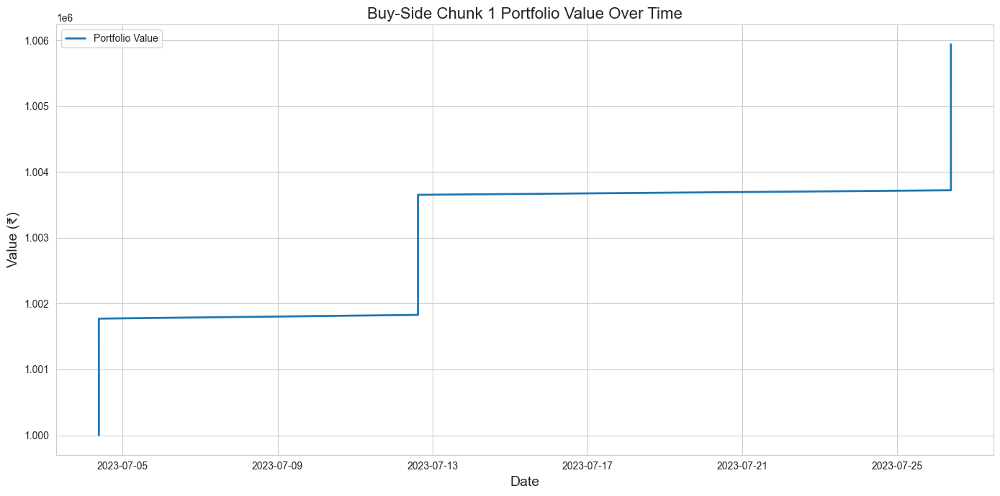

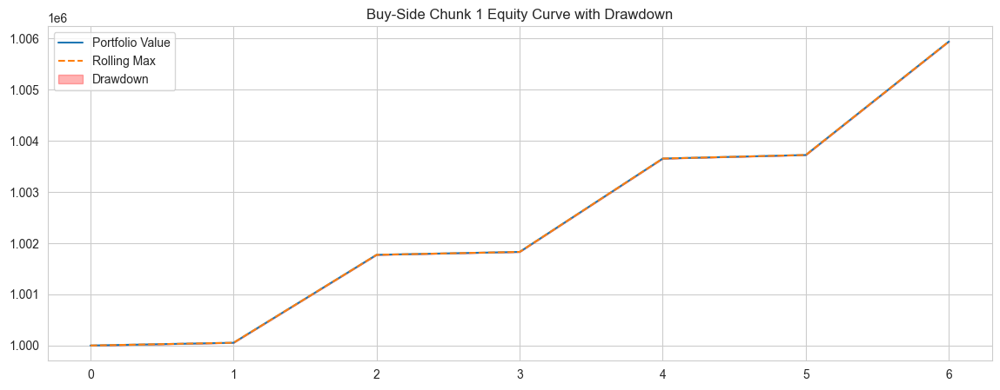

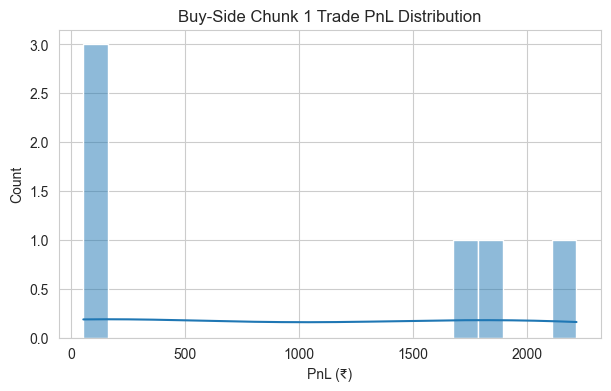

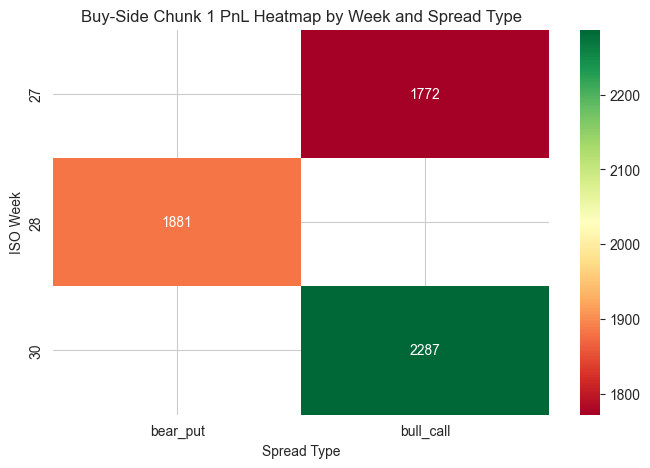

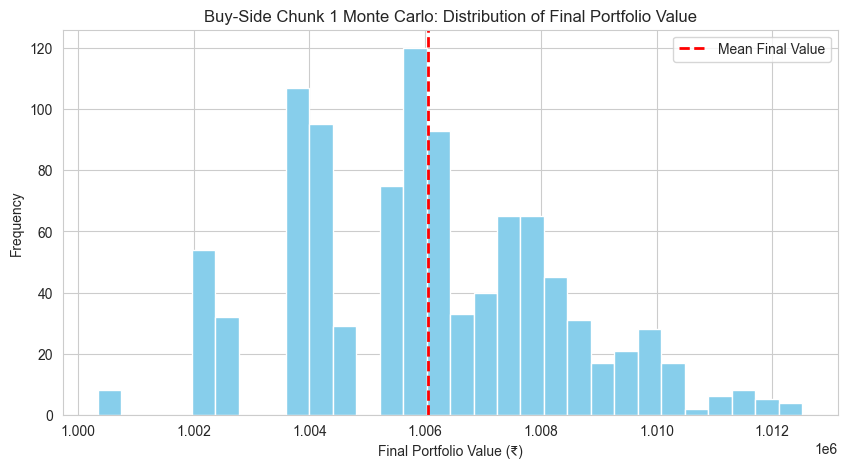

Monte Carlo: Mean Final Value = ₹1,006,056.95, 5th Percentile = ₹1,002,133.60, 95th Percentile = ₹1,009,859.21

===== CUMULATIVE REPORT AFTER CHUNK 1 =====

Combined Strategy Performance Report:
-----------------------------
Initial Capital:    1,000,000.00
Final Portfolio:    1,022,015.00
Total Return:       2.20%
Max Drawdown:       0.00
Sharpe Ratio:       8.89
Sortino Ratio:      0.00
Calmar Ratio:       0.00
Total Trades:       12
Winning Trades:     12
Losing Trades:      0
Avg PnL:            1,834.58
Best Trade:         11,448.00
Worst Trade:        43.88
Trade Period:       2023-07-04 to 2023-07-26



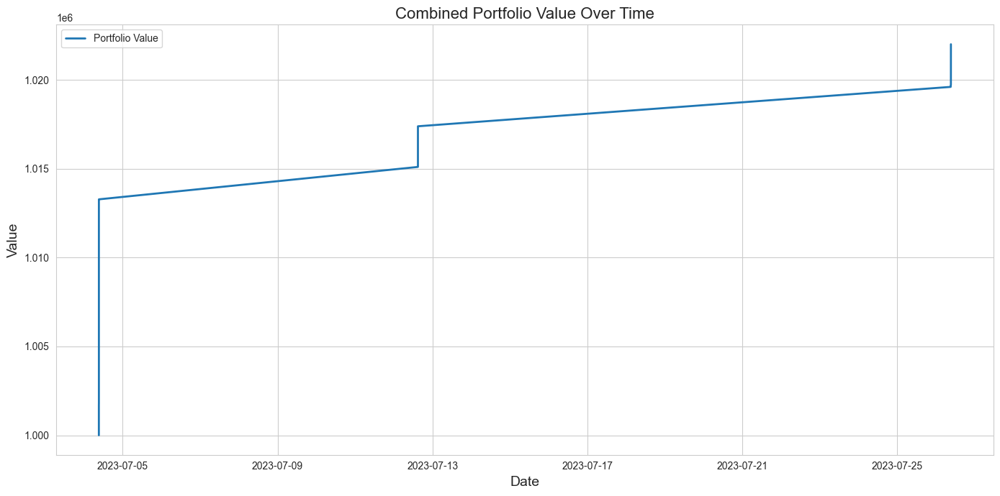

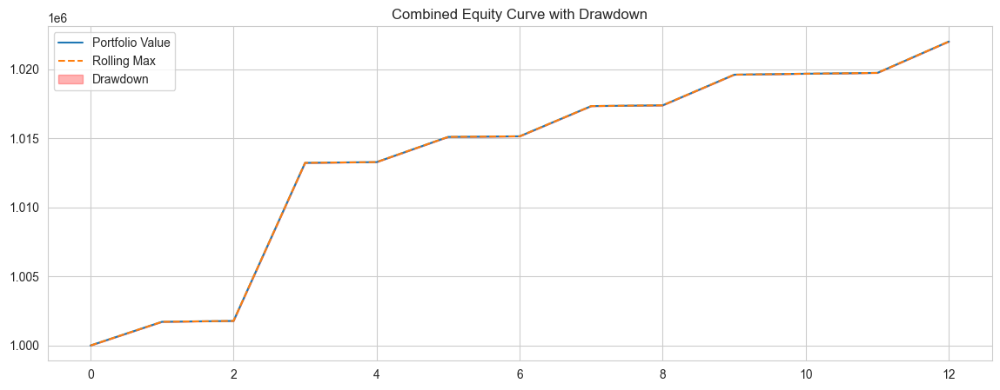

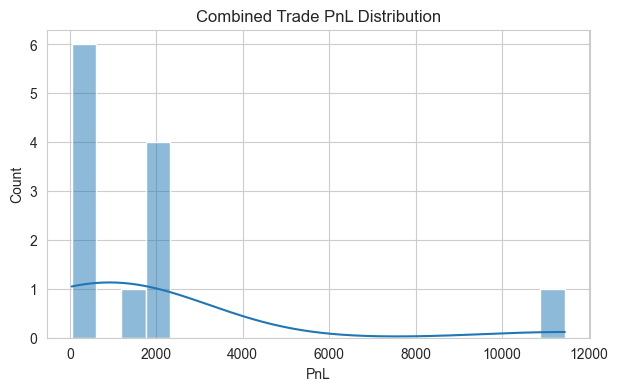

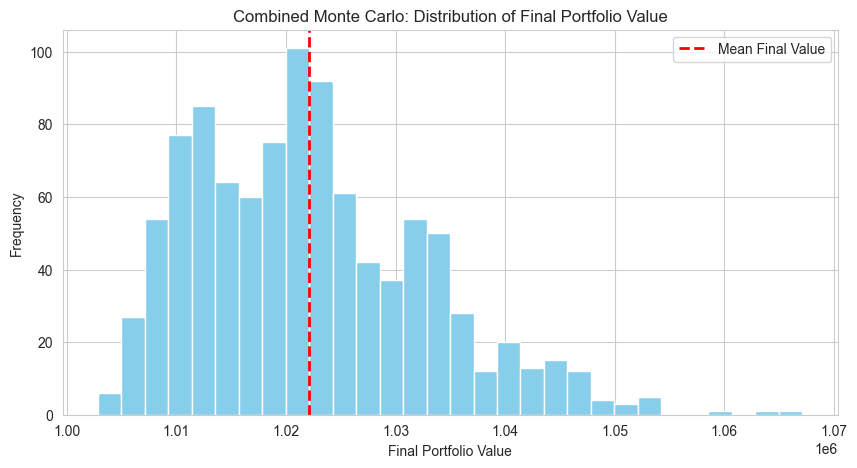

Monte Carlo: Mean Final Value = 1,022,131.75, 5th Percentile = 1,008,309.85, 95th Percentile = 1,042,631.31


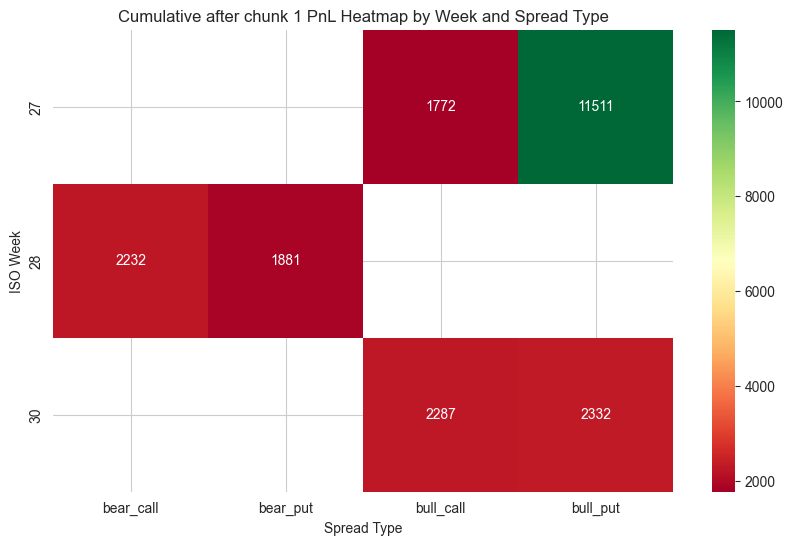


=== Processing chunk 2: 2023-08-01 09:15:00+05:30 to 2023-10-01 09:14:00+05:30 ===


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\958104352.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(



Sell-Side Chunk 2 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹991,271.15
Total Return:       -0.87%
Max Drawdown:       ₹17,998.50
Sharpe Ratio:       -2.14
Sortino Ratio:      0.00
Calmar Ratio:       -8.68

Trade Statistics:
-----------------
Total Trades:       12
Winning Trades:     11
Losing Trades:      1
Avg PnL:            ₹-727.40
Best Trade:         ₹4,327.40
Worst Trade:        ₹-18,000.00
Trade Period:       2023-08-25 to 2023-09-28



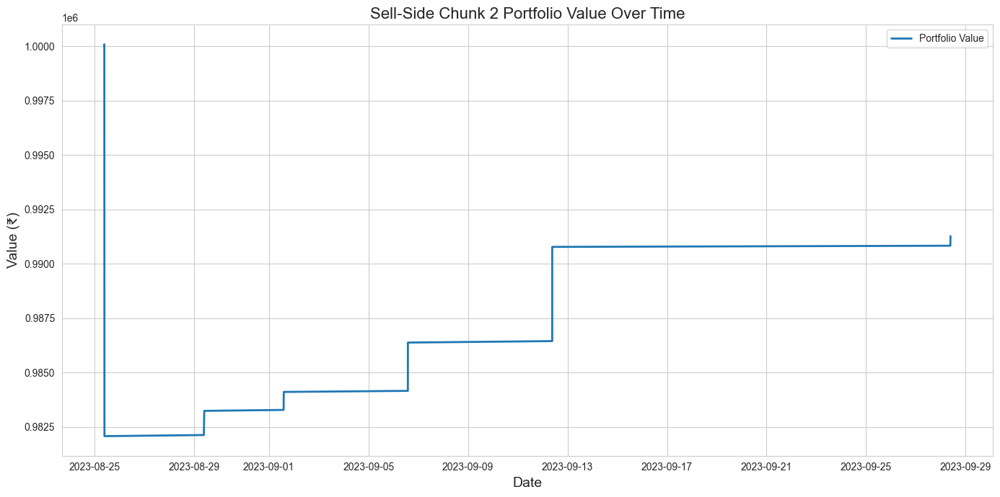

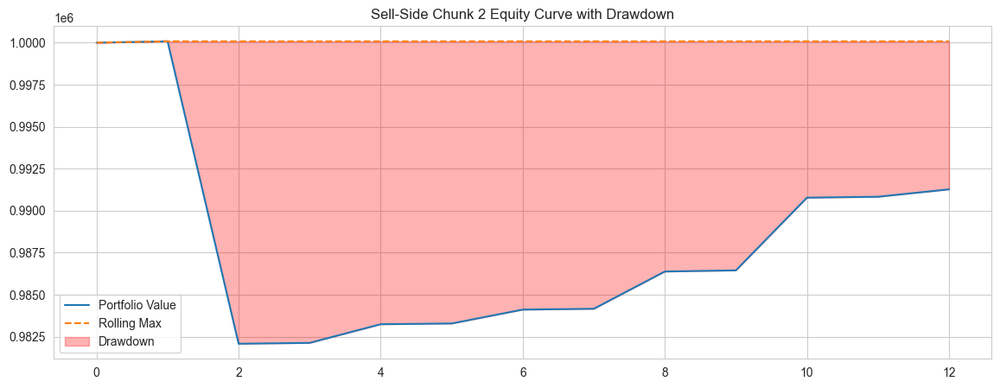

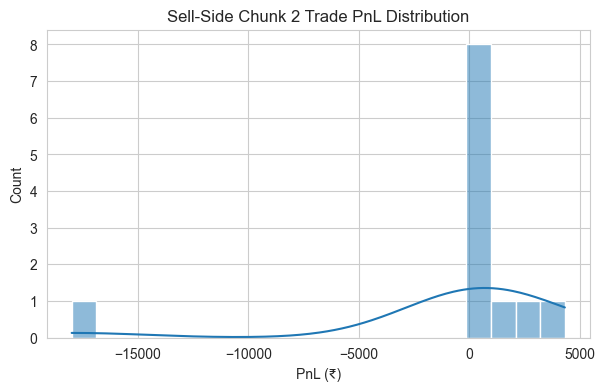

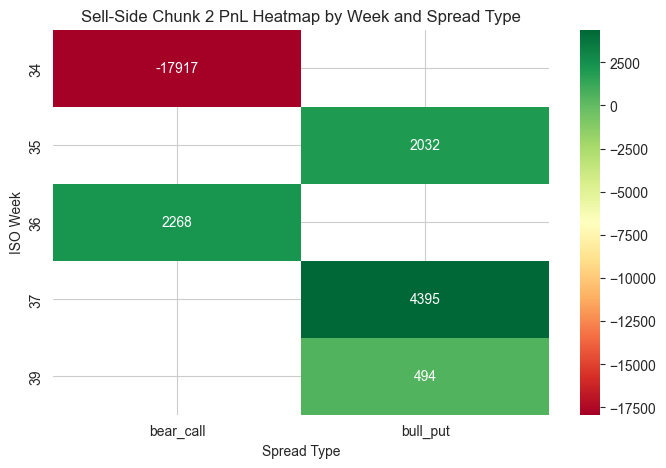

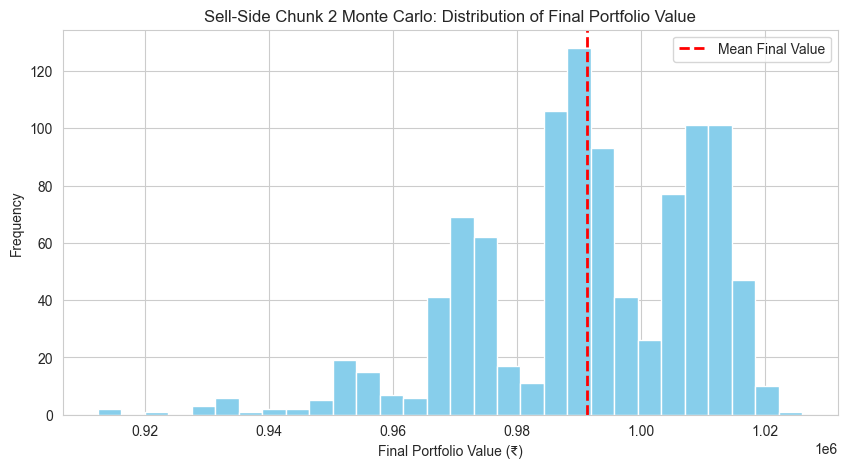

Monte Carlo: Mean Final Value = ₹991,289.14, 5th Percentile = ₹956,438.63, 95th Percentile = ₹1,015,154.44


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\958104352.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(



Buy-Side Chunk 2 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹1,019,160.95
Total Return:       1.92%
Max Drawdown:       ₹0.00
Sharpe Ratio:       12.56
Sortino Ratio:      0.00
Calmar Ratio:       0.00

Trade Statistics:
-----------------
Total Trades:       12
Winning Trades:     12
Losing Trades:      0
Avg PnL:            ₹1,596.75
Best Trade:         ₹6,337.60
Worst Trade:        ₹40.95
Trade Period:       2023-08-25 to 2023-09-28



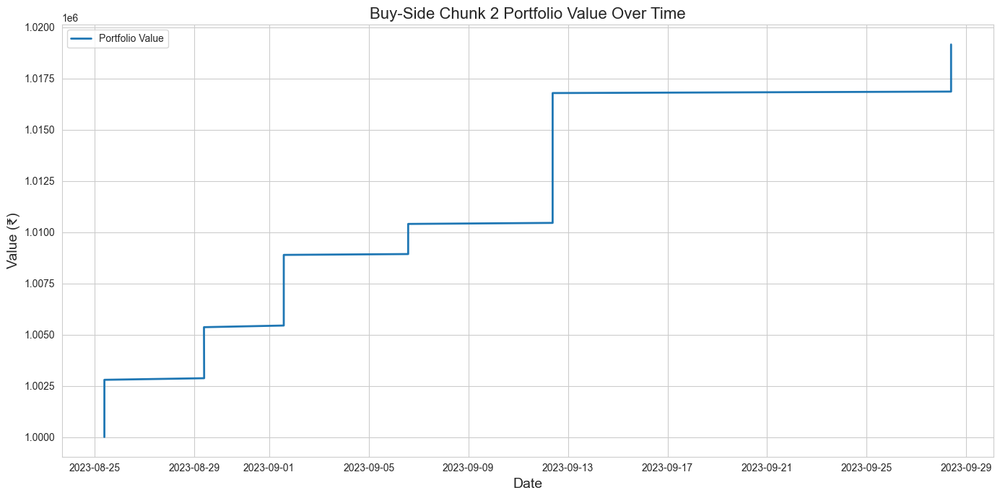

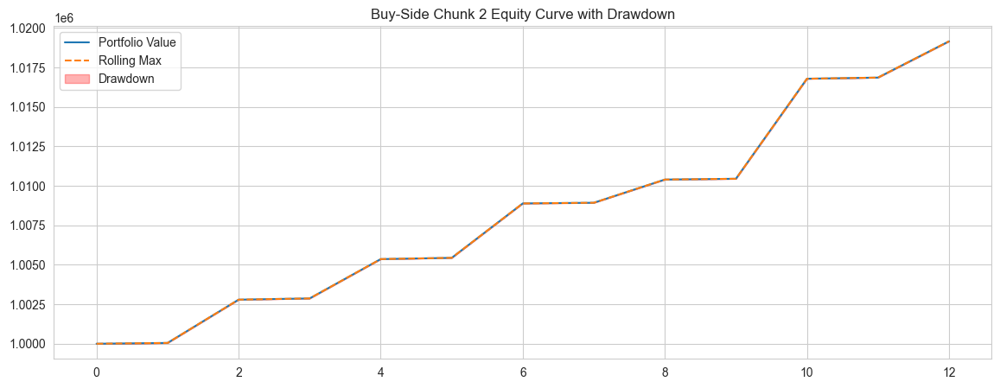

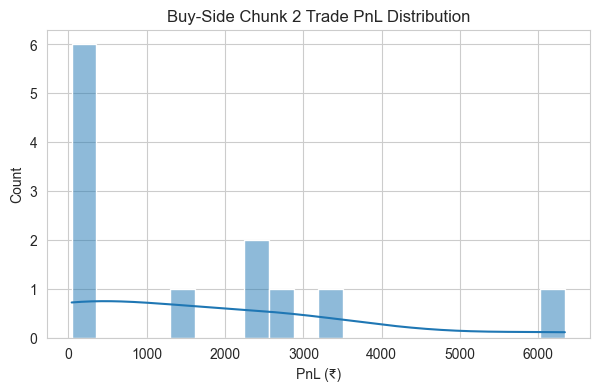

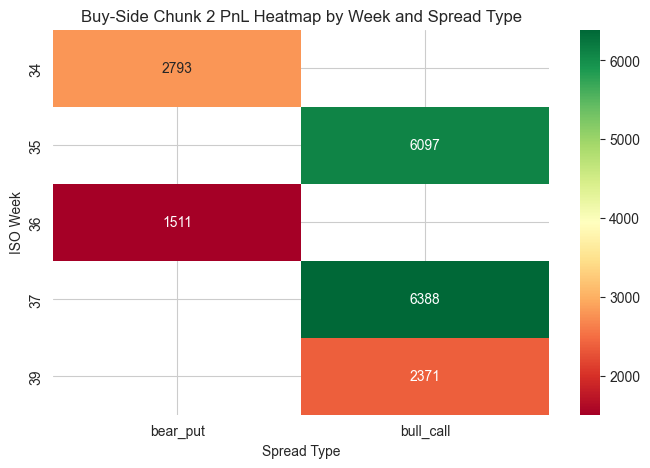

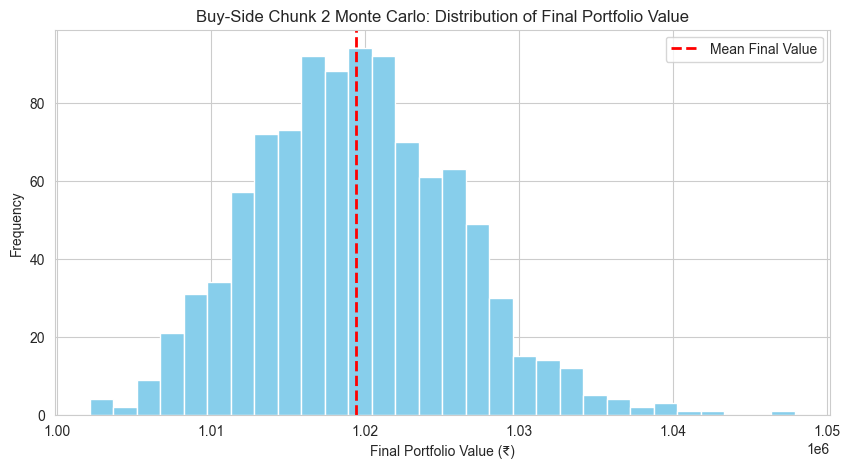

Monte Carlo: Mean Final Value = ₹1,019,418.24, 5th Percentile = ₹1,008,879.77, 95th Percentile = ₹1,030,375.64

===== CUMULATIVE REPORT AFTER CHUNK 2 =====

Combined Strategy Performance Report:
-----------------------------
Initial Capital:    1,000,000.00
Final Portfolio:    1,032,447.10
Total Return:       3.24%
Max Drawdown:       17,562.84
Sharpe Ratio:       3.50
Sortino Ratio:      0.00
Calmar Ratio:       8.27
Total Trades:       36
Winning Trades:     35
Losing Trades:      1
Avg PnL:            901.31
Best Trade:         11,448.00
Worst Trade:        -18,000.00
Trade Period:       2023-07-04 to 2023-09-28



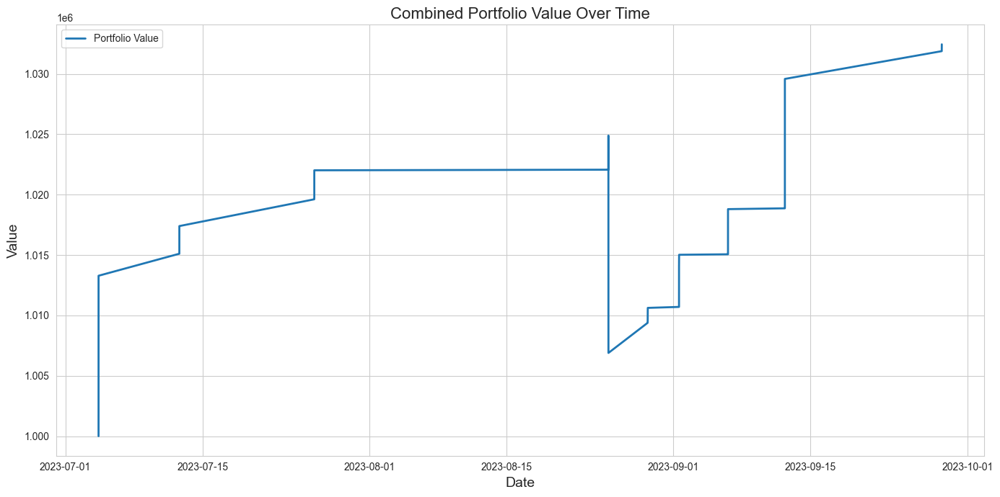

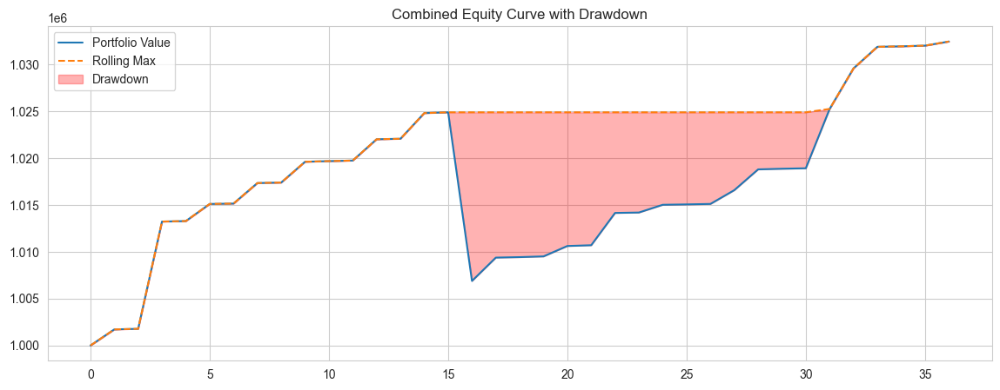

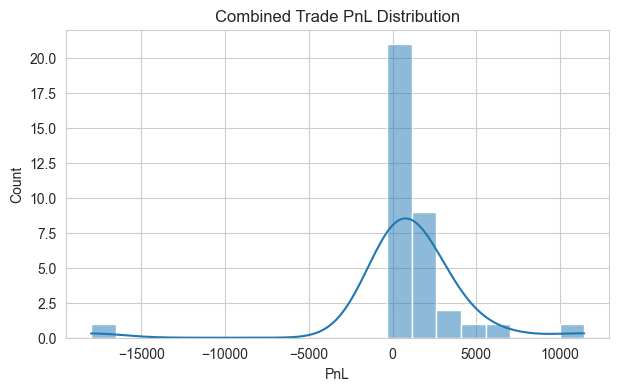

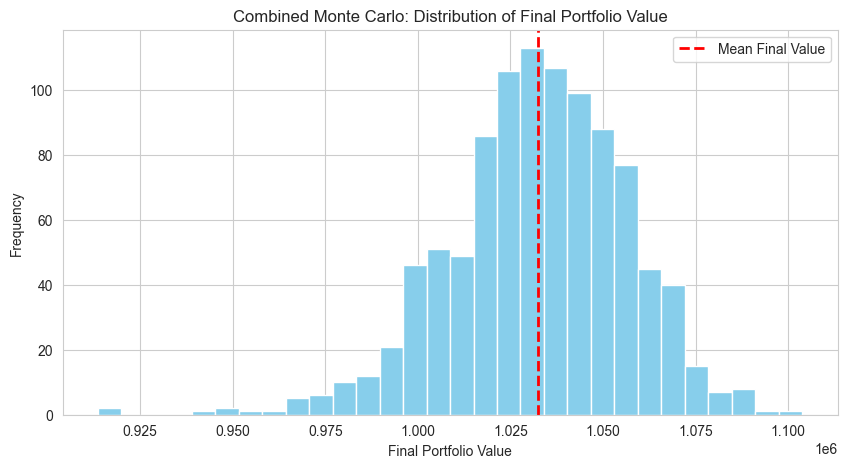

Monte Carlo: Mean Final Value = 1,032,326.43, 5th Percentile = 994,489.65, 95th Percentile = 1,069,145.82


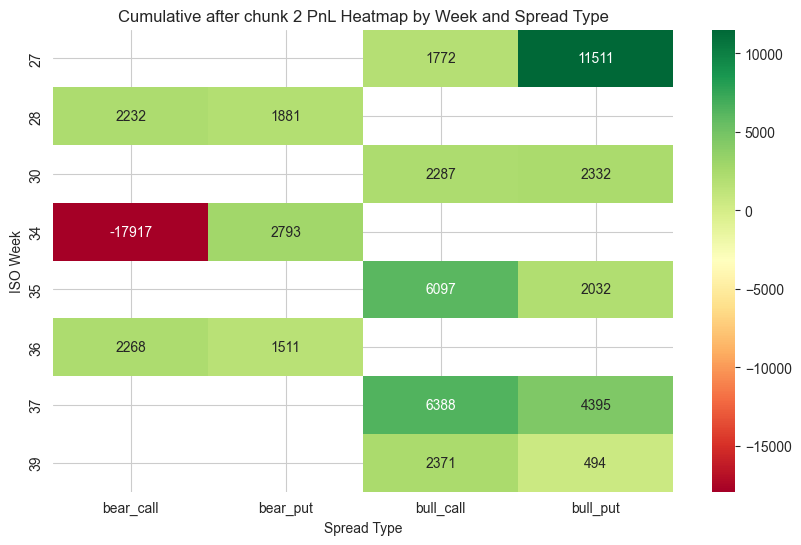


=== Processing chunk 3: 2023-10-01 09:15:00+05:30 to 2023-12-01 09:14:00+05:30 ===


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\958104352.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(



Sell-Side Chunk 3 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹964,085.28
Total Return:       -3.59%
Max Drawdown:       ₹35,996.93
Sharpe Ratio:       -18.26
Sortino Ratio:      -824.83
Calmar Ratio:       -25.01

Trade Statistics:
-----------------
Total Trades:       3
Winning Trades:     1
Losing Trades:      2
Avg PnL:            ₹-11,971.57
Best Trade:         ₹85.28
Worst Trade:        ₹-18,000.00
Trade Period:       2023-10-18 to 2023-10-31



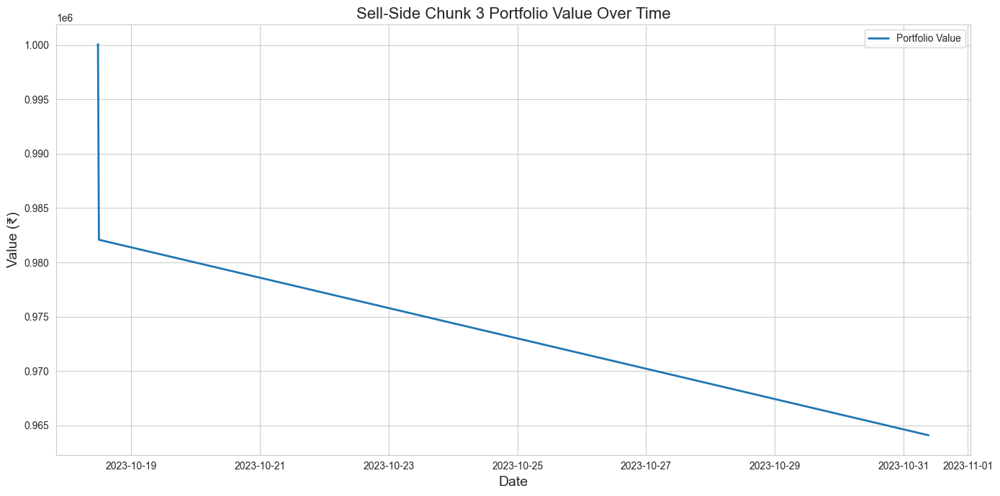

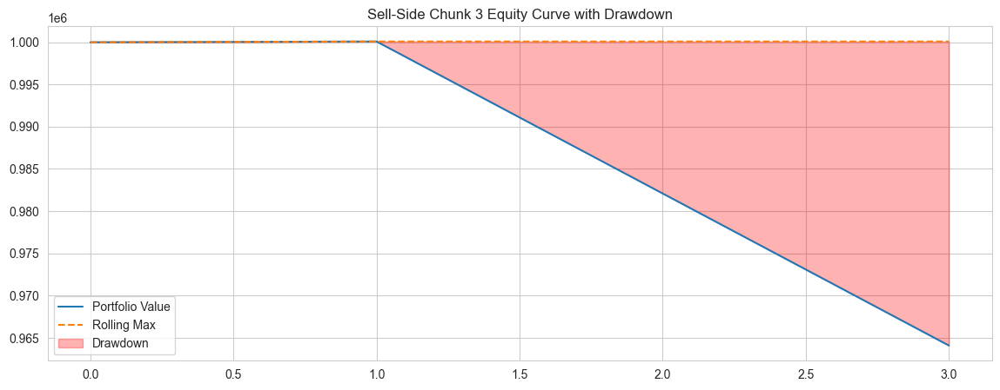

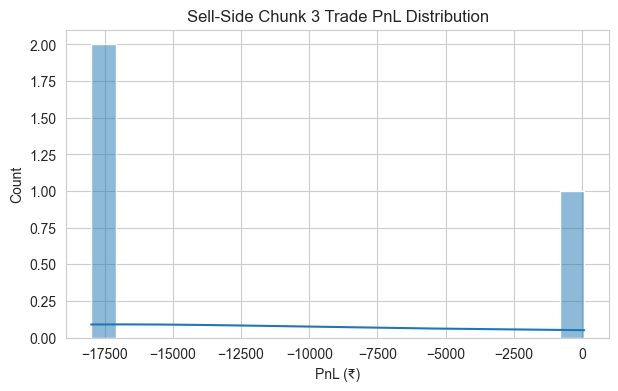

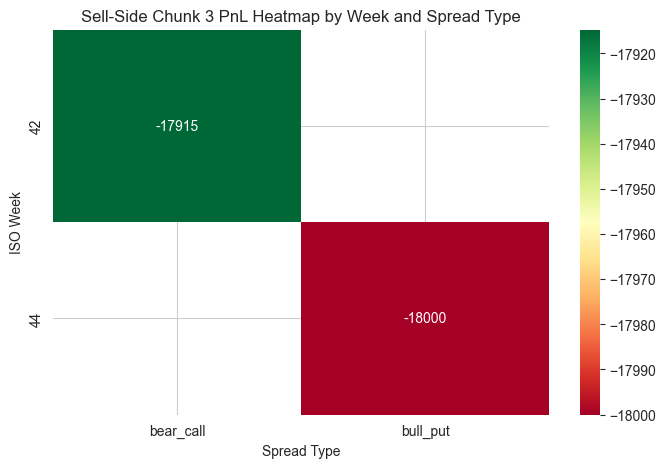

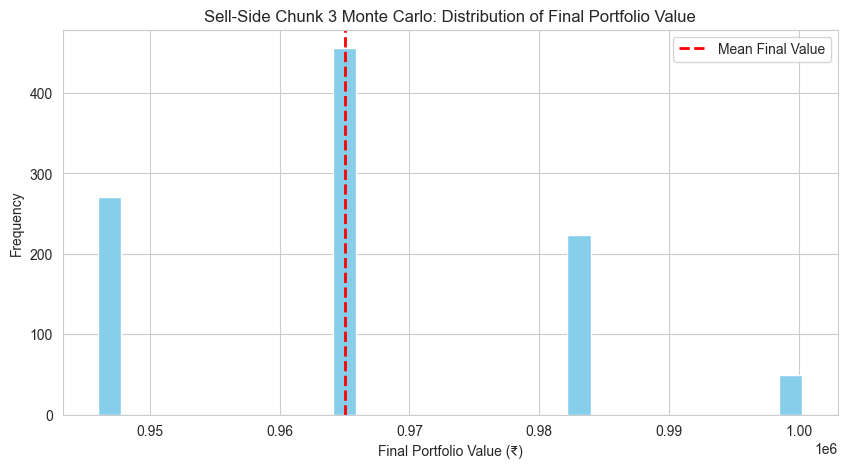

Monte Carlo: Mean Final Value = ₹965,007.62, 5th Percentile = ₹946,000.00, 95th Percentile = ₹982,170.55


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\958104352.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(



Buy-Side Chunk 3 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹964,000.00
Total Return:       -3.60%
Max Drawdown:       ₹36,000.00
Sharpe Ratio:       -1238.69
Sortino Ratio:      -1238.69
Calmar Ratio:       -26.50

Trade Statistics:
-----------------
Total Trades:       2
Winning Trades:     0
Losing Trades:      2
Avg PnL:            ₹-18,000.00
Best Trade:         ₹-18,000.00
Worst Trade:        ₹-18,000.00
Trade Period:       2023-10-18 to 2023-10-31



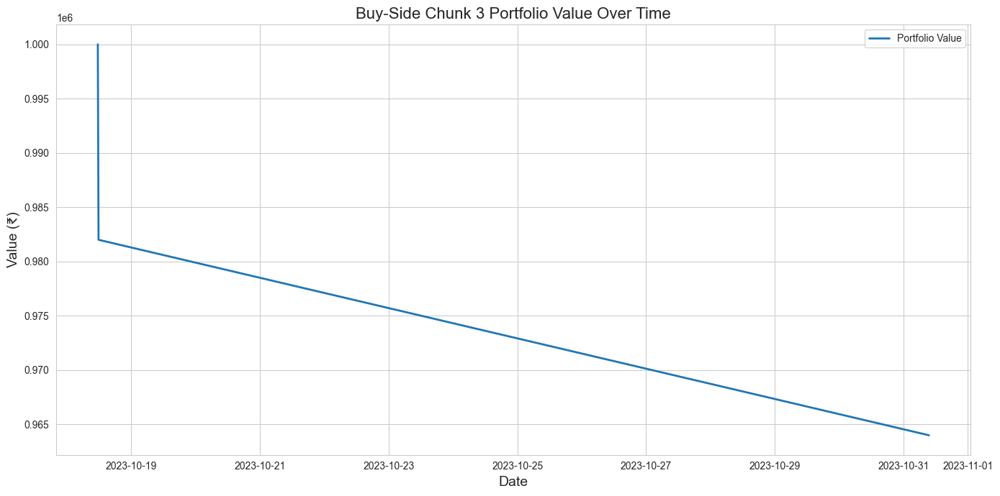

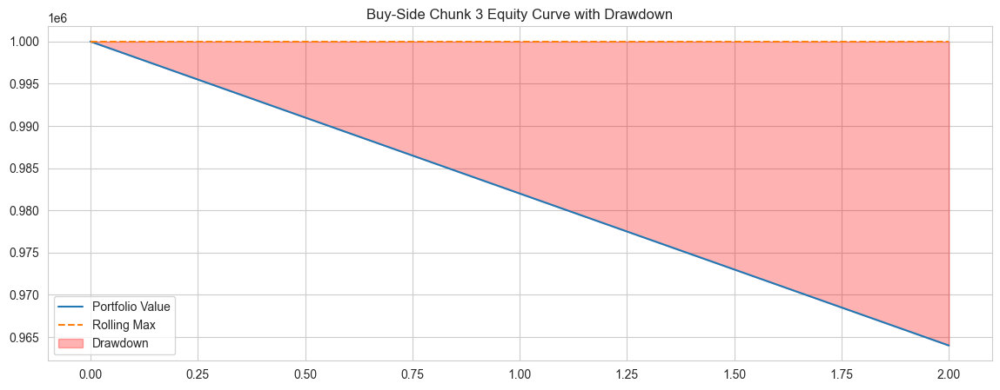

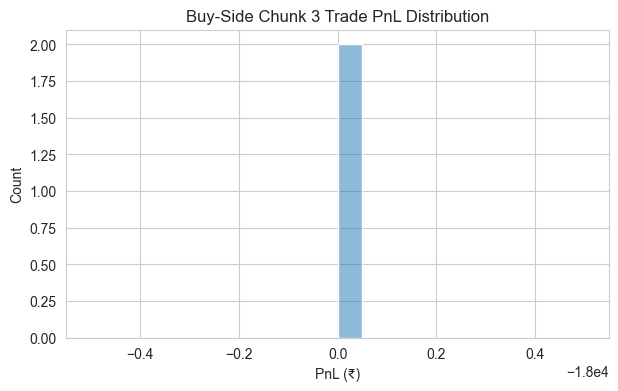

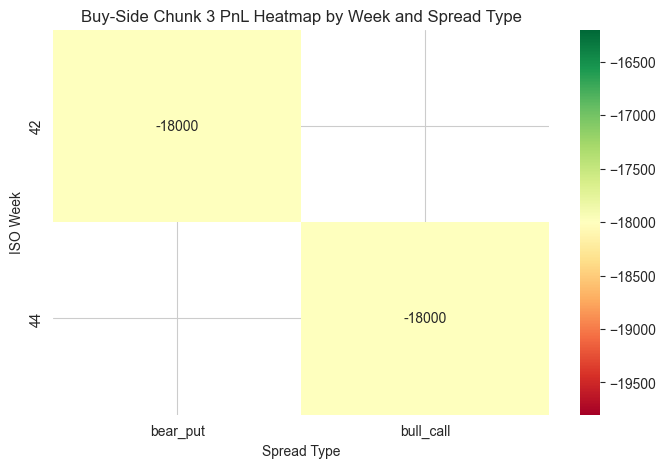

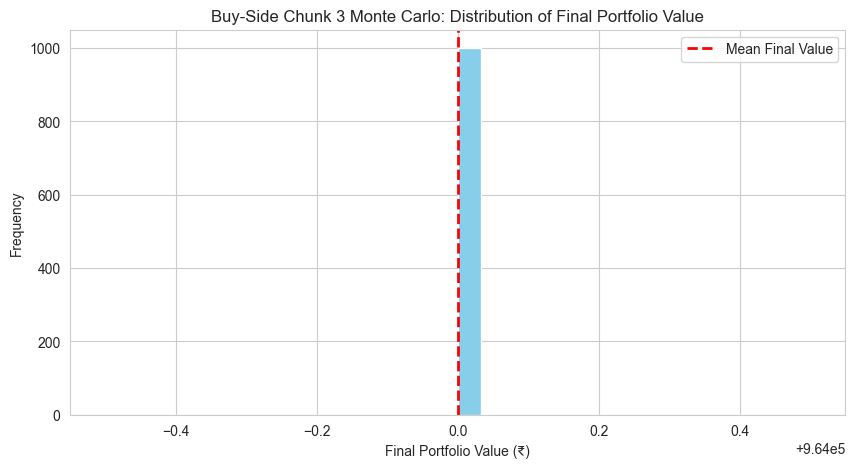

Monte Carlo: Mean Final Value = ₹964,000.00, 5th Percentile = ₹964,000.00, 95th Percentile = ₹964,000.00

===== CUMULATIVE REPORT AFTER CHUNK 3 =====

Combined Strategy Performance Report:
-----------------------------
Initial Capital:    1,000,000.00
Final Portfolio:    960,532.37
Total Return:       -3.95%
Max Drawdown:       69,731.47
Sharpe Ratio:       -2.36
Sortino Ratio:      -40.63
Calmar Ratio:       -1.67
Total Trades:       41
Winning Trades:     36
Losing Trades:      5
Avg PnL:            -962.63
Best Trade:         11,448.00
Worst Trade:        -18,000.00
Trade Period:       2023-07-04 to 2023-10-31



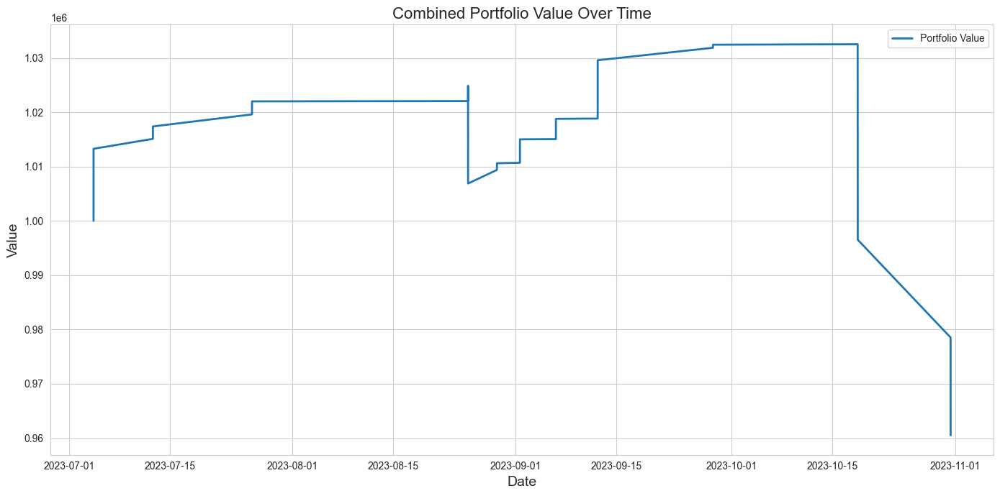

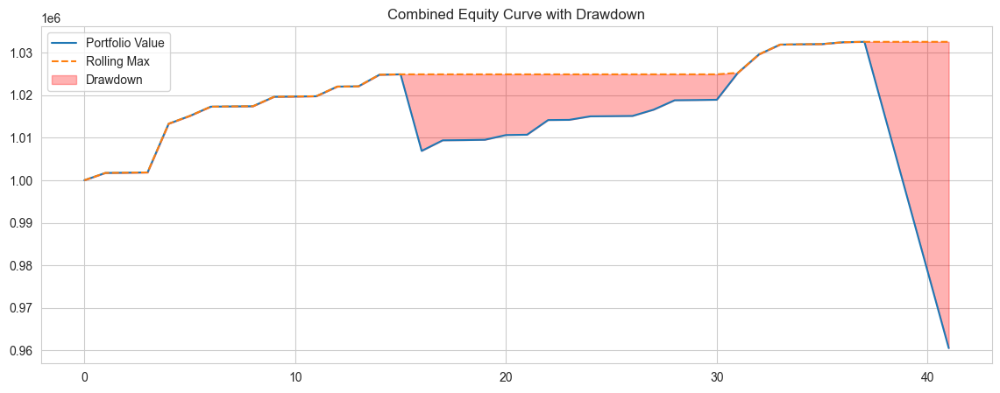

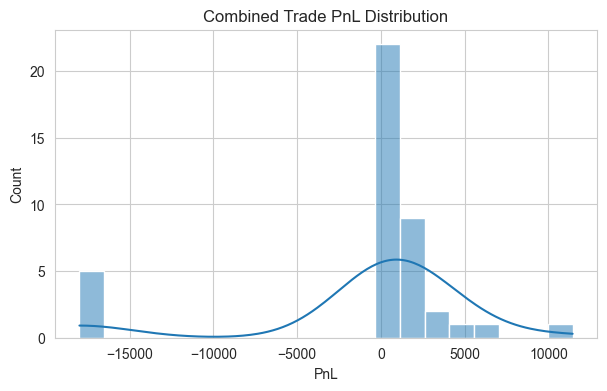

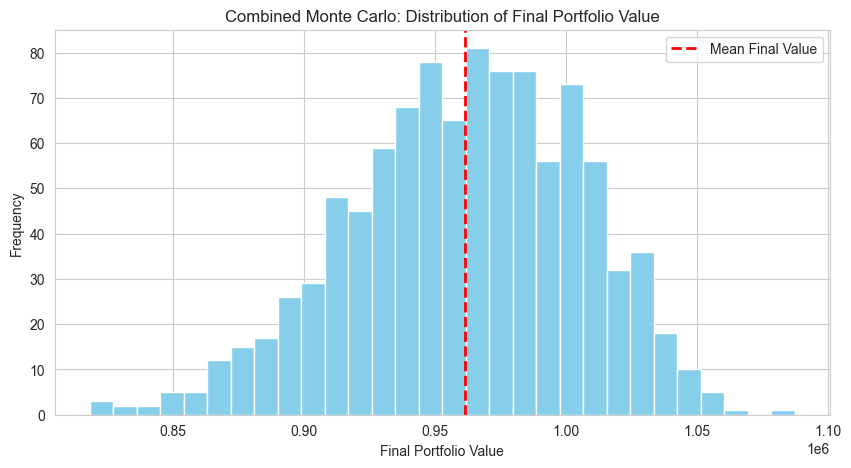

Monte Carlo: Mean Final Value = 961,555.43, 5th Percentile = 886,455.59, 95th Percentile = 1,029,696.48


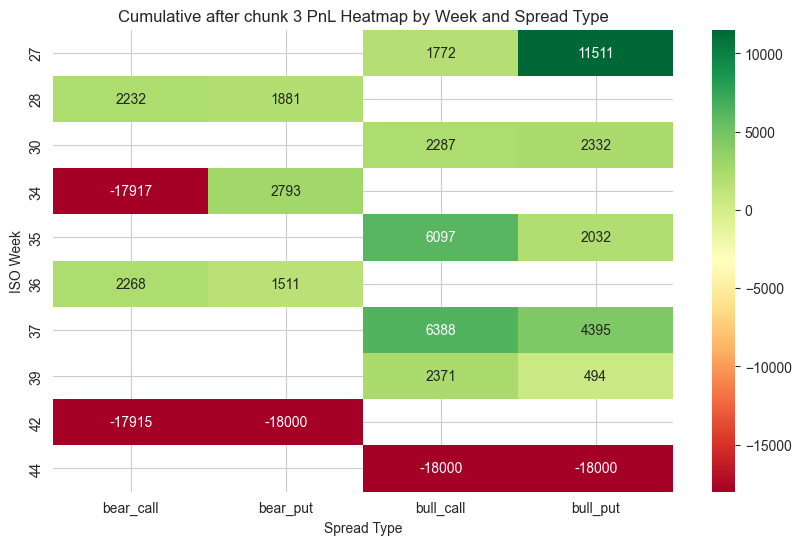


=== Processing chunk 4: 2023-12-01 09:15:00+05:30 to 2024-02-01 09:14:00+05:30 ===


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\958104352.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(



Sell-Side Chunk 4 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹989,977.18
Total Return:       -1.00%
Max Drawdown:       ₹17,884.57
Sharpe Ratio:       -2.58
Sortino Ratio:      0.00
Calmar Ratio:       -10.66

Trade Statistics:
-----------------
Total Trades:       11
Winning Trades:     10
Losing Trades:      1
Avg PnL:            ₹-911.17
Best Trade:         ₹4,444.17
Worst Trade:        ₹-18,000.00
Trade Period:       2023-12-12 to 2024-01-25



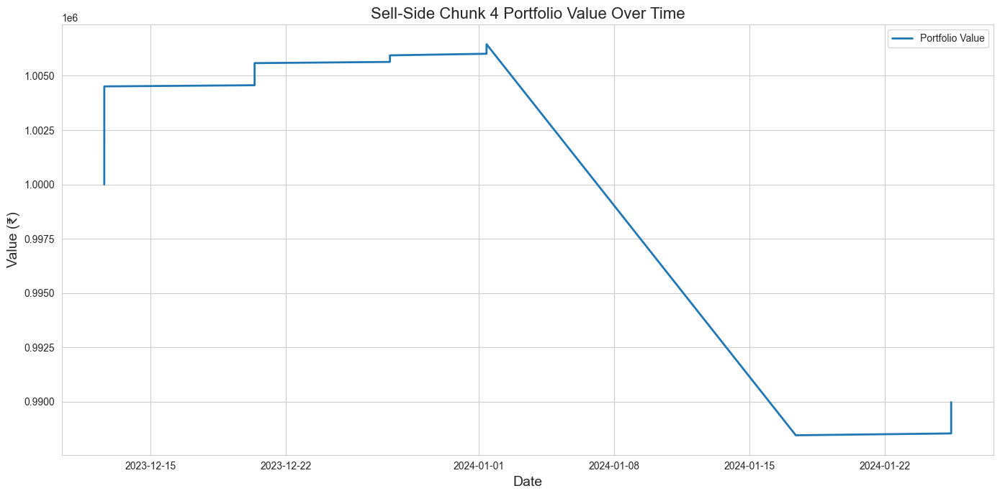

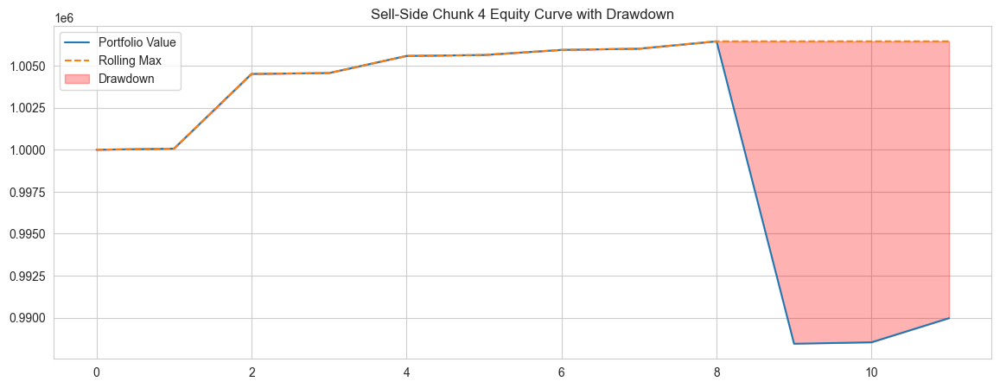

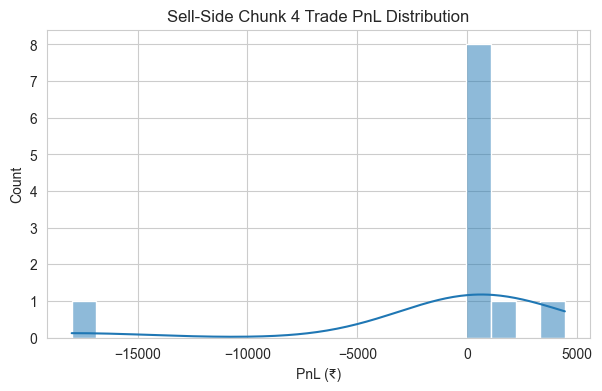

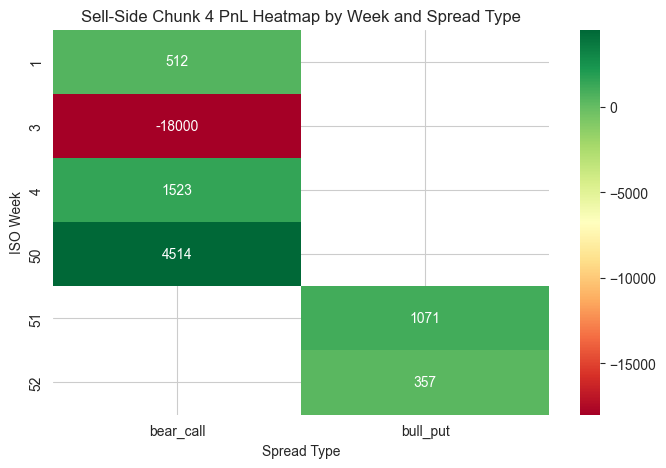

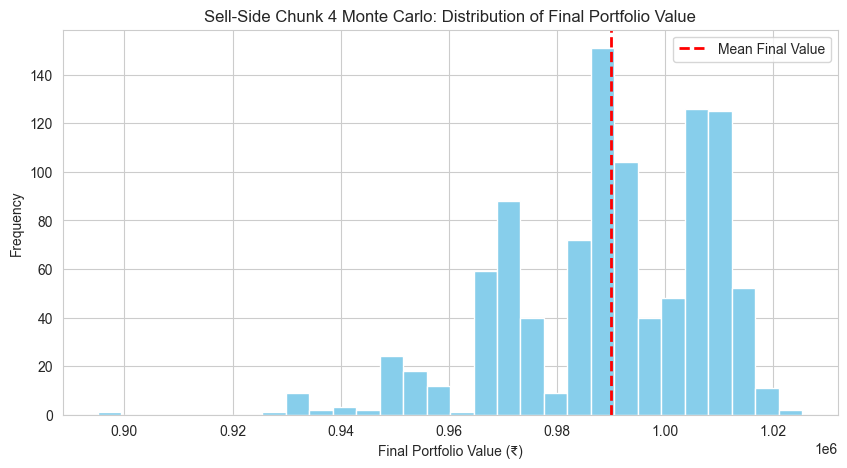

Monte Carlo: Mean Final Value = ₹989,902.60, 5th Percentile = ₹952,885.94, 95th Percentile = ₹1,013,054.15


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\958104352.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(



Buy-Side Chunk 4 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹991,367.42
Total Return:       -0.86%
Max Drawdown:       ₹17,848.59
Sharpe Ratio:       -2.10
Sortino Ratio:      0.00
Calmar Ratio:       -8.10

Trade Statistics:
-----------------
Total Trades:       13
Winning Trades:     12
Losing Trades:      1
Avg PnL:            ₹-664.04
Best Trade:         ₹2,884.80
Worst Trade:        ₹-18,000.00
Trade Period:       2023-12-12 to 2024-01-25



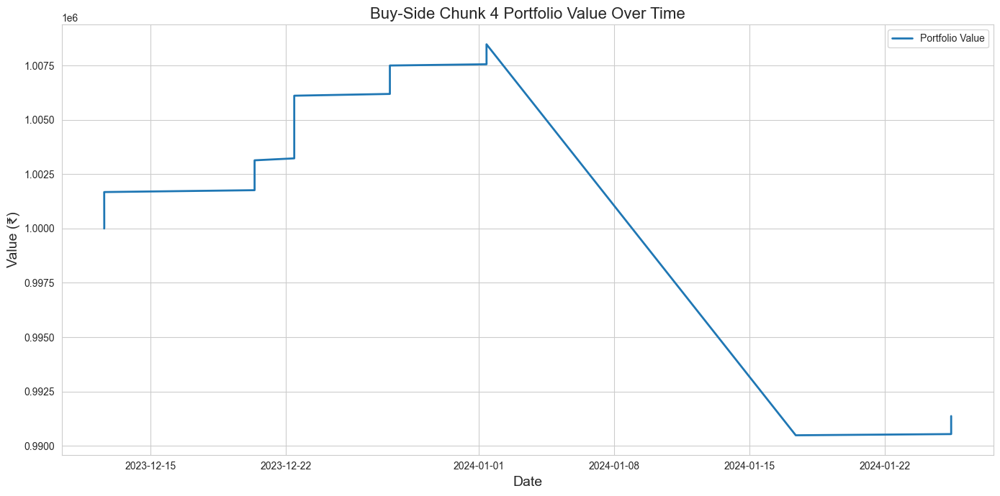

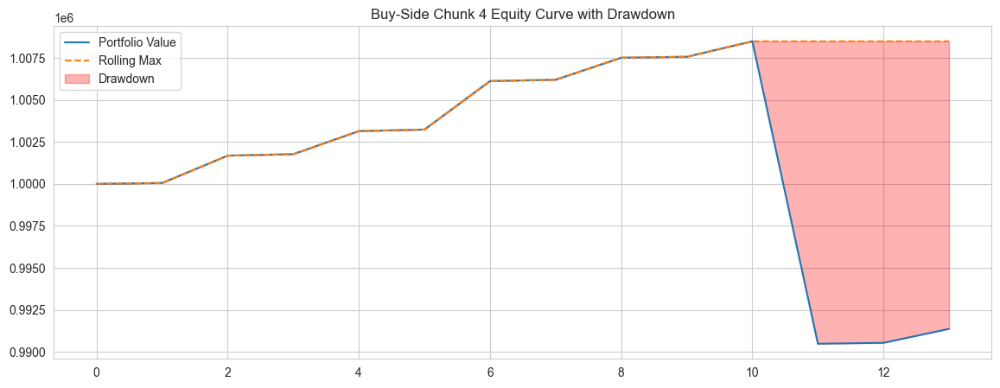

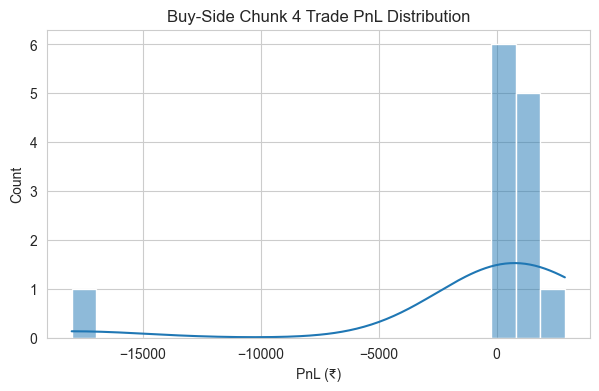

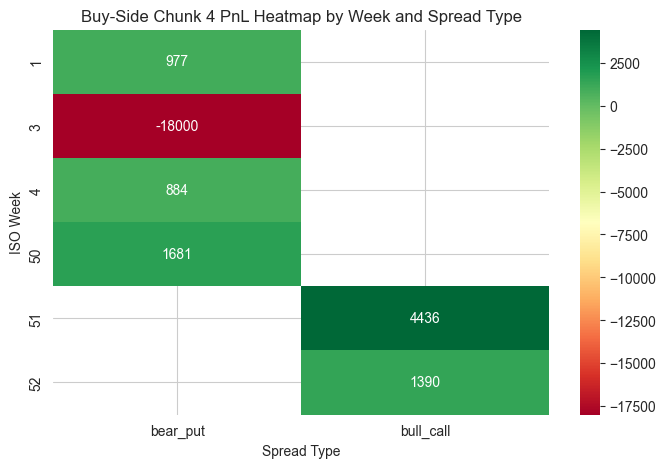

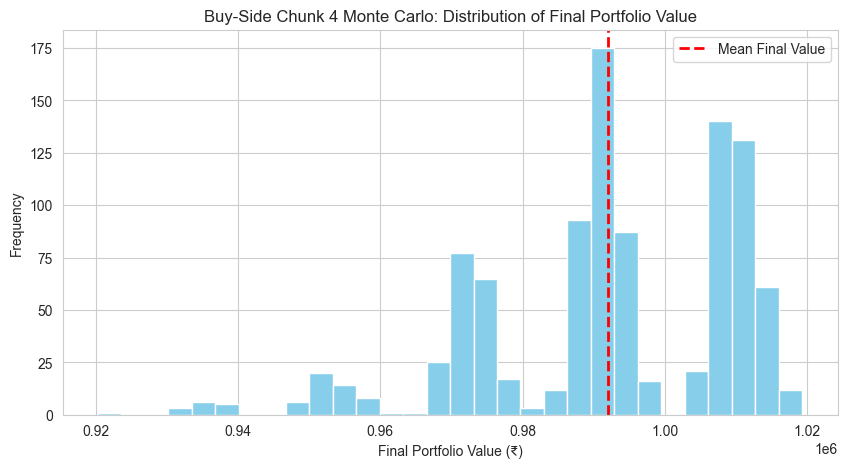

Monte Carlo: Mean Final Value = ₹992,014.44, 5th Percentile = ₹955,053.04, 95th Percentile = ₹1,013,567.53

===== CUMULATIVE REPORT AFTER CHUNK 4 =====

Combined Strategy Performance Report:
-----------------------------
Initial Capital:    1,000,000.00
Final Portfolio:    941,876.97
Total Return:       -5.81%
Max Drawdown:       90,130.88
Sharpe Ratio:       -2.38
Sortino Ratio:      -29.34
Calmar Ratio:       -1.12
Total Trades:       65
Winning Trades:     58
Losing Trades:      7
Avg PnL:            -894.20
Best Trade:         11,448.00
Worst Trade:        -18,000.00
Trade Period:       2023-07-04 to 2024-01-25



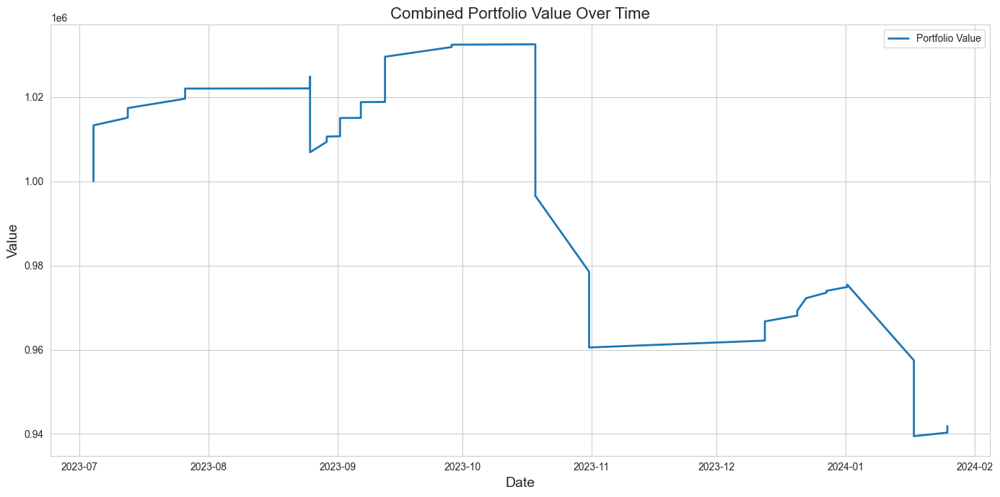

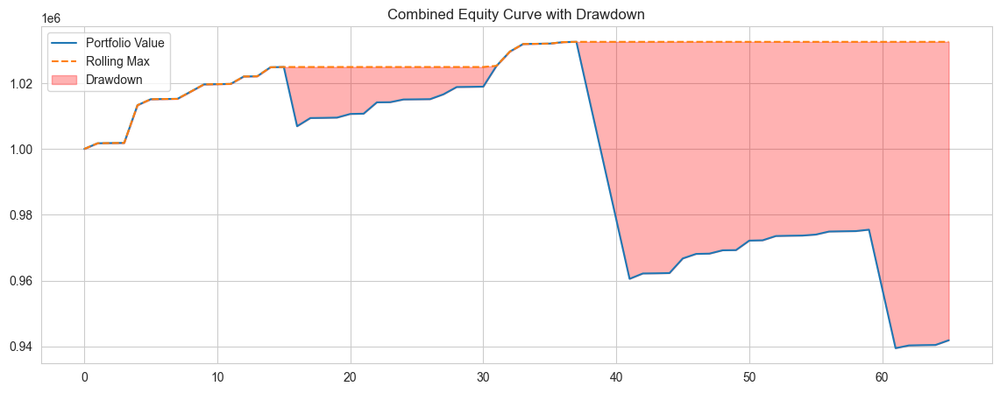

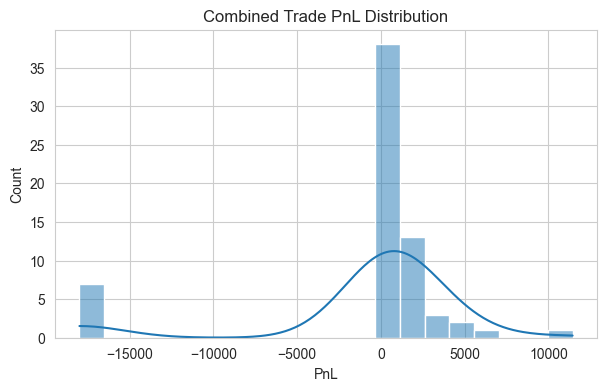

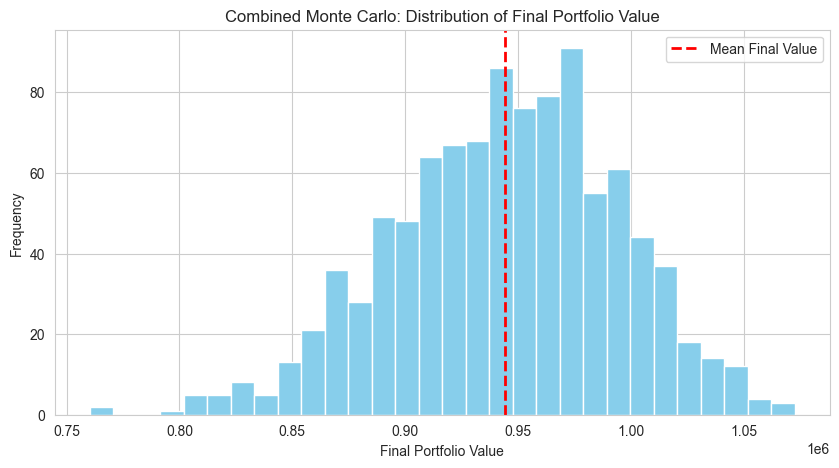

Monte Carlo: Mean Final Value = 944,314.83, 5th Percentile = 860,279.37, 95th Percentile = 1,020,548.75


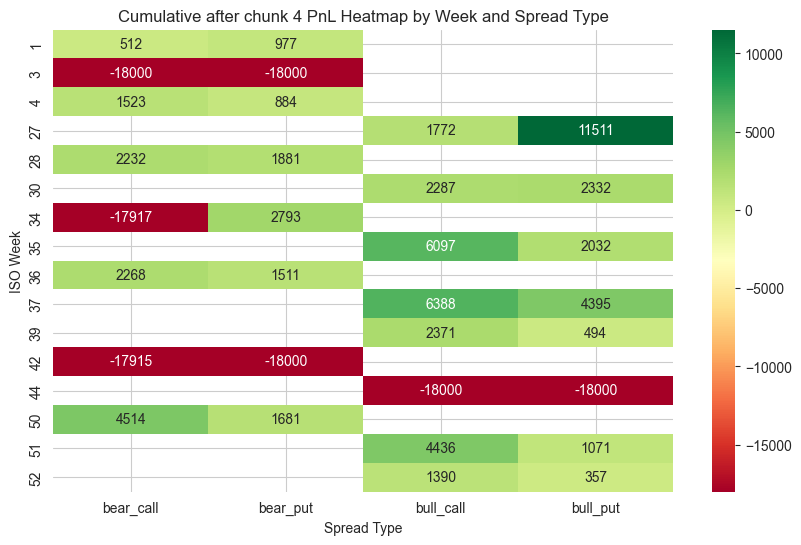


=== Processing chunk 5: 2024-02-01 09:15:00+05:30 to 2024-04-01 09:14:00+05:30 ===


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\958104352.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(



Sell-Side Chunk 5 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹1,021,667.18
Total Return:       2.17%
Max Drawdown:       ₹0.00
Sharpe Ratio:       9.21
Sortino Ratio:      0.00
Calmar Ratio:       0.00

Trade Statistics:
-----------------
Total Trades:       12
Winning Trades:     10
Losing Trades:      2
Avg PnL:            ₹1,805.60
Best Trade:         ₹8,667.00
Worst Trade:        ₹0.00
Trade Period:       2024-02-08 to 2024-03-27



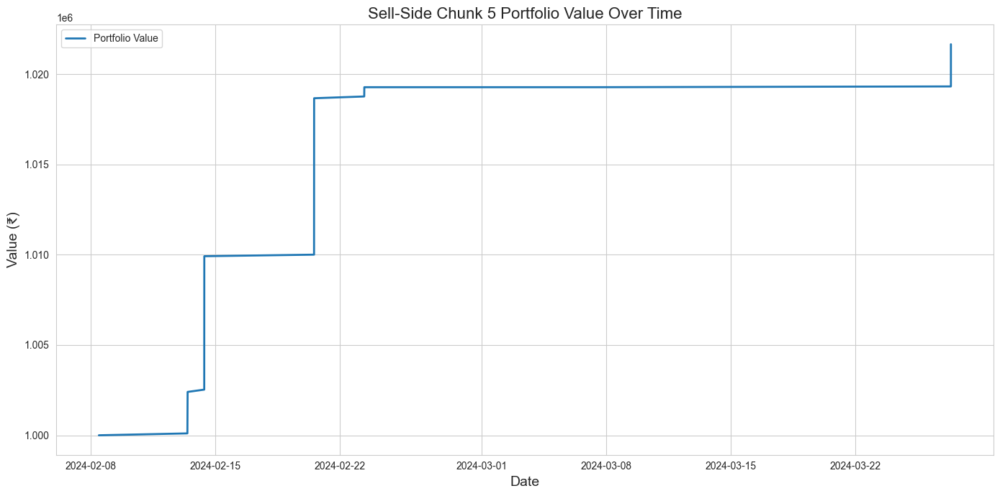

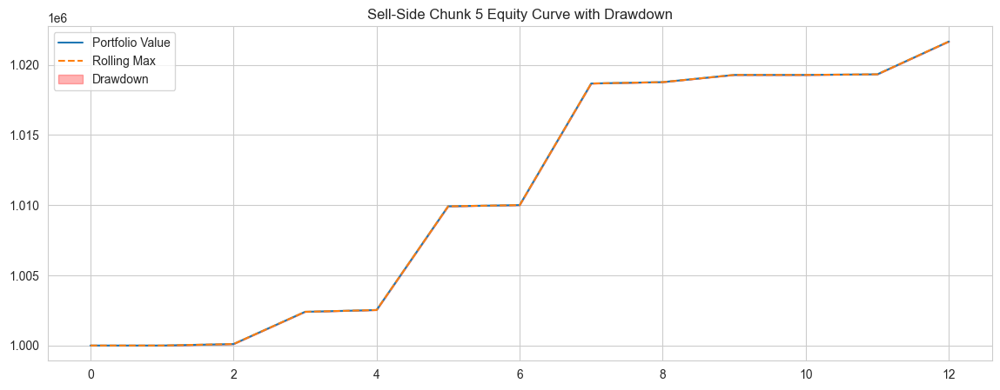

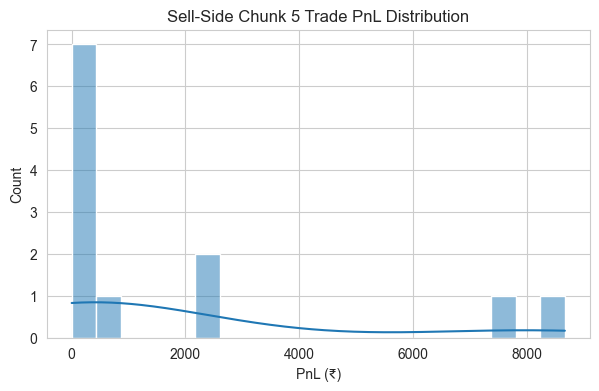

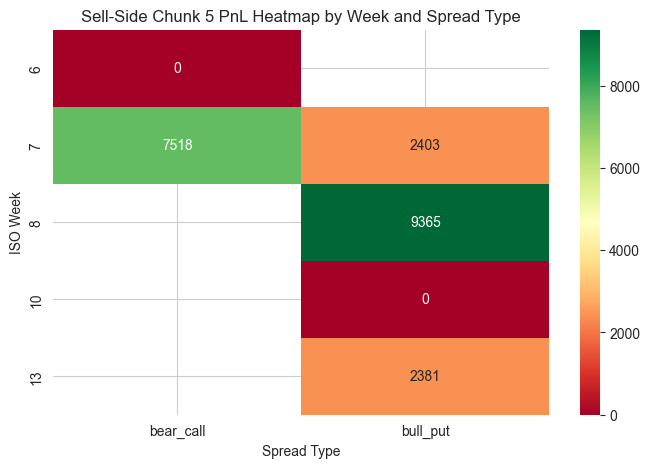

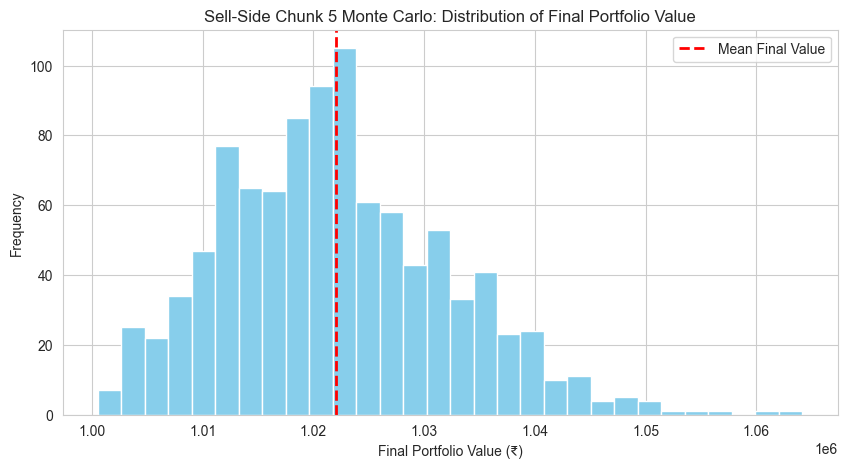

Monte Carlo: Mean Final Value = ₹1,022,073.69, 5th Percentile = ₹1,006,073.69, 95th Percentile = ₹1,039,717.53


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\958104352.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(



Buy-Side Chunk 5 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹1,018,524.38
Total Return:       1.85%
Max Drawdown:       ₹0.00
Sharpe Ratio:       8.88
Sortino Ratio:      0.00
Calmar Ratio:       0.00

Trade Statistics:
-----------------
Total Trades:       12
Winning Trades:     10
Losing Trades:      2
Avg PnL:            ₹1,543.70
Best Trade:         ₹9,384.00
Worst Trade:        ₹0.00
Trade Period:       2024-02-08 to 2024-03-27



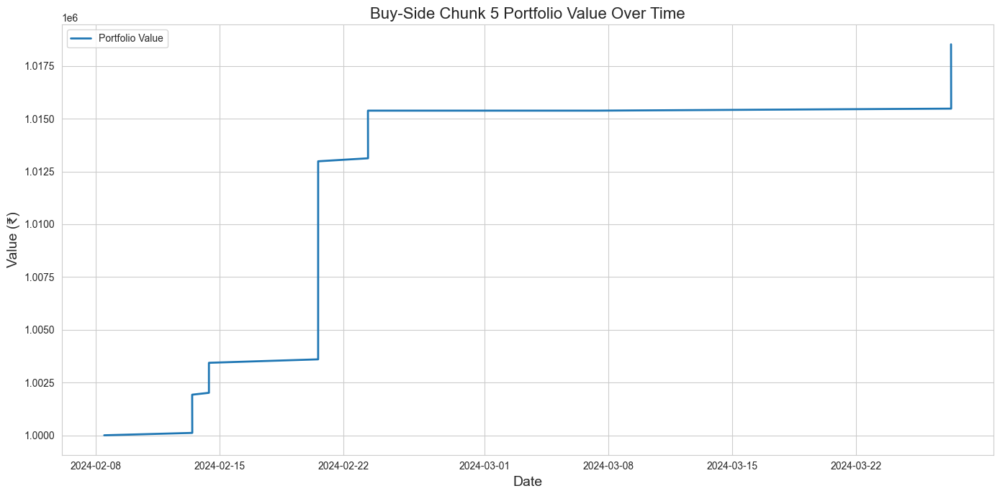

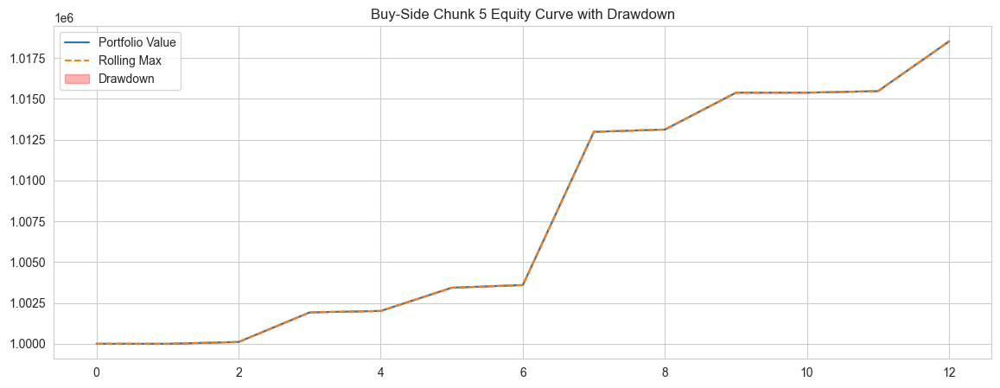

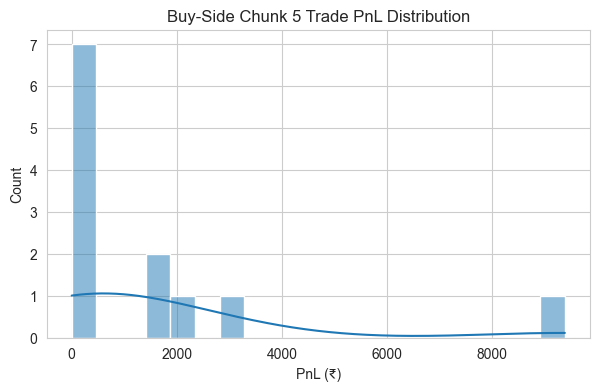

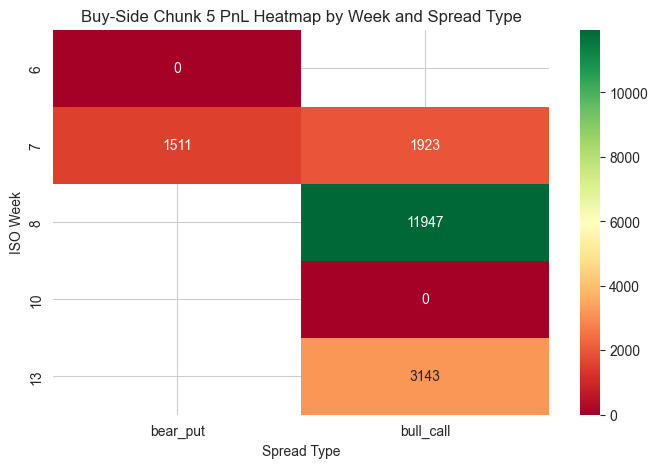

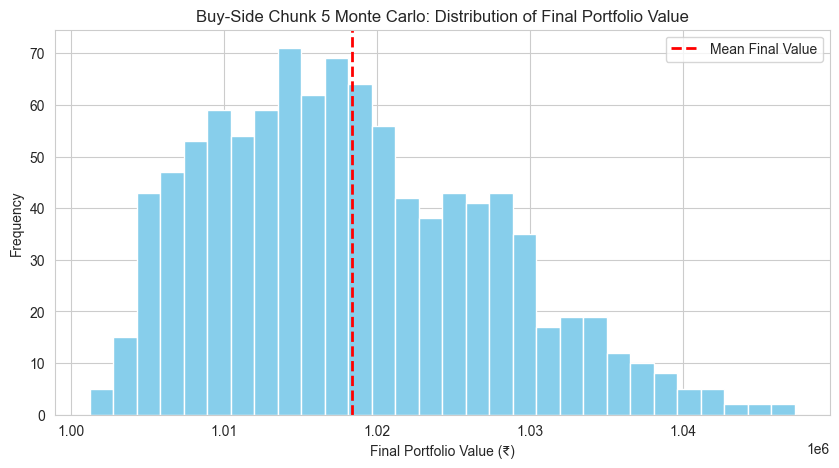

Monte Carlo: Mean Final Value = ₹1,018,345.27, 5th Percentile = ₹1,005,347.53, 95th Percentile = ₹1,034,731.02

===== CUMULATIVE REPORT AFTER CHUNK 5 =====

Combined Strategy Performance Report:
-----------------------------
Initial Capital:    1,000,000.00
Final Portfolio:    982,068.52
Total Return:       -1.79%
Max Drawdown:       90,130.88
Sharpe Ratio:       -0.63
Sortino Ratio:      -7.07
Calmar Ratio:       -0.27
Total Trades:       89
Winning Trades:     78
Losing Trades:      11
Avg PnL:            -201.48
Best Trade:         11,448.00
Worst Trade:        -18,000.00
Trade Period:       2023-07-04 to 2024-03-27



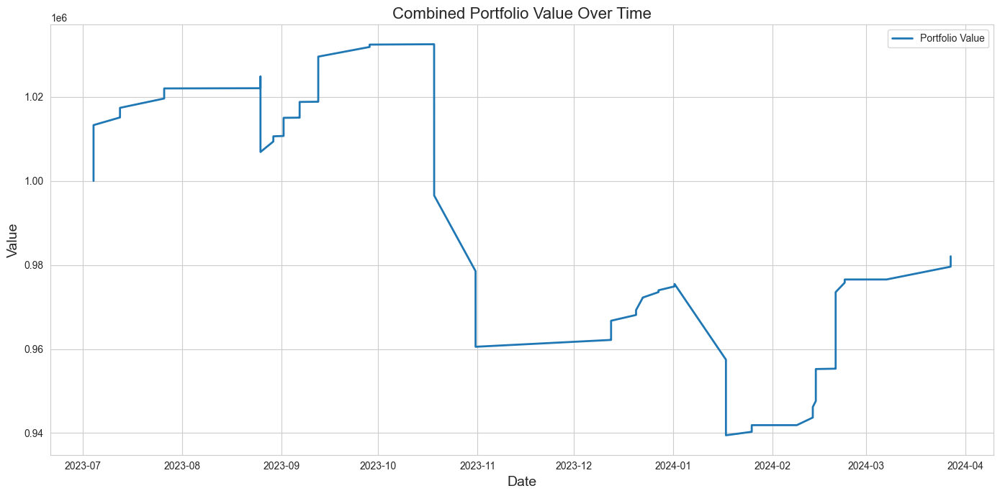

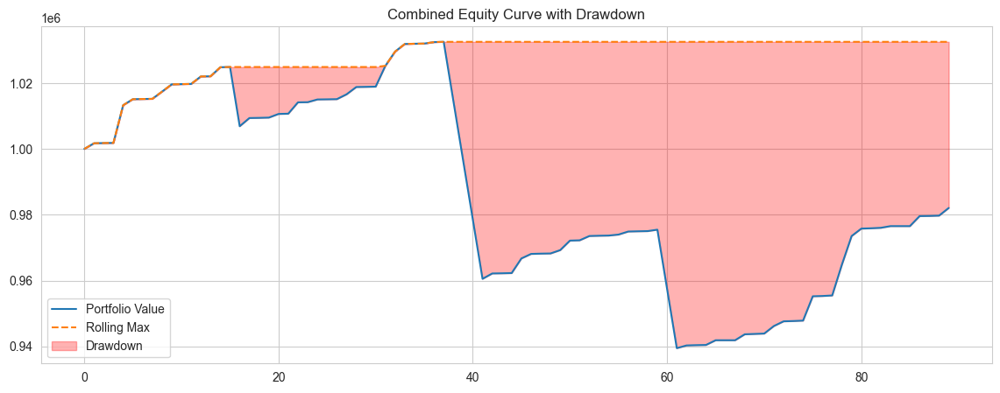

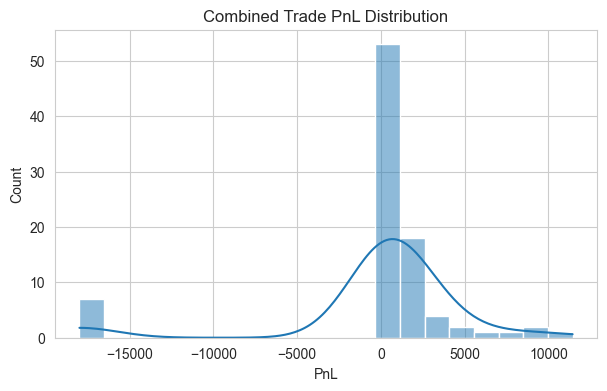

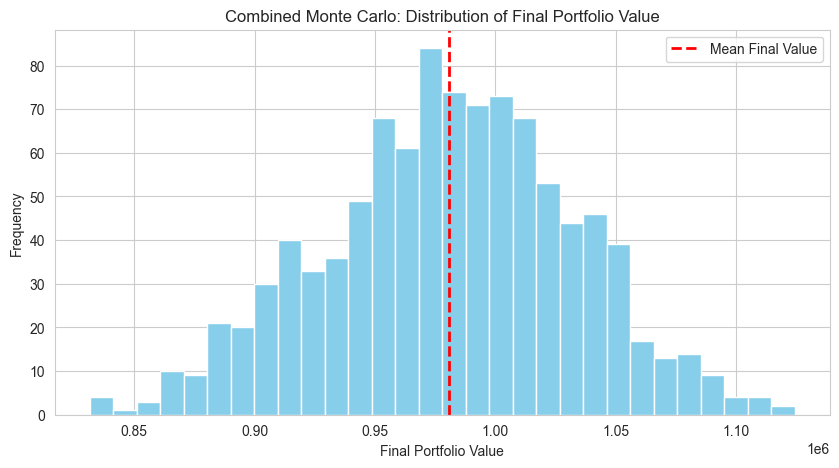

Monte Carlo: Mean Final Value = 980,916.07, 5th Percentile = 891,926.51, 95th Percentile = 1,064,083.00


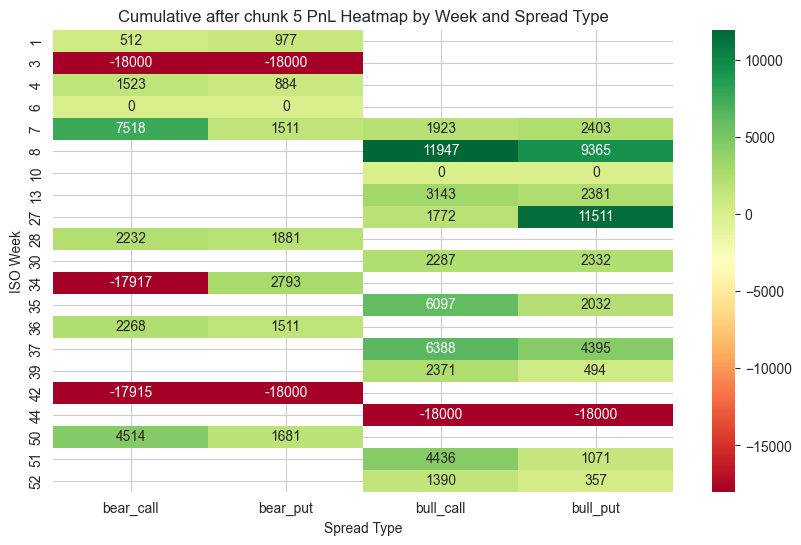


=== Processing chunk 6: 2024-04-01 09:15:00+05:30 to 2024-06-01 09:14:00+05:30 ===


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\958104352.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(



Sell-Side Chunk 6 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹1,048,160.75
Total Return:       4.82%
Max Drawdown:       ₹0.00
Sharpe Ratio:       7.35
Sortino Ratio:      0.00
Calmar Ratio:       0.00

Trade Statistics:
-----------------
Total Trades:       10
Winning Trades:     10
Losing Trades:      0
Avg PnL:            ₹4,816.08
Best Trade:         ₹33,722.50
Worst Trade:        ₹54.15
Trade Period:       2024-04-03 to 2024-05-16



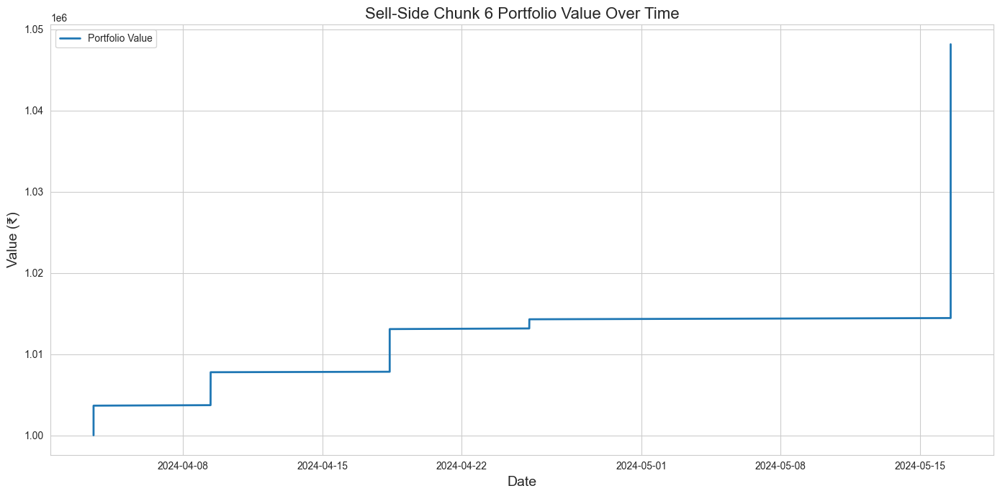

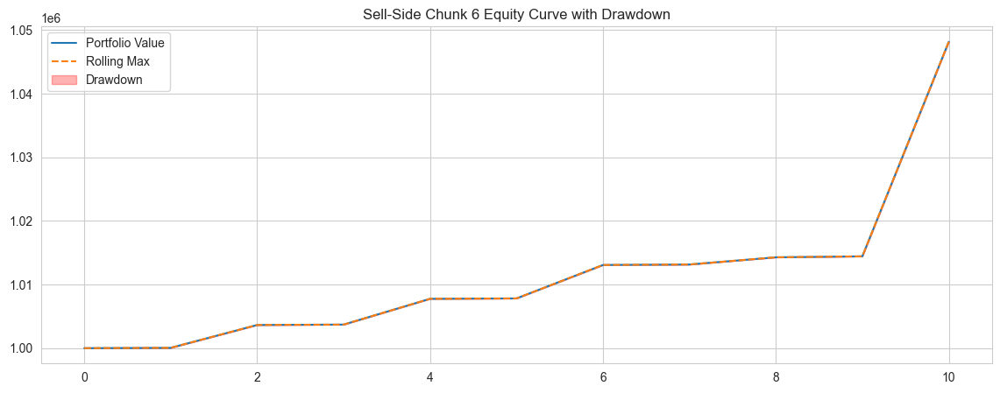

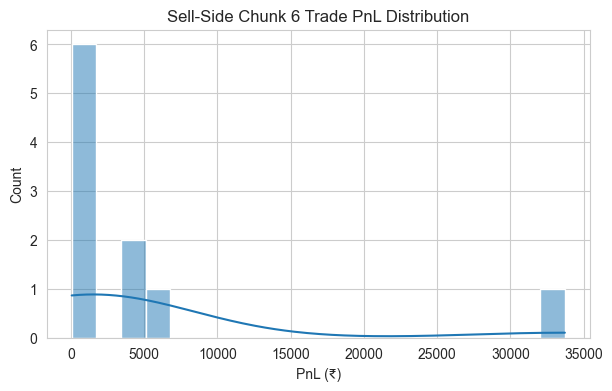

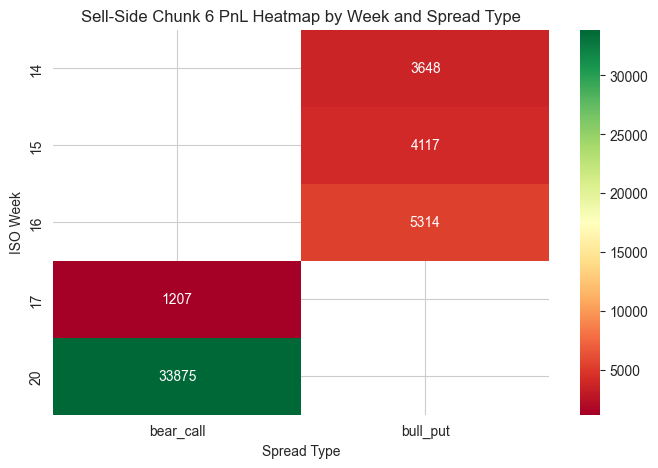

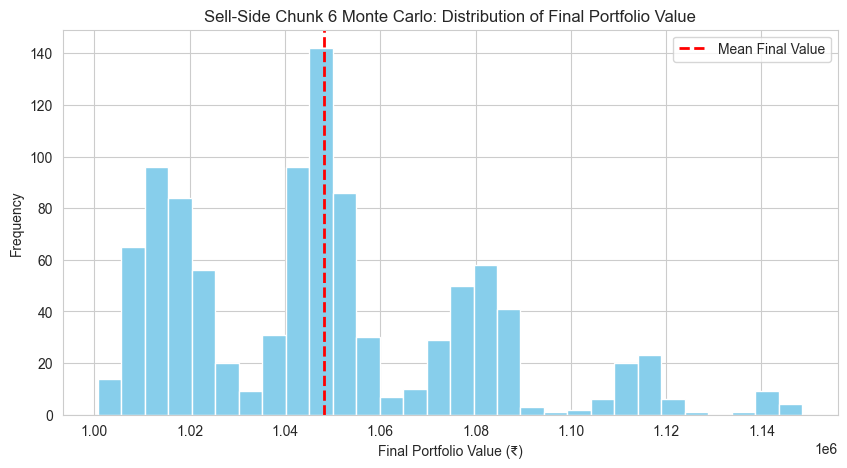

Monte Carlo: Mean Final Value = ₹1,048,082.29, 5th Percentile = ₹1,009,049.28, 95th Percentile = ₹1,111,445.29


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\958104352.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(



Buy-Side Chunk 6 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹1,050,381.60
Total Return:       5.04%
Max Drawdown:       ₹0.00
Sharpe Ratio:       6.09
Sortino Ratio:      0.00
Calmar Ratio:       0.00

Trade Statistics:
-----------------
Total Trades:       10
Winning Trades:     10
Losing Trades:      0
Avg PnL:            ₹5,038.16
Best Trade:         ₹42,052.00
Worst Trade:        ₹48.25
Trade Period:       2024-04-03 to 2024-05-16



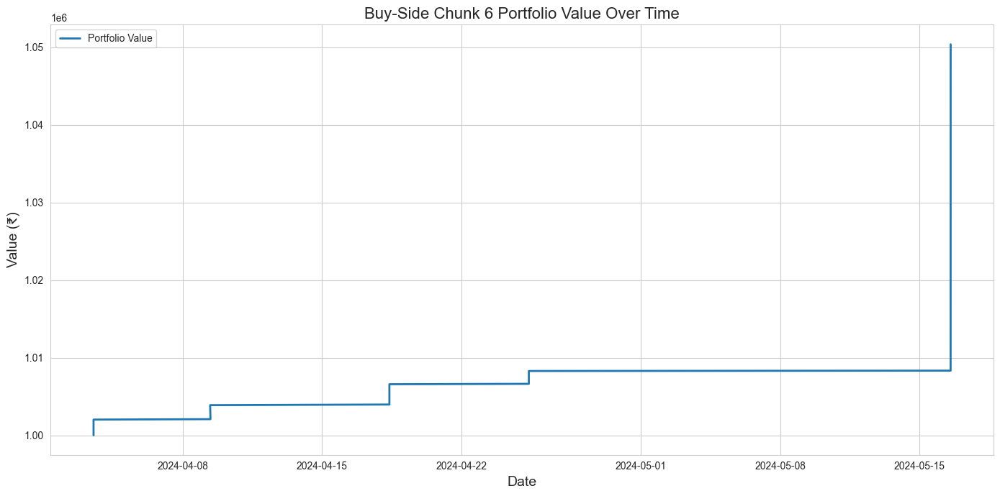

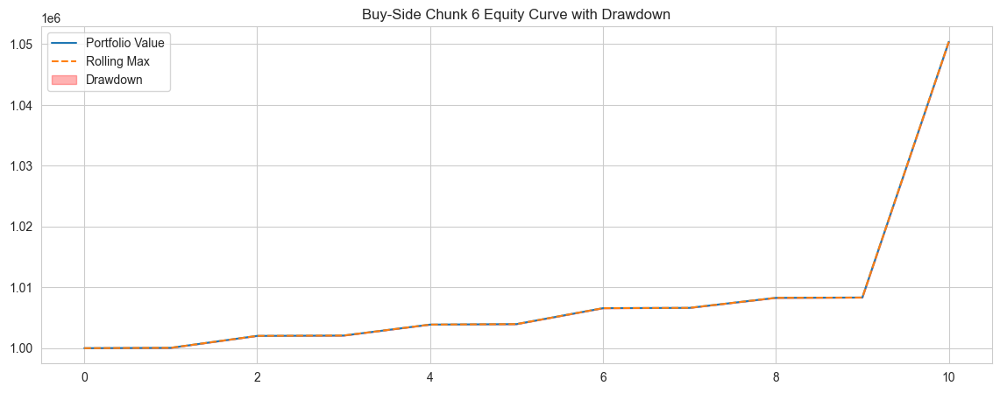

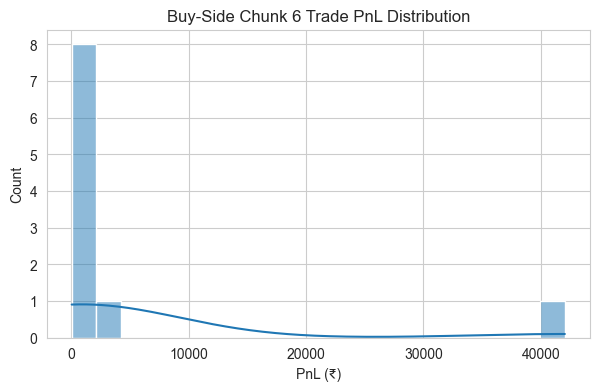

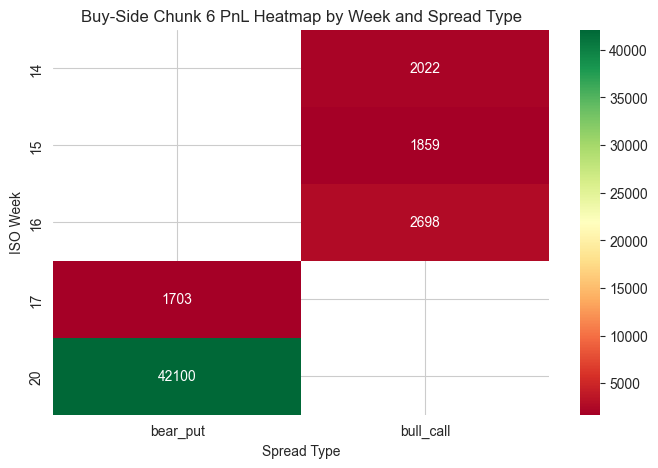

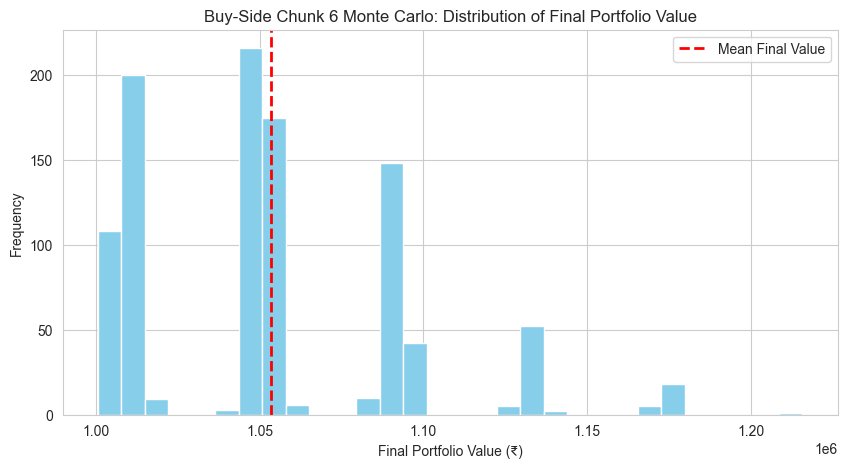

Monte Carlo: Mean Final Value = ₹1,053,331.29, 5th Percentile = ₹1,005,876.08, 95th Percentile = ₹1,133,292.30

===== CUMULATIVE REPORT AFTER CHUNK 6 =====

Combined Strategy Performance Report:
-----------------------------
Initial Capital:    1,000,000.00
Final Portfolio:    1,080,610.87
Total Return:       8.06%
Max Drawdown:       90,130.88
Sharpe Ratio:       1.53
Sortino Ratio:      21.75
Calmar Ratio:       1.04
Total Trades:       109
Winning Trades:     98
Losing Trades:      11
Avg PnL:            739.55
Best Trade:         42,052.00
Worst Trade:        -18,000.00
Trade Period:       2023-07-04 to 2024-05-16



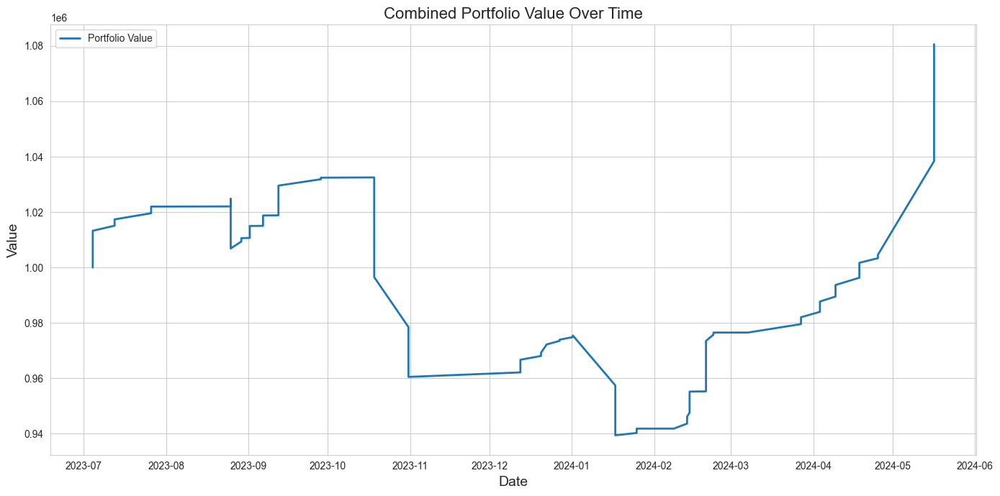

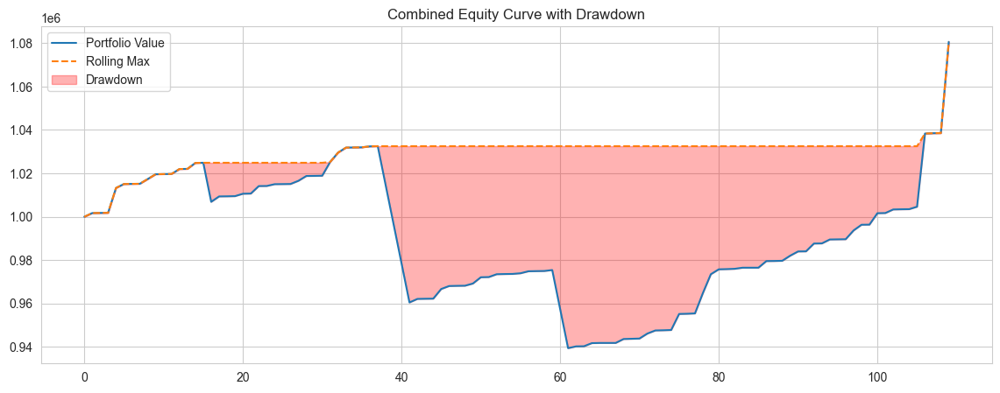

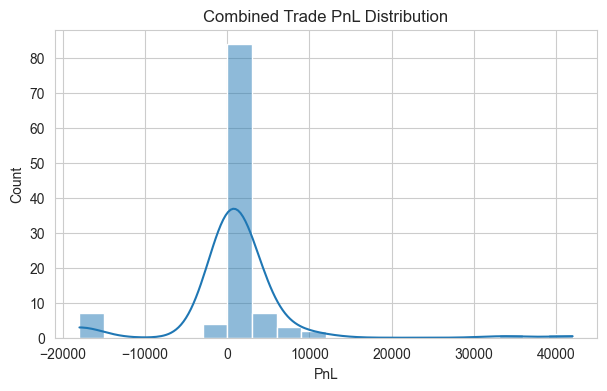

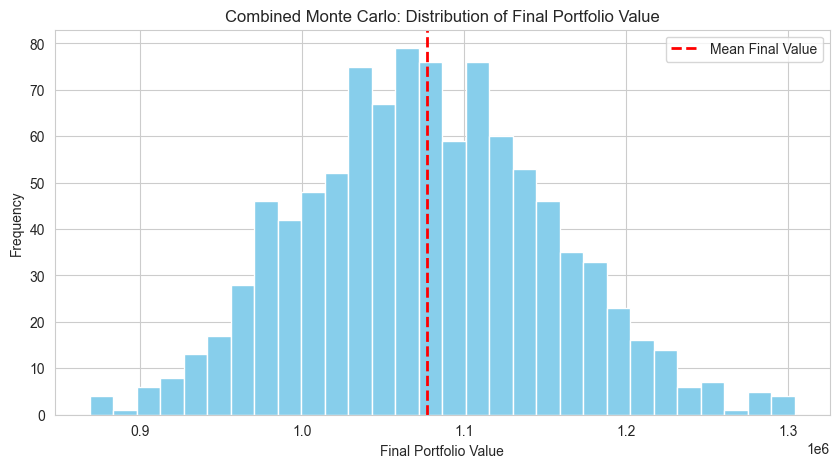

Monte Carlo: Mean Final Value = 1,077,004.71, 5th Percentile = 957,639.29, 95th Percentile = 1,206,567.03


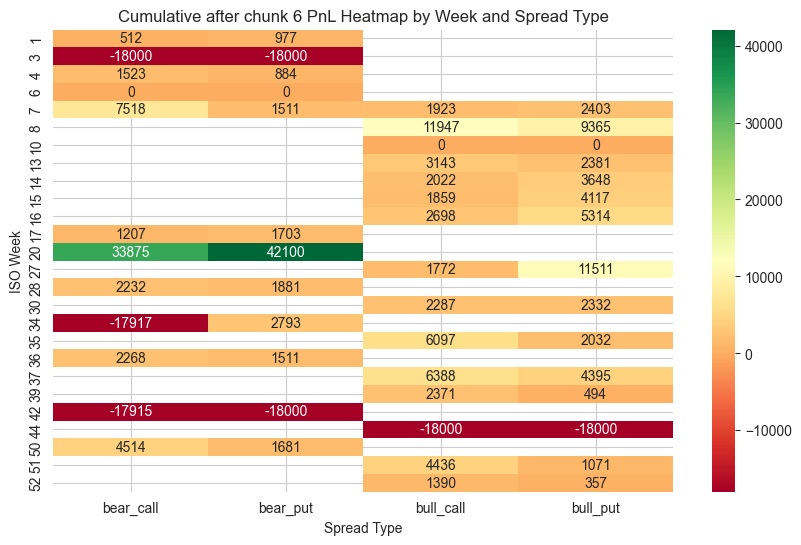


=== Processing chunk 7: 2024-06-01 09:15:00+05:30 to 2024-08-01 09:14:00+05:30 ===


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\958104352.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(



Sell-Side Chunk 7 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹1,000,653.10
Total Return:       0.07%
Max Drawdown:       ₹0.00
Sharpe Ratio:       12.02
Sortino Ratio:      0.00
Calmar Ratio:       0.00

Trade Statistics:
-----------------
Total Trades:       2
Winning Trades:     2
Losing Trades:      0
Avg PnL:            ₹326.55
Best Trade:         ₹594.38
Worst Trade:        ₹58.73
Trade Period:       2024-06-25 to 2024-06-25



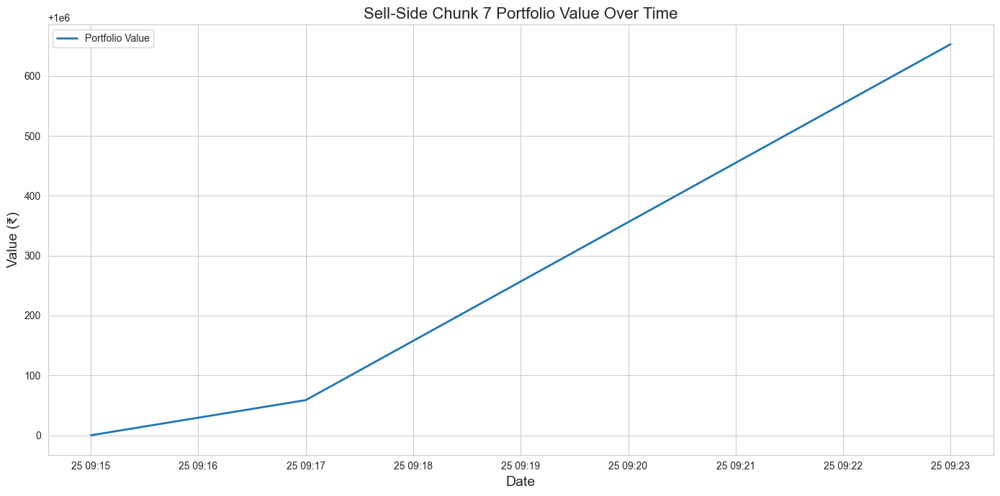

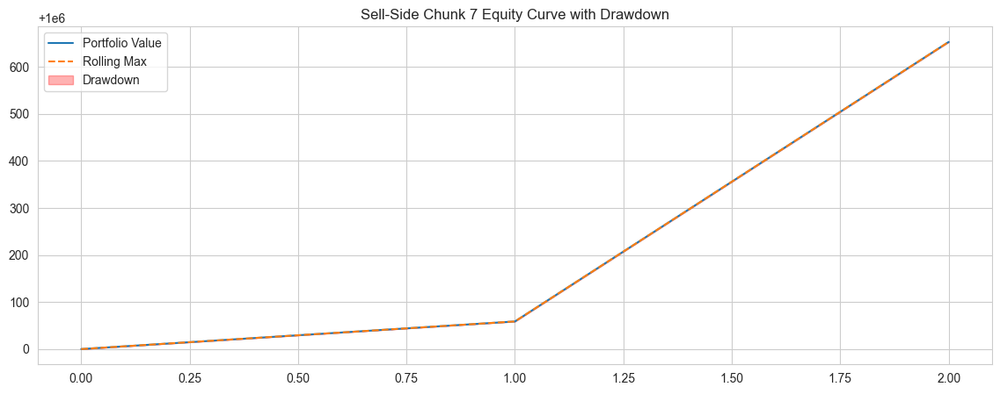

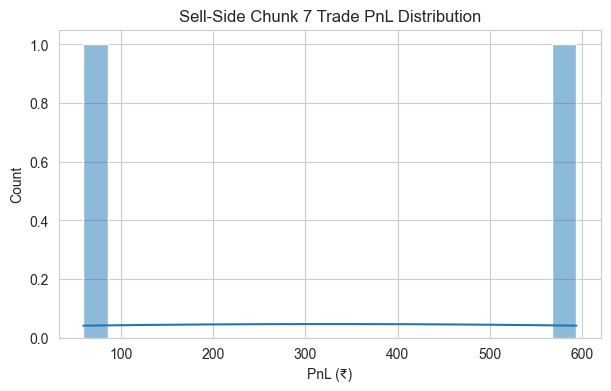

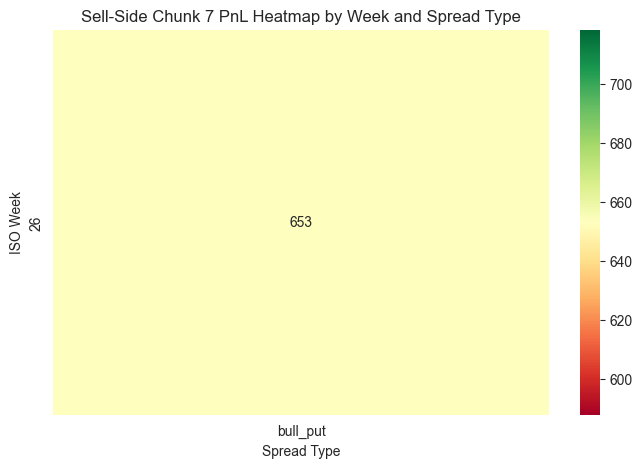

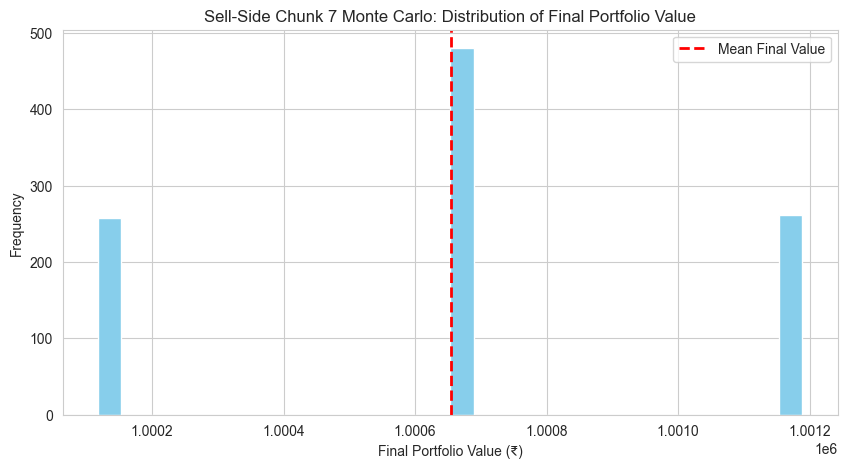

Monte Carlo: Mean Final Value = ₹1,000,655.24, 5th Percentile = ₹1,000,117.45, 95th Percentile = ₹1,001,188.75


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\958104352.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(



Buy-Side Chunk 7 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹1,001,923.45
Total Return:       0.19%
Max Drawdown:       ₹0.00
Sharpe Ratio:       11.71
Sortino Ratio:      0.00
Calmar Ratio:       0.00

Trade Statistics:
-----------------
Total Trades:       2
Winning Trades:     2
Losing Trades:      0
Avg PnL:            ₹961.72
Best Trade:         ₹1,845.60
Worst Trade:        ₹77.85
Trade Period:       2024-06-25 to 2024-06-25



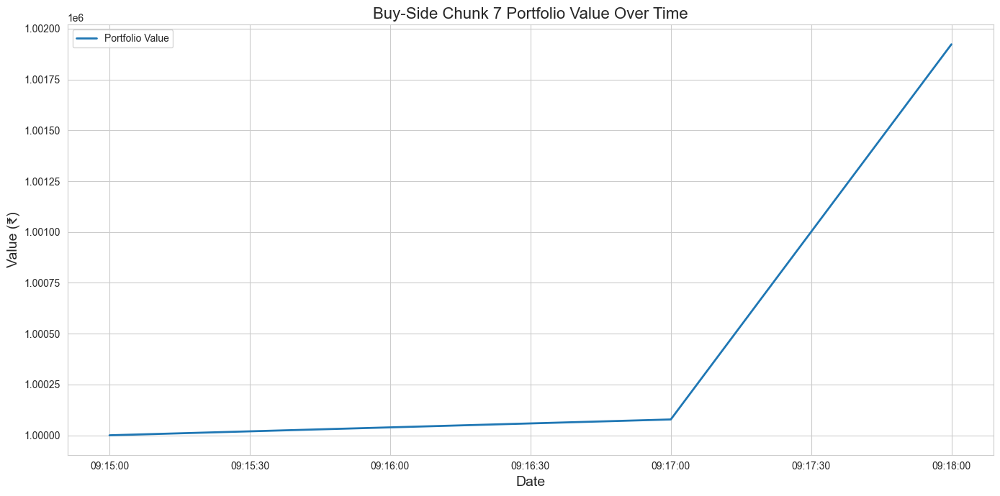

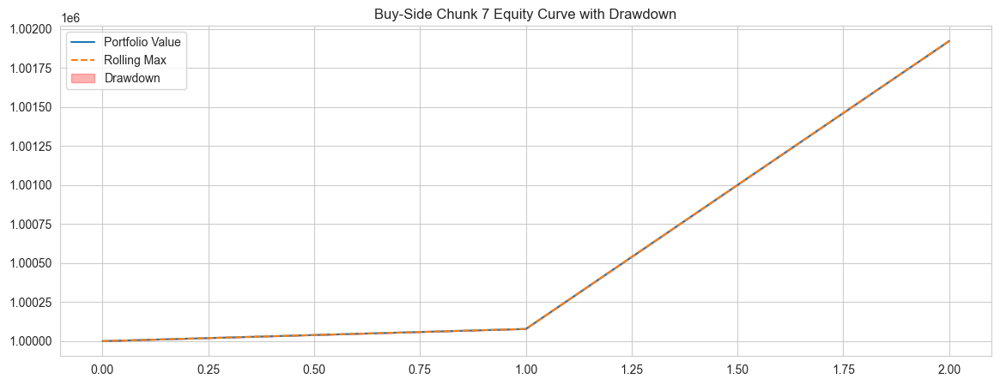

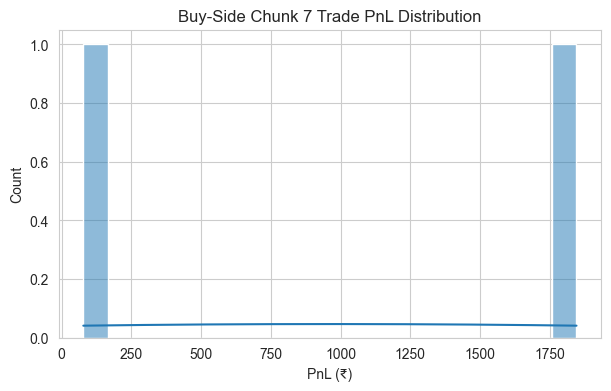

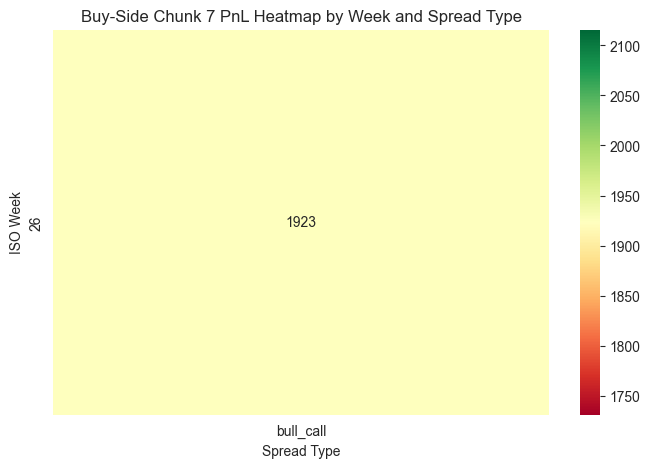

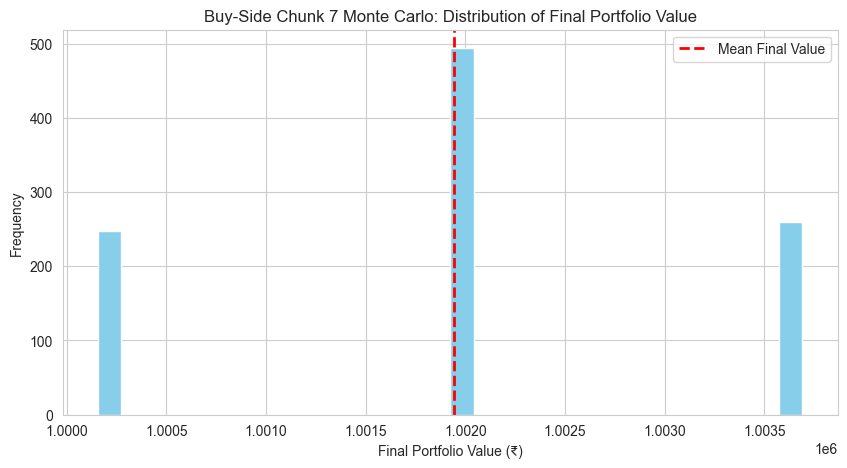

Monte Carlo: Mean Final Value = ₹1,001,944.66, 5th Percentile = ₹1,000,155.70, 95th Percentile = ₹1,003,691.20

===== CUMULATIVE REPORT AFTER CHUNK 7 =====

Combined Strategy Performance Report:
-----------------------------
Initial Capital:    1,000,000.00
Final Portfolio:    1,083,187.42
Total Return:       8.32%
Max Drawdown:       90,130.88
Sharpe Ratio:       1.55
Sortino Ratio:      21.60
Calmar Ratio:       0.95
Total Trades:       113
Winning Trades:     102
Losing Trades:      11
Avg PnL:            736.17
Best Trade:         42,052.00
Worst Trade:        -18,000.00
Trade Period:       2023-07-04 to 2024-06-25



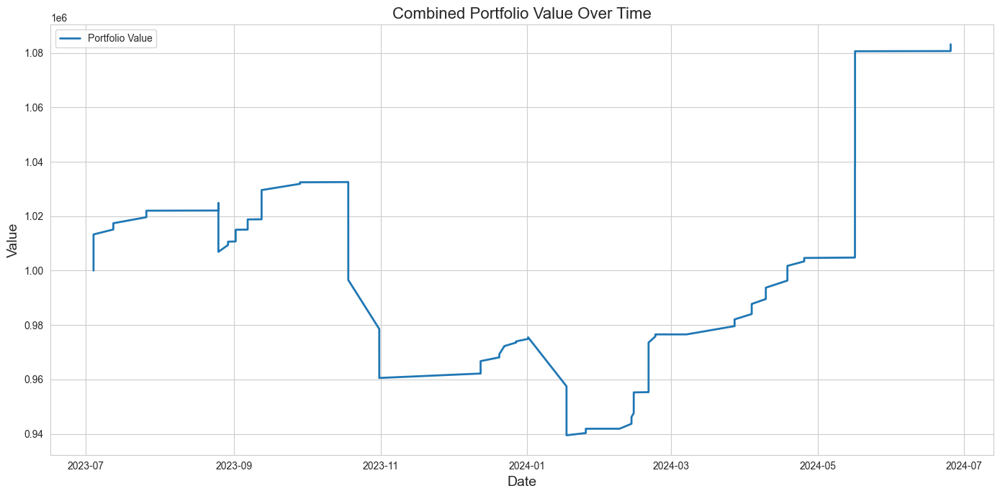

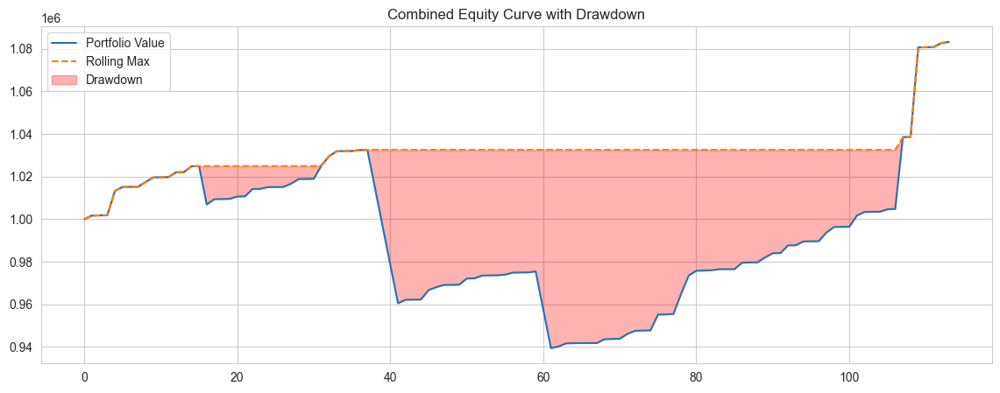

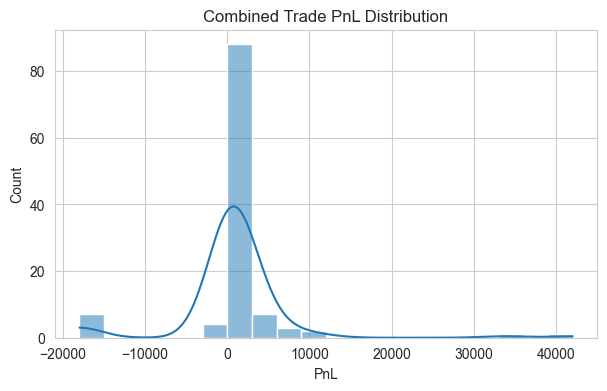

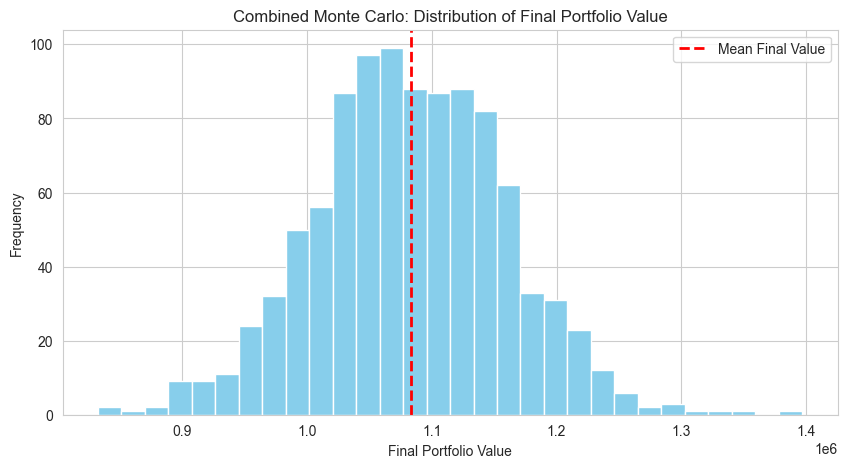

Monte Carlo: Mean Final Value = 1,083,193.53, 5th Percentile = 960,436.45, 95th Percentile = 1,207,573.32


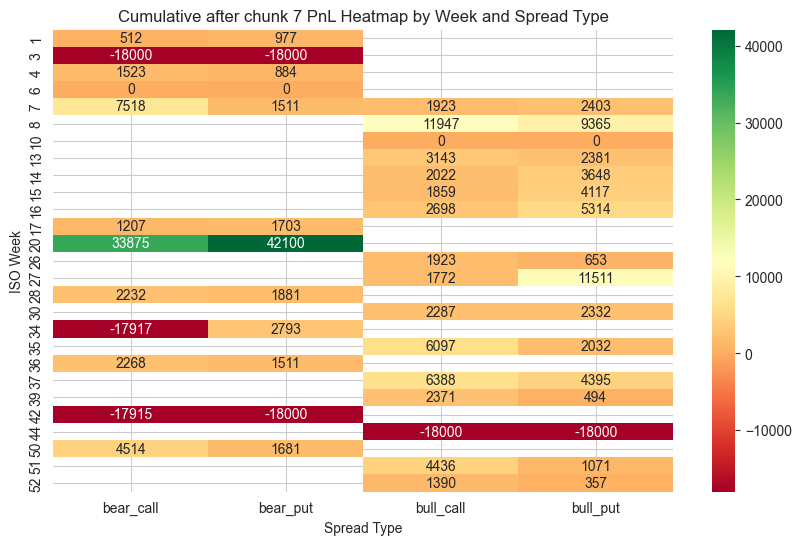


=== Processing chunk 8: 2024-08-01 09:15:00+05:30 to 2024-10-01 09:14:00+05:30 ===


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\958104352.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(



Sell-Side Chunk 8 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹1,002,623.43
Total Return:       0.26%
Max Drawdown:       ₹0.00
Sharpe Ratio:       9.05
Sortino Ratio:      0.00
Calmar Ratio:       0.00

Trade Statistics:
-----------------
Total Trades:       10
Winning Trades:     6
Losing Trades:      4
Avg PnL:            ₹262.34
Best Trade:         ₹1,014.75
Worst Trade:        ₹0.00
Trade Period:       2024-08-08 to 2024-09-17



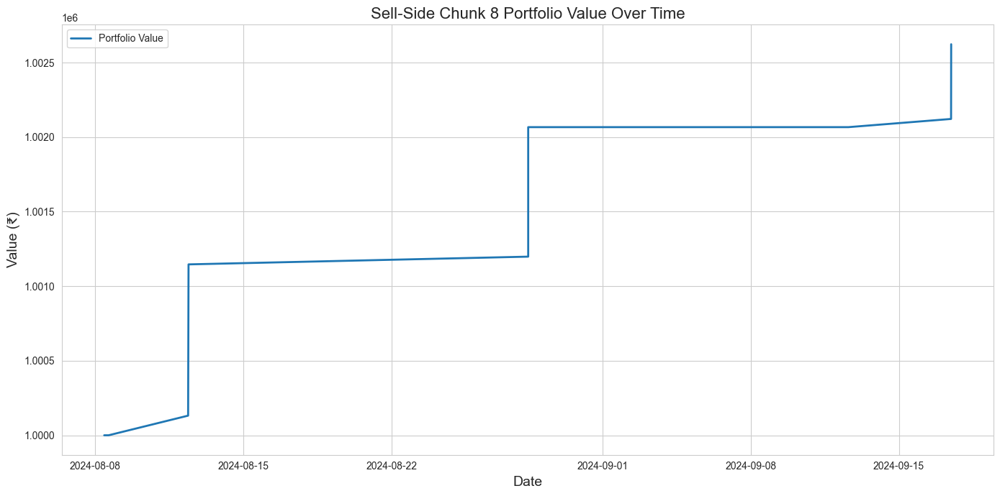

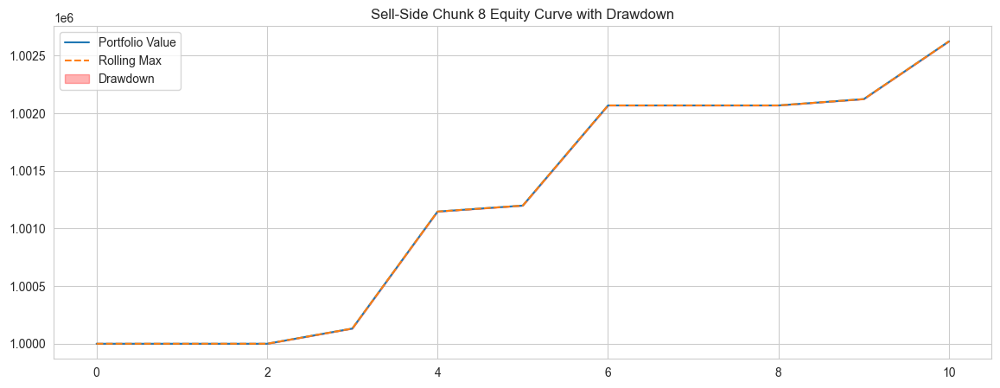

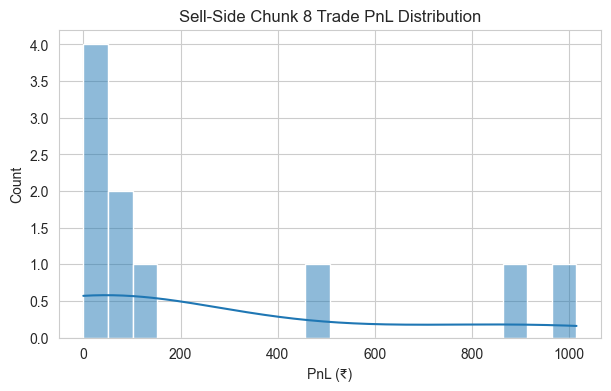

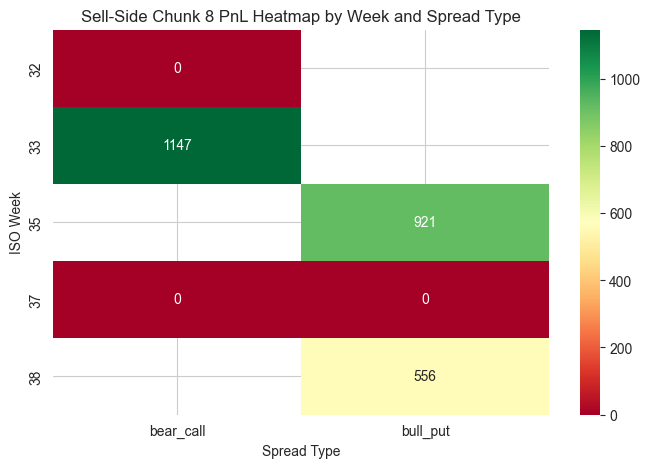

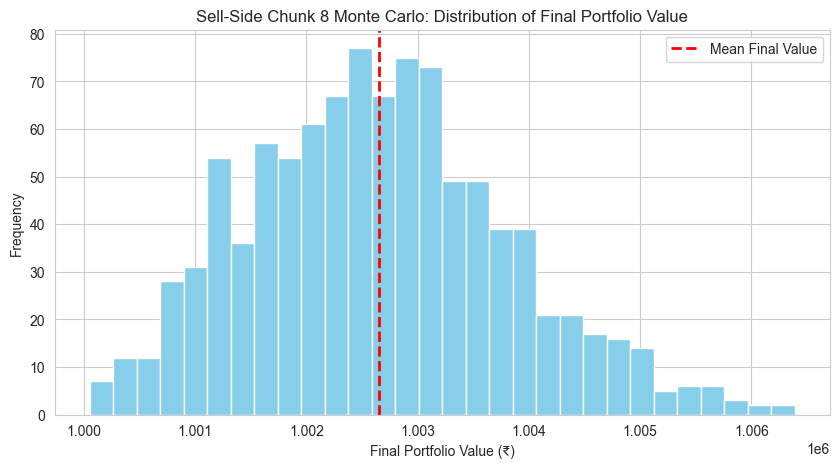

Monte Carlo: Mean Final Value = ₹1,002,652.92, 5th Percentile = ₹1,000,821.77, 95th Percentile = ₹1,004,771.49


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\958104352.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(



Buy-Side Chunk 8 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹1,006,809.72
Total Return:       0.68%
Max Drawdown:       ₹0.00
Sharpe Ratio:       9.24
Sortino Ratio:      0.00
Calmar Ratio:       0.00

Trade Statistics:
-----------------
Total Trades:       10
Winning Trades:     6
Losing Trades:      4
Avg PnL:            ₹680.97
Best Trade:         ₹2,690.40
Worst Trade:        ₹0.00
Trade Period:       2024-08-08 to 2024-09-17



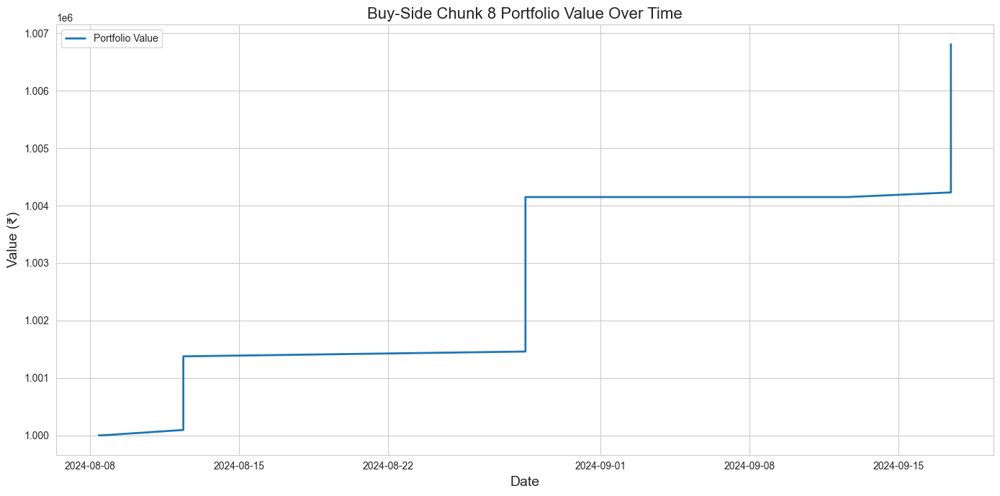

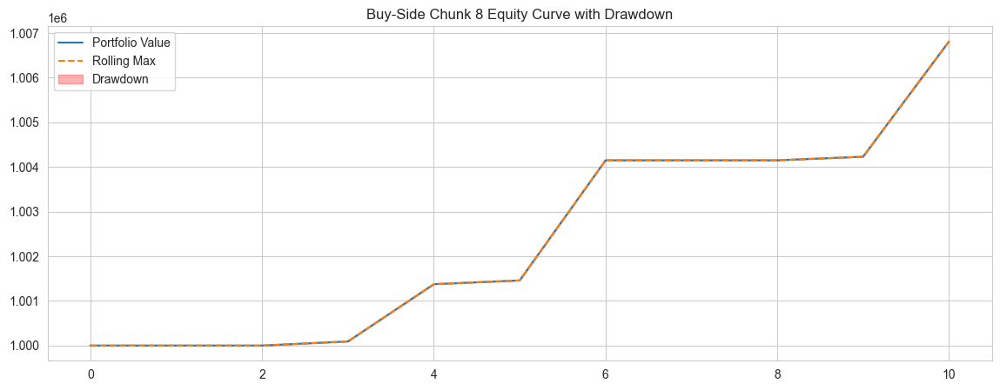

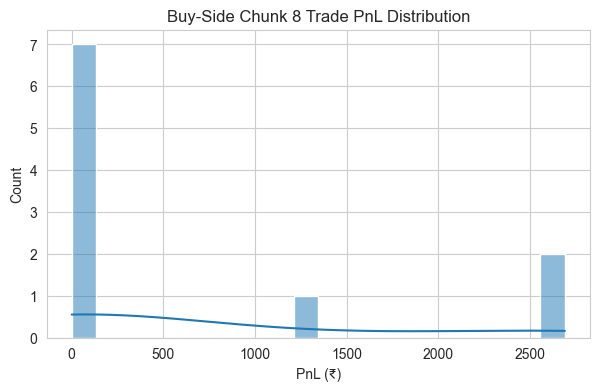

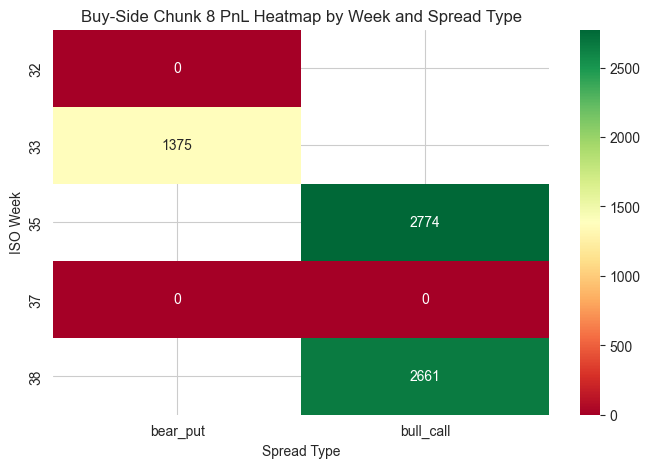

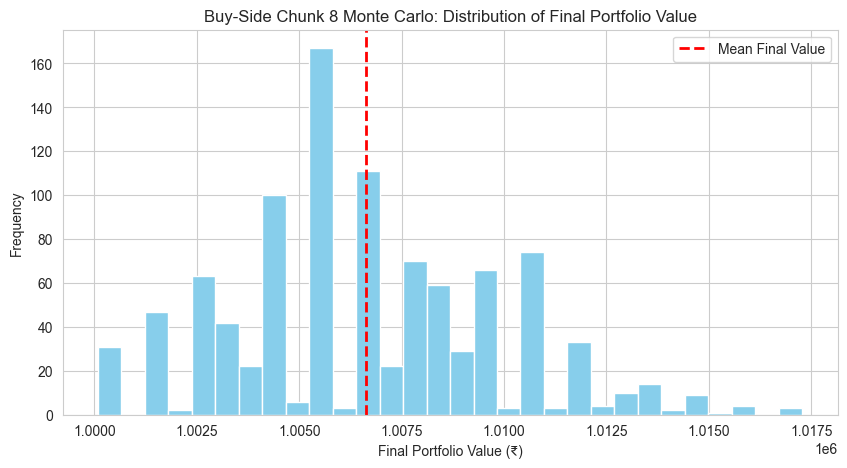

Monte Carlo: Mean Final Value = ₹1,006,626.03, 5th Percentile = ₹1,001,551.32, 95th Percentile = ₹1,012,098.33

===== CUMULATIVE REPORT AFTER CHUNK 8 =====

Combined Strategy Performance Report:
-----------------------------
Initial Capital:    1,000,000.00
Final Portfolio:    1,092,620.57
Total Return:       9.26%
Max Drawdown:       90,130.88
Sharpe Ratio:       1.57
Sortino Ratio:      20.20
Calmar Ratio:       0.84
Total Trades:       133
Winning Trades:     114
Losing Trades:      19
Avg PnL:            696.40
Best Trade:         42,052.00
Worst Trade:        -18,000.00
Trade Period:       2023-07-04 to 2024-09-17



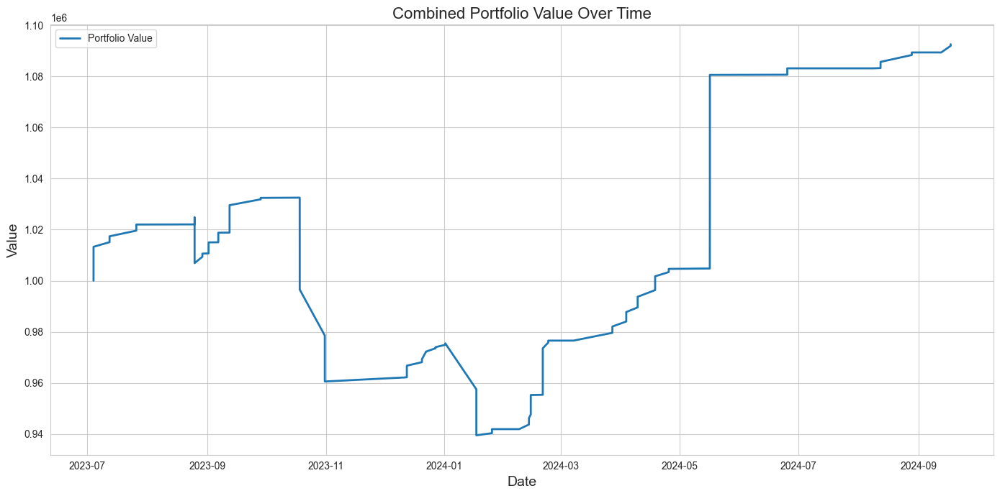

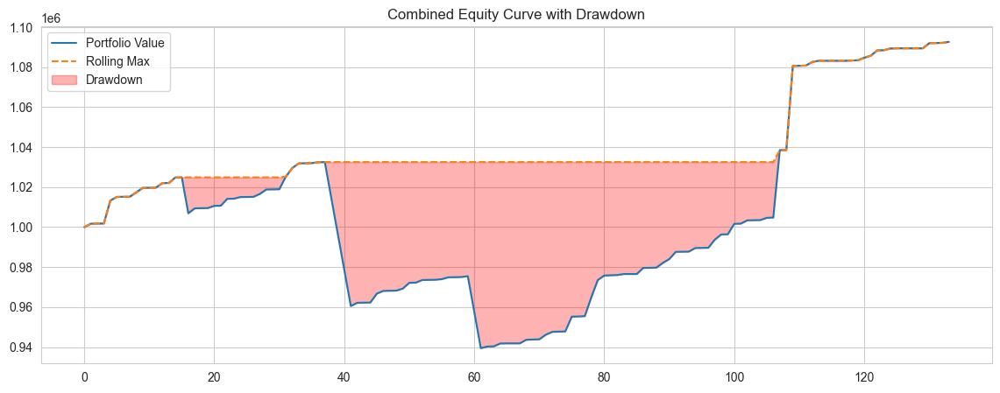

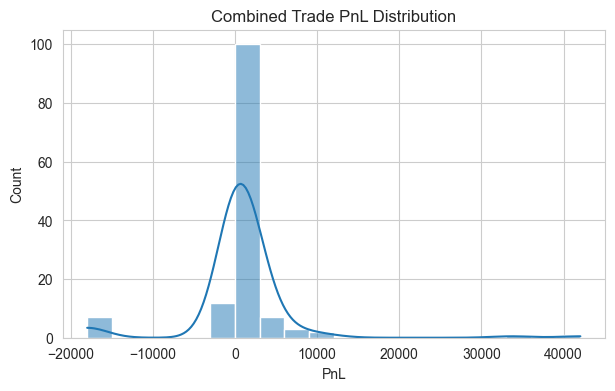

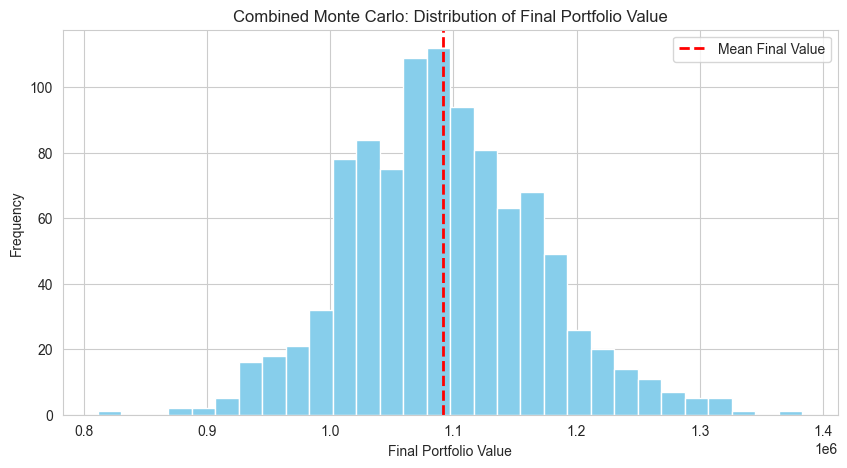

Monte Carlo: Mean Final Value = 1,091,793.77, 5th Percentile = 970,916.98, 95th Percentile = 1,224,960.39


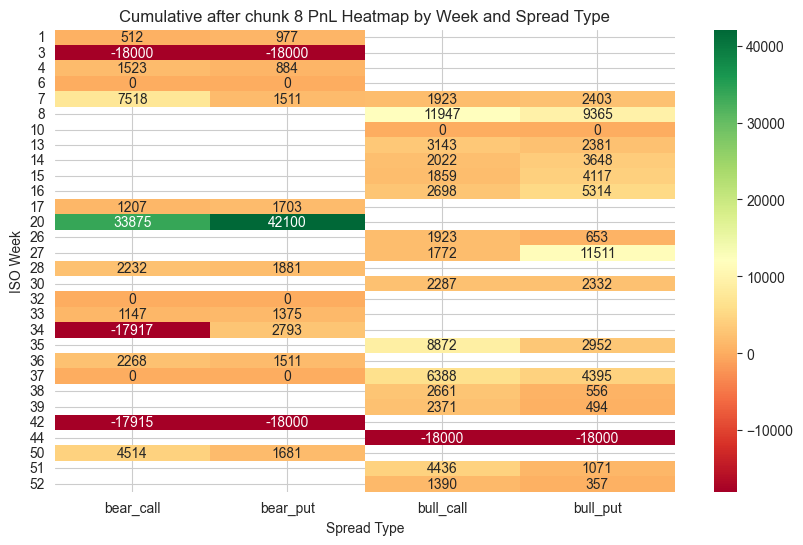


=== Processing chunk 9: 2024-10-01 09:15:00+05:30 to 2024-12-01 09:14:00+05:30 ===


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\958104352.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(



Sell-Side Chunk 9 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹1,003,221.25
Total Return:       0.32%
Max Drawdown:       ₹0.00
Sharpe Ratio:       11.36
Sortino Ratio:      0.00
Calmar Ratio:       0.00

Trade Statistics:
-----------------
Total Trades:       4
Winning Trades:     4
Losing Trades:      0
Avg PnL:            ₹805.31
Best Trade:         ₹2,376.00
Worst Trade:        ₹108.75
Trade Period:       2024-11-26 to 2024-11-26



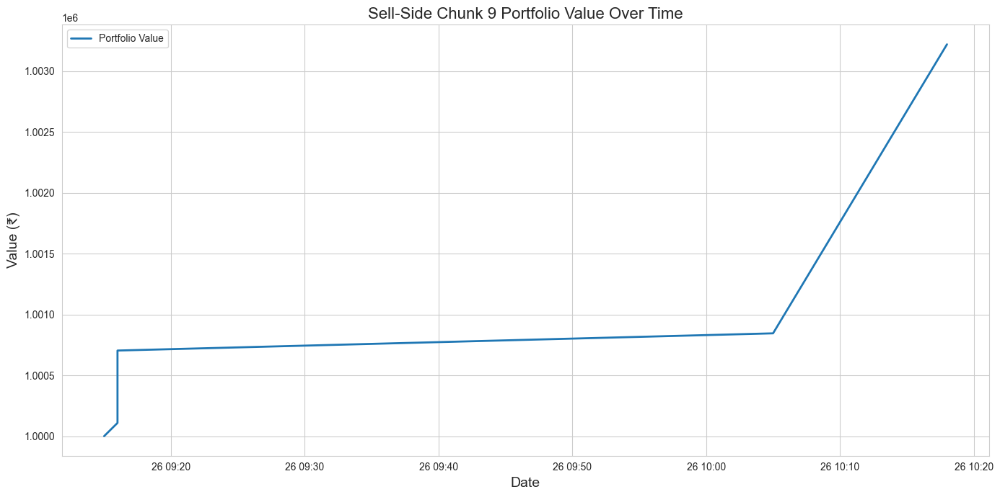

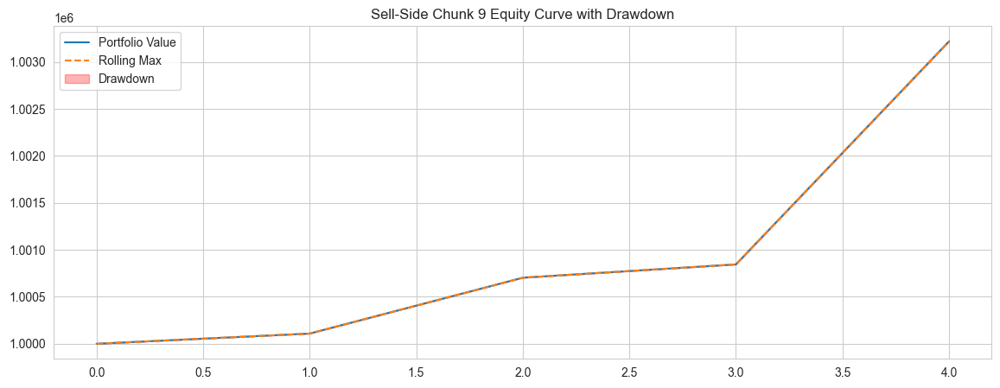

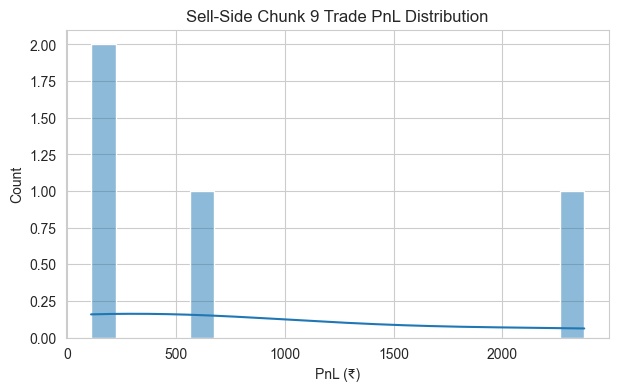

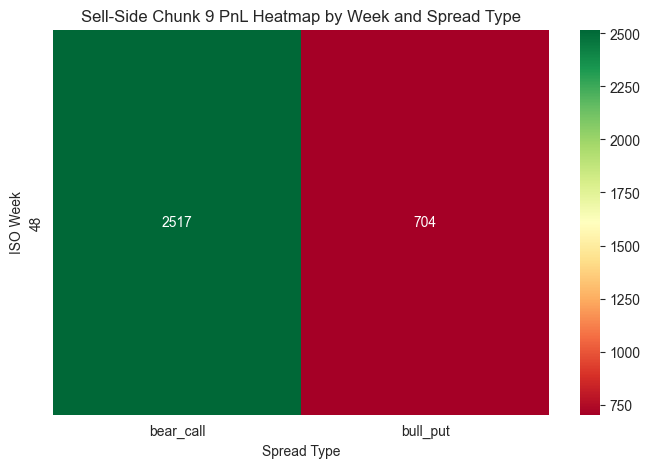

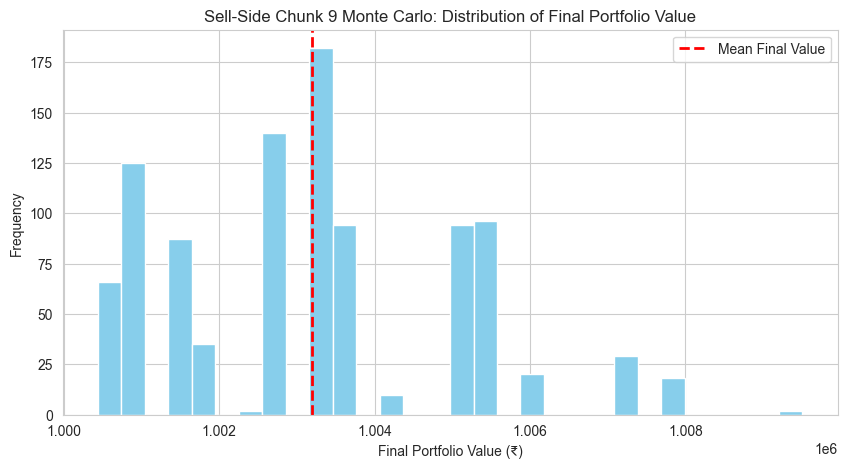

Monte Carlo: Mean Final Value = ₹1,003,194.10, 5th Percentile = ₹1,000,533.25, 95th Percentile = ₹1,005,942.00


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\958104352.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(



Buy-Side Chunk 9 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹1,003,718.75
Total Return:       0.37%
Max Drawdown:       ₹0.00
Sharpe Ratio:       14.52
Sortino Ratio:      0.00
Calmar Ratio:       0.00

Trade Statistics:
-----------------
Total Trades:       4
Winning Trades:     4
Losing Trades:      0
Avg PnL:            ₹929.69
Best Trade:         ₹2,020.00
Worst Trade:        ₹92.50
Trade Period:       2024-11-26 to 2024-11-26



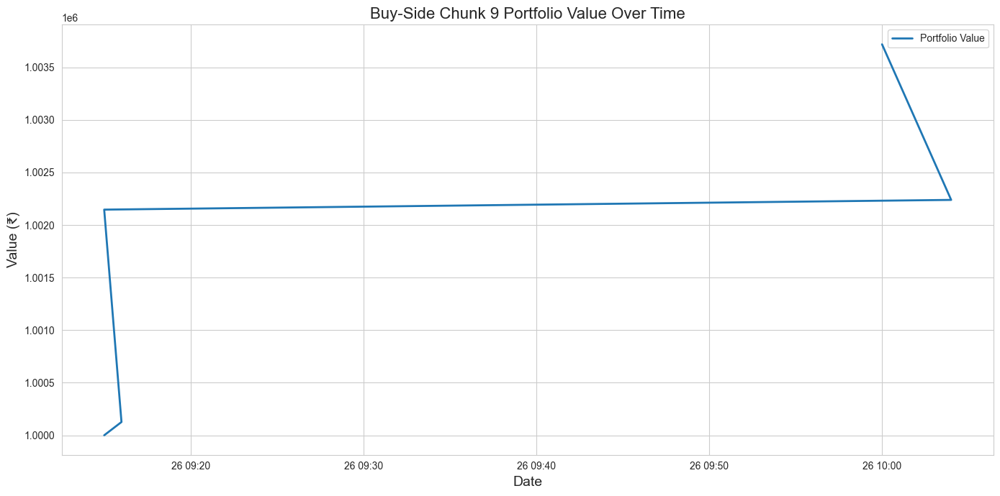

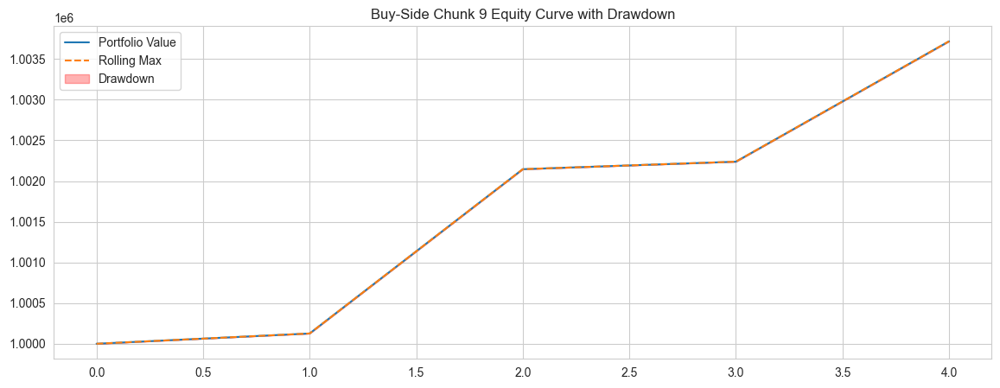

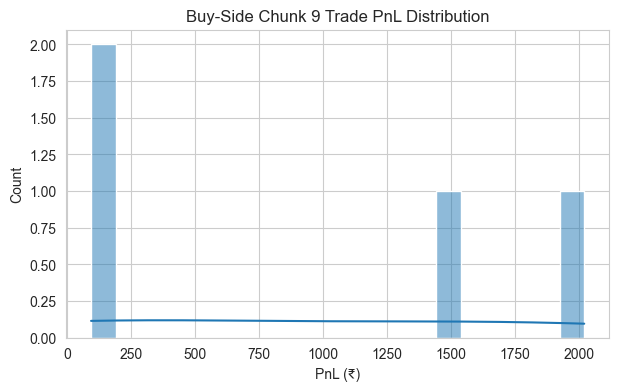

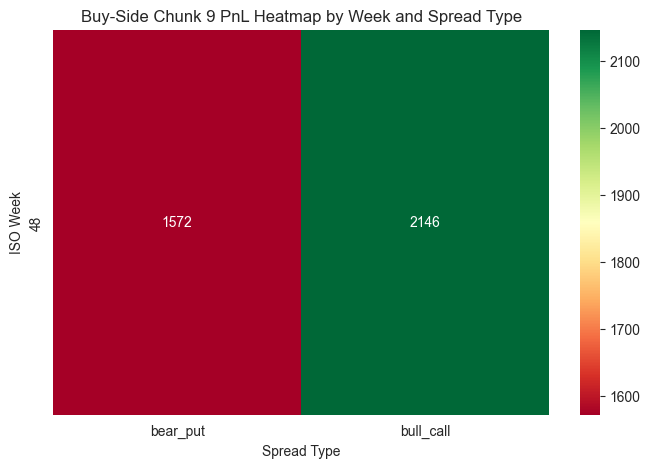

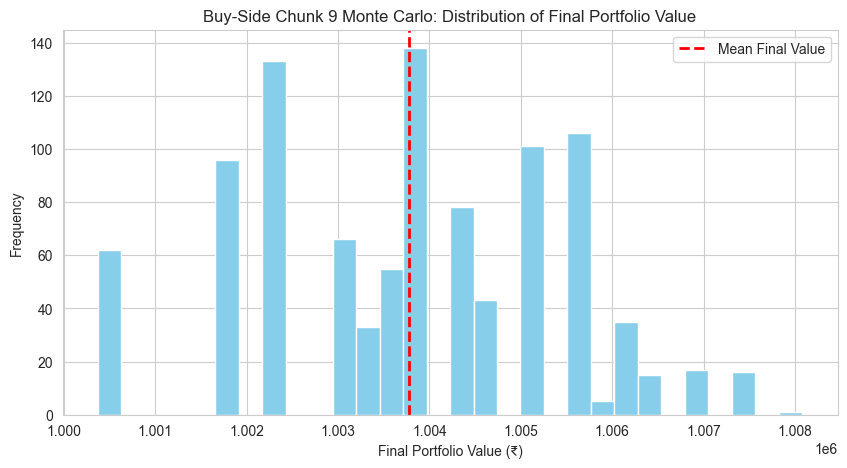

Monte Carlo: Mean Final Value = ₹1,003,774.25, 5th Percentile = ₹1,000,471.25, 95th Percentile = ₹1,006,186.25

===== CUMULATIVE REPORT AFTER CHUNK 9 =====

Combined Strategy Performance Report:
-----------------------------
Initial Capital:    1,000,000.00
Final Portfolio:    1,099,560.57
Total Return:       9.96%
Max Drawdown:       90,130.88
Sharpe Ratio:       1.63
Sortino Ratio:      20.38
Calmar Ratio:       0.78
Total Trades:       141
Winning Trades:     122
Losing Trades:      19
Avg PnL:            706.10
Best Trade:         42,052.00
Worst Trade:        -18,000.00
Trade Period:       2023-07-04 to 2024-11-26



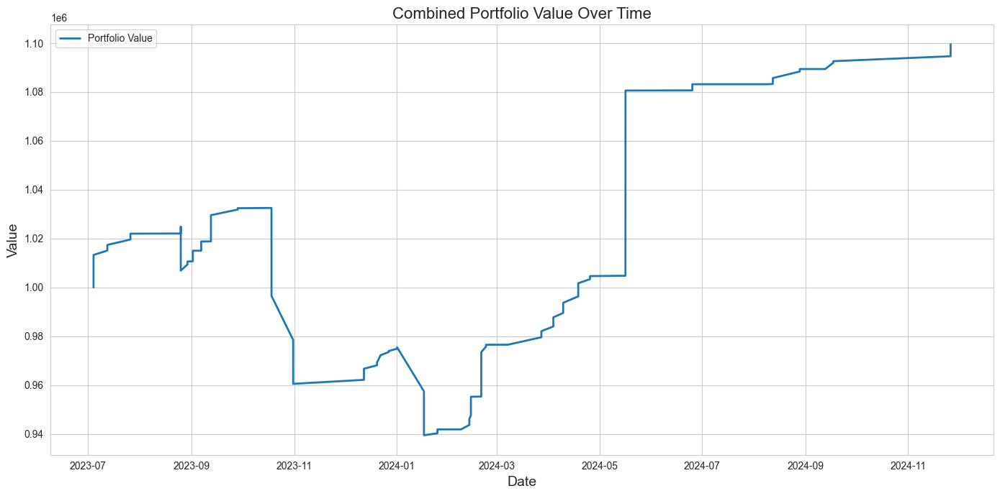

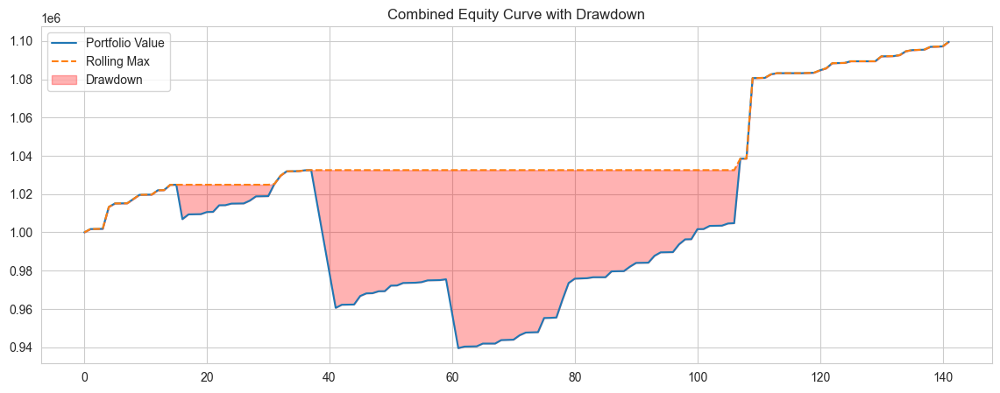

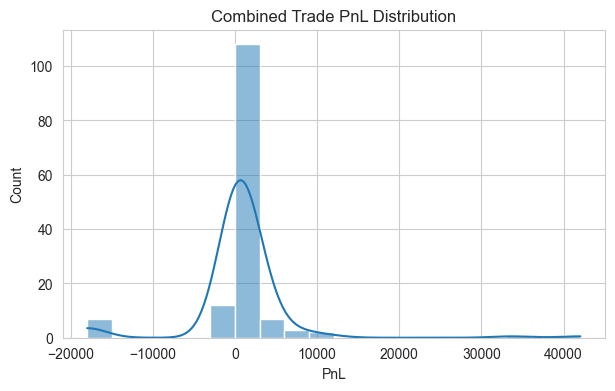

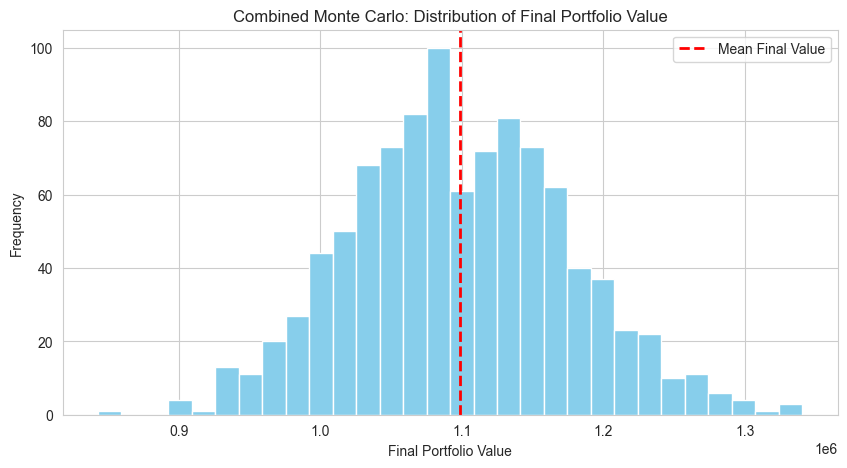

Monte Carlo: Mean Final Value = 1,098,675.20, 5th Percentile = 976,457.18, 95th Percentile = 1,227,948.30


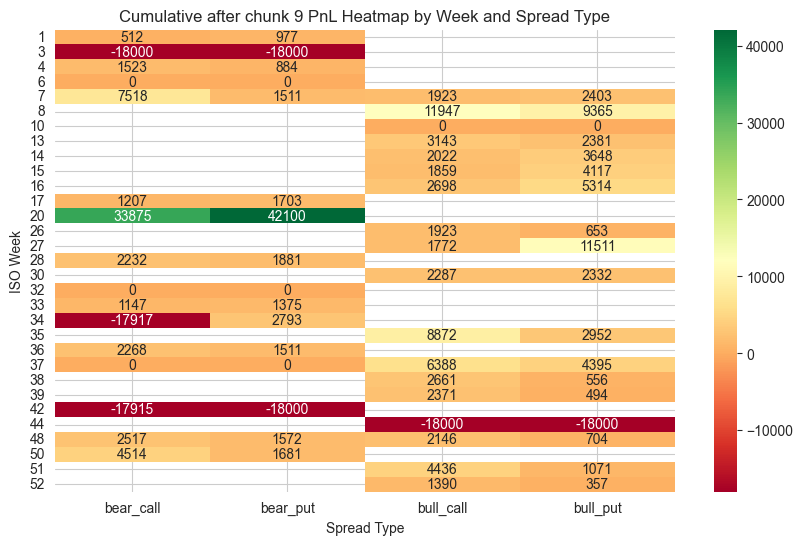


=== Processing chunk 10: 2024-12-01 09:15:00+05:30 to 2025-01-16 15:30:00+05:30 ===


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\958104352.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(



Sell-Side Chunk 10 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹983,083.25
Total Return:       -1.69%
Max Drawdown:       ₹17,980.52
Sharpe Ratio:       -6.64
Sortino Ratio:      0.00
Calmar Ratio:       -28.45

Trade Statistics:
-----------------
Total Trades:       5
Winning Trades:     3
Losing Trades:      2
Avg PnL:            ₹-3,383.35
Best Trade:         ₹885.50
Worst Trade:        ₹-18,000.00
Trade Period:       2024-12-12 to 2025-01-15



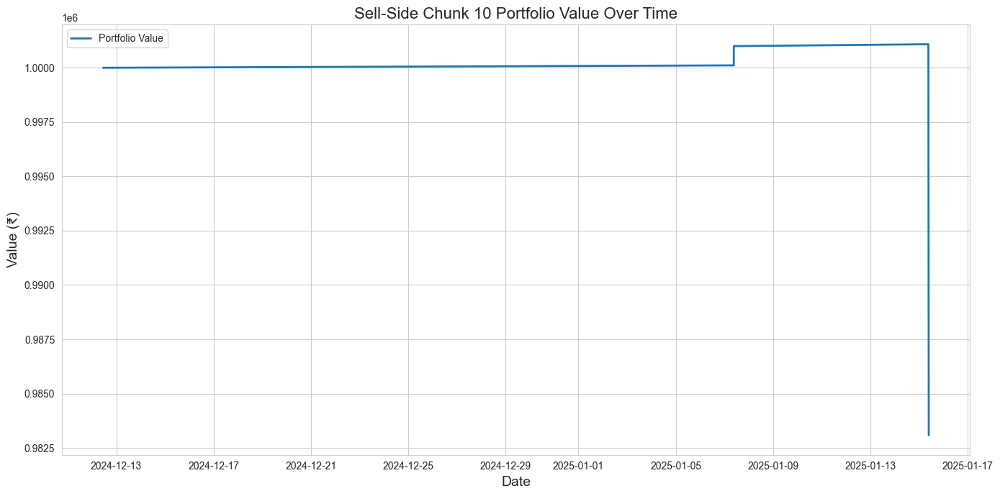

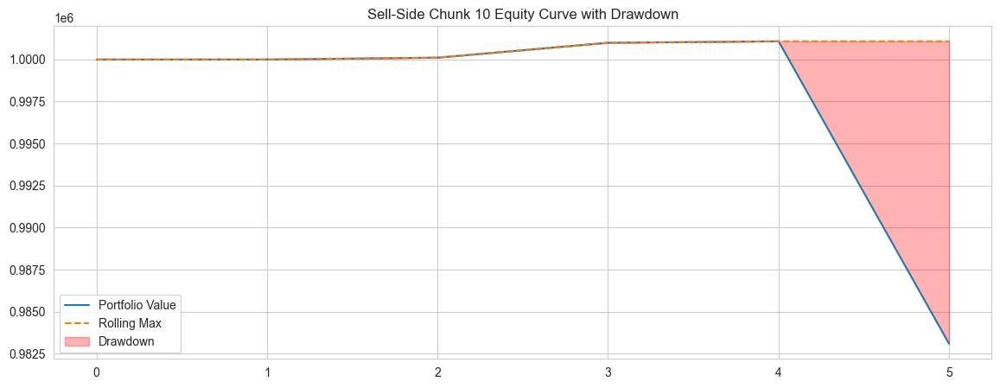

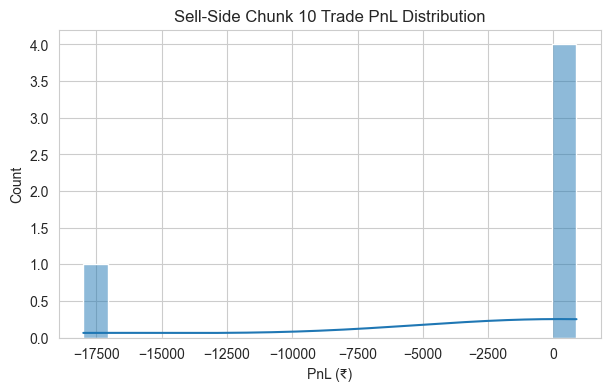

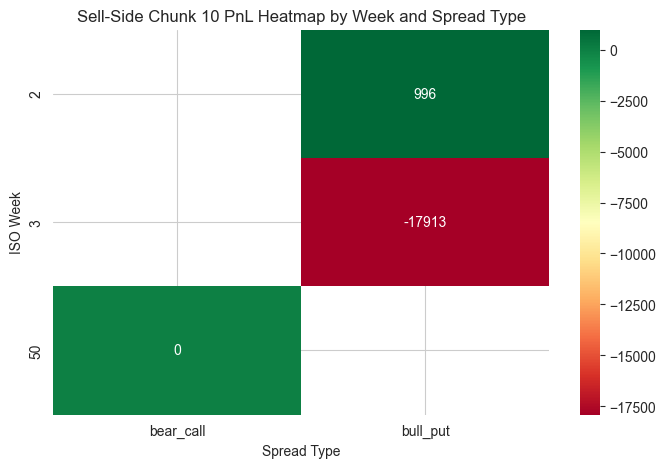

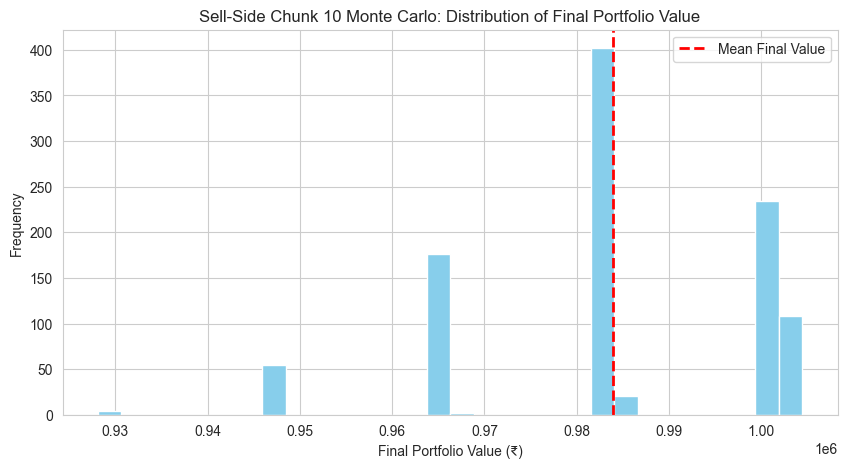

Monte Carlo: Mean Final Value = ₹983,868.62, 5th Percentile = ₹946,996.38, 95th Percentile = ₹1,002,055.62


C:\Users\cmman\AppData\Local\Temp\ipykernel_31836\958104352.py:100: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(



Buy-Side Chunk 10 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹1,004,946.75
Total Return:       0.49%
Max Drawdown:       ₹0.00
Sharpe Ratio:       11.55
Sortino Ratio:      0.00
Calmar Ratio:       0.00

Trade Statistics:
-----------------
Total Trades:       5
Winning Trades:     4
Losing Trades:      1
Avg PnL:            ₹989.35
Best Trade:         ₹2,878.00
Worst Trade:        ₹0.00
Trade Period:       2024-12-12 to 2025-01-15



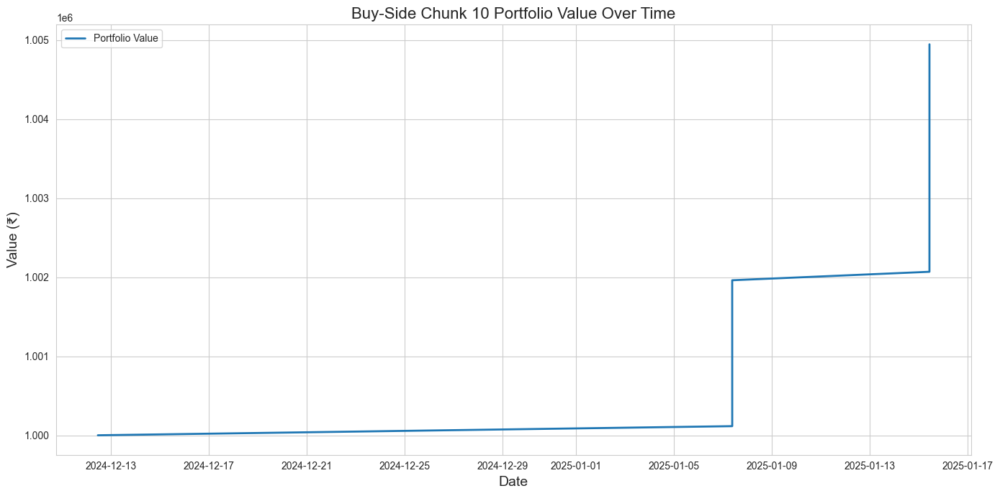

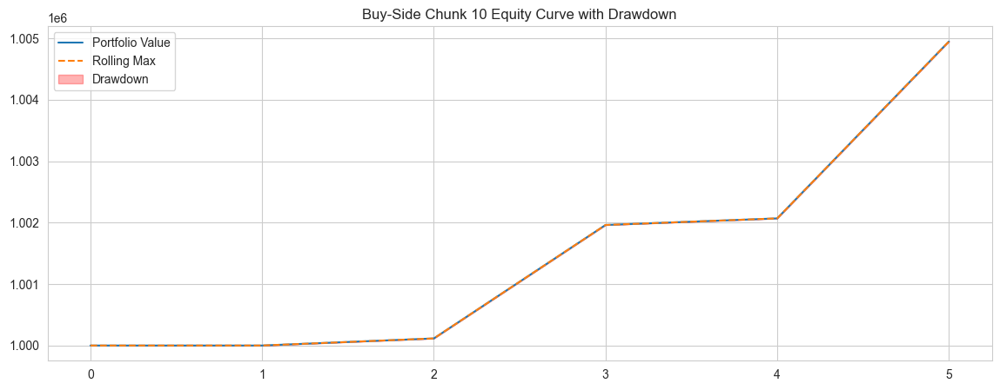

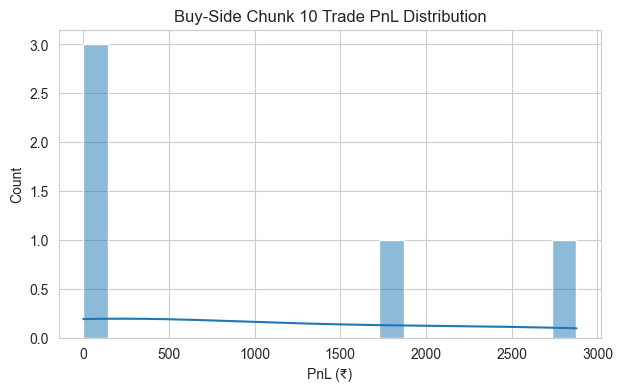

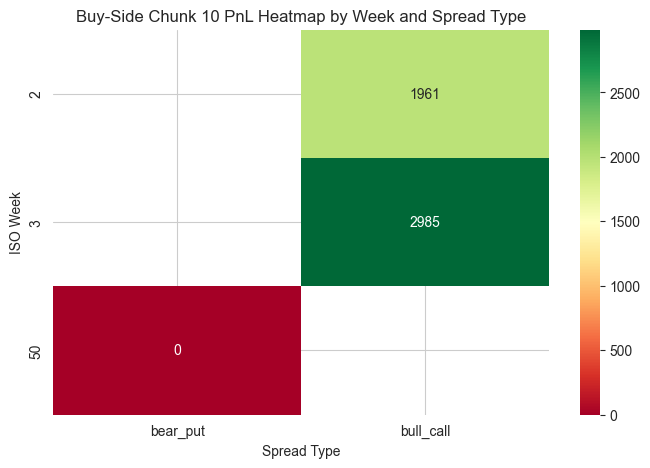

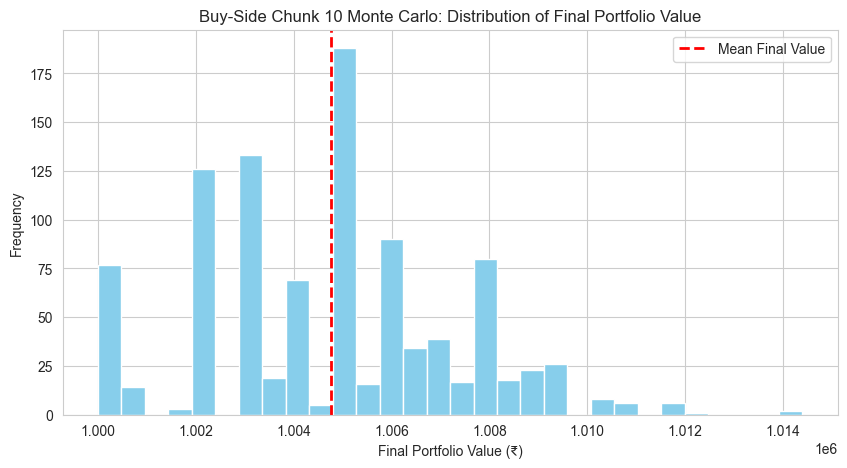

Monte Carlo: Mean Final Value = ₹1,004,763.64, 5th Percentile = ₹1,000,437.50, 95th Percentile = ₹1,008,857.15

===== CUMULATIVE REPORT AFTER CHUNK 10 =====

Combined Strategy Performance Report:
-----------------------------
Initial Capital:    1,000,000.00
Final Portfolio:    1,087,590.57
Total Return:       8.76%
Max Drawdown:       90,130.88
Sharpe Ratio:       1.35
Sortino Ratio:      10.99
Calmar Ratio:       0.62
Total Trades:       151
Winning Trades:     129
Losing Trades:      22
Avg PnL:            580.07
Best Trade:         42,052.00
Worst Trade:        -18,000.00
Trade Period:       2023-07-04 to 2025-01-15



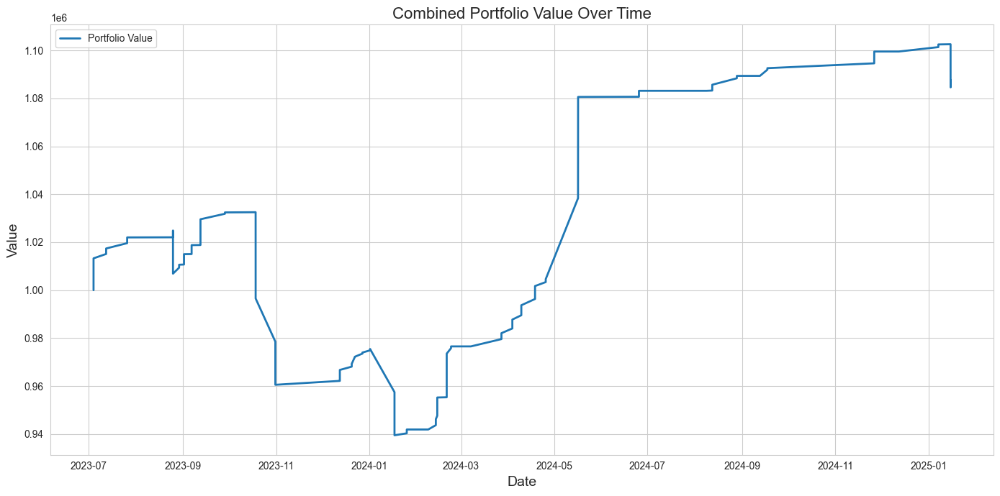

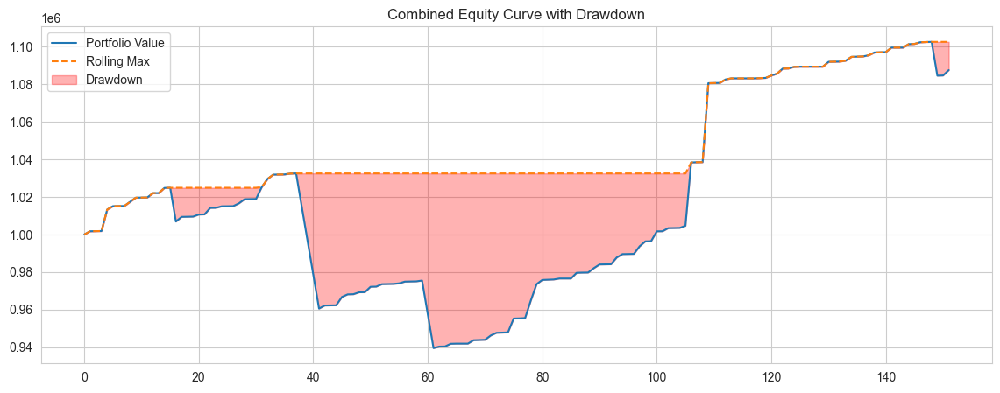

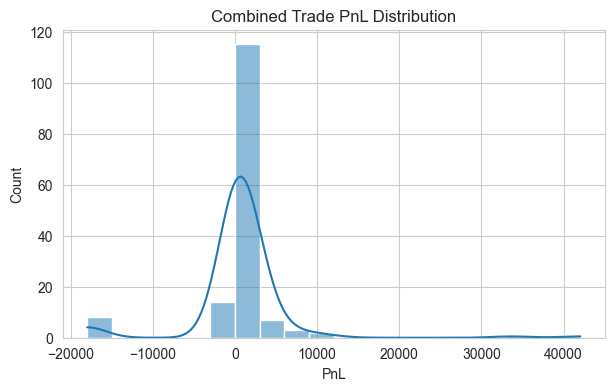

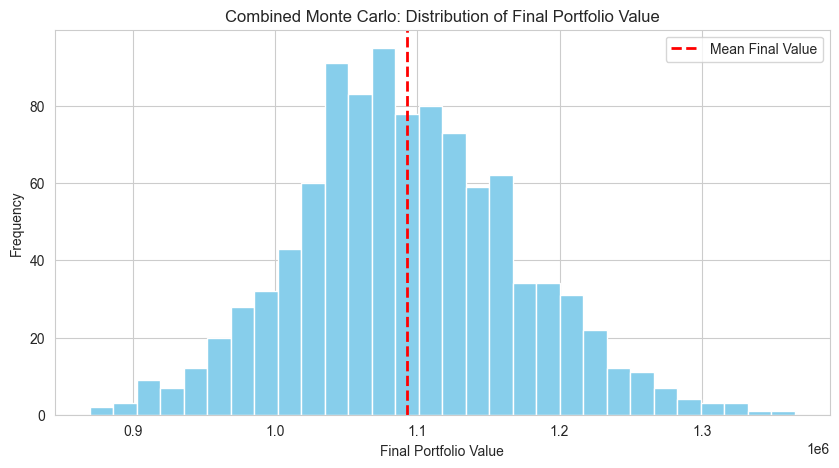

Monte Carlo: Mean Final Value = 1,092,922.88, 5th Percentile = 968,065.30, 95th Percentile = 1,225,273.47


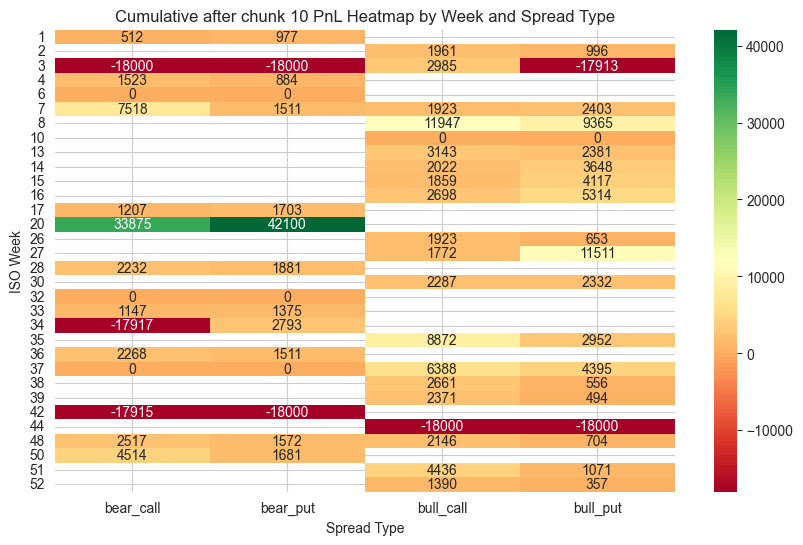

In [8]:
import pandas as pd
import numpy as np
import os
from datetime import datetime, timedelta
import matplotlib.pyplot as plt
import seaborn as sns

# =========================
# CONFIGURATION
# =========================
initial_capital = 1000000
lot_size = 50
ATR_PERIOD = 10
ATR_MULTIPLIER = 2.5
BROKERAGE_PER_ORDER = 20
SLIPPAGE_PCT = 0.001
MARKET_CLOSE_TIME = '15:25:00'
VIX_LOW = 14
VIX_HIGH = 22
RISK_LOW = 0.15
RISK_MED = 0.10
RISK_HIGH = 0.05
CONFIRM_LOOKBACK = 10
MAX_LOSS = 18000
PARTIAL_BOOK_PCT = 0.2  # 20% position booked at first TP

# =========================
# DATA LOADING
# =========================
def load_spot(start_date, end_date):
    df = pd.read_csv(r"D:\Bits Hyderabad_Campus Diaries\PS-1\AlgoBulls\Options_Backtest_Local_Data\NIFTY_50_minute_data_Jun23_Feb25.csv", parse_dates=['date'])
    df = df.set_index('date')
    df.index = pd.to_datetime(df.index).tz_localize('Asia/Kolkata')
    df = df.loc[start_date:end_date]
    return df

def load_signals_15min():
    signals_path = r"D:\Bits Hyderabad_Campus Diaries\PS-1\AlgoBulls\Options_Backtest_Local_Data\Nifty_50_signals_15min_2023_25_50_200.csv"
    signals = pd.read_csv(signals_path, parse_dates=['date'])
    signals = signals.set_index('date')
    if signals.index.tz is None:
        signals.index = pd.to_datetime(signals.index).tz_localize('Asia/Kolkata')
    else:
        signals.index = signals.index.tz_convert('Asia/Kolkata')
    if 'Signal' not in signals.columns:
        signals.columns = ['Signal']
    return signals

def load_options_sample():
    sample_path = r"D:\Bits Hyderabad_Campus Diaries\PS-1\AlgoBulls\Options_Backtest_Local_Data\Jun23_Feb25_options_sample_ALL_EXPIRIES.csv"
    options_sample = pd.read_csv(sample_path)
    options_sample['TimeStamp'] = pd.to_datetime(options_sample['TimeStamp'])
    if options_sample['TimeStamp'].dt.tz is None:
        options_sample['TimeStamp'] = options_sample['TimeStamp'].dt.tz_localize('Asia/Kolkata')
    else:
        options_sample['TimeStamp'] = options_sample['TimeStamp'].dt.tz_convert('Asia/Kolkata')
    options_sample['Expiry'] = pd.to_datetime(options_sample['Expiry'])
    return options_sample

def load_vix(start_date, end_date):
    vix_path = r"D:\Bits Hyderabad_Campus Diaries\PS-1\AlgoBulls\Options_Backtest_Local_Data\filtered_INDIA_VIX_Jun23_Feb25.csv"
    vix = pd.read_csv(vix_path, parse_dates=['TimeStamp'])
    vix = vix.set_index('TimeStamp')
    vix.index = pd.to_datetime(vix.index).tz_localize('Asia/Kolkata')
    vix = vix.loc[start_date:end_date]
    return vix

# =========================
# ADAPTIVE VIX FILTER (10th/90th percentile)
# =========================
def adaptive_vix_trend_filter(vix_series, current_time, window=252, low_pct=0.1, high_pct=0.9):
    vix_hist = vix_series.loc[:current_time].tail(window)
    if len(vix_hist) < window // 2:
        return False
    low_thr = np.percentile(vix_hist, low_pct*100)
    high_thr = np.percentile(vix_hist, high_pct*100)
    curr_vix = vix_series.loc[current_time]
    return (curr_vix > low_thr) and (curr_vix < high_thr)

# =========================
# STRATEGY HELPERS
# =========================
def get_nearest_strike(strikes, target):
    return min(strikes, key=lambda x: abs(x - target))

def get_nearest_expiry(expiry_list, ts):
    future_expiries = [e for e in expiry_list if e >= ts.date()]
    return min(future_expiries) if future_expiries else None

def compute_atr_fixed(df, period=ATR_PERIOD):
    high = df['High']
    low = df['Low']
    close = df['Close']
    prev_close = close.shift(1)
    tr = pd.concat([high - low, (high - prev_close).abs(), (low - prev_close).abs()], axis=1).max(axis=1)
    atr = tr.rolling(window=period, min_periods=1).mean()
    return atr

def assign_atr(options_data):
    atr_values = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False).apply(
        lambda x: compute_atr_fixed(x[['High', 'Low', 'Close']], ATR_PERIOD)
    )
    options_data.loc[atr_values.index, 'ATR'] = atr_values
    return options_data

def get_risk_per_trade(vix_value):
    if vix_value <= 14:
        return 0.20
    elif vix_value <= VIX_LOW:
        return RISK_LOW
    elif vix_value <= VIX_HIGH:
        return RISK_MED
    else:
        return RISK_HIGH

def price_breakout_confirmation(spot_data, ts, direction, lookback=CONFIRM_LOOKBACK, sma_period=21):
    window = spot_data.loc[:ts].iloc[-lookback:]
    if len(window) < lookback:
        return False
    last_close = window['close'].iloc[-1]
    mean_high = window['high'][:-1].mean()
    mean_low = window['low'][:-1].mean()
    sma21 = window['close'].rolling(window=sma_period, min_periods=1).mean().iloc[-1]
    if direction == 1:
        return last_close > mean_high and last_close > sma21
    elif direction == -1:
        return last_close < mean_low and last_close < sma21
    return False

def trend_filter(spot_data, ts, direction, sma_period=50):
    window = spot_data.loc[:ts].iloc[-sma_period:]
    if len(window) < sma_period:
        return False
    last_close = window['close'].iloc[-1]
    sma = window['close'].mean()
    if direction == 1:
        return last_close > sma
    elif direction == -1:
        return last_close < sma
    return False

def get_dynamic_tp(vix_val):
    if vix_val <= VIX_LOW + 1:
        return 0.15
    elif vix_val <= VIX_HIGH - 1:
        return 0.25
    else:
        return 0.35

# =========================
# SELL-SIDE STRATEGY (CREDIT SPREADS)
# =========================
def execute_sell_side(spot_data, signals, options_data, vix_data):
    portfolio_cash = initial_capital
    trade_log = []
    total_brokerage = 0
    total_slippage = 0
    available_strikes = np.sort(options_data['Strike'].unique())
    expiry_list = sorted(options_data['Expiry'].dt.date.unique())
    signals_15min = signals.reindex(spot_data.index, method='ffill').dropna()
    vix_data = vix_data.reindex(spot_data.index, method='ffill').dropna()
    vix_series = vix_data['Close']
    open_spread = None
    prev_signal = 0
    options_data = assign_atr(options_data)
    for ts, row in spot_data.iterrows():
        if ts not in signals_15min.index or pd.isna(row['close']):
            continue
        signal = signals_15min.loc[ts, 'Signal']
        spot_price = row['close']
        atm_strike = int(round(spot_price / 50) * 50)
        expiry = get_nearest_expiry(expiry_list, ts)
        vix_val = vix_data.loc[ts, 'Close'] if ts in vix_data.index else None
        if expiry is None or vix_val is None or np.isnan(vix_val):
            prev_signal = signal
            continue
        risk_per_trade = get_risk_per_trade(vix_val)
        # ADAPTIVE VIX FILTER
        if not adaptive_vix_trend_filter(vix_series, ts):
            prev_signal = signal
            continue
        if not trend_filter(spot_data, ts, signal, sma_period=50):
            prev_signal = signal
            continue
        if open_spread is None and signal != 0 and signal != prev_signal and price_breakout_confirmation(spot_data, ts, signal):
            if signal == 1:
                short_strike = atm_strike
                long_strike = atm_strike - 100
                short_leg = options_data[
                    (options_data['Strike'] == short_strike) &
                    (options_data['Type'] == 'PE') &
                    (options_data['Expiry'].dt.date == expiry) &
                    (options_data['TimeStamp'] >= ts)
                ].sort_values('TimeStamp')
                long_leg = options_data[
                    (options_data['Strike'] == long_strike) &
                    (options_data['Type'] == 'PE') &
                    (options_data['Expiry'].dt.date == expiry) &
                    (options_data['TimeStamp'] >= ts)
                ].sort_values('TimeStamp')
            else:
                short_strike = atm_strike
                long_strike = atm_strike + 100
                short_leg = options_data[
                    (options_data['Strike'] == short_strike) &
                    (options_data['Type'] == 'CE') &
                    (options_data['Expiry'].dt.date == expiry) &
                    (options_data['TimeStamp'] >= ts)
                ].sort_values('TimeStamp')
                long_leg = options_data[
                    (options_data['Strike'] == long_strike) &
                    (options_data['Type'] == 'CE') &
                    (options_data['Expiry'].dt.date == expiry) &
                    (options_data['TimeStamp'] >= ts)
                ].sort_values('TimeStamp')
            if short_leg.empty or long_leg.empty:
                prev_signal = signal
                continue
            short_price = float(short_leg.iloc[0]['Close'])
            long_price = float(long_leg.iloc[0]['Close'])
            credit = (short_price - long_price) * lot_size
            margin_per_lot = abs(short_strike - long_strike) * lot_size - credit
            lots = int((portfolio_cash * risk_per_trade) // margin_per_lot)
            if lots < 1:
                prev_signal = signal
                continue
            tp_pct = get_dynamic_tp(vix_val)
            open_spread = {
                'entry_date': ts,
                'short_leg': {'strike': short_strike, 'type': short_leg.iloc[0]['Type'], 'expiry': expiry, 'price': short_price},
                'long_leg': {'strike': long_strike, 'type': long_leg.iloc[0]['Type'], 'expiry': expiry, 'price': long_price},
                'credit': credit,
                'lots': lots,
                'direction': 'bull_put' if signal == 1 else 'bear_call',
                'risk_per_trade': risk_per_trade,
                'vix_at_entry': vix_val,
                'tp_pct': tp_pct,
                'partial_booked': False
            }
            prev_signal = signal
            continue
        if open_spread is not None:
            short_leg, long_leg = open_spread['short_leg'], open_spread['long_leg']
            spread_rows_short = options_data[
                (options_data['Strike'] == short_leg['strike']) &
                (options_data['Type'] == short_leg['type']) &
                (options_data['Expiry'].dt.date == short_leg['expiry']) &
                (options_data['TimeStamp'] >= open_spread['entry_date']) &
                (options_data['TimeStamp'] <= ts)
            ].sort_values('TimeStamp')
            spread_rows_long = options_data[
                (options_data['Strike'] == long_leg['strike']) &
                (options_data['Type'] == long_leg['type']) &
                (options_data['Expiry'].dt.date == long_leg['expiry']) &
                (options_data['TimeStamp'] >= open_spread['entry_date']) &
                (options_data['TimeStamp'] <= ts)
            ].sort_values('TimeStamp')
            for i in range(min(len(spread_rows_short), len(spread_rows_long))):
                short_price = float(spread_rows_short.iloc[i]['Close'])
                long_price = float(spread_rows_long.iloc[i]['Close'])
                spread_value = (short_price - long_price) * lot_size
                pnl = (open_spread['credit'] - spread_value) * open_spread['lots']
                tp_level = open_spread['credit'] * open_spread['tp_pct']
                if not open_spread['partial_booked'] and pnl > tp_level:
                    booked_pnl = tp_level * PARTIAL_BOOK_PCT
                    portfolio_cash += booked_pnl
                    open_spread['credit'] -= booked_pnl
                    open_spread['lots'] = int(open_spread['lots'] * (1 - PARTIAL_BOOK_PCT))
                    open_spread['partial_booked'] = True
                    trade_log.append({**open_spread, 'exit_date': spread_rows_short.iloc[i]['TimeStamp'], 'exit_pnl': booked_pnl, 'exit_reason': 'Partial TP'})
                elif pnl > tp_level and open_spread['partial_booked']:
                    exit_time = spread_rows_short.iloc[i]['TimeStamp']
                    portfolio_cash += pnl
                    trade_log.append({**open_spread, 'exit_date': exit_time, 'exit_pnl': pnl, 'exit_reason': 'Full TP'})
                    open_spread = None
                    break
                elif pnl < -MAX_LOSS:
                    exit_time = spread_rows_short.iloc[i]['TimeStamp']
                    portfolio_cash += -MAX_LOSS
                    trade_log.append({**open_spread, 'exit_date': exit_time, 'exit_pnl': -MAX_LOSS, 'exit_reason': 'Max Loss'})
                    open_spread = None
                    break
                elif ts.date() >= open_spread['short_leg']['expiry']:
                    exit_time = spread_rows_short.iloc[i]['TimeStamp']
                    pnl = (open_spread['credit'] - spread_value) * open_spread['lots']
                    if pnl < -MAX_LOSS:
                        pnl = -MAX_LOSS
                    portfolio_cash += pnl
                    trade_log.append({**open_spread, 'exit_date': exit_time, 'exit_pnl': pnl, 'exit_reason': 'Expiry'})
                    open_spread = None
                    break
        prev_signal = signal
    return trade_log, total_brokerage, total_slippage

# =========================
# BUY-SIDE STRATEGY (DEBIT SPREADS)
# =========================
def execute_buy_side(spot_data, signals, options_data, vix_data):
    portfolio_cash = initial_capital
    trade_log = []
    total_brokerage = 0
    total_slippage = 0
    available_strikes = np.sort(options_data['Strike'].unique())
    expiry_list = sorted(options_data['Expiry'].dt.date.unique())
    signals_15min = signals.reindex(spot_data.index, method='ffill').dropna()
    vix_data = vix_data.reindex(spot_data.index, method='ffill').dropna()
    vix_series = vix_data['Close']
    open_spread = None
    prev_signal = 0
    options_data = assign_atr(options_data)
    for ts, row in spot_data.iterrows():
        if ts not in signals_15min.index or pd.isna(row['close']):
            continue
        signal = signals_15min.loc[ts, 'Signal']
        spot_price = row['close']
        atm_strike = int(round(spot_price / 50) * 50)
        expiry = get_nearest_expiry(expiry_list, ts)
        vix_val = vix_data.loc[ts, 'Close'] if ts in vix_data.index else None
        if expiry is None or vix_val is None or np.isnan(vix_val):
            prev_signal = signal
            continue
        risk_per_trade = get_risk_per_trade(vix_val)
        # ADAPTIVE VIX FILTER
        if not adaptive_vix_trend_filter(vix_series, ts):
            prev_signal = signal
            continue
        if not trend_filter(spot_data, ts, signal, sma_period=50):
            prev_signal = signal
            continue
        if open_spread is None and signal != 0 and signal != prev_signal and price_breakout_confirmation(spot_data, ts, signal):
            if signal == 1:
                long_strike = atm_strike
                short_strike = atm_strike + 100
                long_leg = options_data[
                    (options_data['Strike'] == long_strike) &
                    (options_data['Type'] == 'CE') &
                    (options_data['Expiry'].dt.date == expiry) &
                    (options_data['TimeStamp'] >= ts)
                ].sort_values('TimeStamp')
                short_leg = options_data[
                    (options_data['Strike'] == short_strike) &
                    (options_data['Type'] == 'CE') &
                    (options_data['Expiry'].dt.date == expiry) &
                    (options_data['TimeStamp'] >= ts)
                ].sort_values('TimeStamp')
            else:
                long_strike = atm_strike
                short_strike = atm_strike - 100
                long_leg = options_data[
                    (options_data['Strike'] == long_strike) &
                    (options_data['Type'] == 'PE') &
                    (options_data['Expiry'].dt.date == expiry) &
                    (options_data['TimeStamp'] >= ts)
                ].sort_values('TimeStamp')
                short_leg = options_data[
                    (options_data['Strike'] == short_strike) &
                    (options_data['Type'] == 'PE') &
                    (options_data['Expiry'].dt.date == expiry) &
                    (options_data['TimeStamp'] >= ts)
                ].sort_values('TimeStamp')
            if long_leg.empty or short_leg.empty:
                prev_signal = signal
                continue
            long_price = float(long_leg.iloc[0]['Close'])
            short_price = float(short_leg.iloc[0]['Close'])
            debit = (long_price - short_price) * lot_size
            margin_per_lot = abs(long_strike - short_strike) * lot_size
            lots = int((portfolio_cash * risk_per_trade) // margin_per_lot)
            if lots < 1:
                prev_signal = signal
                continue
            tp_pct = get_dynamic_tp(vix_val)
            open_spread = {
                'entry_date': ts,
                'long_leg': {'strike': long_strike, 'type': long_leg.iloc[0]['Type'], 'expiry': expiry, 'price': long_price},
                'short_leg': {'strike': short_strike, 'type': short_leg.iloc[0]['Type'], 'expiry': expiry, 'price': short_price},
                'debit': debit,
                'lots': lots,
                'direction': 'bull_call' if signal == 1 else 'bear_put',
                'risk_per_trade': risk_per_trade,
                'vix_at_entry': vix_val,
                'tp_pct': tp_pct,
                'partial_booked': False
            }
            prev_signal = signal
            continue
        if open_spread is not None:
            long_leg, short_leg = open_spread['long_leg'], open_spread['short_leg']
            spread_rows_long = options_data[
                (options_data['Strike'] == long_leg['strike']) &
                (options_data['Type'] == long_leg['type']) &
                (options_data['Expiry'].dt.date == long_leg['expiry']) &
                (options_data['TimeStamp'] >= open_spread['entry_date']) &
                (options_data['TimeStamp'] <= ts)
            ].sort_values('TimeStamp')
            spread_rows_short = options_data[
                (options_data['Strike'] == short_leg['strike']) &
                (options_data['Type'] == short_leg['type']) &
                (options_data['Expiry'].dt.date == short_leg['expiry']) &
                (options_data['TimeStamp'] >= open_spread['entry_date']) &
                (options_data['TimeStamp'] <= ts)
            ].sort_values('TimeStamp')
            for i in range(min(len(spread_rows_long), len(spread_rows_short))):
                long_price = float(spread_rows_long.iloc[i]['Close'])
                short_price = float(spread_rows_short.iloc[i]['Close'])
                spread_value = (long_price - short_price) * lot_size
                pnl = (spread_value - open_spread['debit']) * open_spread['lots']
                tp_level = open_spread['debit'] * open_spread['tp_pct']
                if not open_spread['partial_booked'] and pnl > tp_level:
                    booked_pnl = tp_level * PARTIAL_BOOK_PCT
                    portfolio_cash += booked_pnl
                    open_spread['debit'] -= booked_pnl
                    open_spread['lots'] = int(open_spread['lots'] * (1 - PARTIAL_BOOK_PCT))
                    open_spread['partial_booked'] = True
                    trade_log.append({**open_spread, 'exit_date': spread_rows_long.iloc[i]['TimeStamp'], 'exit_pnl': booked_pnl, 'exit_reason': 'Partial TP'})
                elif pnl > tp_level and open_spread['partial_booked']:
                    exit_time = spread_rows_long.iloc[i]['TimeStamp']
                    portfolio_cash += pnl
                    trade_log.append({**open_spread, 'exit_date': exit_time, 'exit_pnl': pnl, 'exit_reason': 'Full TP'})
                    open_spread = None
                    break
                elif pnl < -MAX_LOSS:
                    exit_time = spread_rows_long.iloc[i]['TimeStamp']
                    portfolio_cash += -MAX_LOSS
                    trade_log.append({**open_spread, 'exit_date': exit_time, 'exit_pnl': -MAX_LOSS, 'exit_reason': 'Max Loss'})
                    open_spread = None
                    break
                elif ts.date() >= open_spread['long_leg']['expiry']:
                    exit_time = spread_rows_long.iloc[i]['TimeStamp']
                    pnl = (spread_value - open_spread['debit']) * open_spread['lots']
                    if pnl < -MAX_LOSS:
                        pnl = -MAX_LOSS
                    portfolio_cash += pnl
                    trade_log.append({**open_spread, 'exit_date': exit_time, 'exit_pnl': pnl, 'exit_reason': 'Expiry'})
                    open_spread = None
                    break
        prev_signal = signal
    return trade_log, total_brokerage, total_slippage


# =========================
# PER-CHUNK REPORT (WITH HEATMAP)
# =========================
def strategy_report_and_visualizations(trade_log_df, initial_capital, title_prefix=""):
    if trade_log_df.empty:
        print("No trades to report.")
        return
    portfolio_values = [initial_capital]
    portfolio_dates = [trade_log_df['entry_date'].iloc[0]]
    current_value = initial_capital
    for i, row in trade_log_df.iterrows():
        current_value += row['exit_pnl']
        portfolio_values.append(current_value)
        portfolio_dates.append(row['exit_date'])
    returns = pd.Series(portfolio_values).pct_change().dropna()
    rf = 0.01  # risk-free rate (annual)
    sharpe = ((returns.mean() - rf/252) / returns.std()) * np.sqrt(252) if returns.std() > 0 else 0
    downside_std = returns[returns < 0].std()
    sortino = ((returns.mean() - rf/252) / downside_std) * np.sqrt(252) if downside_std > 0 else 0
    cumulative = pd.Series(portfolio_values)
    rolling_max = cumulative.cummax()
    drawdown = (cumulative - rolling_max) / rolling_max
    max_drawdown = abs(drawdown.min()) * initial_capital
    years = len(portfolio_values) / 252
    cagr = (portfolio_values[-1]/portfolio_values[0])**(1/years) - 1 if years > 0 else 0
    calmar = cagr / abs(drawdown.min()) if drawdown.min() != 0 else 0

    print(f"""
{title_prefix} Strategy Performance Report:
-----------------------------
Initial Capital:    ₹{initial_capital:,.2f}
Final Portfolio:    ₹{portfolio_values[-1]:,.2f}
Total Return:       {(portfolio_values[-1]/initial_capital-1)*100:.2f}%
Max Drawdown:       ₹{max_drawdown:,.2f}
Sharpe Ratio:       {sharpe:.2f}
Sortino Ratio:      {sortino:.2f}
Calmar Ratio:       {calmar:.2f}

Trade Statistics:
-----------------
Total Trades:       {len(trade_log_df)}
Winning Trades:     {(trade_log_df['exit_pnl'] > 0).sum()}
Losing Trades:      {(trade_log_df['exit_pnl'] <= 0).sum()}
Avg PnL:            ₹{trade_log_df['exit_pnl'].mean():,.2f}
Best Trade:         ₹{trade_log_df['exit_pnl'].max():,.2f}
Worst Trade:        ₹{trade_log_df['exit_pnl'].min():,.2f}
Trade Period:       {trade_log_df['entry_date'].min().date()} to {trade_log_df['exit_date'].max().date()}
""")

    sns.set_style("whitegrid")
    plt.figure(figsize=(14, 7))
    plt.plot(portfolio_dates, portfolio_values, label='Portfolio Value', linewidth=2)
    plt.title(f'{title_prefix} Portfolio Value Over Time', fontsize=16)
    plt.ylabel('Value (₹)', fontsize=14)
    plt.xlabel('Date', fontsize=14)
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(14, 5))
    plt.plot(cumulative, label='Portfolio Value')
    plt.plot(rolling_max, '--', label='Rolling Max')
    plt.fill_between(cumulative.index, cumulative, rolling_max, color='red', alpha=0.3, label='Drawdown')
    plt.title(f"{title_prefix} Equity Curve with Drawdown")
    plt.legend()
    plt.show()

    plt.figure(figsize=(7, 4))
    sns.histplot(trade_log_df['exit_pnl'], bins=20, kde=True)
    plt.title(f"{title_prefix} Trade PnL Distribution")
    plt.xlabel("PnL (₹)")
    plt.ylabel("Count")
    plt.show()

    trade_log_df['exit_week'] = pd.to_datetime(trade_log_df['exit_date']).dt.isocalendar().week
    trade_log_df['spread_type'] = trade_log_df['direction']
    heatmap_data = trade_log_df.pivot_table(index='exit_week', columns='spread_type', values='exit_pnl', aggfunc='sum')
    plt.figure(figsize=(8, 5))
    sns.heatmap(heatmap_data, annot=True, fmt=".0f", cmap='RdYlGn')
    plt.title(f"{title_prefix} PnL Heatmap by Week and Spread Type")
    plt.xlabel("Spread Type")
    plt.ylabel("ISO Week")
    plt.show()

    # --- Monte Carlo Simulation ---
    n_sim = 1000
    sim_length = len(trade_log_df)
    sim_results = []
    for _ in range(n_sim):
        sim_pnls = np.random.choice(trade_log_df['exit_pnl'], size=sim_length, replace=True)
        sim_curve = np.cumsum(np.insert(sim_pnls, 0, initial_capital))
        sim_results.append(sim_curve[-1])
    plt.figure(figsize=(10, 5))
    plt.hist(sim_results, bins=30, color='skyblue')
    plt.axvline(np.mean(sim_results), color='red', linestyle='dashed', linewidth=2, label='Mean Final Value')
    plt.title(f"{title_prefix} Monte Carlo: Distribution of Final Portfolio Value")
    plt.xlabel("Final Portfolio Value (₹)")
    plt.ylabel("Frequency")
    plt.legend()
    plt.show()
    print(f"Monte Carlo: Mean Final Value = ₹{np.mean(sim_results):,.2f}, 5th Percentile = ₹{np.percentile(sim_results, 5):,.2f}, 95th Percentile = ₹{np.percentile(sim_results, 95):,.2f}")

# =========================
# CUMULATIVE HEATMAP (COMBINED)
# =========================
def combined_cumulative_heatmap(sell_log_df, buy_log_df, title_prefix="Cumulative"):
    combined_df = pd.concat([sell_log_df, buy_log_df], ignore_index=True)
    if combined_df.empty:
        print("No trades to report in combined logs.")
        return
    combined_df['exit_week'] = pd.to_datetime(combined_df['exit_date']).dt.isocalendar().week
    combined_df['spread_type'] = combined_df['direction']
    heatmap_data = combined_df.pivot_table(index='exit_week', columns='spread_type', values='exit_pnl', aggfunc='sum')
    plt.figure(figsize=(10, 6))
    sns.heatmap(heatmap_data, annot=True, fmt=".0f", cmap='RdYlGn')
    plt.title(f"{title_prefix} PnL Heatmap by Week and Spread Type")
    plt.xlabel("Spread Type")
    plt.ylabel("ISO Week")
    plt.show()

# =========================
# COMBINED CUMULATIVE REPORT (NO HEATMAP)
# =========================
def combined_cumulative_report_and_visualizations(sell_log_df, buy_log_df, initial_capital):
    combined_df = pd.concat([sell_log_df, buy_log_df], ignore_index=True)
    if combined_df.empty:
        print("No trades to report in combined logs.")
        return
    combined_df = combined_df.sort_values('exit_date')
    portfolio_values = [initial_capital]
    portfolio_dates = [combined_df['entry_date'].min()]
    current_value = initial_capital
    for i, row in combined_df.iterrows():
        current_value += row['exit_pnl']
        portfolio_values.append(current_value)
        portfolio_dates.append(row['exit_date'])
    returns = pd.Series(portfolio_values).pct_change().dropna()
    rf = 0.01
    sharpe = ((returns.mean() - rf/252) / returns.std()) * np.sqrt(252) if returns.std() > 0 else 0
    downside_std = returns[returns < 0].std()
    sortino = ((returns.mean() - rf/252) / downside_std) * np.sqrt(252) if downside_std > 0 else 0
    cumulative = pd.Series(portfolio_values)
    rolling_max = cumulative.cummax()
    drawdown = (cumulative - rolling_max) / rolling_max
    max_drawdown = abs(drawdown.min()) * initial_capital
    years = (portfolio_dates[-1] - portfolio_dates[0]).days / 365.25
    cagr = (portfolio_values[-1]/portfolio_values[0])**(1/years) - 1 if years > 0 else 0
    calmar = cagr / abs(drawdown.min()) if drawdown.min() != 0 else 0
    print(f"""
Combined Strategy Performance Report:
-----------------------------
Initial Capital:    {initial_capital:,.2f}
Final Portfolio:    {portfolio_values[-1]:,.2f}
Total Return:       {(portfolio_values[-1]/initial_capital-1)*100:.2f}%
Max Drawdown:       {max_drawdown:,.2f}
Sharpe Ratio:       {sharpe:.2f}
Sortino Ratio:      {sortino:.2f}
Calmar Ratio:       {calmar:.2f}
Total Trades:       {len(combined_df)}
Winning Trades:     {(combined_df['exit_pnl'] > 0).sum()}
Losing Trades:      {(combined_df['exit_pnl'] <= 0).sum()}
Avg PnL:            {combined_df['exit_pnl'].mean():,.2f}
Best Trade:         {combined_df['exit_pnl'].max():,.2f}
Worst Trade:        {combined_df['exit_pnl'].min():,.2f}
Trade Period:       {combined_df['entry_date'].min().date()} to {combined_df['exit_date'].max().date()}
""")
    sns.set_style("whitegrid")
    plt.figure(figsize=(14, 7))
    plt.plot(portfolio_dates, portfolio_values, label='Portfolio Value', linewidth=2)
    plt.title('Combined Portfolio Value Over Time', fontsize=16)
    plt.ylabel('Value', fontsize=14)
    plt.xlabel('Date', fontsize=14)
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()
    plt.figure(figsize=(14, 5))
    plt.plot(cumulative, label='Portfolio Value')
    plt.plot(rolling_max, '--', label='Rolling Max')
    plt.fill_between(cumulative.index, cumulative, rolling_max, color='red', alpha=0.3, label='Drawdown')
    plt.title('Combined Equity Curve with Drawdown')
    plt.legend()
    plt.show()
    plt.figure(figsize=(7, 4))
    sns.histplot(combined_df['exit_pnl'], bins=20, kde=True)
    plt.title('Combined Trade PnL Distribution')
    plt.xlabel('PnL')
    plt.ylabel('Count')
    plt.show()
    n_sim = 1000
    sim_length = len(combined_df)
    sim_results = []
    for _ in range(n_sim):
        sim_pnls = np.random.choice(combined_df['exit_pnl'], size=sim_length, replace=True)
        sim_curve = np.cumsum(np.insert(sim_pnls, 0, initial_capital))
        sim_results.append(sim_curve[-1])
    plt.figure(figsize=(10, 5))
    plt.hist(sim_results, bins=30, color='skyblue')
    plt.axvline(np.mean(sim_results), color='red', linestyle='dashed', linewidth=2, label='Mean Final Value')
    plt.title('Combined Monte Carlo: Distribution of Final Portfolio Value')
    plt.xlabel('Final Portfolio Value')
    plt.ylabel('Frequency')
    plt.legend()
    plt.show()
    print(f"Monte Carlo: Mean Final Value = {np.mean(sim_results):,.2f}, 5th Percentile = {np.percentile(sim_results, 5):,.2f}, 95th Percentile = {np.percentile(sim_results, 95):,.2f}")

# =========================
# MAIN CHUNKED BACKTEST LOOP
# =========================
signals = load_signals_15min()
options_sample = load_options_sample()
start_date = pd.Timestamp('2023-06-01 09:15:00', tz='Asia/Kolkata')
final_end_date = pd.Timestamp('2025-01-16 15:30:00', tz='Asia/Kolkata')
chunk_length = pd.DateOffset(months=2)
chunk_idx = 1
current_start = start_date
all_sell_logs = []
all_buy_logs = []
while current_start < final_end_date:
    current_end = min(current_start + chunk_length - pd.Timedelta(minutes=1), final_end_date)
    print(f"\n=== Processing chunk {chunk_idx}: {current_start} to {current_end} ===")
    spot_data = load_spot(current_start, current_end)
    vix_data = load_vix(current_start, current_end)
    chunk_signals = signals.loc[(signals.index >= current_start) & (signals.index <= current_end)]
    chunk_options = options_sample[
        (options_sample['TimeStamp'] >= current_start) &
        (options_sample['TimeStamp'] <= current_end)
    ]
    if spot_data.empty or vix_data.empty or chunk_signals.empty or chunk_options.empty:
        print(f"Chunk {chunk_idx} skipped due to missing data.")
        current_start = current_end + pd.Timedelta(minutes=1)
        chunk_idx += 1
        continue
    # SELL SIDE
    sell_log, sell_brokerage, sell_slippage = execute_sell_side(spot_data, chunk_signals, chunk_options.copy(), vix_data)
    sell_log_df = pd.DataFrame(sell_log)
    if not sell_log_df.empty:
        all_sell_logs.append(sell_log_df)
        strategy_report_and_visualizations(sell_log_df, initial_capital, title_prefix=f"Sell-Side Chunk {chunk_idx}")
    else:
        print(f"No sell-side trades in chunk {chunk_idx}")
    # BUY SIDE
    buy_log, buy_brokerage, buy_slippage = execute_buy_side(spot_data, chunk_signals, chunk_options.copy(), vix_data)
    buy_log_df = pd.DataFrame(buy_log)
    if not buy_log_df.empty:
        all_buy_logs.append(buy_log_df)
        strategy_report_and_visualizations(buy_log_df, initial_capital, title_prefix=f"Buy-Side Chunk {chunk_idx}")
    else:
        print(f"No buy-side trades in chunk {chunk_idx}")
    # CUMULATIVE REPORT AND HEATMAP AFTER EACH CHUNK (combined)
    if all_sell_logs or all_buy_logs:
        cumulative_sell_log = pd.concat(all_sell_logs, ignore_index=True) if all_sell_logs else pd.DataFrame()
        cumulative_buy_log = pd.concat(all_buy_logs, ignore_index=True) if all_buy_logs else pd.DataFrame()
        print(f"\n===== CUMULATIVE REPORT AFTER CHUNK {chunk_idx} =====")
        combined_cumulative_report_and_visualizations(cumulative_sell_log, cumulative_buy_log, initial_capital)
        combined_cumulative_heatmap(cumulative_sell_log, cumulative_buy_log, title_prefix=f"Cumulative after chunk {chunk_idx}")
    current_start = current_end + pd.Timedelta(minutes=1)
    chunk_idx += 1



=== Processing chunk 1: 2023-06-01 09:15:00+05:30 to 2023-08-01 09:14:00+05:30 ===

Sell-Side Chunk 1 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹1,011,966.12
Total Return:       1.20%
Max Drawdown:       ₹0.00
Sharpe Ratio:       9.45
Sortino Ratio:      0.00
Calmar Ratio:       0.00

Trade Statistics:
-----------------
Total Trades:       6
Winning Trades:     6
Losing Trades:      0
Avg PnL:            ₹1,994.35
Best Trade:         ₹8,480.00
Worst Trade:        ₹43.88
Trade Period:       2023-07-04 to 2023-07-26



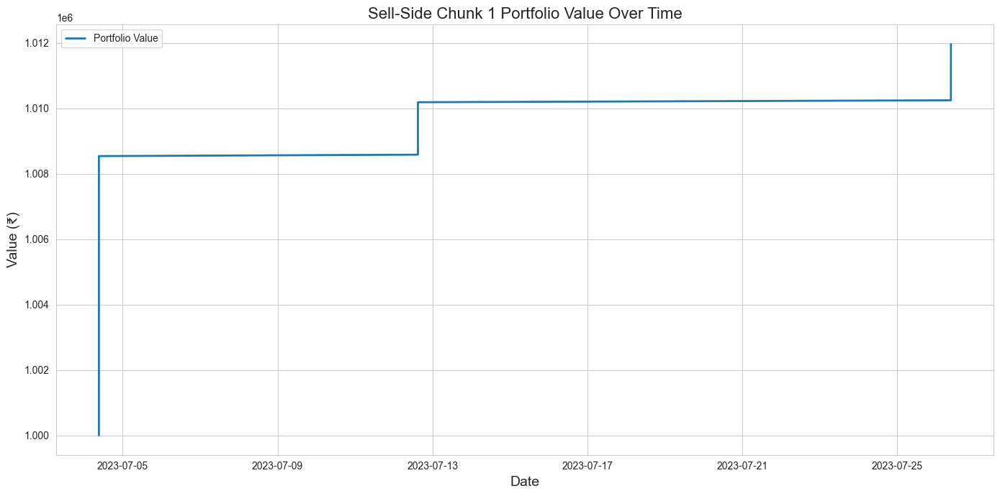

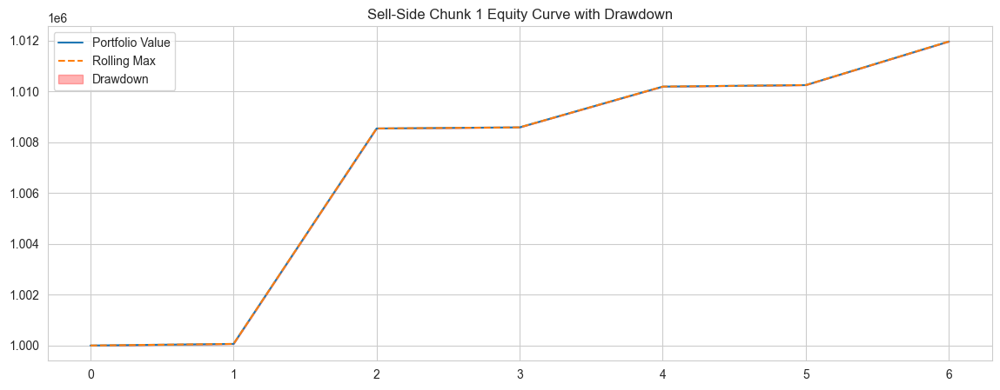

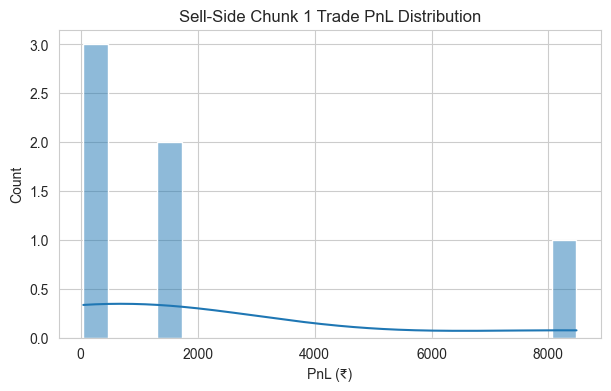

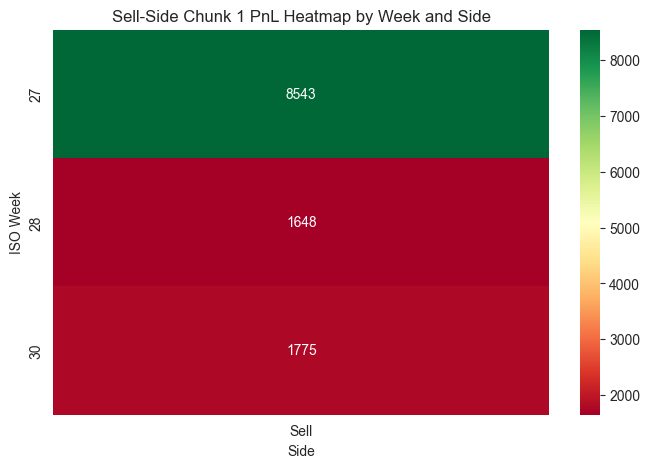

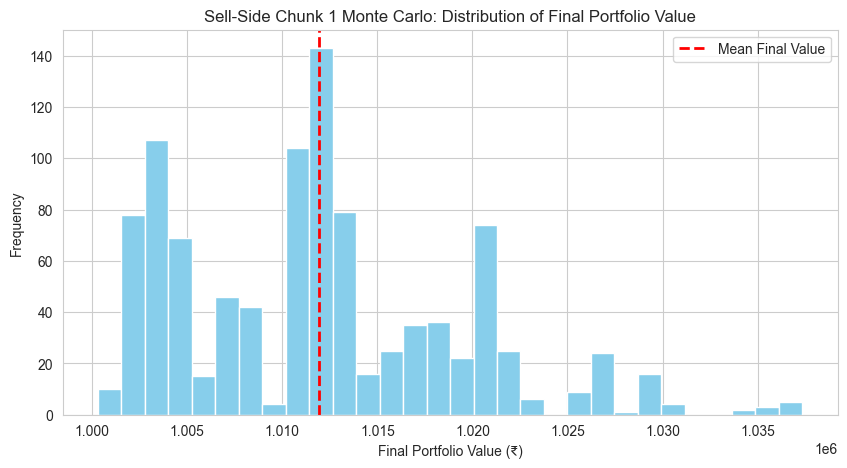

Monte Carlo: Mean Final Value = ₹1,011,908.19, 5th Percentile = ₹1,001,969.25, 95th Percentile = ₹1,027,148.12


C:\Users\cmman\AppData\Local\Temp\ipykernel_28480\437400957.py:271: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: compute_atr(x, BUY_ATR_PERIOD)).reset_index(level=[0,1,2], drop=True)



Buy-Side Chunk 1 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹1,470,544.87
Total Return:       47.05%
Max Drawdown:       ₹39,201.73
Sharpe Ratio:       6.32
Sortino Ratio:      14.62
Calmar Ratio:       252.14

Trade Statistics:
-----------------
Total Trades:       103
Winning Trades:     74
Losing Trades:      29
Avg PnL:            ₹4,568.40
Best Trade:         ₹43,518.85
Worst Trade:        ₹-15,000.00
Trade Period:       2023-06-02 to 2023-07-31



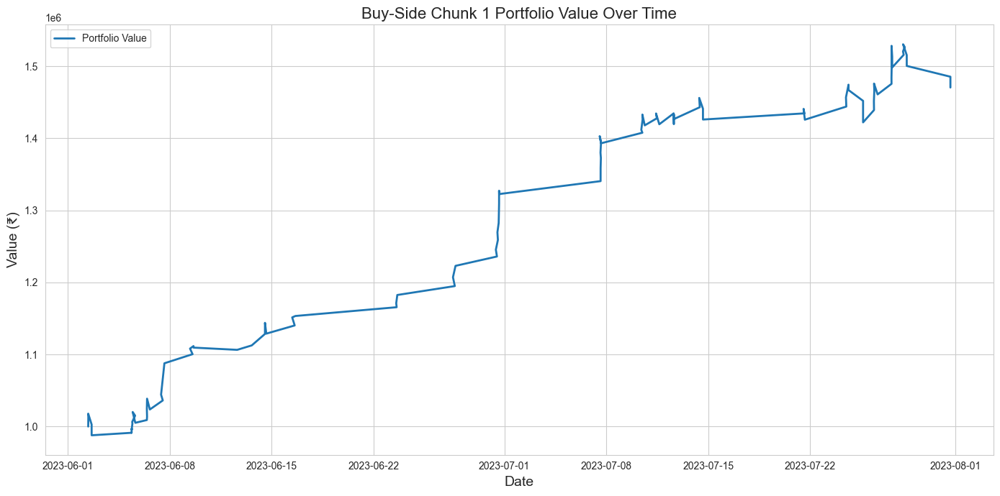

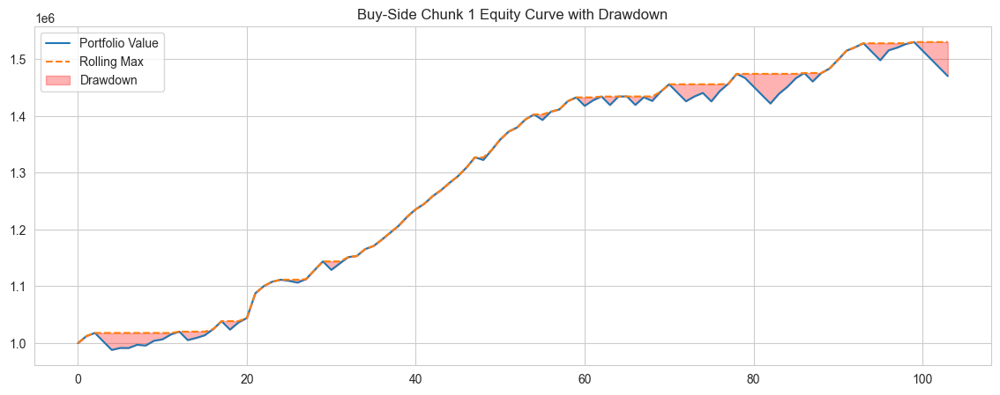

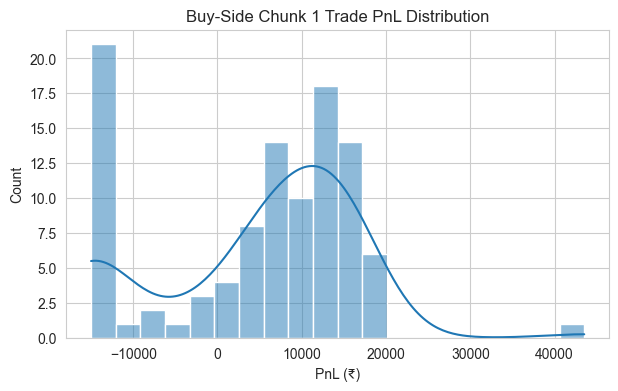

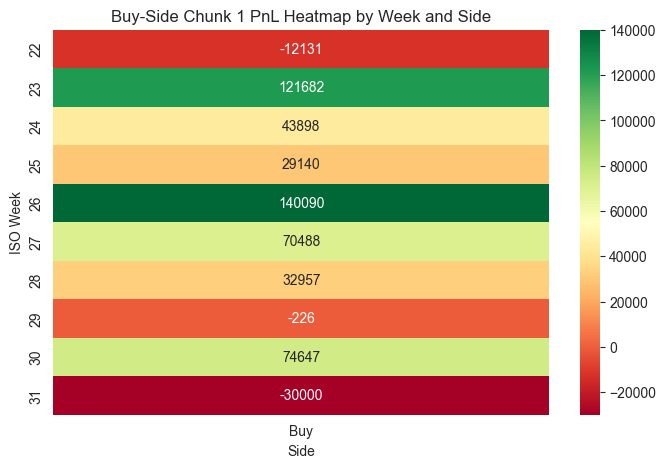

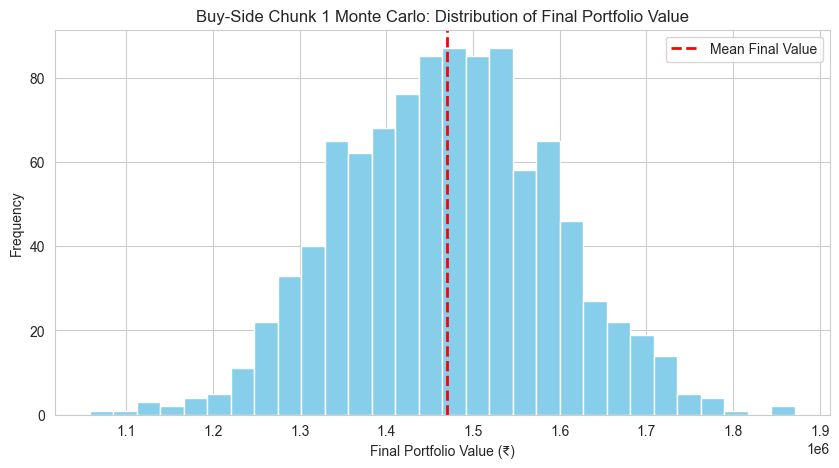

Monte Carlo: Mean Final Value = ₹1,469,930.75, 5th Percentile = ₹1,275,930.29, 95th Percentile = ₹1,670,819.35

===== CUMULATIVE REPORT AFTER CHUNK 1 =====

Combined Strategy Performance Report:
-----------------------------
Initial Capital:    1,000,000.00
Final Portfolio:    1,482,511.00
Total Return:       48.25%
Max Drawdown:       38,897.62
Sharpe Ratio:       6.27
Sortino Ratio:      14.13
Calmar Ratio:       268.51
Total Trades:       109
Winning Trades:     80
Losing Trades:      29
Avg PnL:            4,426.71
Best Trade:         43,518.85
Worst Trade:        -15,000.00
Trade Period:       2023-06-02 to 2023-07-31



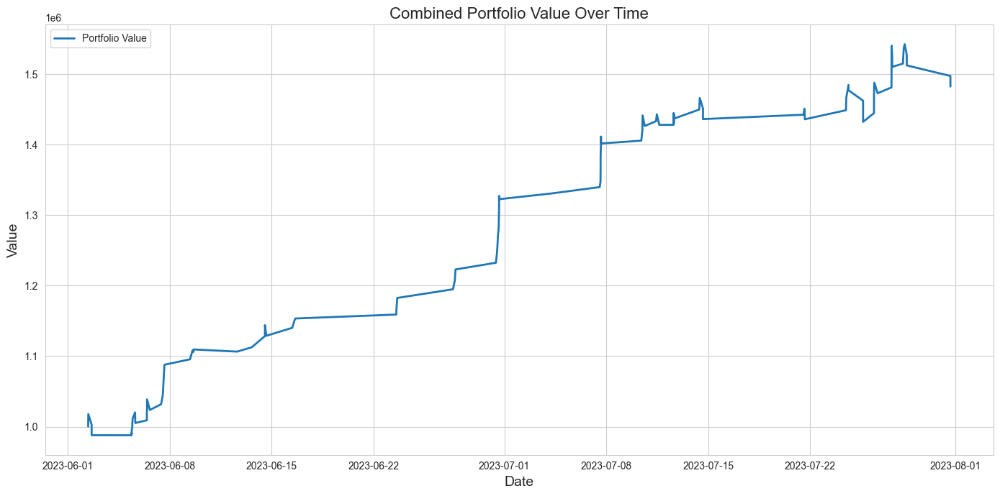

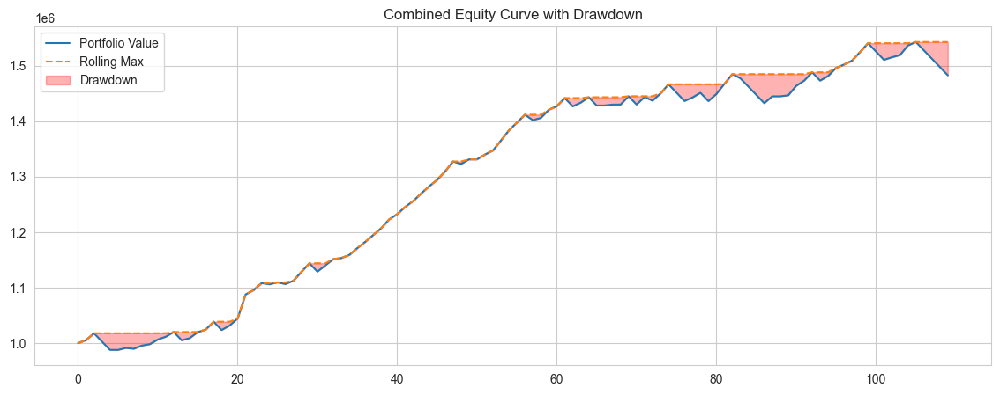

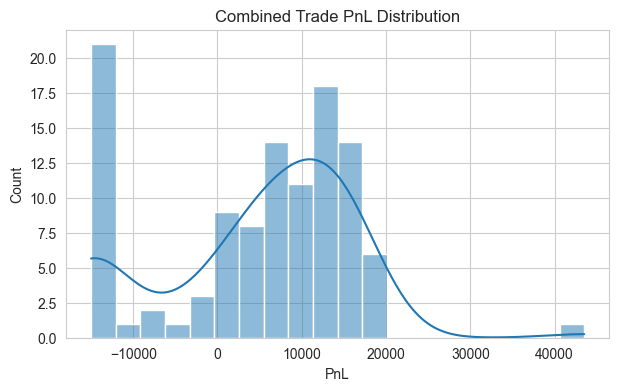

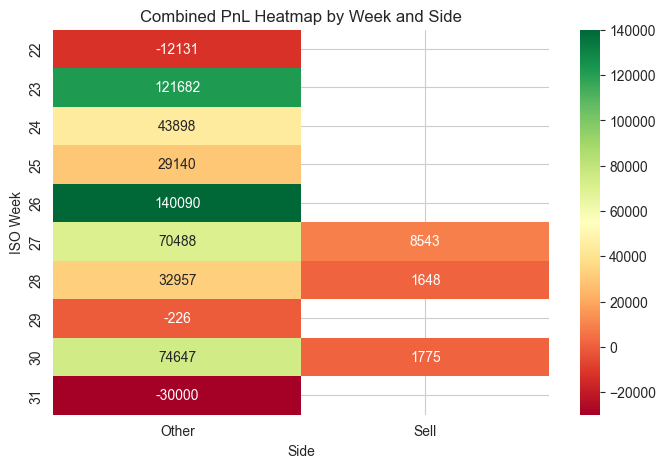

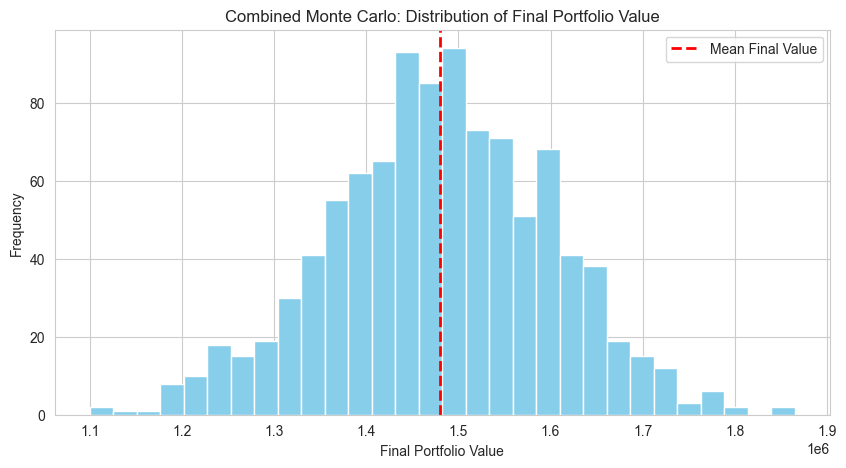

Monte Carlo: Mean Final Value = 1,480,224.84, 5th Percentile = 1,272,019.53, 95th Percentile = 1,668,664.54


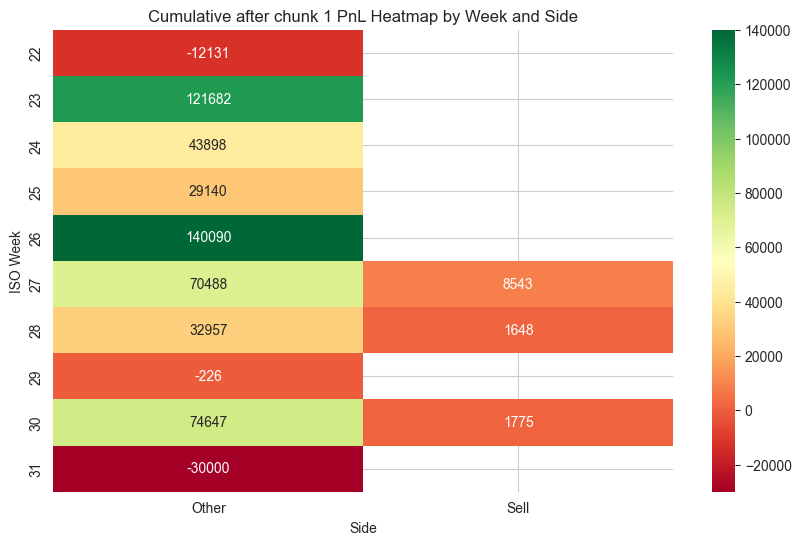


=== Processing chunk 2: 2023-08-01 09:15:00+05:30 to 2023-10-01 09:14:00+05:30 ===

Sell-Side Chunk 2 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹988,991.70
Total Return:       -1.10%
Max Drawdown:       ₹17,998.50
Sharpe Ratio:       -2.75
Sortino Ratio:      0.00
Calmar Ratio:       -6.23

Trade Statistics:
-----------------
Total Trades:       12
Winning Trades:     11
Losing Trades:      1
Avg PnL:            ₹-917.36
Best Trade:         ₹3,245.55
Worst Trade:        ₹-18,000.00
Trade Period:       2023-08-25 to 2023-09-28



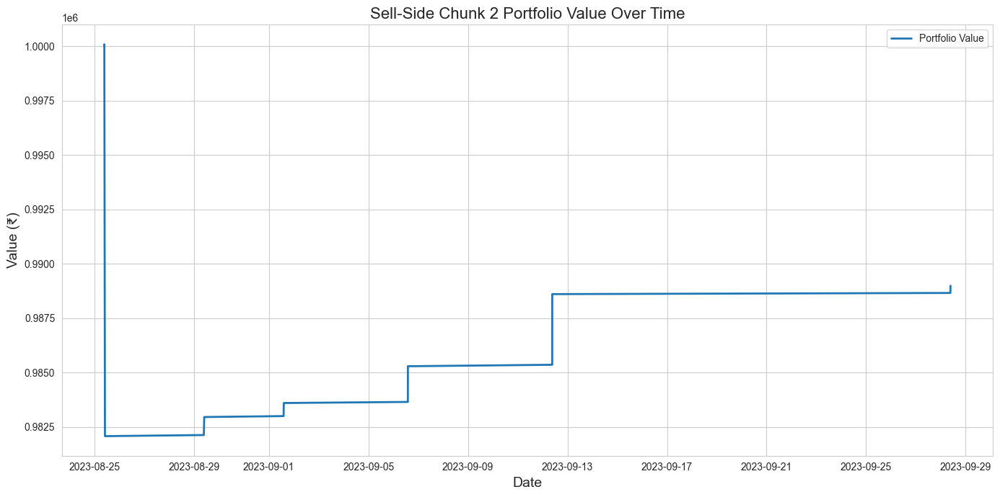

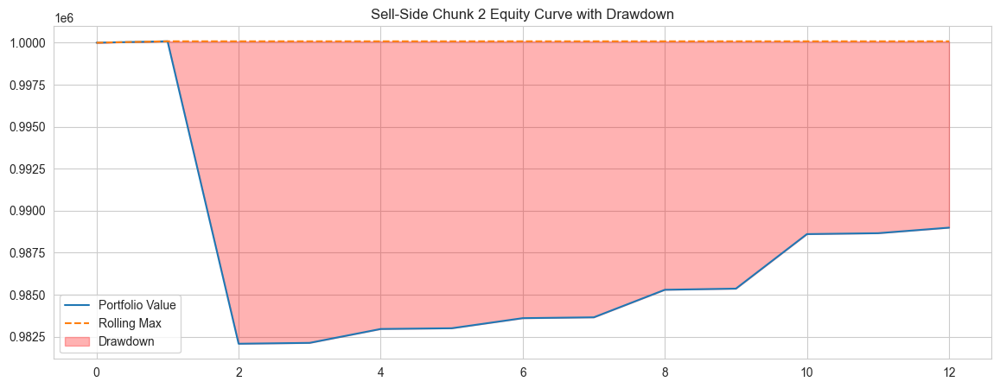

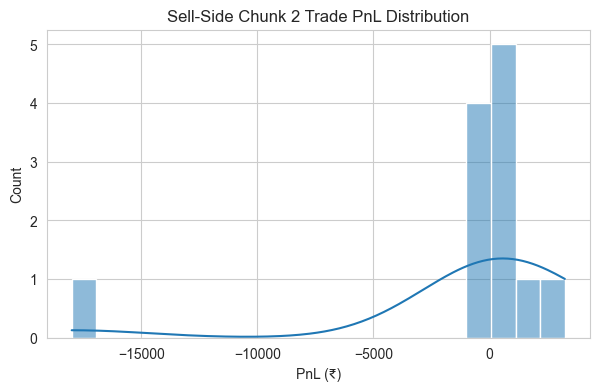

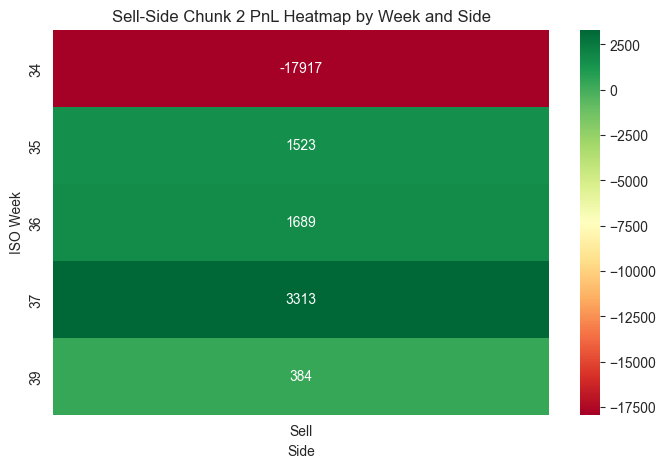

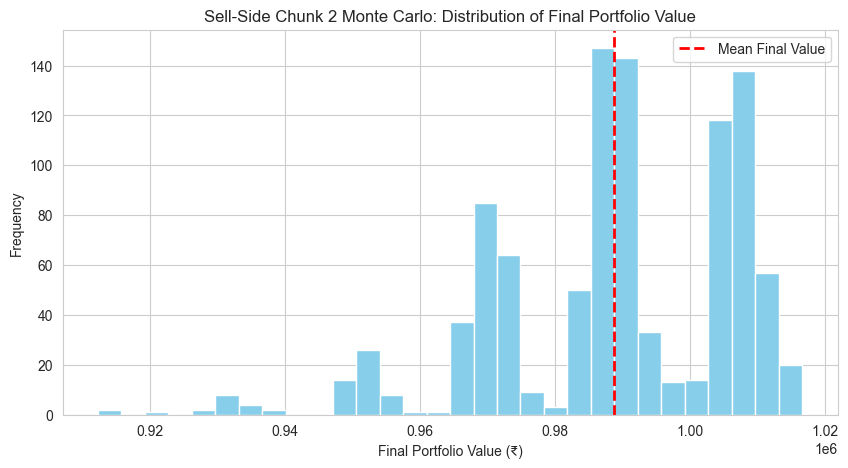

Monte Carlo: Mean Final Value = ₹988,747.71, 5th Percentile = ₹952,556.23, 95th Percentile = ₹1,010,753.31


C:\Users\cmman\AppData\Local\Temp\ipykernel_28480\437400957.py:271: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: compute_atr(x, BUY_ATR_PERIOD)).reset_index(level=[0,1,2], drop=True)



Buy-Side Chunk 2 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹1,064,790.81
Total Return:       6.48%
Max Drawdown:       ₹123,416.86
Sharpe Ratio:       1.06
Sortino Ratio:      2.16
Calmar Ratio:       3.85

Trade Statistics:
-----------------
Total Trades:       88
Winning Trades:     55
Losing Trades:      33
Avg PnL:            ₹736.26
Best Trade:         ₹15,821.37
Worst Trade:        ₹-15,000.00
Trade Period:       2023-08-01 to 2023-09-29



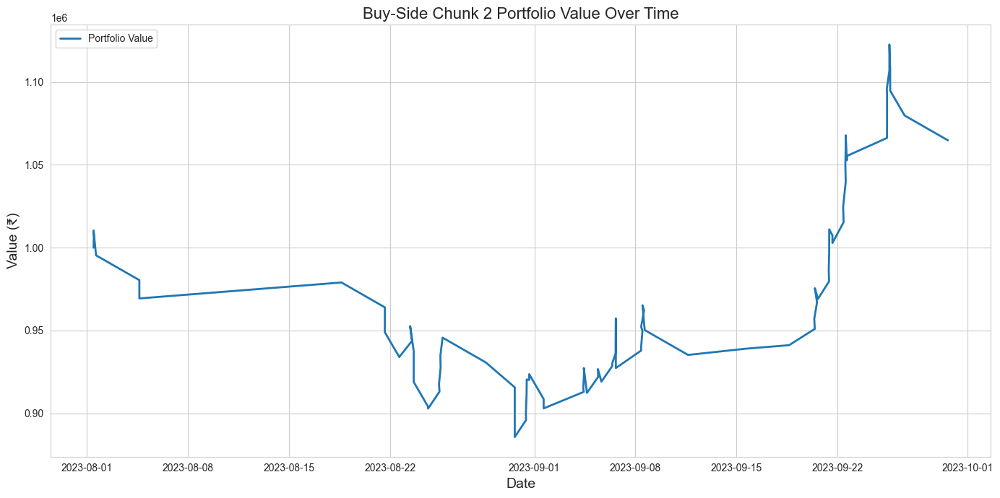

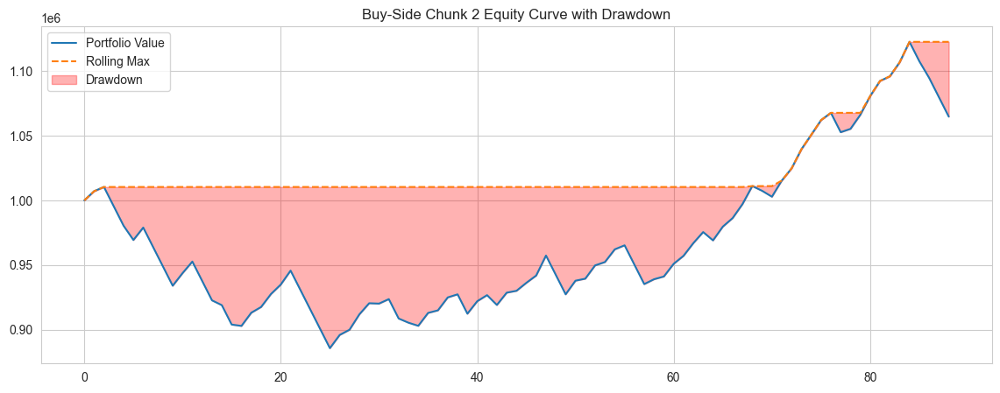

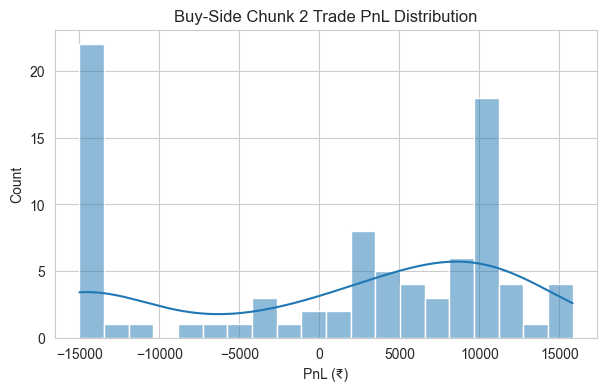

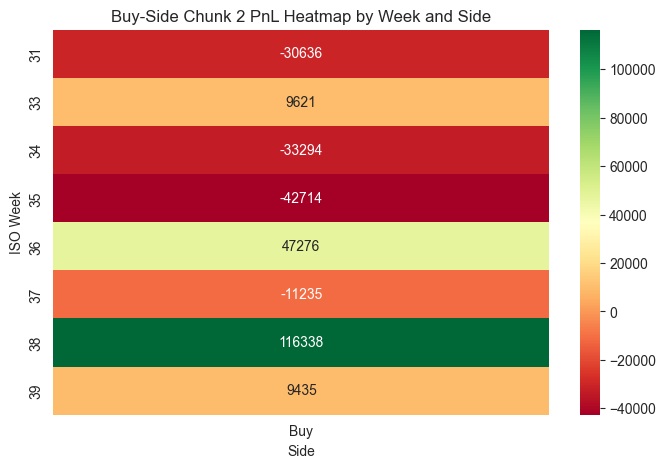

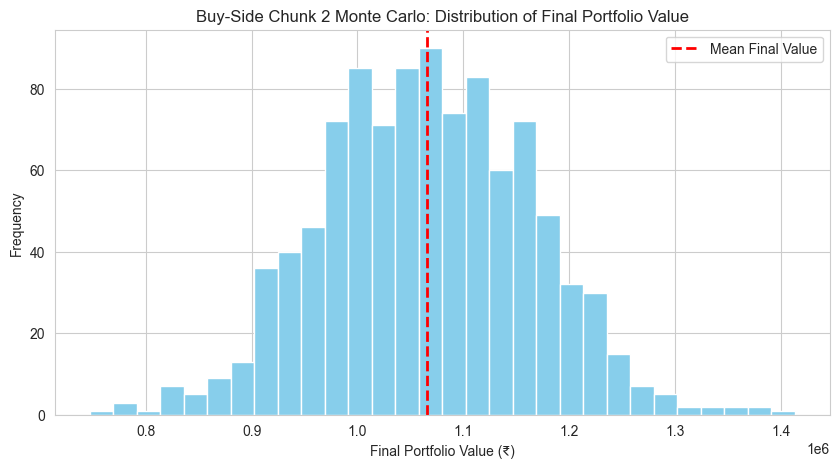

Monte Carlo: Mean Final Value = ₹1,065,261.06, 5th Percentile = ₹908,004.90, 95th Percentile = ₹1,223,070.53

===== CUMULATIVE REPORT AFTER CHUNK 2 =====

Combined Strategy Performance Report:
-----------------------------
Initial Capital:    1,000,000.00
Final Portfolio:    1,536,293.51
Total Return:       53.63%
Max Drawdown:       124,049.77
Sharpe Ratio:       3.90
Sortino Ratio:      8.50
Calmar Ratio:       22.05
Total Trades:       209
Winning Trades:     146
Losing Trades:      63
Avg PnL:            2,566.00
Best Trade:         43,518.85
Worst Trade:        -18,000.00
Trade Period:       2023-06-02 to 2023-09-29



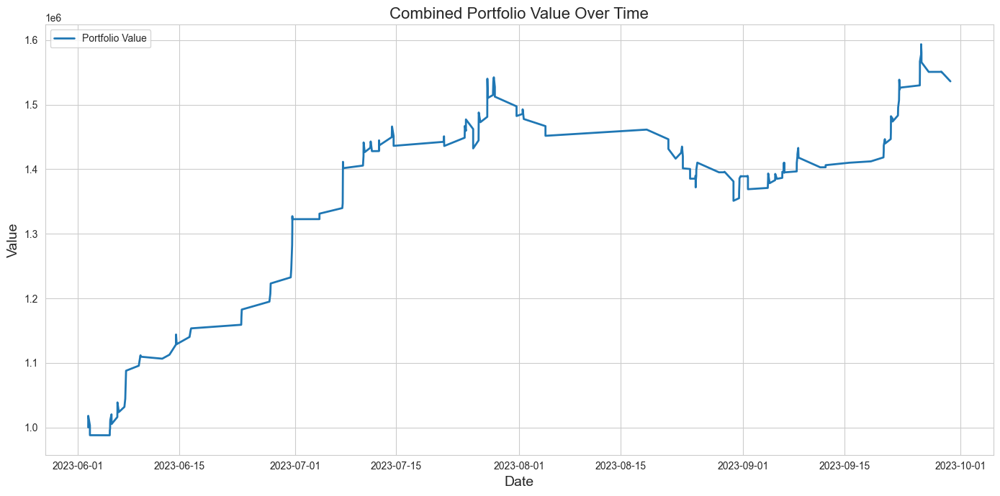

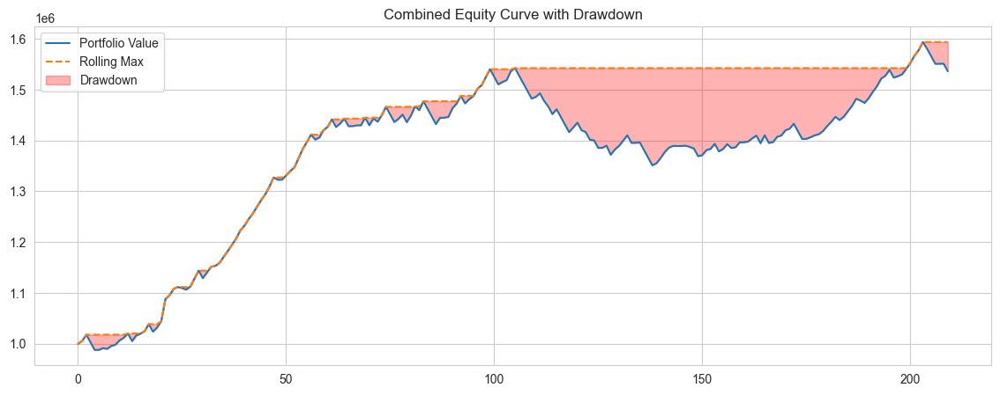

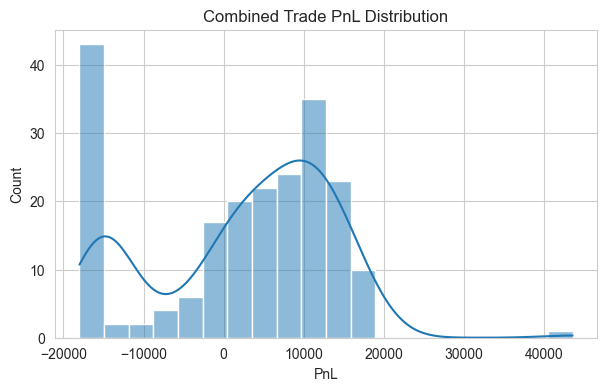

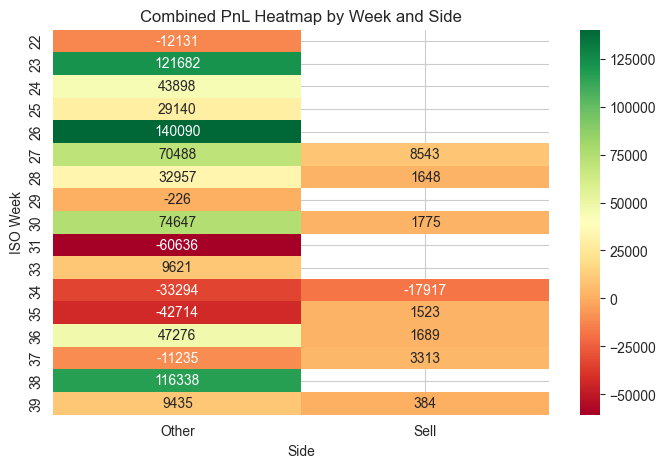

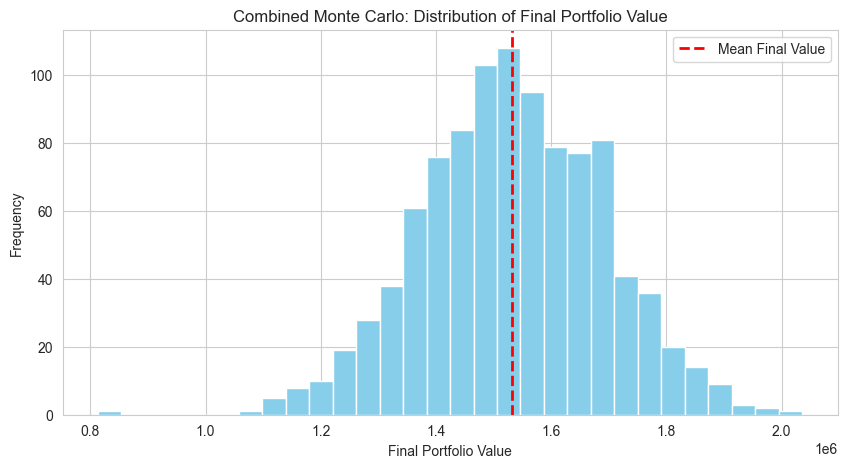

Monte Carlo: Mean Final Value = 1,532,461.33, 5th Percentile = 1,273,494.49, 95th Percentile = 1,789,793.03


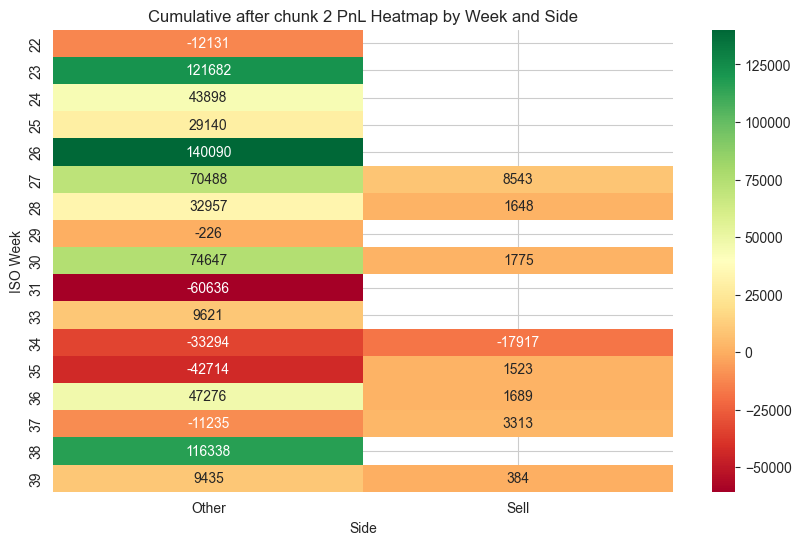


=== Processing chunk 3: 2023-10-01 09:15:00+05:30 to 2023-12-01 09:14:00+05:30 ===

Sell-Side Chunk 3 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹992,520.15
Total Return:       -0.75%
Max Drawdown:       ₹17,812.61
Sharpe Ratio:       -2.74
Sortino Ratio:      0.00
Calmar Ratio:       -11.47

Trade Statistics:
-----------------
Total Trades:       3
Winning Trades:     2
Losing Trades:      1
Avg PnL:            ₹-2,493.28
Best Trade:         ₹10,434.88
Worst Trade:        ₹-18,000.00
Trade Period:       2023-10-18 to 2023-10-31



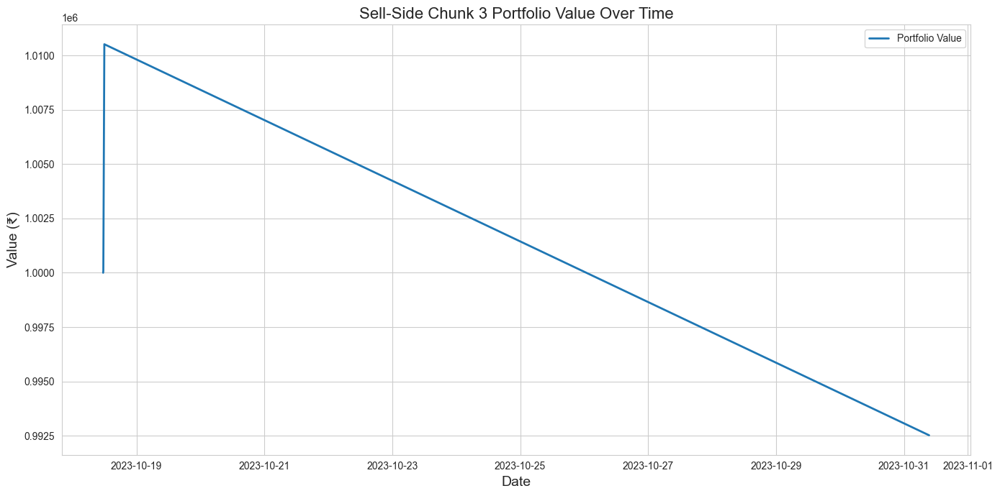

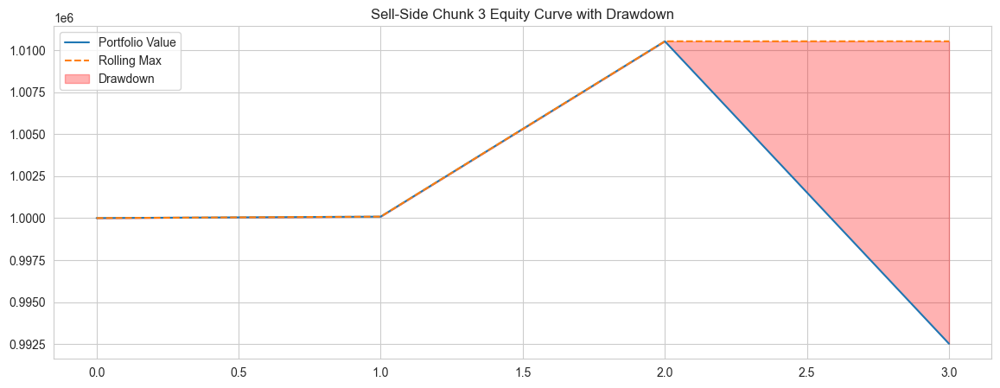

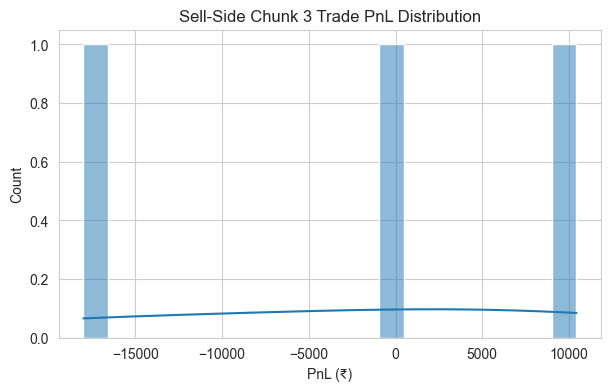

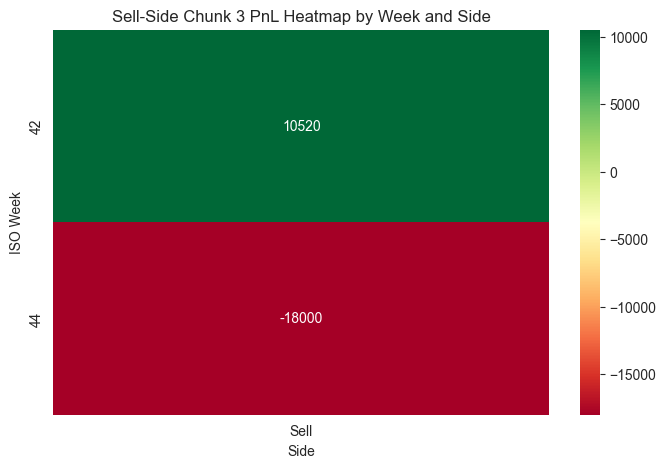

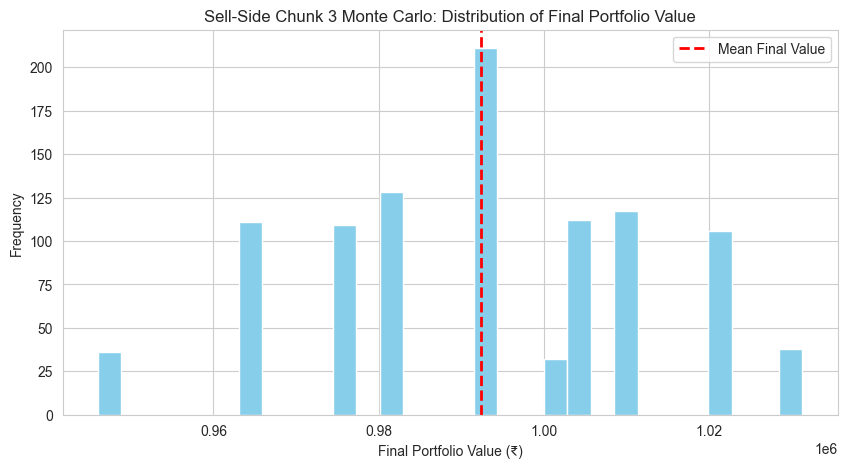

Monte Carlo: Mean Final Value = ₹992,403.69, 5th Percentile = ₹964,085.28, 95th Percentile = ₹1,020,955.03


C:\Users\cmman\AppData\Local\Temp\ipykernel_28480\437400957.py:271: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: compute_atr(x, BUY_ATR_PERIOD)).reset_index(level=[0,1,2], drop=True)



Buy-Side Chunk 3 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹1,345,024.34
Total Return:       34.50%
Max Drawdown:       ₹76,083.11
Sharpe Ratio:       4.30
Sortino Ratio:      17.02
Calmar Ratio:       77.71

Trade Statistics:
-----------------
Total Trades:       74
Winning Trades:     47
Losing Trades:      27
Avg PnL:            ₹4,662.49
Best Trade:         ₹131,017.70
Worst Trade:        ₹-15,000.00
Trade Period:       2023-10-03 to 2023-11-28



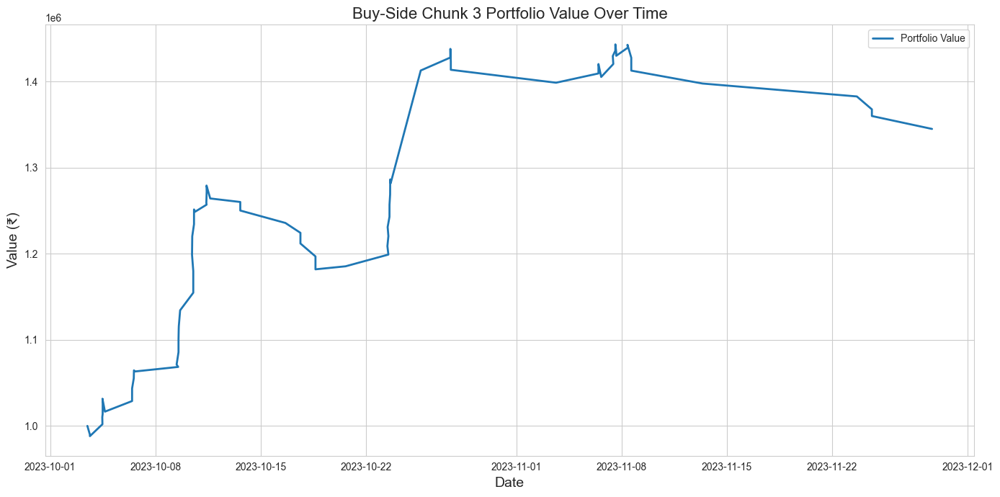

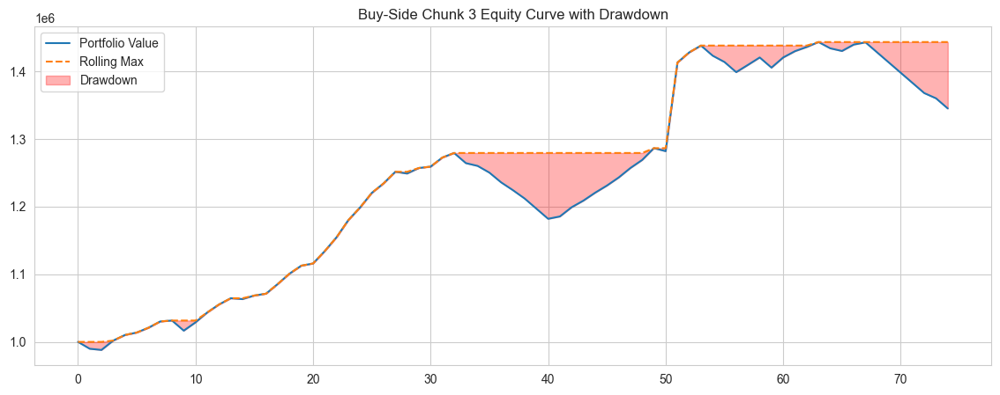

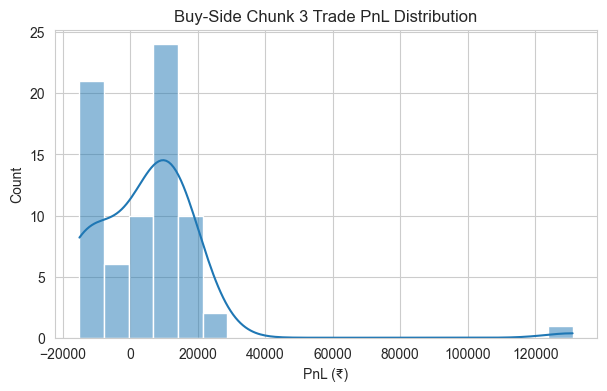

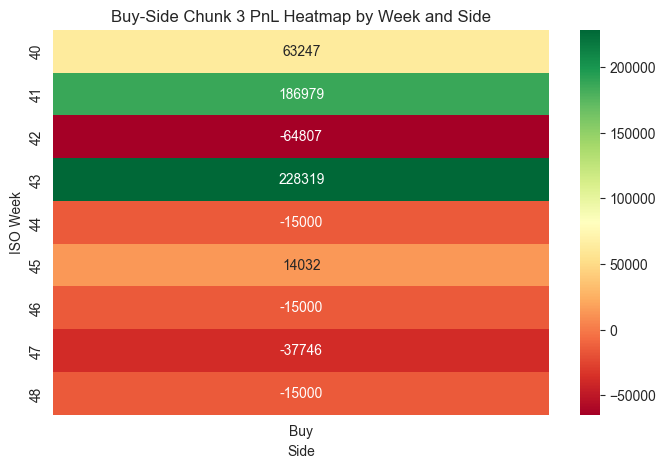

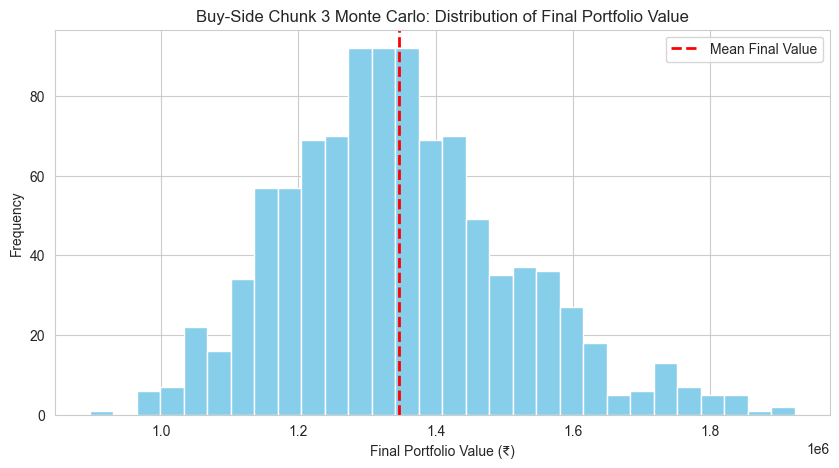

Monte Carlo: Mean Final Value = ₹1,346,427.42, 5th Percentile = ₹1,100,072.42, 95th Percentile = ₹1,636,543.82

===== CUMULATIVE REPORT AFTER CHUNK 3 =====

Combined Strategy Performance Report:
-----------------------------
Initial Capital:    1,000,000.00
Final Portfolio:    1,873,838.00
Total Return:       87.38%
Max Drawdown:       124,049.77
Sharpe Ratio:       3.90
Sortino Ratio:      9.46
Calmar Ratio:       20.97
Total Trades:       286
Winning Trades:     195
Losing Trades:      91
Avg PnL:            3,055.38
Best Trade:         131,017.70
Worst Trade:        -18,000.00
Trade Period:       2023-06-02 to 2023-11-28



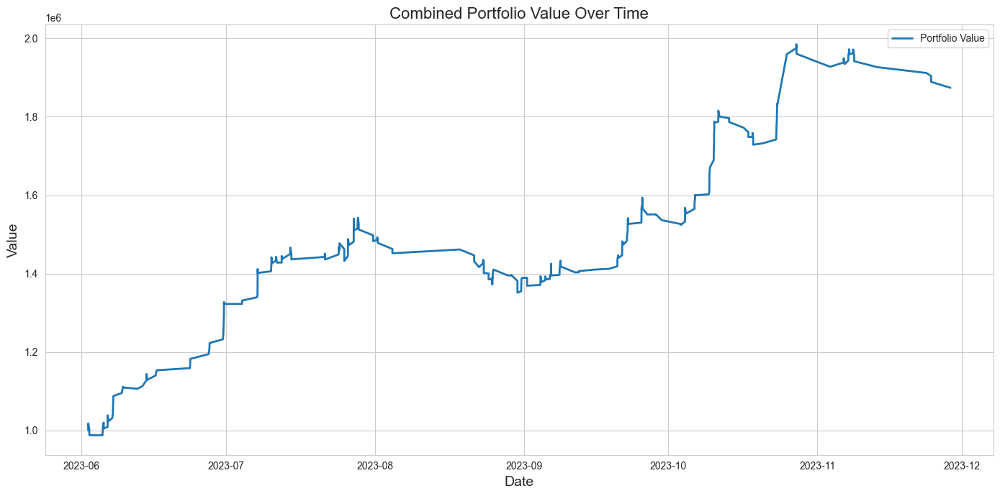

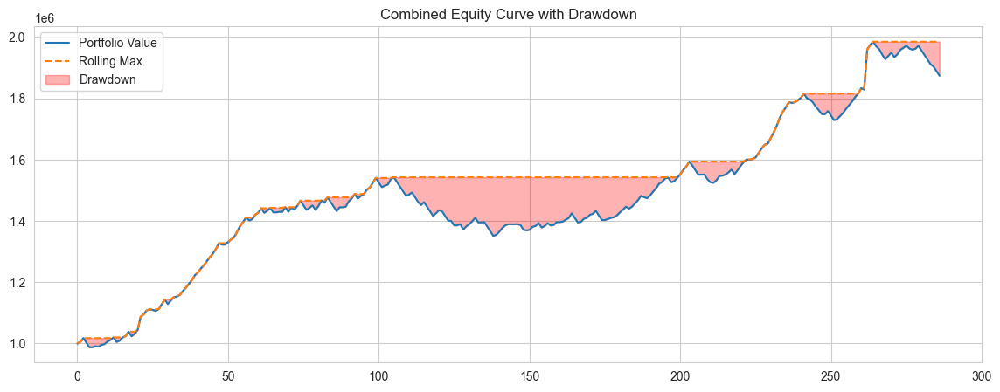

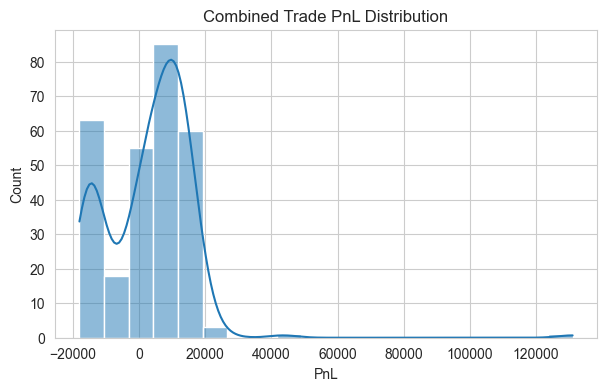

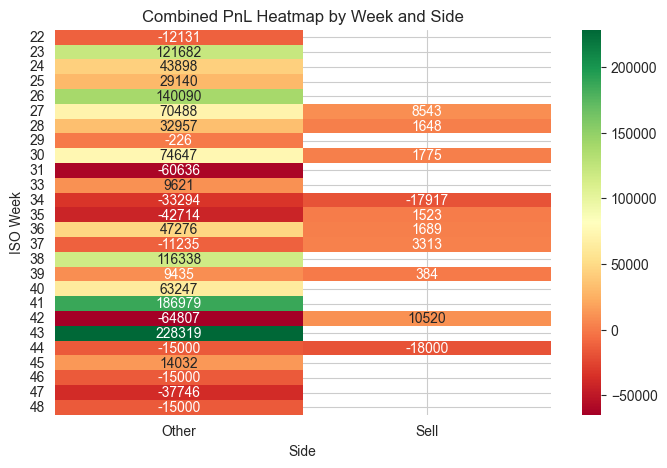

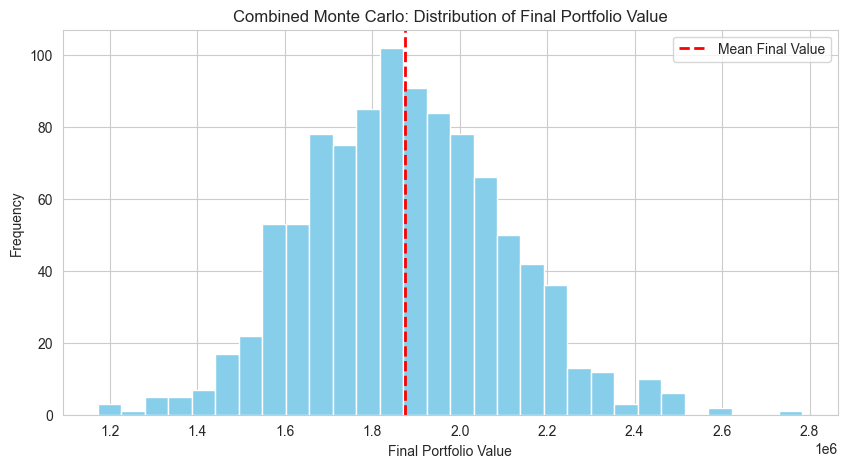

Monte Carlo: Mean Final Value = 1,874,906.03, 5th Percentile = 1,510,671.57, 95th Percentile = 2,239,349.44


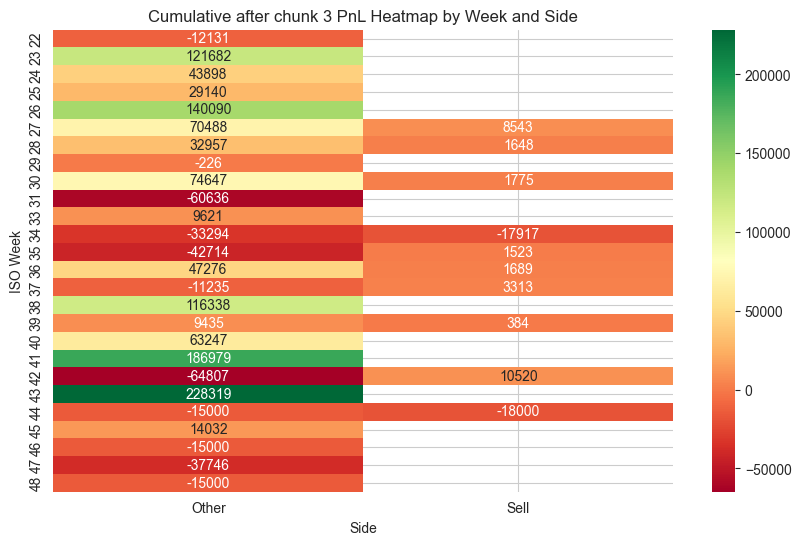


=== Processing chunk 4: 2023-12-01 09:15:00+05:30 to 2024-02-01 09:14:00+05:30 ===

Sell-Side Chunk 4 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹988,847.30
Total Return:       -1.12%
Max Drawdown:       ₹17,904.67
Sharpe Ratio:       -2.91
Sortino Ratio:      0.00
Calmar Ratio:       -5.08

Trade Statistics:
-----------------
Total Trades:       11
Winning Trades:     10
Losing Trades:      1
Avg PnL:            ₹-1,013.88
Best Trade:         ₹3,314.30
Worst Trade:        ₹-18,000.00
Trade Period:       2023-12-12 to 2024-01-25



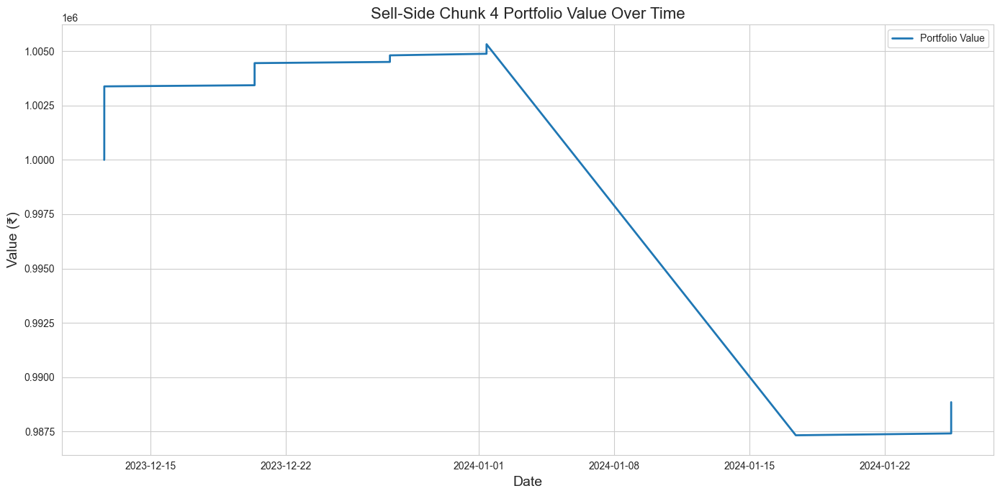

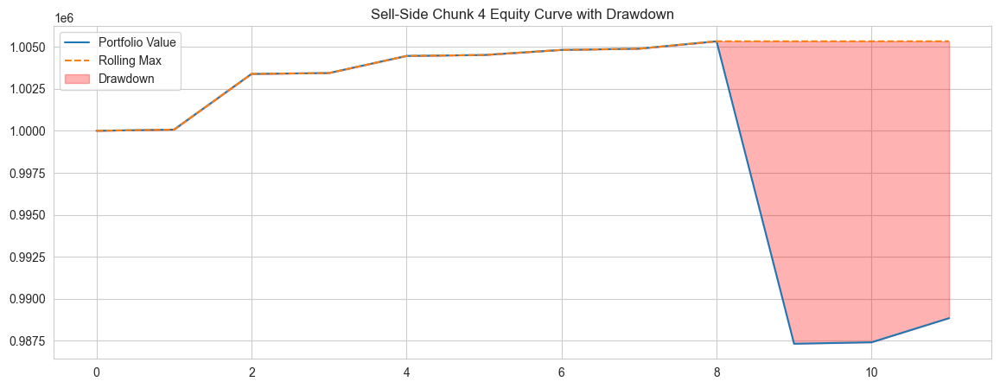

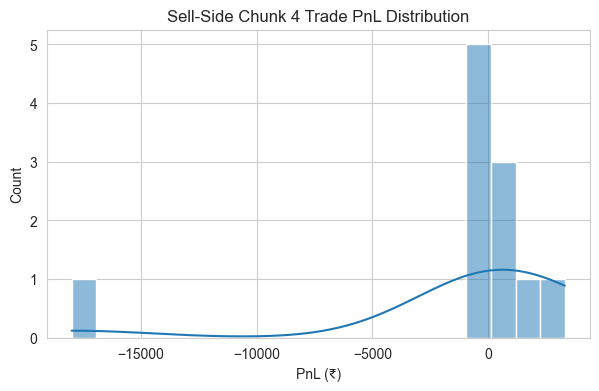

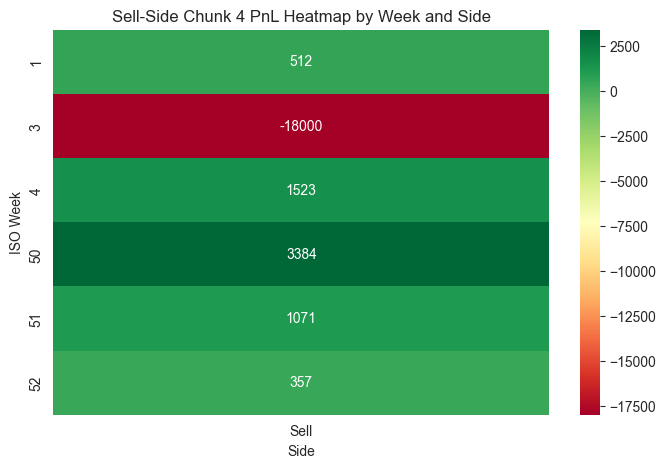

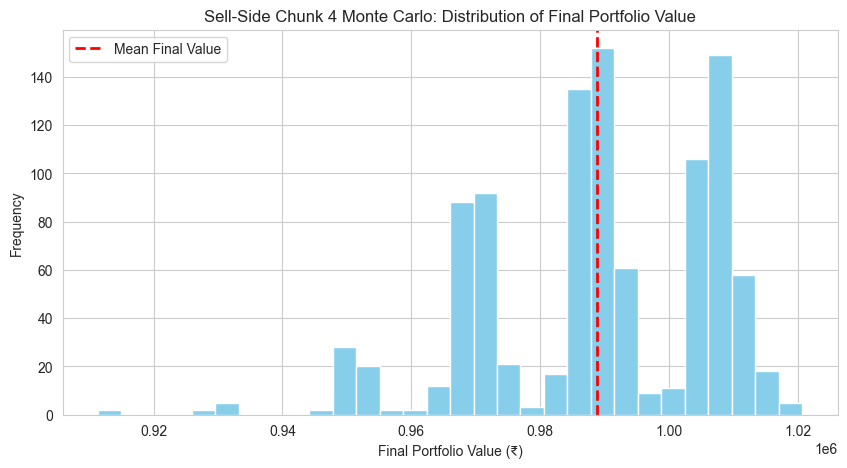

Monte Carlo: Mean Final Value = ₹988,802.30, 5th Percentile = ₹954,051.35, 95th Percentile = ₹1,011,092.14


C:\Users\cmman\AppData\Local\Temp\ipykernel_28480\437400957.py:271: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: compute_atr(x, BUY_ATR_PERIOD)).reset_index(level=[0,1,2], drop=True)



Buy-Side Chunk 4 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹1,382,731.41
Total Return:       38.27%
Max Drawdown:       ₹43,128.81
Sharpe Ratio:       4.49
Sortino Ratio:      13.43
Calmar Ratio:       193.15

Trade Statistics:
-----------------
Total Trades:       70
Winning Trades:     51
Losing Trades:      19
Avg PnL:            ₹5,467.59
Best Trade:         ₹138,661.80
Worst Trade:        ₹-15,000.00
Trade Period:       2023-12-01 to 2024-01-23



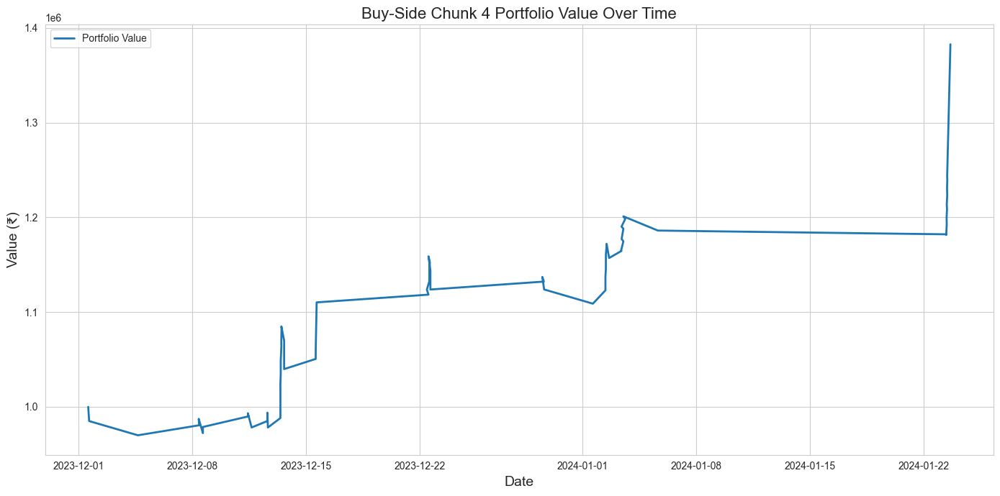

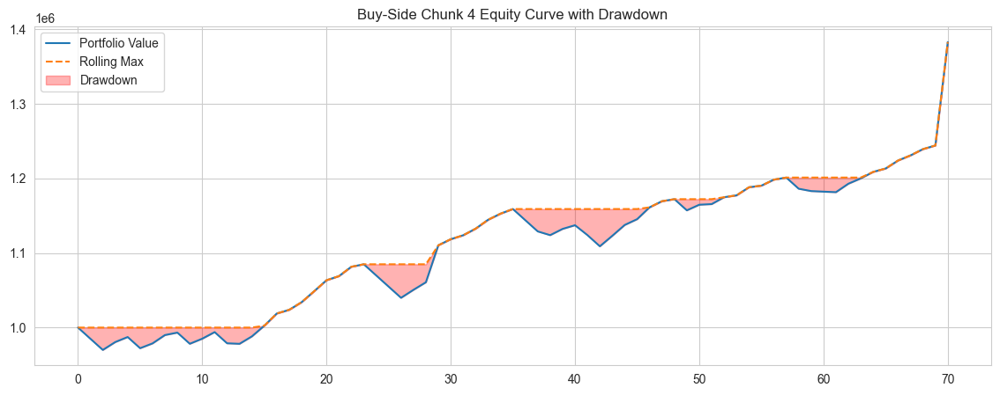

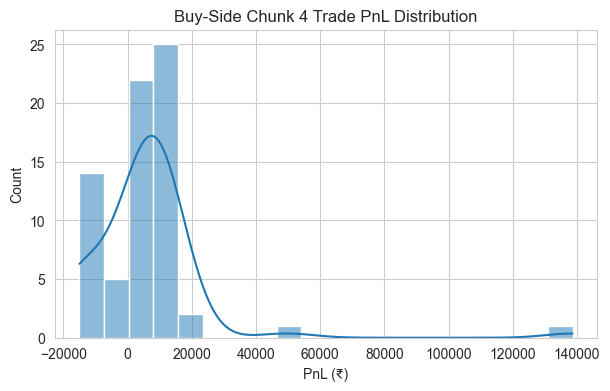

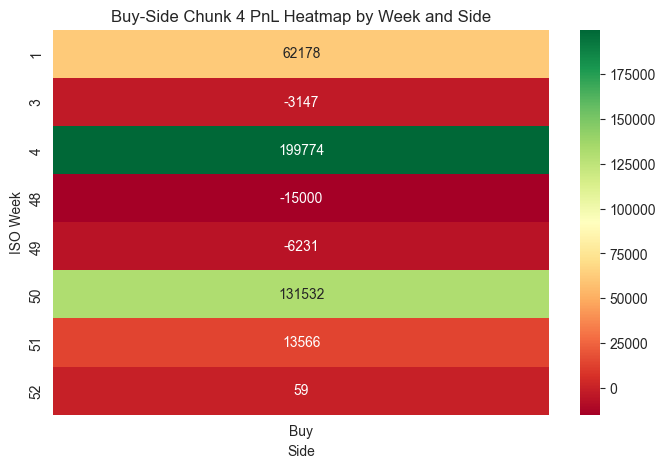

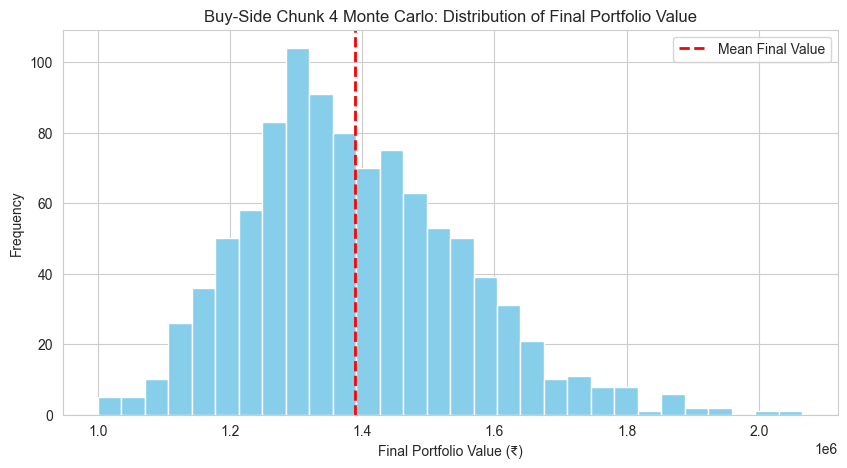

Monte Carlo: Mean Final Value = ₹1,388,964.46, 5th Percentile = ₹1,152,429.68, 95th Percentile = ₹1,674,925.90

===== CUMULATIVE REPORT AFTER CHUNK 4 =====

Combined Strategy Performance Report:
-----------------------------
Initial Capital:    1,000,000.00
Final Portfolio:    2,245,416.71
Total Return:       124.54%
Max Drawdown:       124,049.77
Sharpe Ratio:       3.91
Sortino Ratio:      9.64
Calmar Ratio:       19.98
Total Trades:       367
Winning Trades:     256
Losing Trades:      111
Avg PnL:            3,393.51
Best Trade:         138,661.80
Worst Trade:        -18,000.00
Trade Period:       2023-06-02 to 2024-01-25



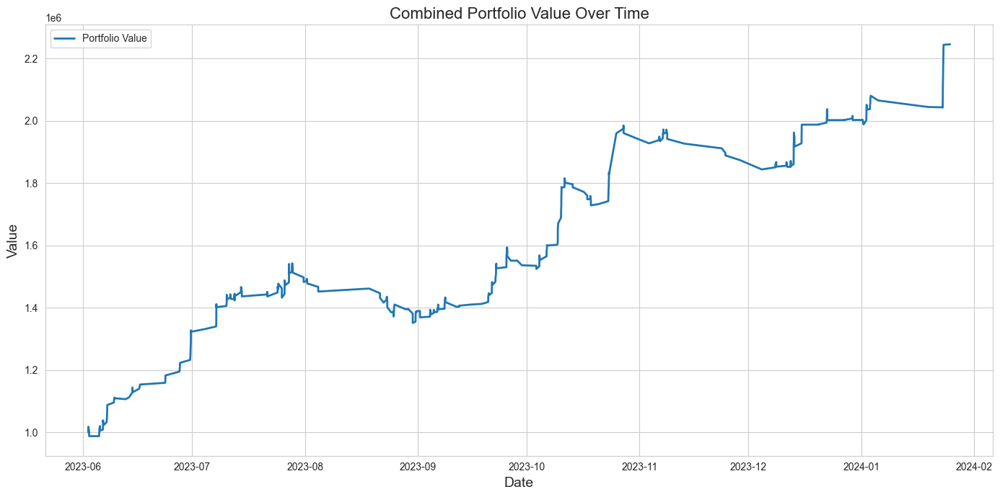

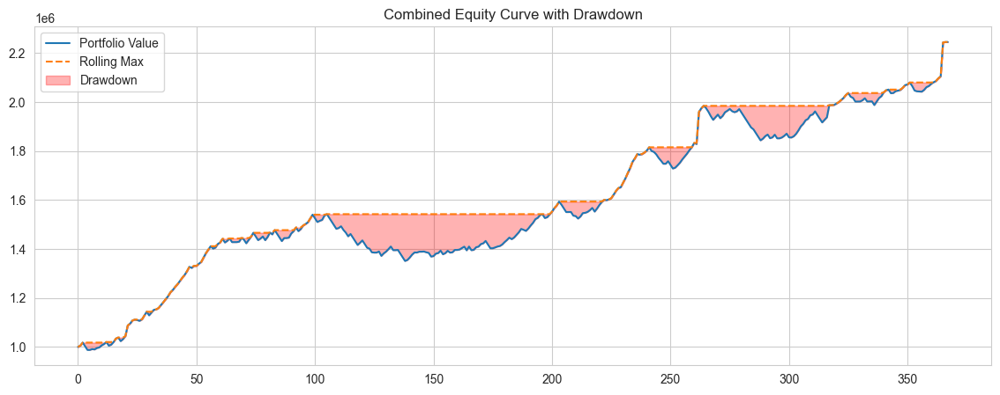

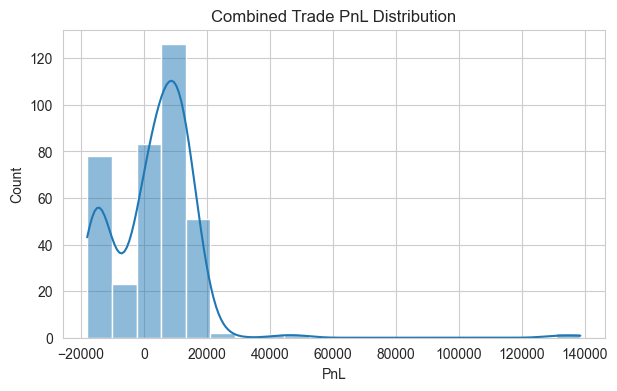

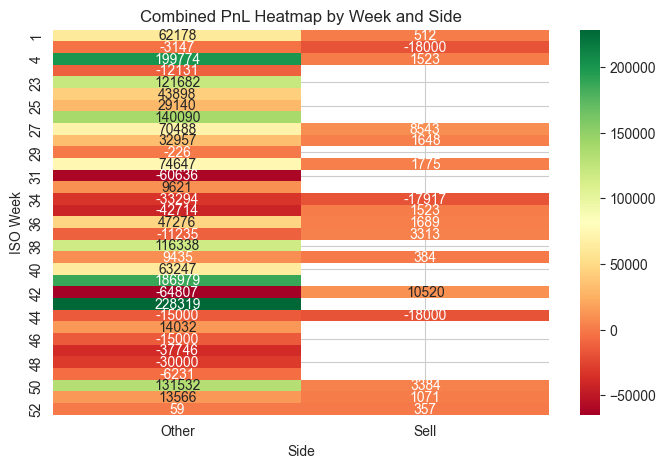

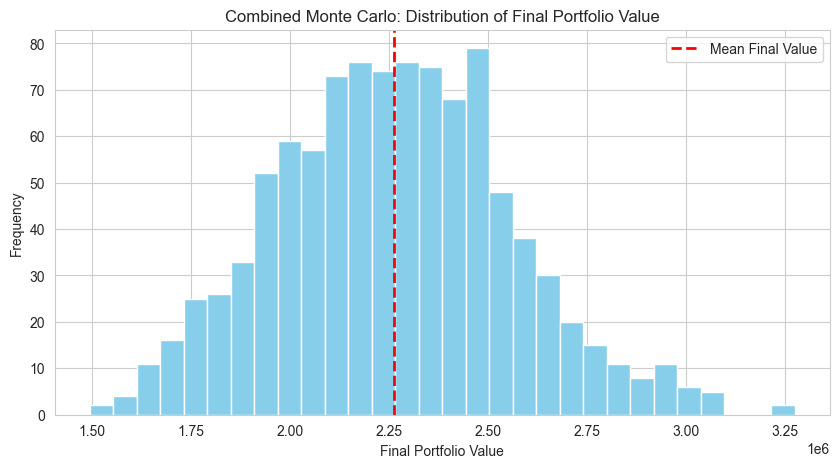

Monte Carlo: Mean Final Value = 2,262,724.90, 5th Percentile = 1,765,681.92, 95th Percentile = 2,756,563.97


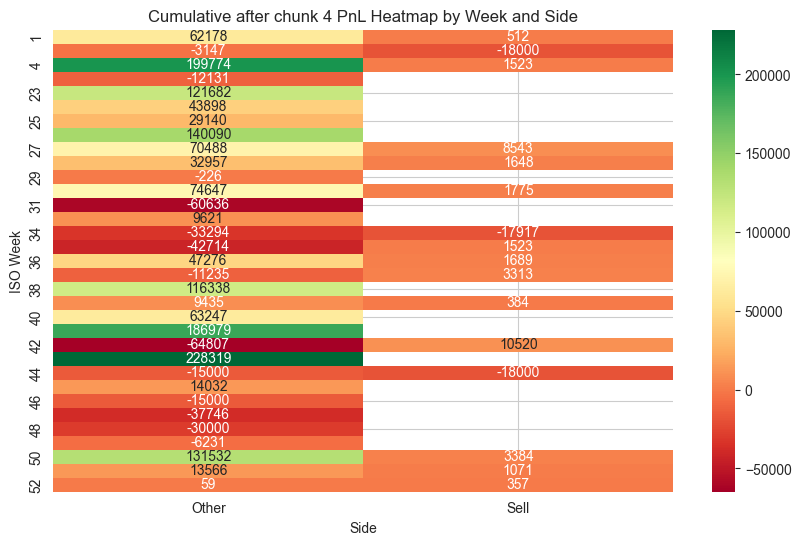


=== Processing chunk 5: 2024-02-01 09:15:00+05:30 to 2024-04-01 09:14:00+05:30 ===

Sell-Side Chunk 5 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹1,021,043.78
Total Return:       2.10%
Max Drawdown:       ₹0.00
Sharpe Ratio:       8.96
Sortino Ratio:      0.00
Calmar Ratio:       0.00

Trade Statistics:
-----------------
Total Trades:       12
Winning Trades:     10
Losing Trades:      2
Avg PnL:            ₹1,753.65
Best Trade:         ₹8,667.00
Worst Trade:        ₹0.00
Trade Period:       2024-02-08 to 2024-03-27



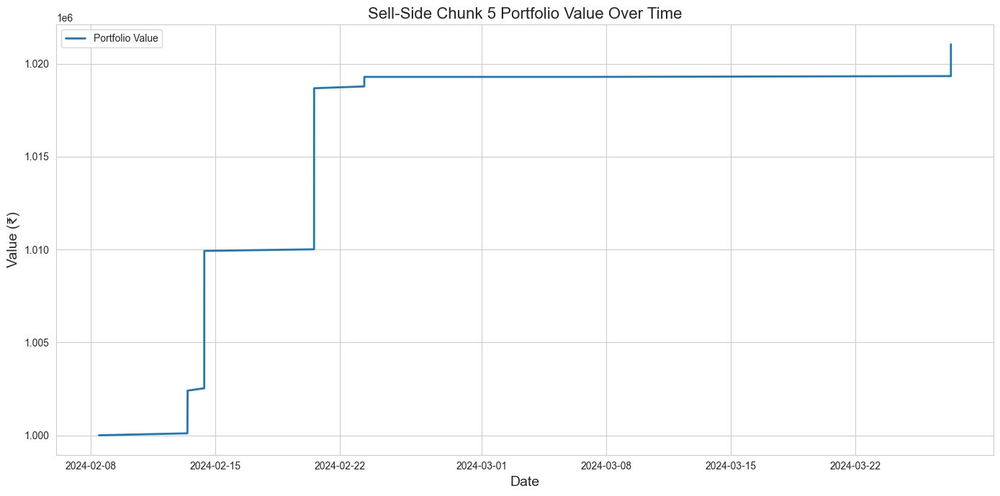

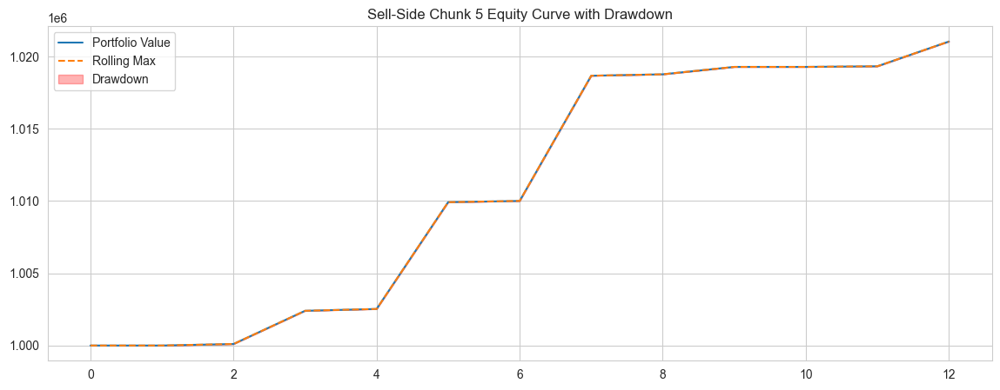

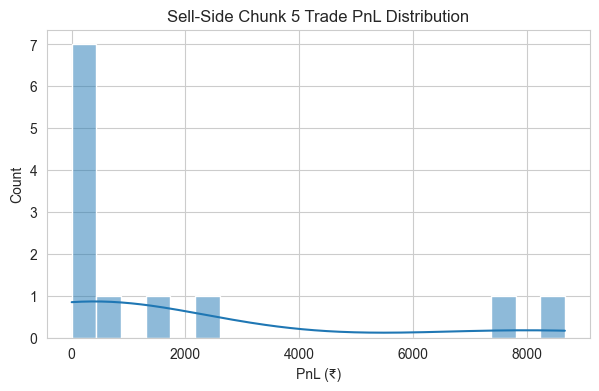

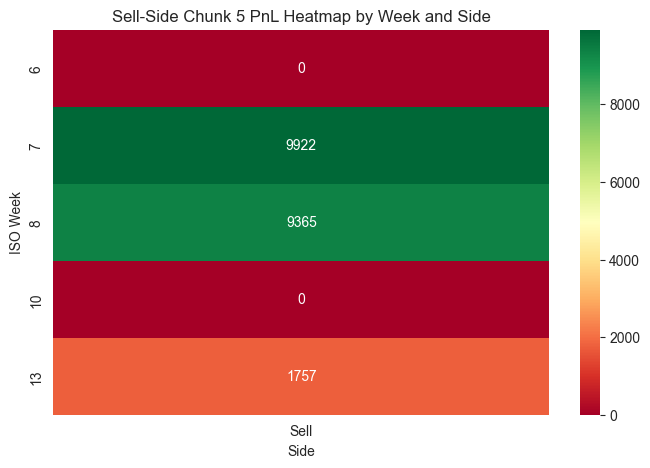

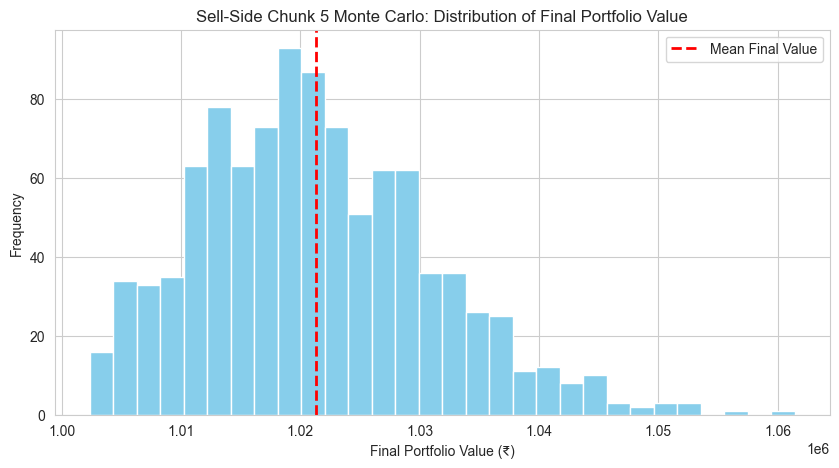

Monte Carlo: Mean Final Value = ₹1,021,276.48, 5th Percentile = ₹1,006,317.29, 95th Percentile = ₹1,038,710.63


C:\Users\cmman\AppData\Local\Temp\ipykernel_28480\437400957.py:271: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: compute_atr(x, BUY_ATR_PERIOD)).reset_index(level=[0,1,2], drop=True)



Buy-Side Chunk 5 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹1,593,930.11
Total Return:       59.39%
Max Drawdown:       ₹154,244.87
Sharpe Ratio:       3.09
Sortino Ratio:      8.95
Calmar Ratio:       136.86

Trade Statistics:
-----------------
Total Trades:       155
Winning Trades:     110
Losing Trades:      45
Avg PnL:            ₹3,831.81
Best Trade:         ₹146,082.03
Worst Trade:        ₹-15,000.00
Trade Period:       2024-02-02 to 2024-03-28



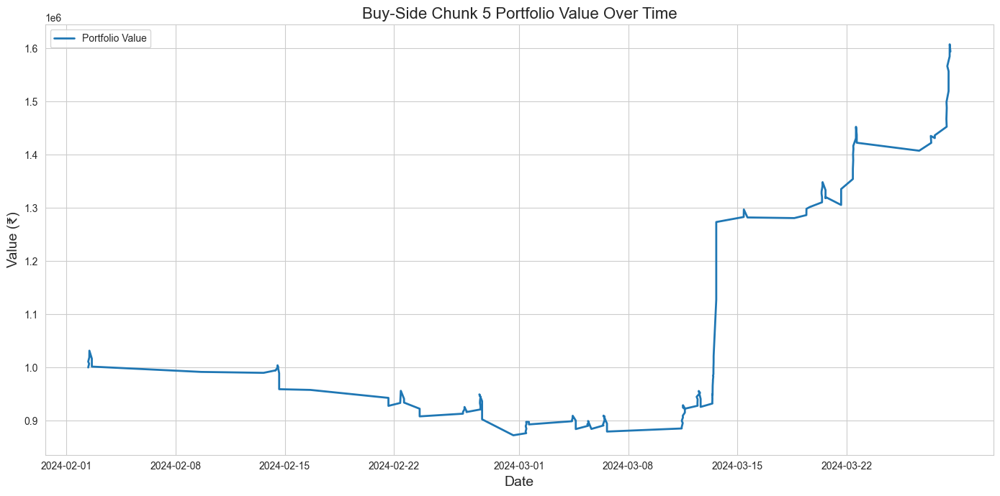

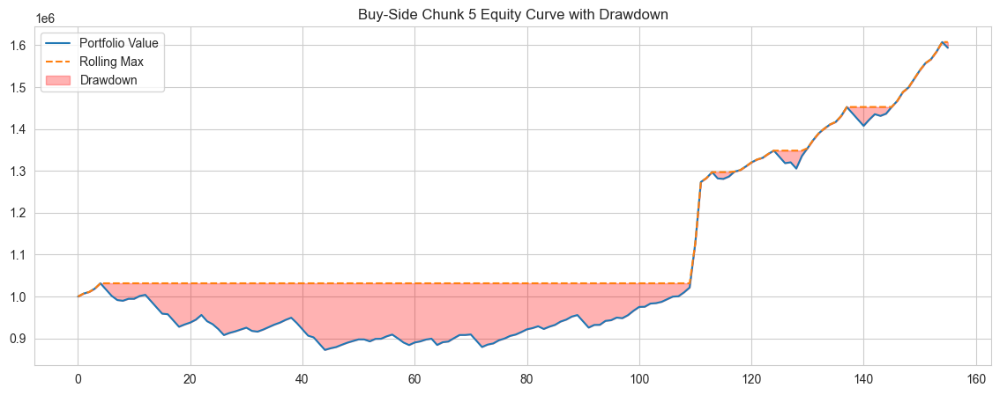

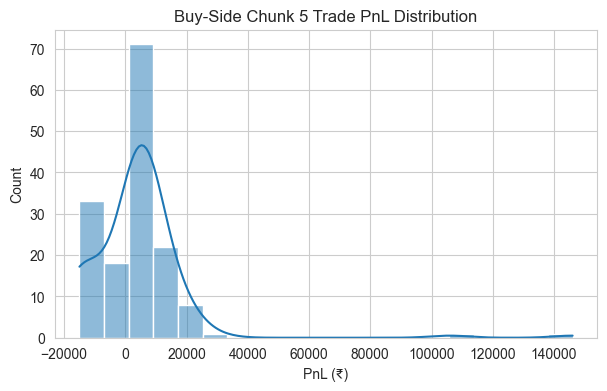

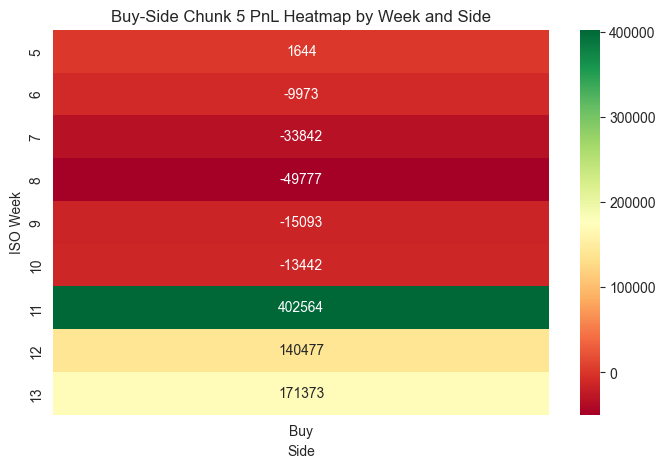

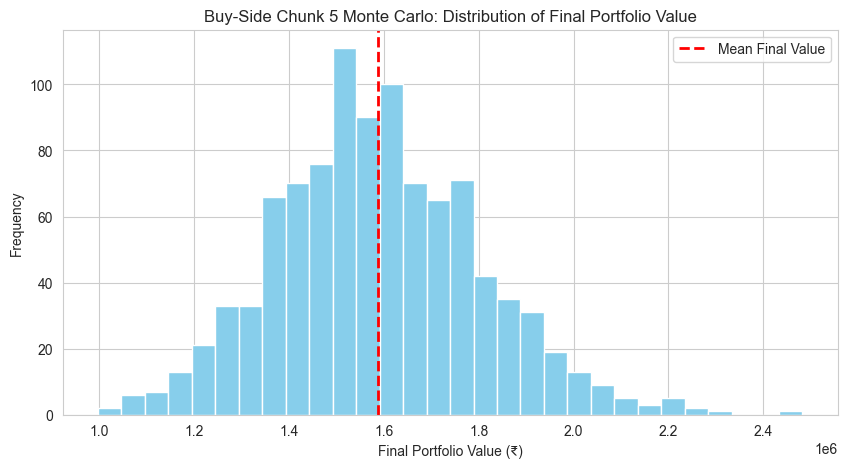

Monte Carlo: Mean Final Value = ₹1,587,627.57, 5th Percentile = ₹1,248,286.24, 95th Percentile = ₹1,960,084.77

===== CUMULATIVE REPORT AFTER CHUNK 5 =====

Combined Strategy Performance Report:
-----------------------------
Initial Capital:    1,000,000.00
Final Portfolio:    2,860,390.60
Total Return:       186.04%
Max Drawdown:       124,049.77
Sharpe Ratio:       3.71
Sortino Ratio:      8.81
Calmar Ratio:       20.92
Total Trades:       534
Winning Trades:     376
Losing Trades:      158
Avg PnL:            3,483.88
Best Trade:         146,082.03
Worst Trade:        -18,000.00
Trade Period:       2023-06-02 to 2024-03-28



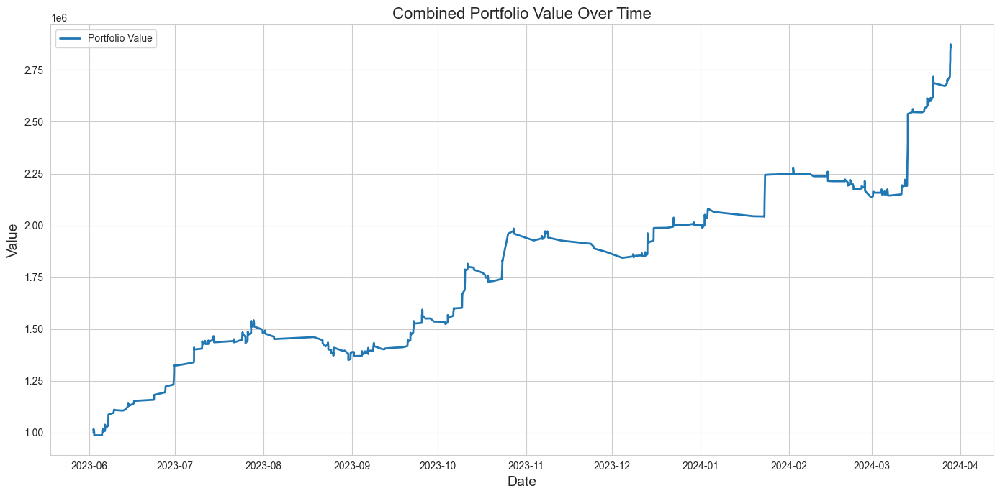

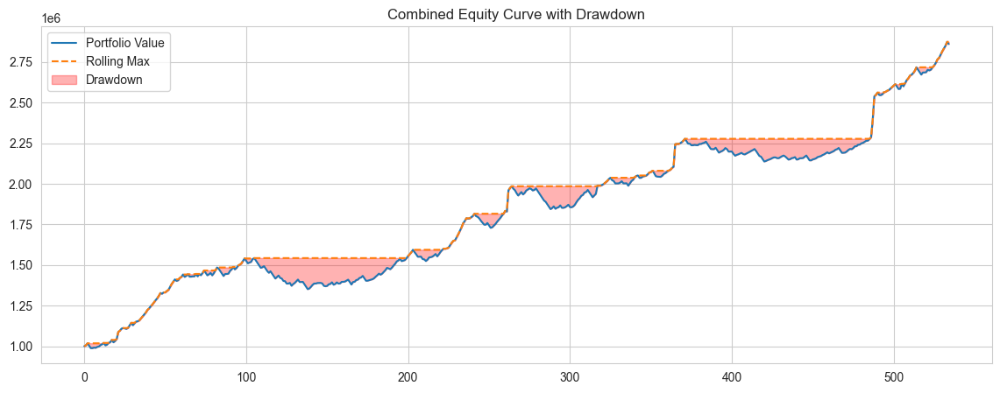

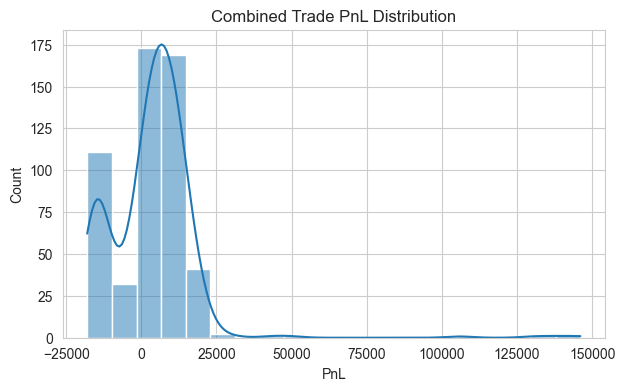

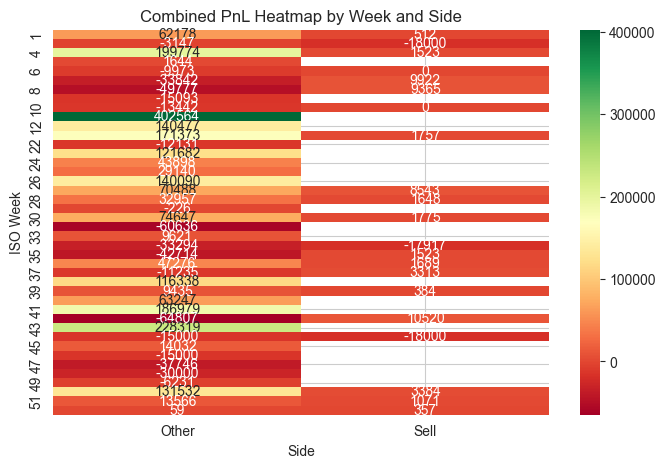

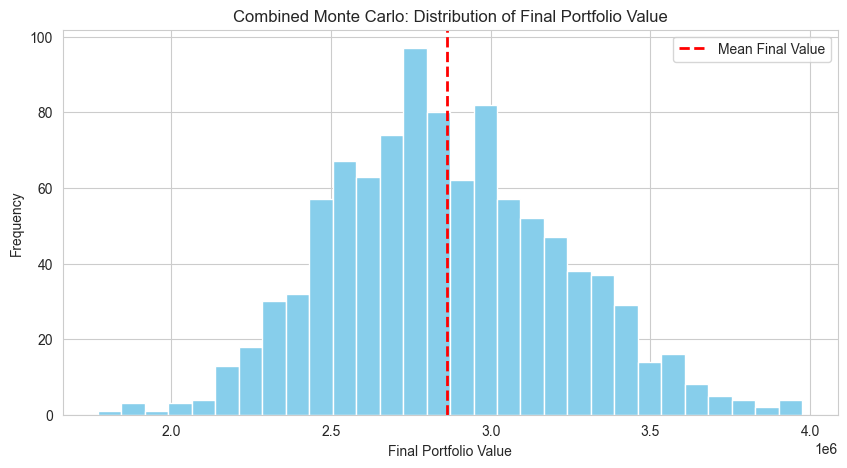

Monte Carlo: Mean Final Value = 2,862,239.62, 5th Percentile = 2,312,242.13, 95th Percentile = 3,483,123.82


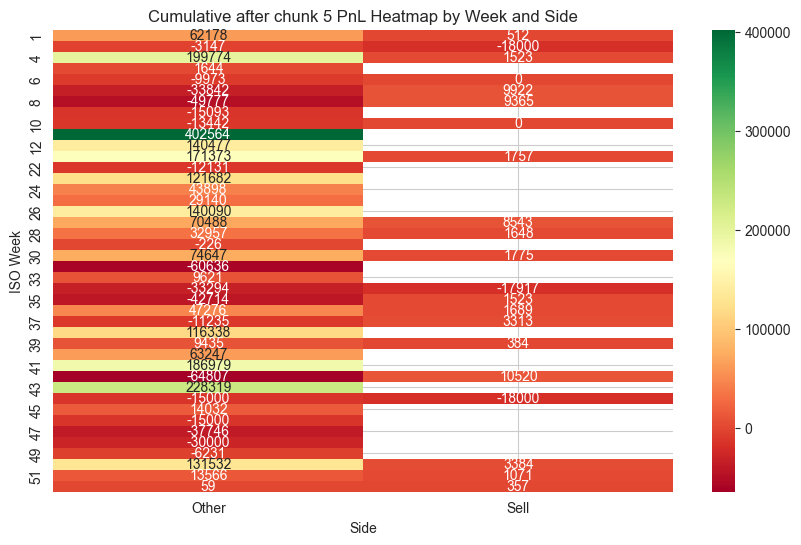


=== Processing chunk 6: 2024-04-01 09:15:00+05:30 to 2024-06-01 09:14:00+05:30 ===

Sell-Side Chunk 6 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹1,027,339.78
Total Return:       2.73%
Max Drawdown:       ₹0.00
Sharpe Ratio:       8.51
Sortino Ratio:      0.00
Calmar Ratio:       0.00

Trade Statistics:
-----------------
Total Trades:       10
Winning Trades:     10
Losing Trades:      0
Avg PnL:            ₹2,733.98
Best Trade:         ₹16,450.00
Worst Trade:        ₹54.15
Trade Period:       2024-04-03 to 2024-05-16



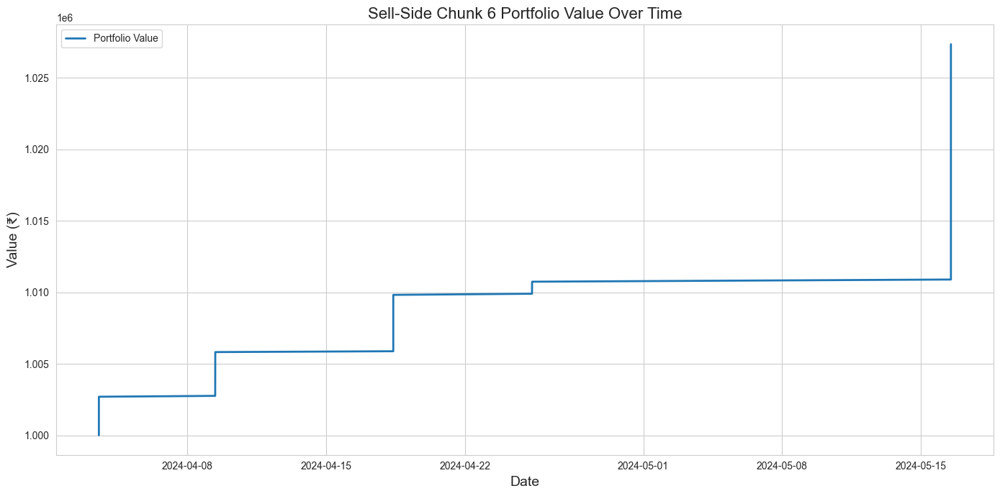

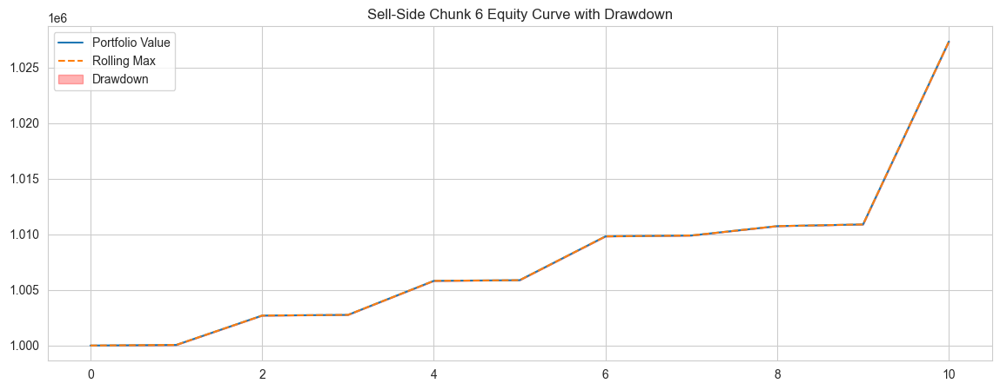

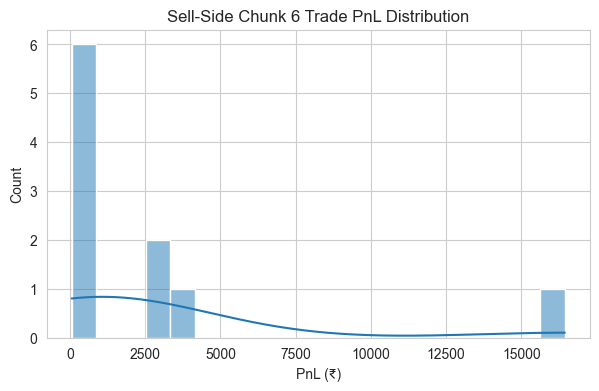

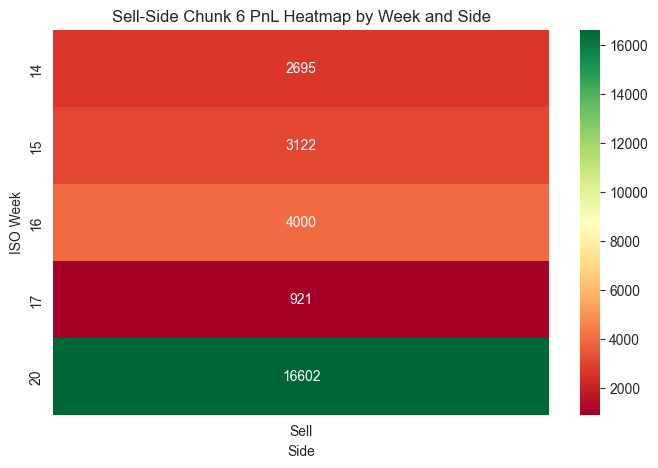

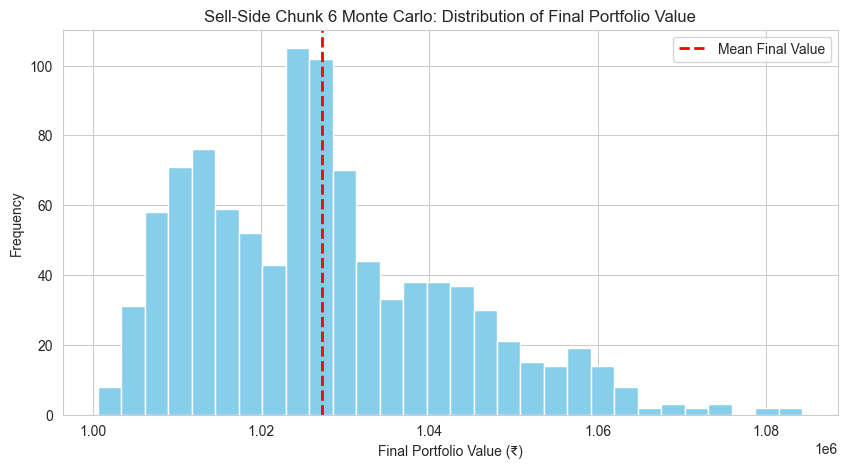

Monte Carlo: Mean Final Value = ₹1,027,296.16, 5th Percentile = ₹1,006,802.35, 95th Percentile = ₹1,057,052.93


C:\Users\cmman\AppData\Local\Temp\ipykernel_28480\437400957.py:271: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: compute_atr(x, BUY_ATR_PERIOD)).reset_index(level=[0,1,2], drop=True)



Buy-Side Chunk 6 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹935,894.96
Total Return:       -6.41%
Max Drawdown:       ₹97,201.80
Sharpe Ratio:       -1.87
Sortino Ratio:      -18.74
Calmar Ratio:       -3.41

Trade Statistics:
-----------------
Total Trades:       41
Winning Trades:     22
Losing Trades:      19
Avg PnL:            ₹-1,563.54
Best Trade:         ₹27,186.78
Worst Trade:        ₹-15,000.00
Trade Period:       2024-04-01 to 2024-05-31



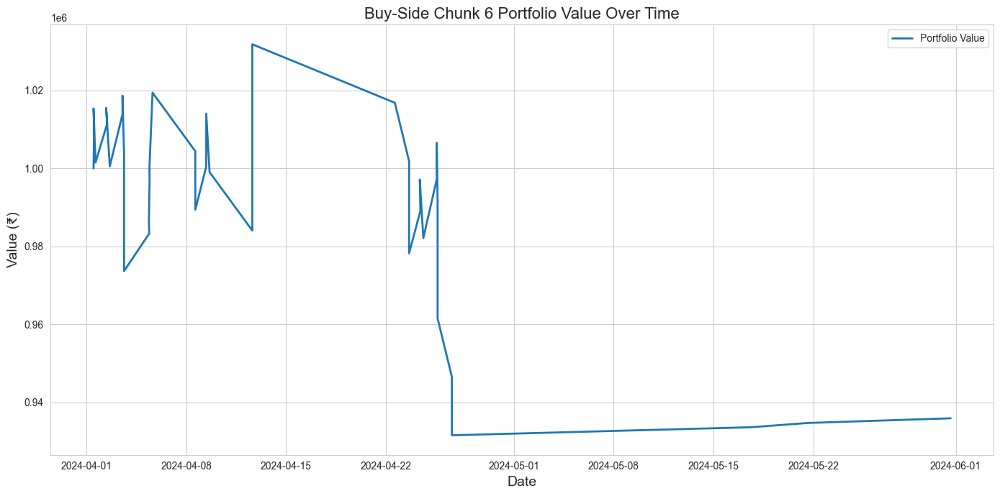

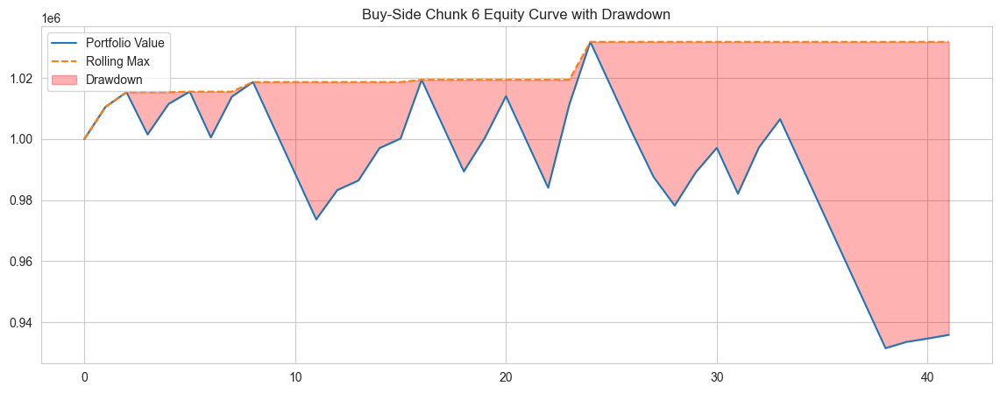

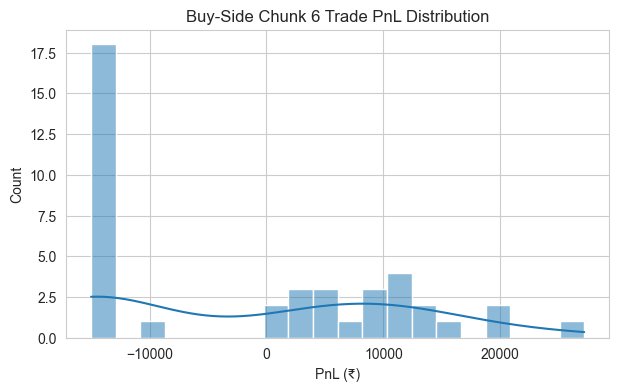

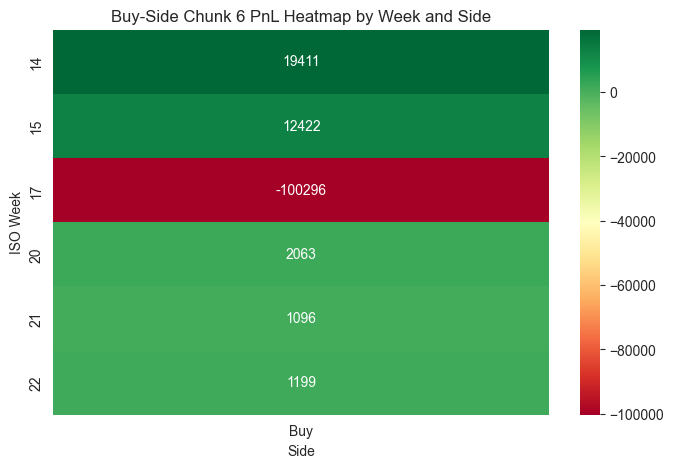

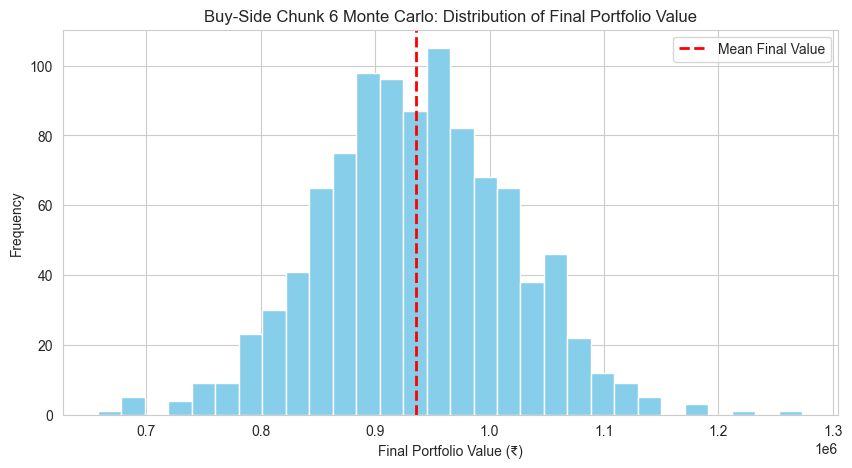

Monte Carlo: Mean Final Value = ₹935,829.51, 5th Percentile = ₹800,391.89, 95th Percentile = ₹1,069,366.98

===== CUMULATIVE REPORT AFTER CHUNK 6 =====

Combined Strategy Performance Report:
-----------------------------
Initial Capital:    1,000,000.00
Final Portfolio:    2,823,625.34
Total Return:       182.36%
Max Drawdown:       124,049.77
Sharpe Ratio:       3.44
Sortino Ratio:      8.30
Calmar Ratio:       14.78
Total Trades:       585
Winning Trades:     408
Losing Trades:      177
Avg PnL:            3,117.31
Best Trade:         146,082.03
Worst Trade:        -18,000.00
Trade Period:       2023-06-02 to 2024-05-31



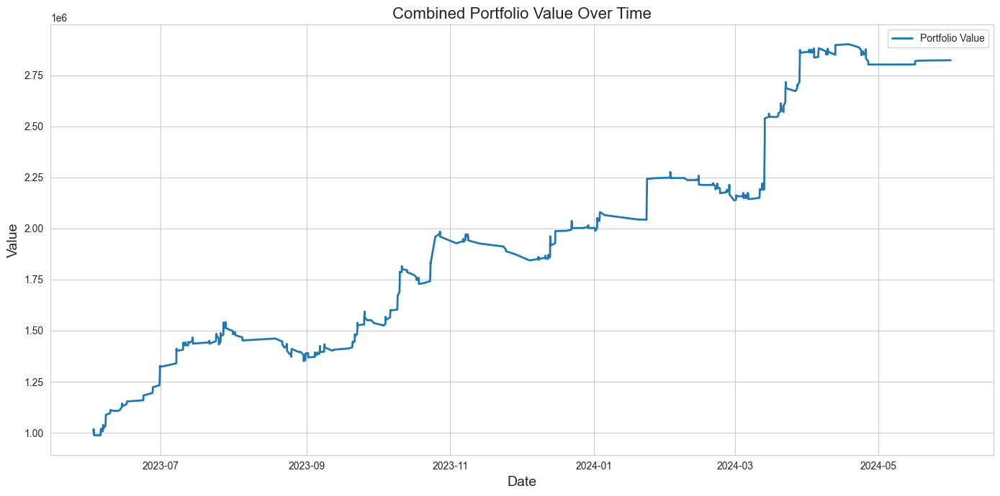

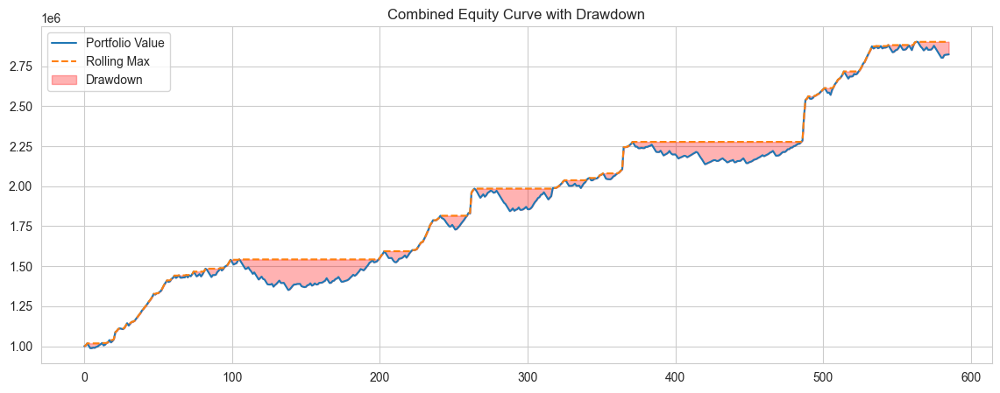

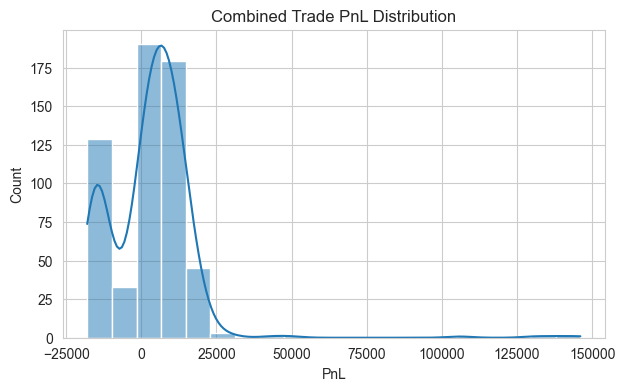

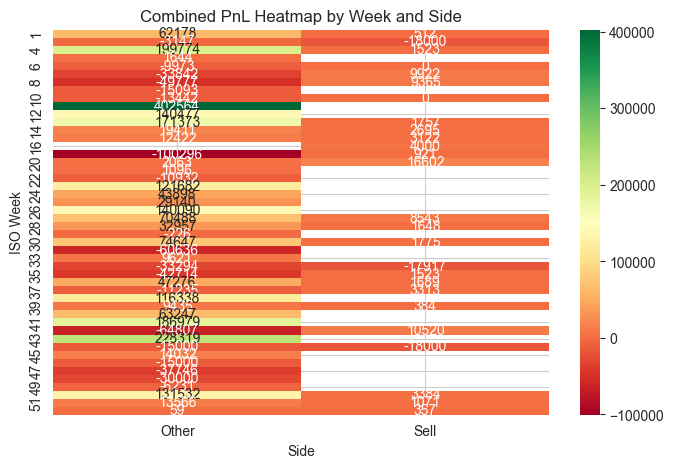

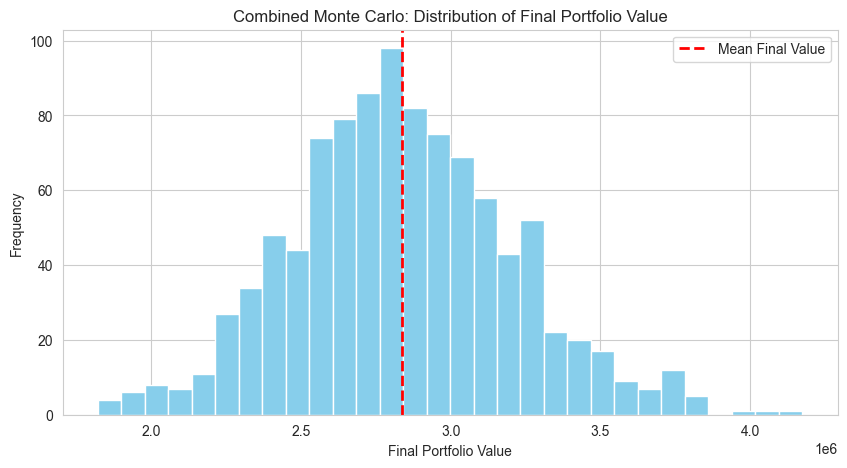

Monte Carlo: Mean Final Value = 2,839,254.23, 5th Percentile = 2,259,211.08, 95th Percentile = 3,479,900.52


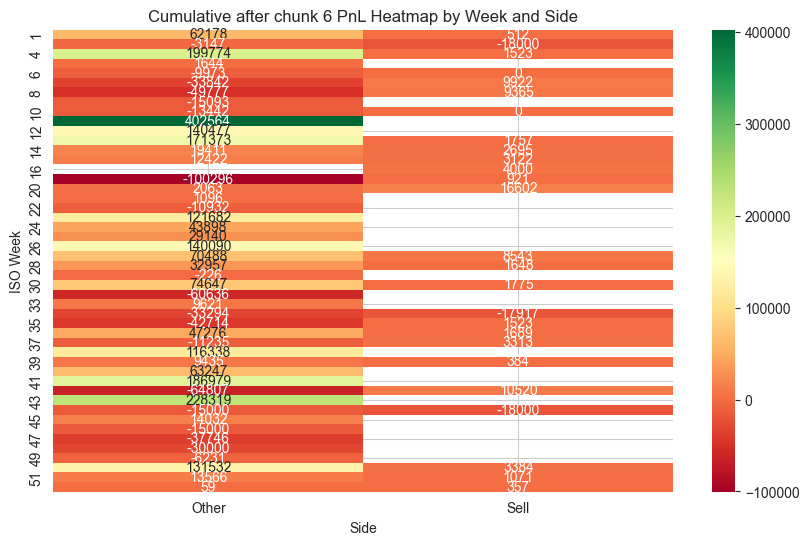


=== Processing chunk 7: 2024-06-01 09:15:00+05:30 to 2024-08-01 09:14:00+05:30 ===

Sell-Side Chunk 7 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹1,000,653.10
Total Return:       0.07%
Max Drawdown:       ₹0.00
Sharpe Ratio:       12.02
Sortino Ratio:      0.00
Calmar Ratio:       0.00

Trade Statistics:
-----------------
Total Trades:       2
Winning Trades:     2
Losing Trades:      0
Avg PnL:            ₹326.55
Best Trade:         ₹594.38
Worst Trade:        ₹58.73
Trade Period:       2024-06-25 to 2024-06-25



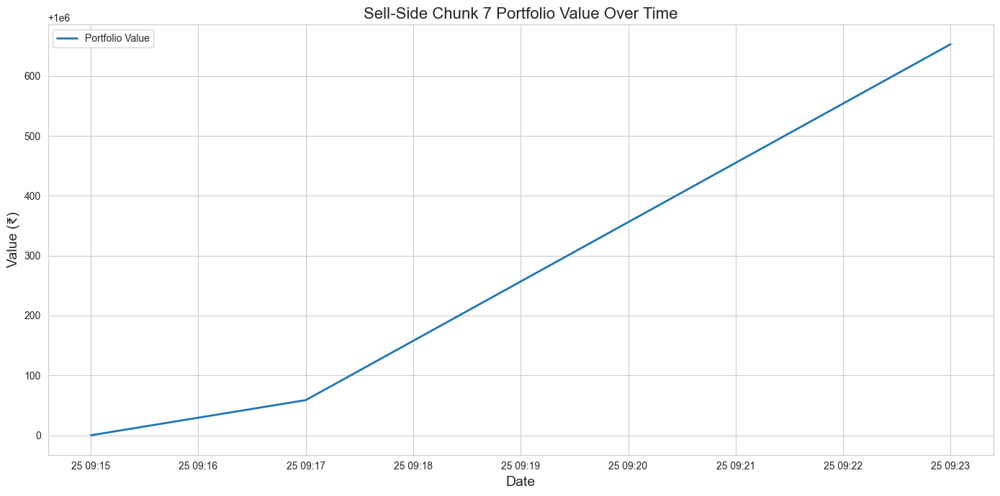

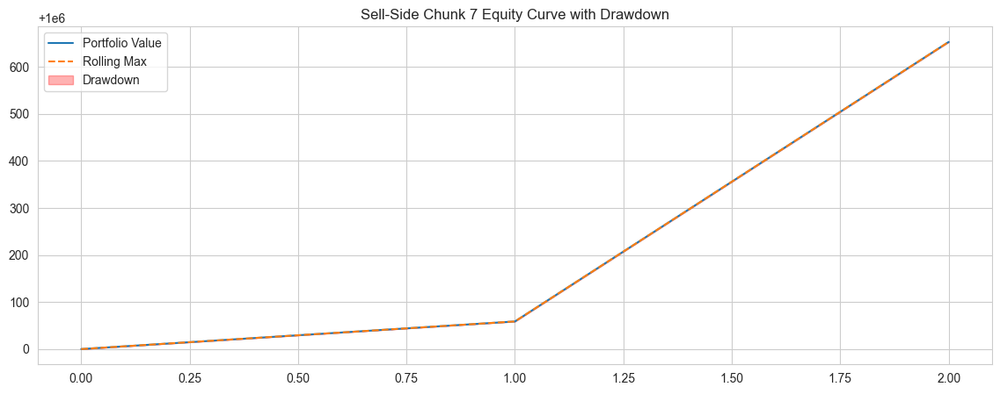

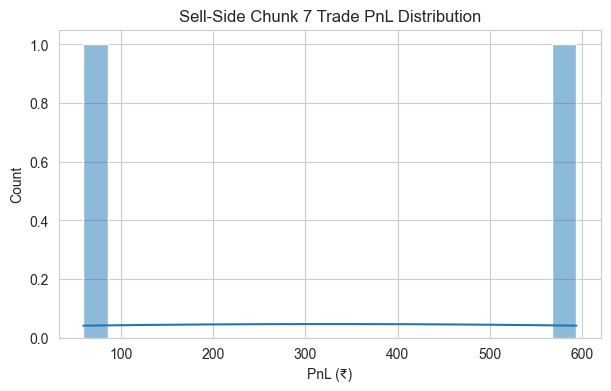

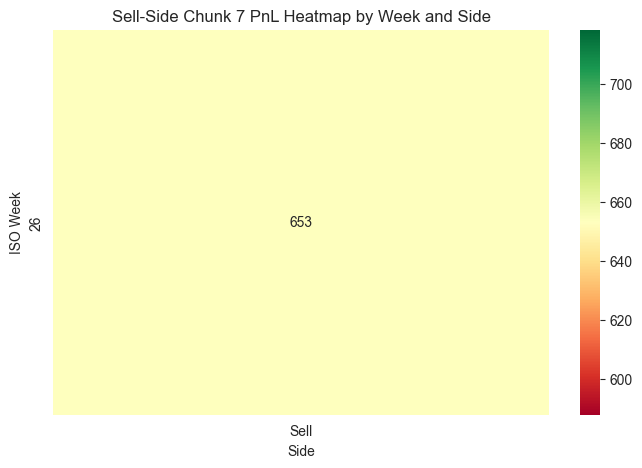

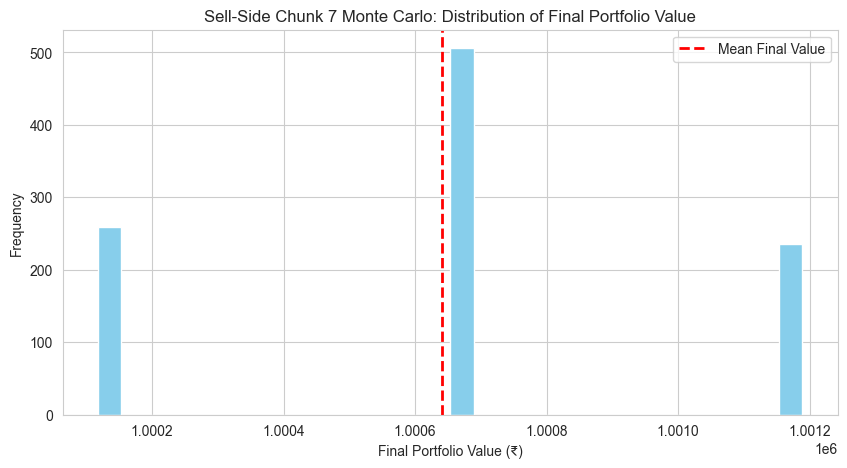

Monte Carlo: Mean Final Value = ₹1,000,640.24, 5th Percentile = ₹1,000,117.45, 95th Percentile = ₹1,001,188.75


C:\Users\cmman\AppData\Local\Temp\ipykernel_28480\437400957.py:271: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: compute_atr(x, BUY_ATR_PERIOD)).reset_index(level=[0,1,2], drop=True)



Buy-Side Chunk 7 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹1,274,068.27
Total Return:       27.41%
Max Drawdown:       ₹176,917.80
Sharpe Ratio:       3.16
Sortino Ratio:      5.75
Calmar Ratio:       22.58

Trade Statistics:
-----------------
Total Trades:       126
Winning Trades:     87
Losing Trades:      39
Avg PnL:            ₹2,175.14
Best Trade:         ₹25,849.91
Worst Trade:        ₹-15,000.00
Trade Period:       2024-06-05 to 2024-07-30



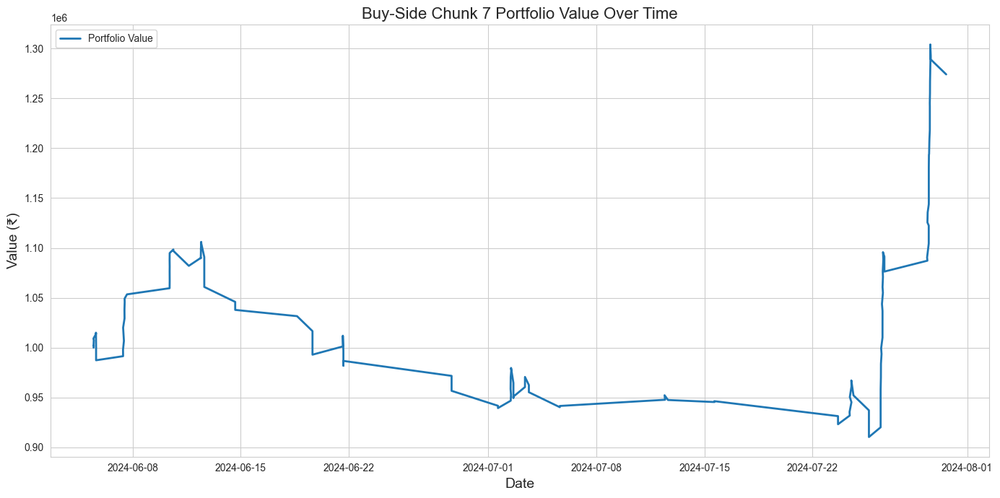

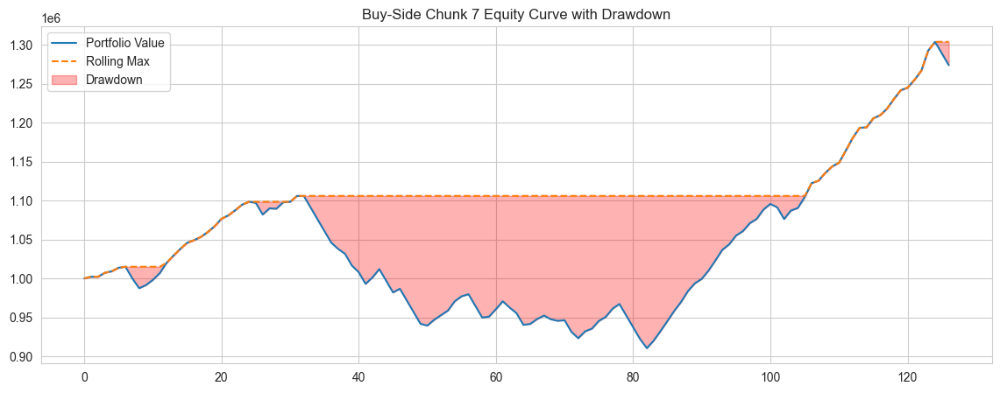

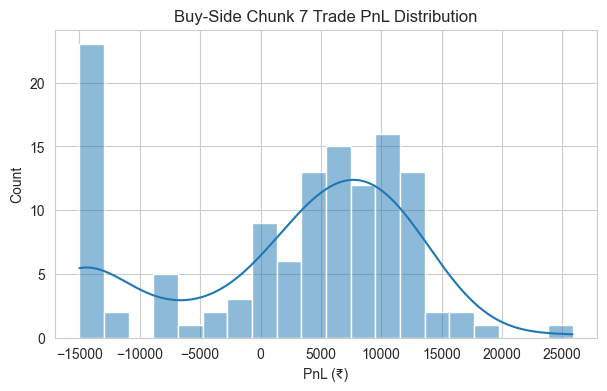

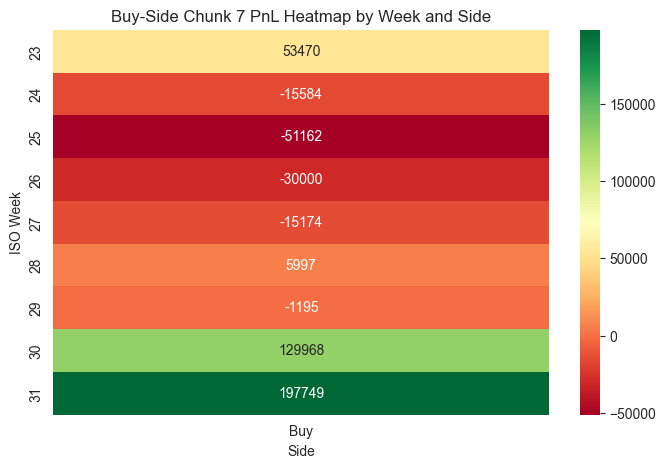

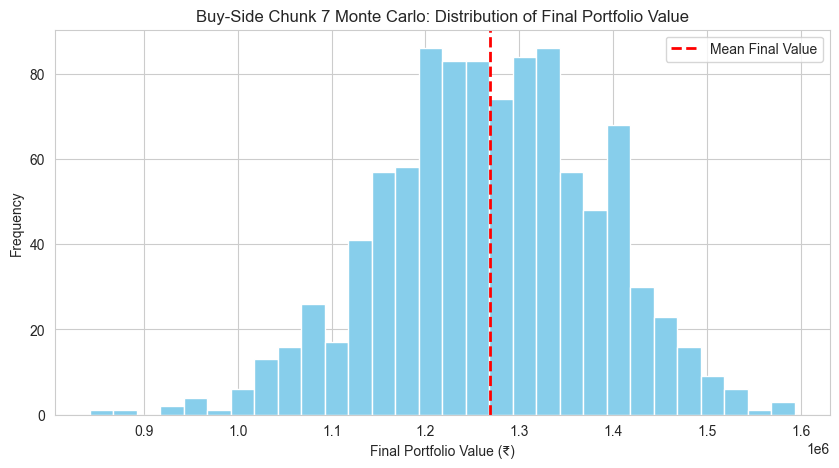

Monte Carlo: Mean Final Value = ₹1,269,144.68, 5th Percentile = ₹1,071,704.18, 95th Percentile = ₹1,448,416.33

===== CUMULATIVE REPORT AFTER CHUNK 7 =====

Combined Strategy Performance Report:
-----------------------------
Initial Capital:    1,000,000.00
Final Portfolio:    3,098,346.70
Total Return:       209.83%
Max Drawdown:       124,049.77
Sharpe Ratio:       3.32
Sortino Ratio:      7.53
Calmar Ratio:       13.29
Total Trades:       713
Winning Trades:     497
Losing Trades:      216
Avg PnL:            2,942.98
Best Trade:         146,082.03
Worst Trade:        -18,000.00
Trade Period:       2023-06-02 to 2024-07-30



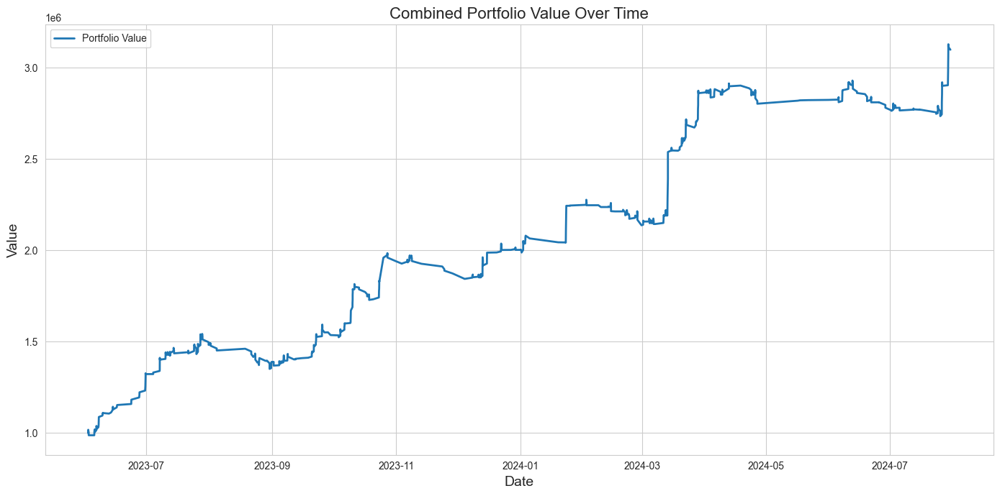

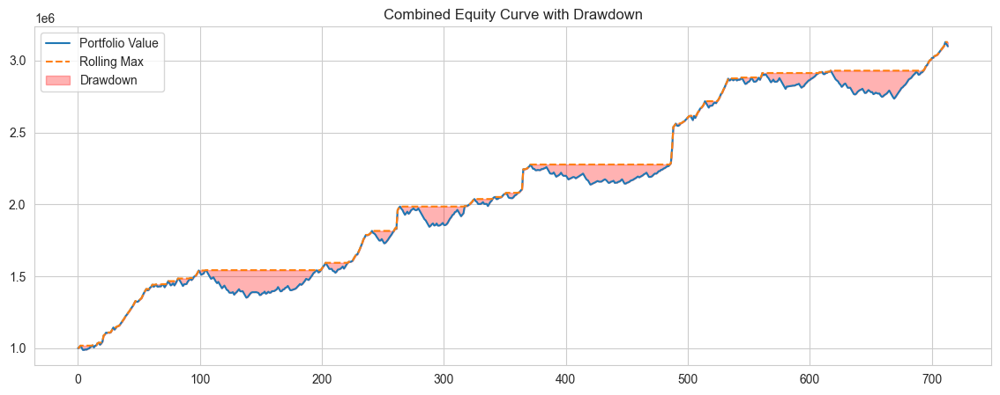

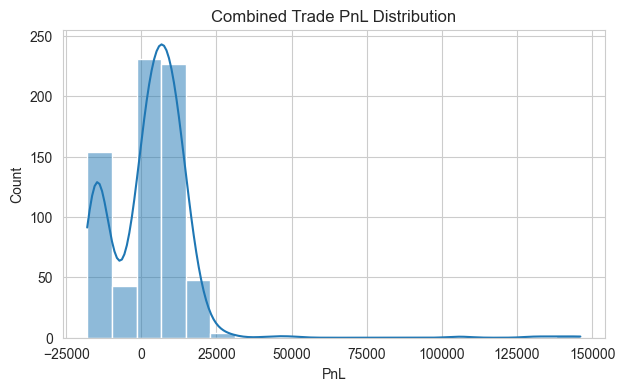

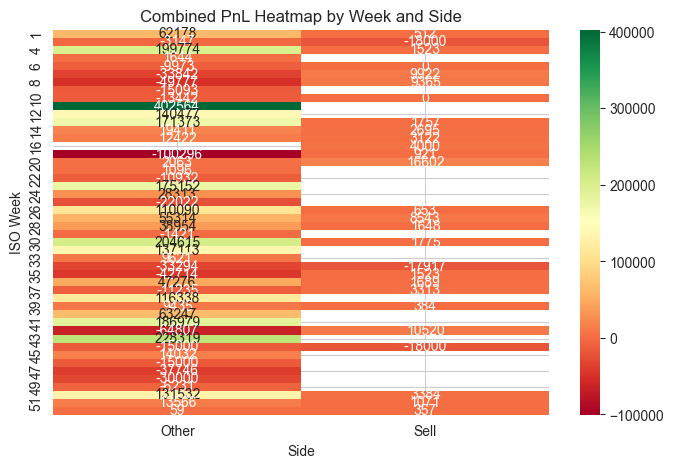

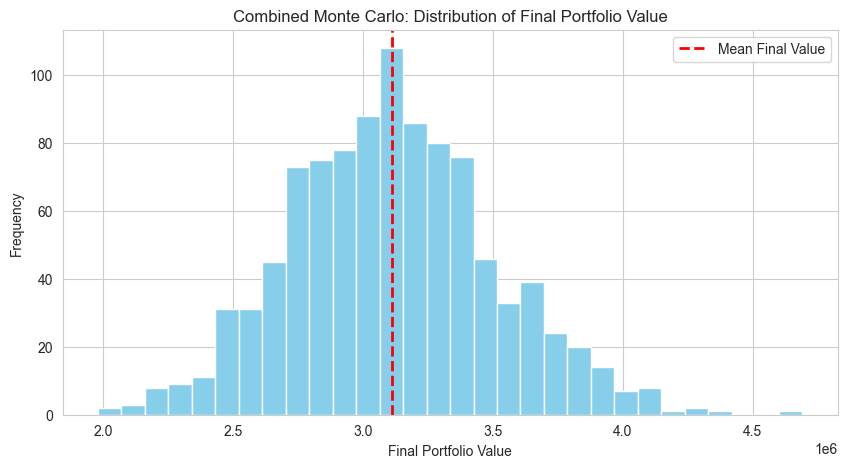

Monte Carlo: Mean Final Value = 3,112,659.27, 5th Percentile = 2,489,221.91, 95th Percentile = 3,813,243.36


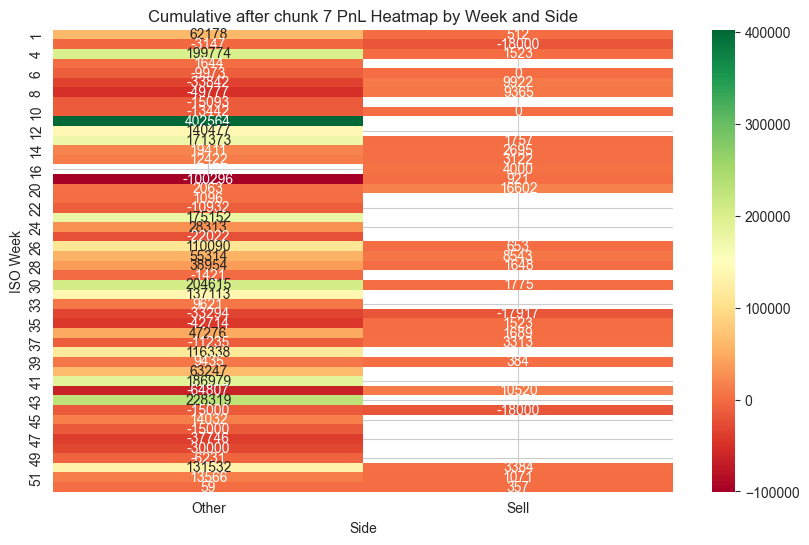


=== Processing chunk 8: 2024-08-01 09:15:00+05:30 to 2024-10-01 09:14:00+05:30 ===

Sell-Side Chunk 8 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹1,002,058.70
Total Return:       0.21%
Max Drawdown:       ₹0.00
Sharpe Ratio:       8.09
Sortino Ratio:      0.00
Calmar Ratio:       0.00

Trade Statistics:
-----------------
Total Trades:       10
Winning Trades:     6
Losing Trades:      4
Avg PnL:            ₹205.87
Best Trade:         ₹1,014.75
Worst Trade:        ₹0.00
Trade Period:       2024-08-08 to 2024-09-17



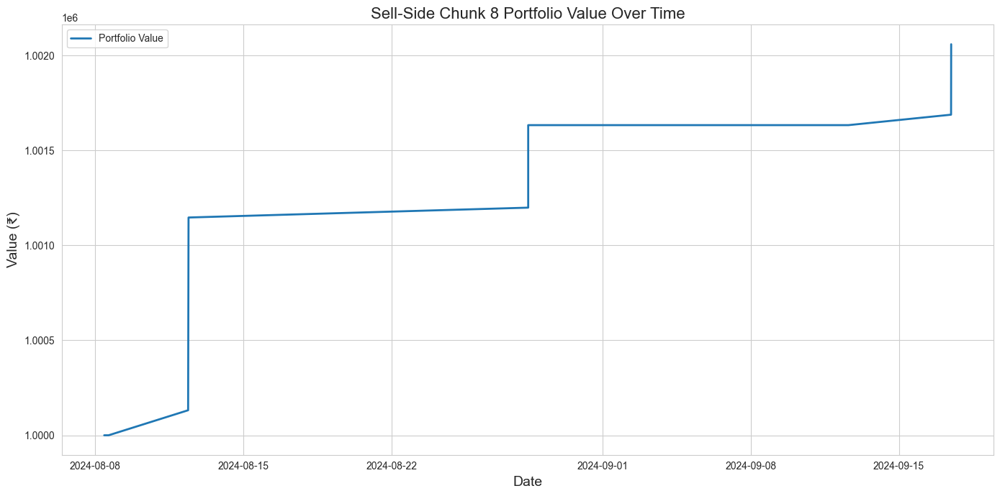

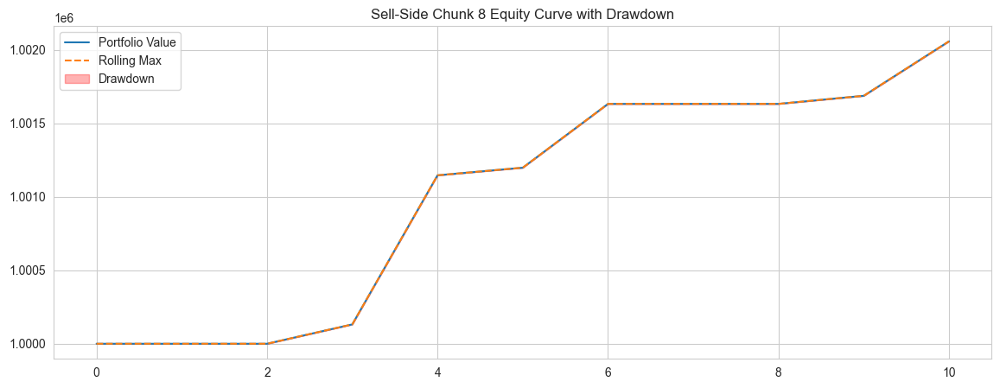

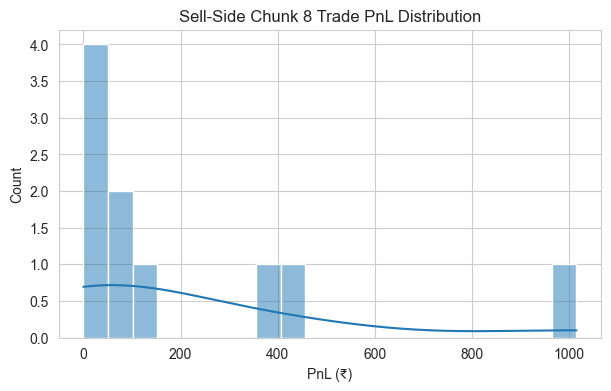

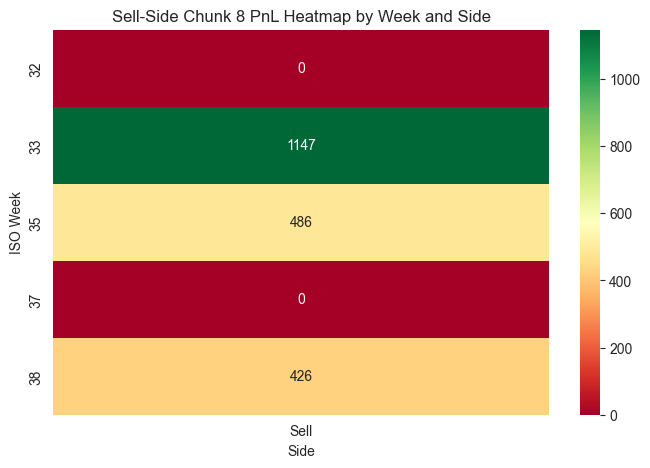

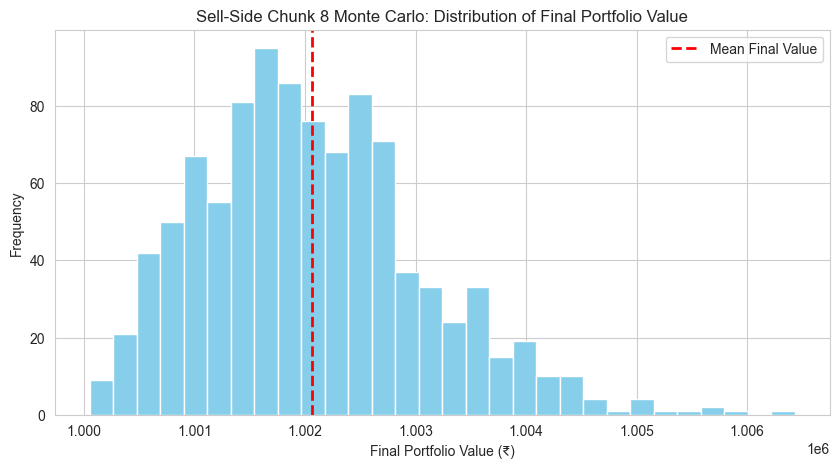

Monte Carlo: Mean Final Value = ₹1,002,059.76, 5th Percentile = ₹1,000,618.05, 95th Percentile = ₹1,003,904.55


C:\Users\cmman\AppData\Local\Temp\ipykernel_28480\437400957.py:271: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: compute_atr(x, BUY_ATR_PERIOD)).reset_index(level=[0,1,2], drop=True)



Buy-Side Chunk 8 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹1,564,351.46
Total Return:       56.44%
Max Drawdown:       ₹95,285.93
Sharpe Ratio:       7.41
Sortino Ratio:      15.30
Calmar Ratio:       205.99

Trade Statistics:
-----------------
Total Trades:       116
Winning Trades:     89
Losing Trades:      27
Avg PnL:            ₹4,865.10
Best Trade:         ₹28,989.58
Worst Trade:        ₹-15,000.00
Trade Period:       2024-08-07 to 2024-09-30



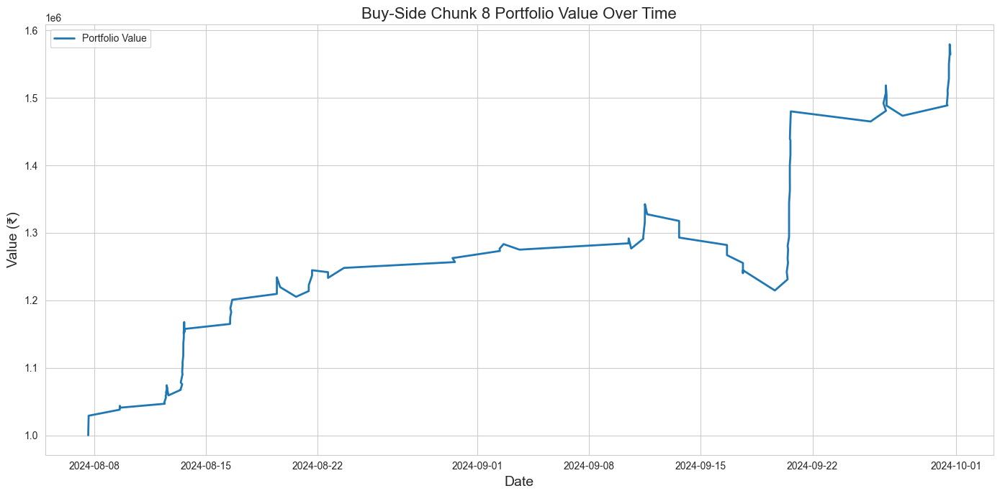

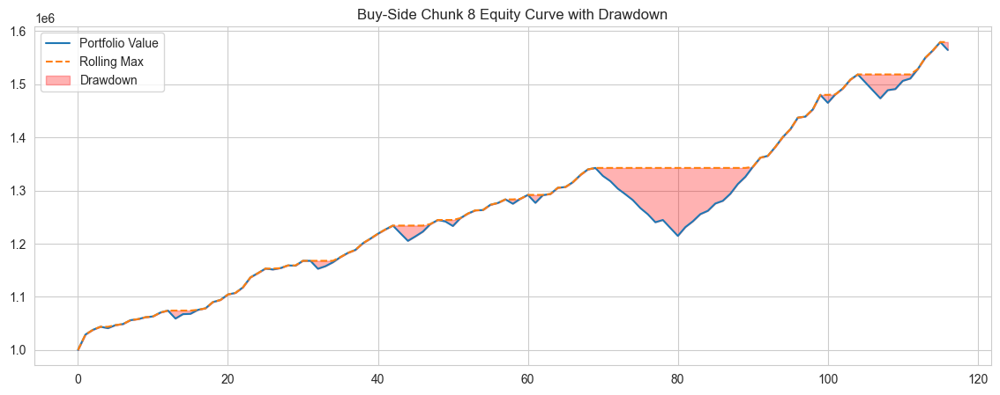

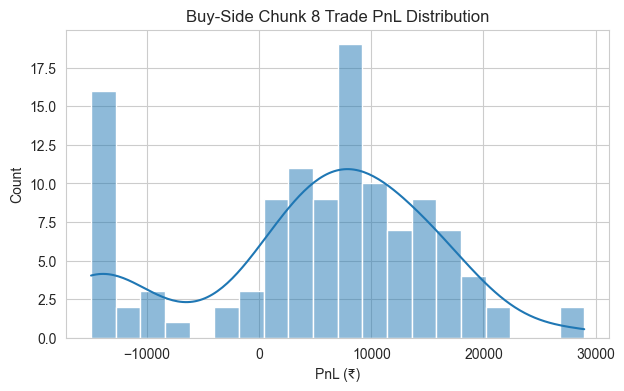

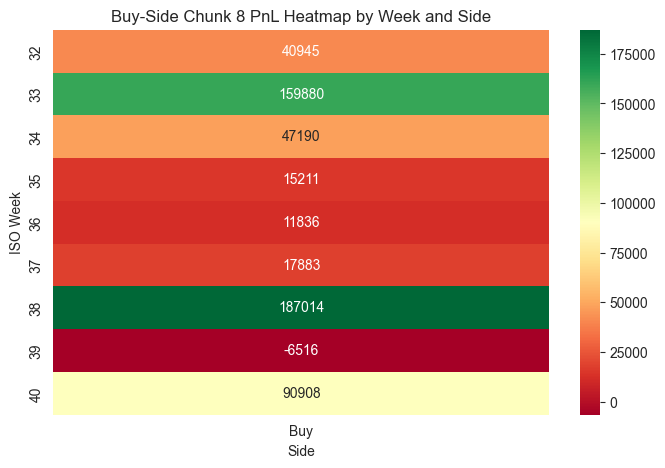

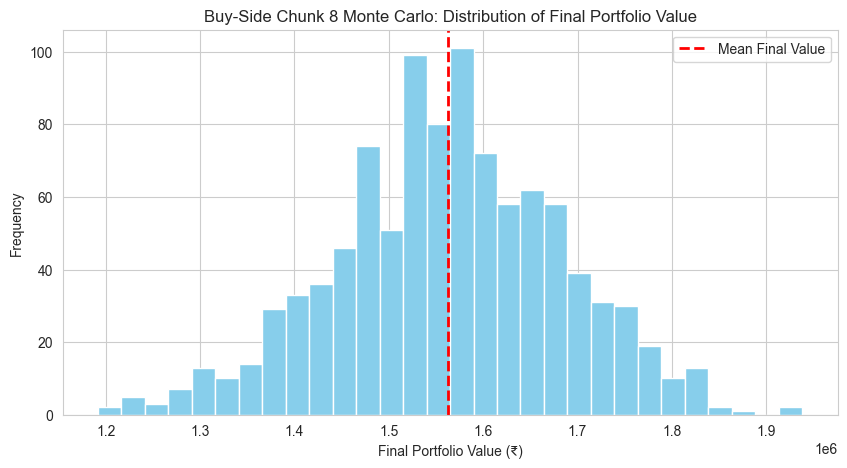

Monte Carlo: Mean Final Value = ₹1,562,384.49, 5th Percentile = ₹1,363,096.43, 95th Percentile = ₹1,762,132.07

===== CUMULATIVE REPORT AFTER CHUNK 8 =====

Combined Strategy Performance Report:
-----------------------------
Initial Capital:    1,000,000.00
Final Portfolio:    3,664,756.87
Total Return:       266.48%
Max Drawdown:       124,049.77
Sharpe Ratio:       3.45
Sortino Ratio:      7.42
Calmar Ratio:       13.33
Total Trades:       839
Winning Trades:     592
Losing Trades:      247
Avg PnL:            3,176.11
Best Trade:         146,082.03
Worst Trade:        -18,000.00
Trade Period:       2023-06-02 to 2024-09-30



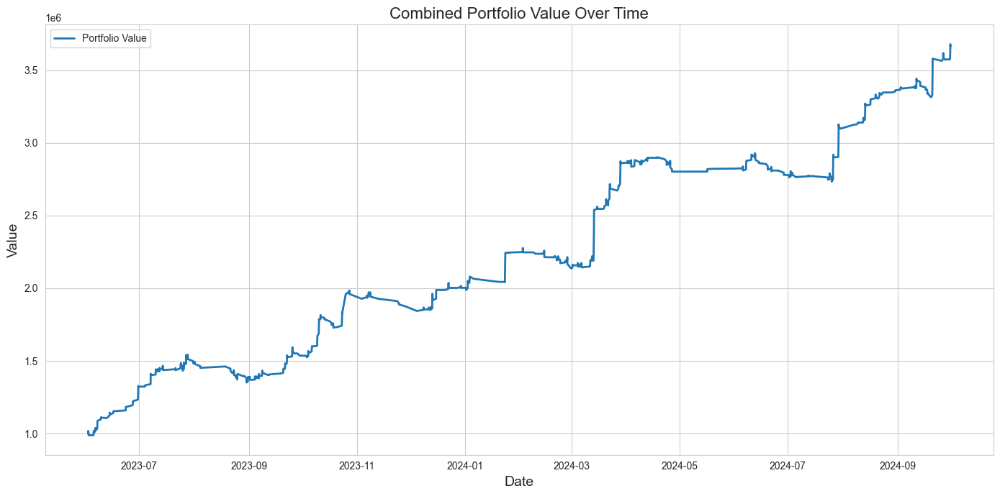

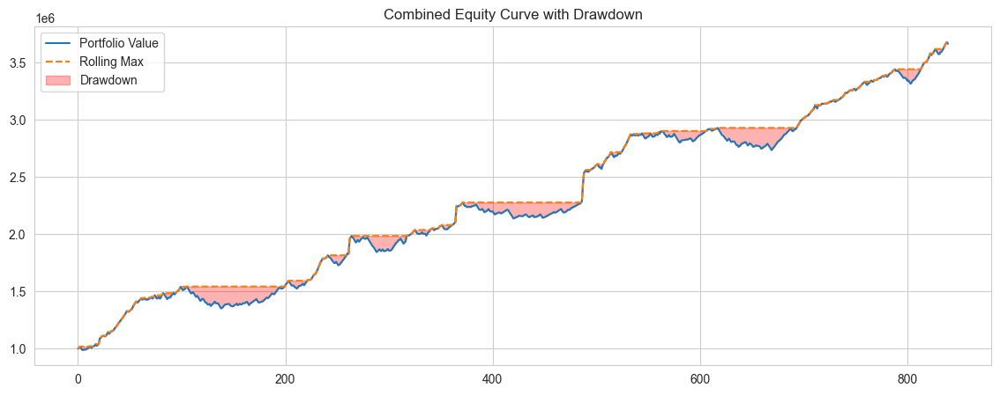

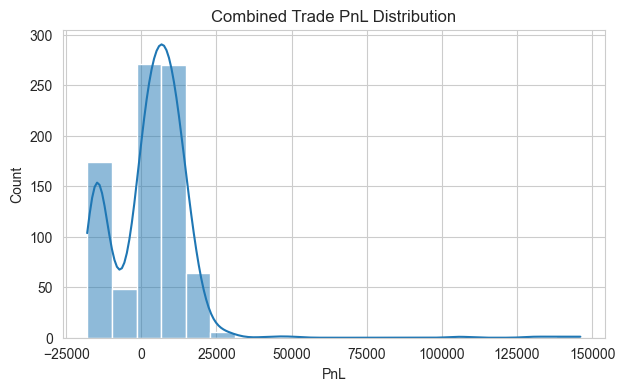

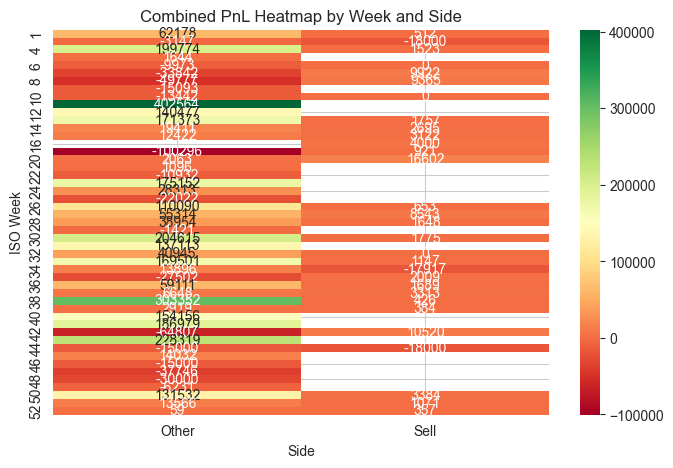

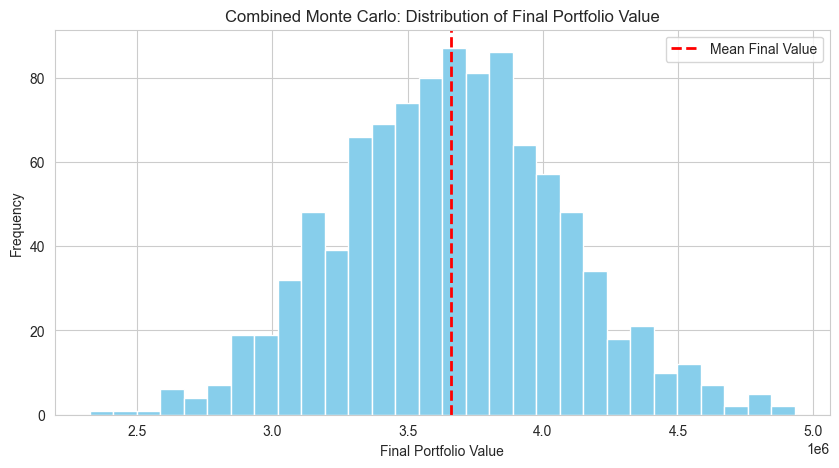

Monte Carlo: Mean Final Value = 3,659,960.86, 5th Percentile = 2,988,992.35, 95th Percentile = 4,346,737.38


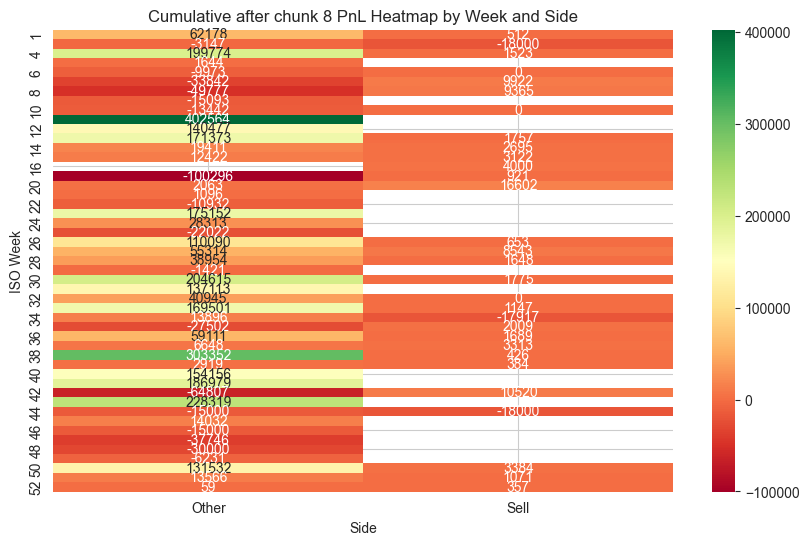


=== Processing chunk 9: 2024-10-01 09:15:00+05:30 to 2024-12-01 09:14:00+05:30 ===

Sell-Side Chunk 9 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹1,003,221.25
Total Return:       0.32%
Max Drawdown:       ₹0.00
Sharpe Ratio:       11.36
Sortino Ratio:      0.00
Calmar Ratio:       0.00

Trade Statistics:
-----------------
Total Trades:       4
Winning Trades:     4
Losing Trades:      0
Avg PnL:            ₹805.31
Best Trade:         ₹2,376.00
Worst Trade:        ₹108.75
Trade Period:       2024-11-26 to 2024-11-26



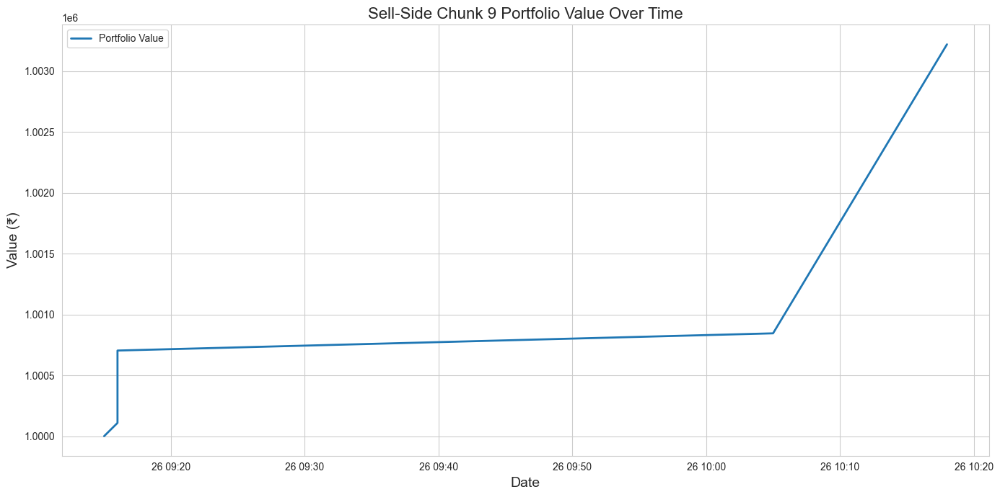

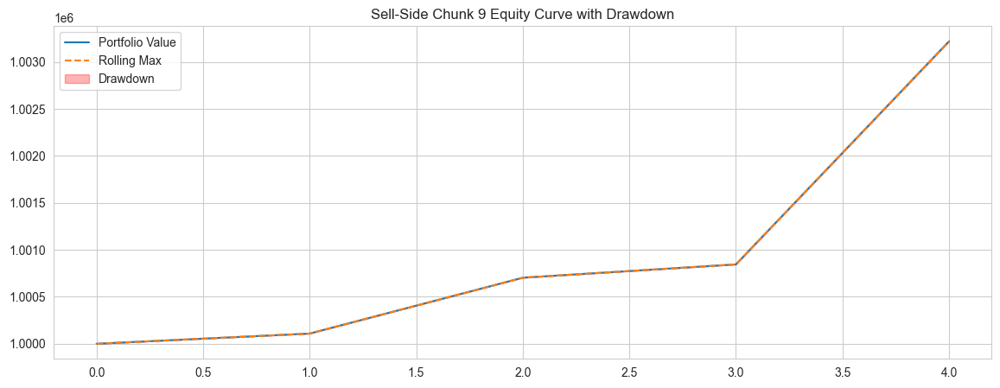

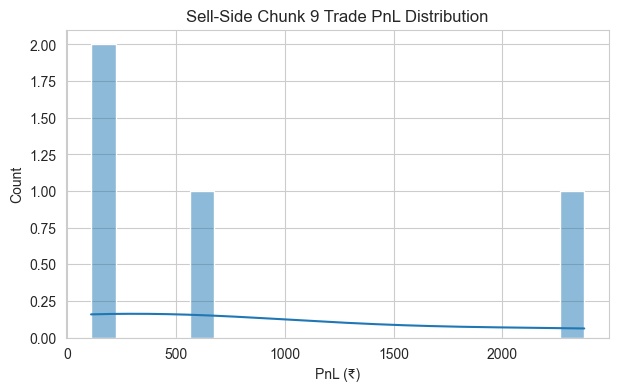

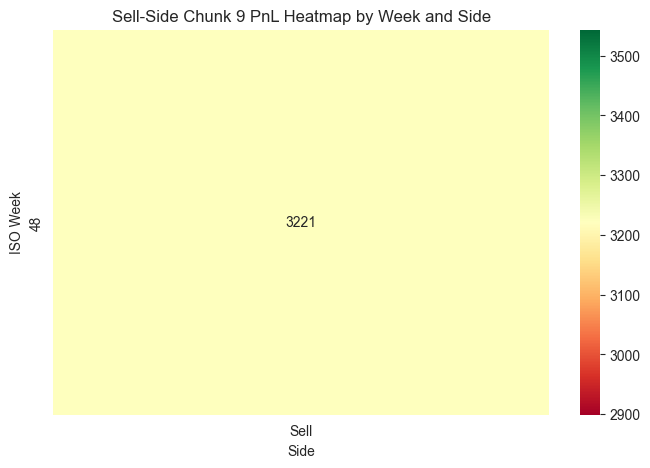

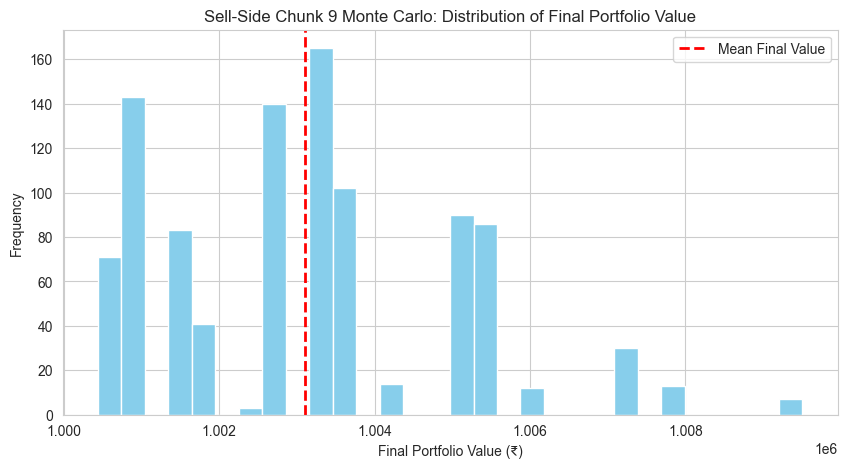

Monte Carlo: Mean Final Value = ₹1,003,106.95, 5th Percentile = ₹1,000,533.25, 95th Percentile = ₹1,006,006.74


C:\Users\cmman\AppData\Local\Temp\ipykernel_28480\437400957.py:271: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: compute_atr(x, BUY_ATR_PERIOD)).reset_index(level=[0,1,2], drop=True)



Buy-Side Chunk 9 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹1,136,947.92
Total Return:       13.69%
Max Drawdown:       ₹97,892.37
Sharpe Ratio:       1.40
Sortino Ratio:      4.98
Calmar Ratio:       12.40

Trade Statistics:
-----------------
Total Trades:       93
Winning Trades:     56
Losing Trades:      37
Avg PnL:            ₹1,472.56
Best Trade:         ₹141,999.98
Worst Trade:        ₹-15,000.00
Trade Period:       2024-10-01 to 2024-11-29



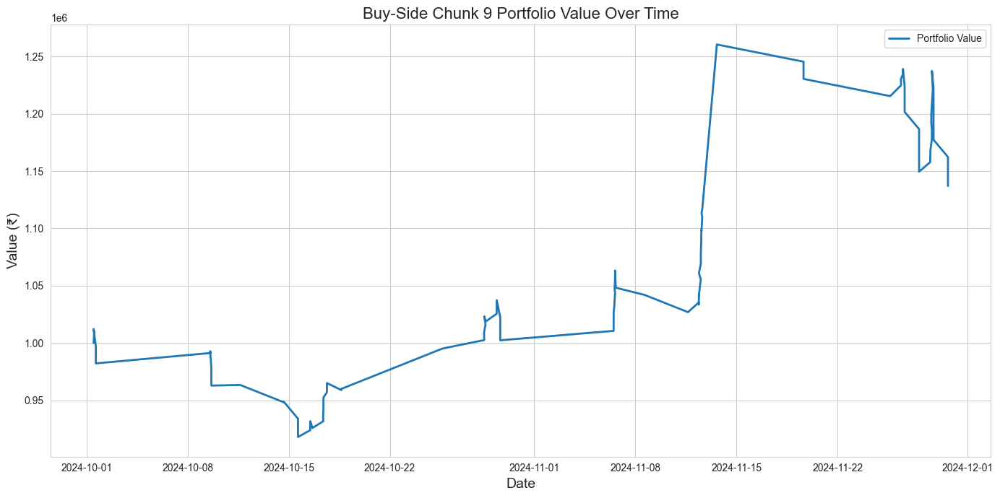

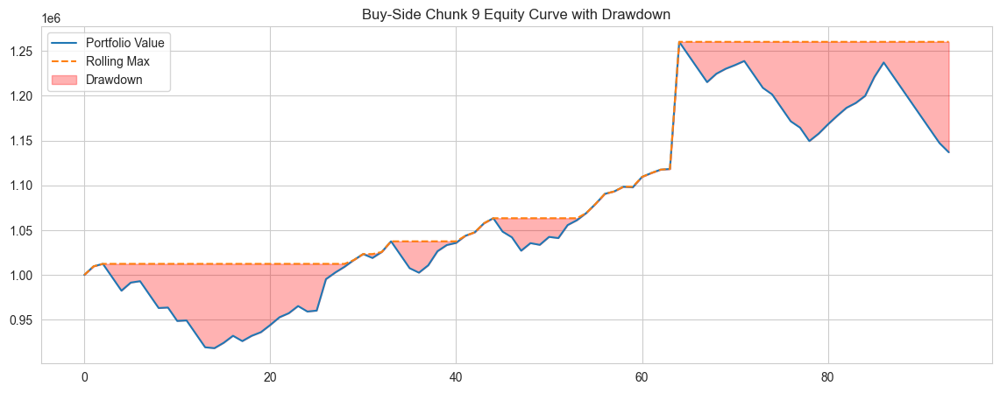

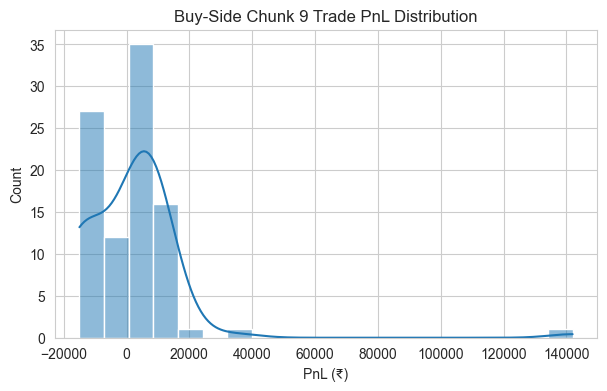

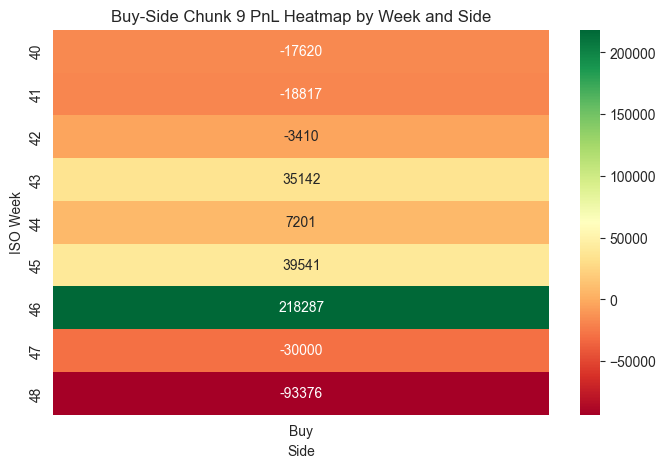

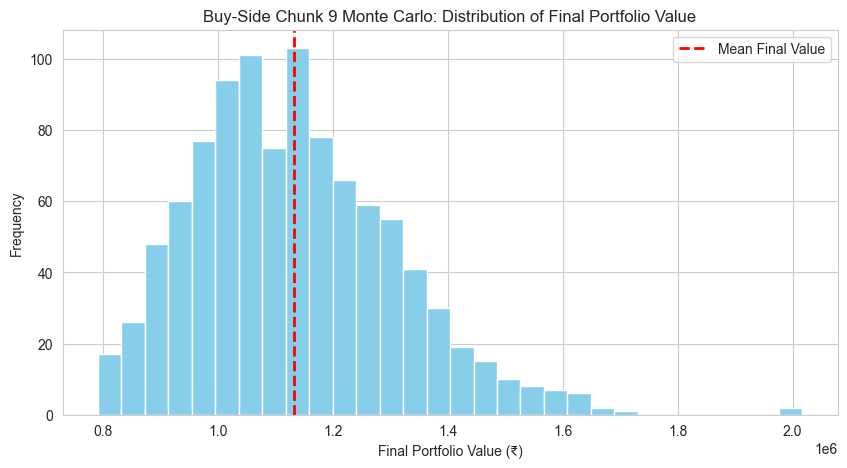

Monte Carlo: Mean Final Value = ₹1,132,555.10, 5th Percentile = ₹877,691.54, 95th Percentile = ₹1,448,625.14

===== CUMULATIVE REPORT AFTER CHUNK 9 =====

Combined Strategy Performance Report:
-----------------------------
Initial Capital:    1,000,000.00
Final Portfolio:    3,804,926.04
Total Return:       280.49%
Max Drawdown:       124,049.77
Sharpe Ratio:       3.27
Sortino Ratio:      6.96
Calmar Ratio:       11.65
Total Trades:       936
Winning Trades:     652
Losing Trades:      284
Avg PnL:            2,996.72
Best Trade:         146,082.03
Worst Trade:        -18,000.00
Trade Period:       2023-06-02 to 2024-11-29



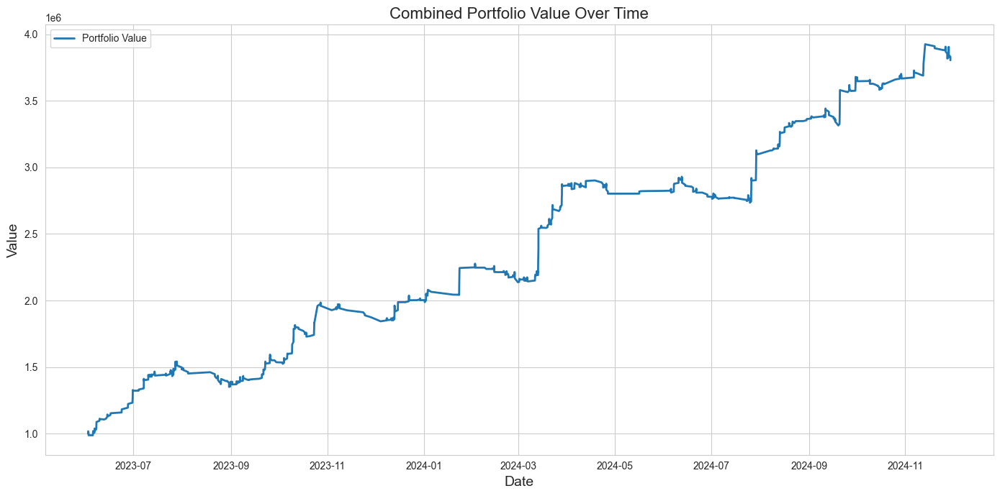

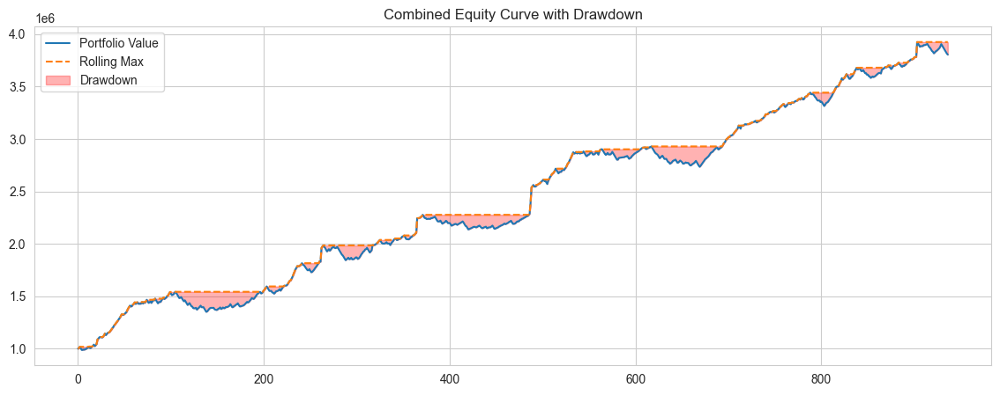

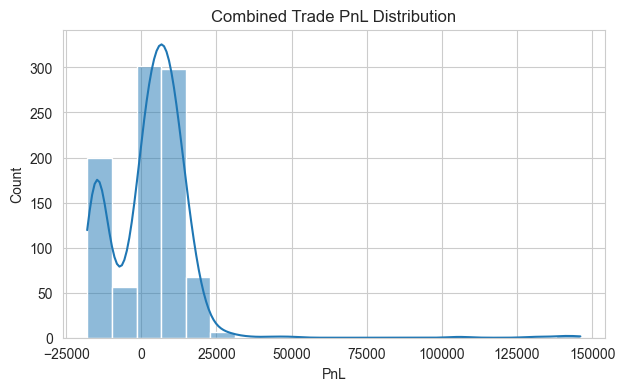

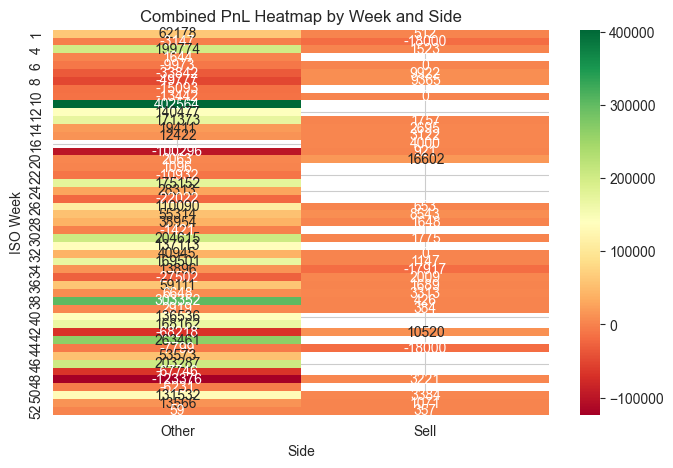

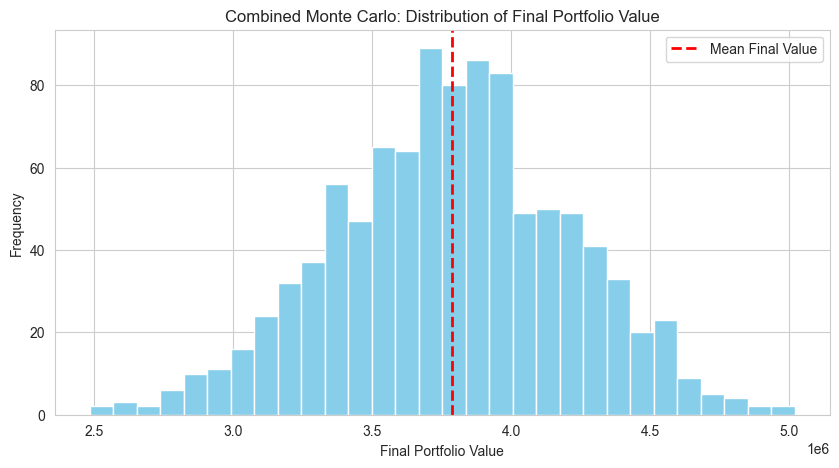

Monte Carlo: Mean Final Value = 3,785,309.13, 5th Percentile = 3,080,389.63, 95th Percentile = 4,488,072.29


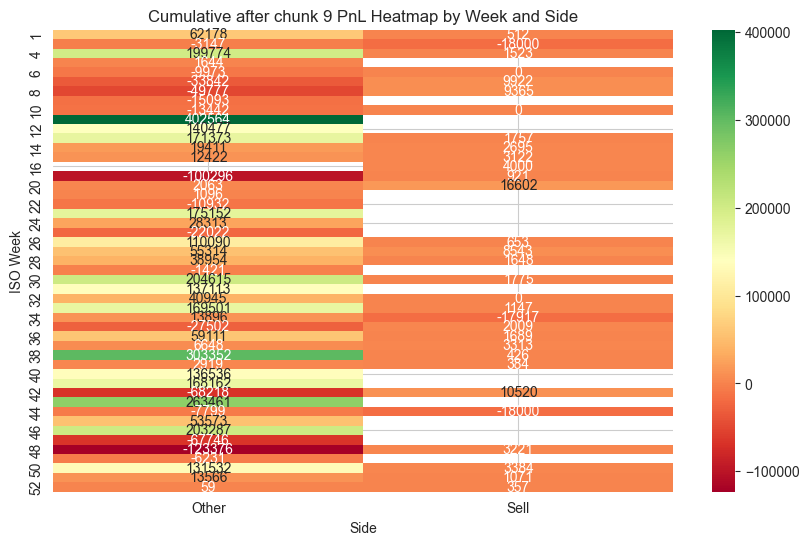


=== Processing chunk 10: 2024-12-01 09:15:00+05:30 to 2025-01-16 15:30:00+05:30 ===

Sell-Side Chunk 10 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹983,083.25
Total Return:       -1.69%
Max Drawdown:       ₹17,980.52
Sharpe Ratio:       -6.64
Sortino Ratio:      0.00
Calmar Ratio:       -9.57

Trade Statistics:
-----------------
Total Trades:       5
Winning Trades:     3
Losing Trades:      2
Avg PnL:            ₹-3,383.35
Best Trade:         ₹885.50
Worst Trade:        ₹-18,000.00
Trade Period:       2024-12-12 to 2025-01-15



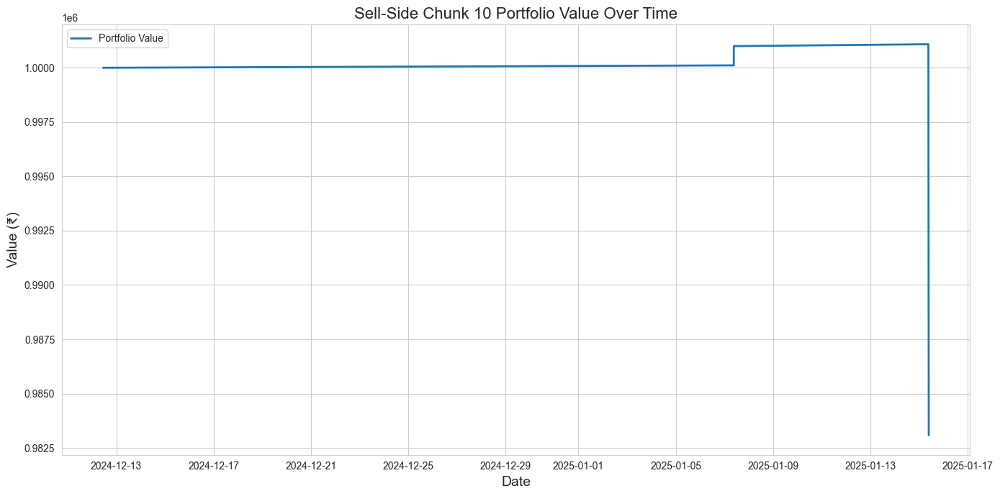

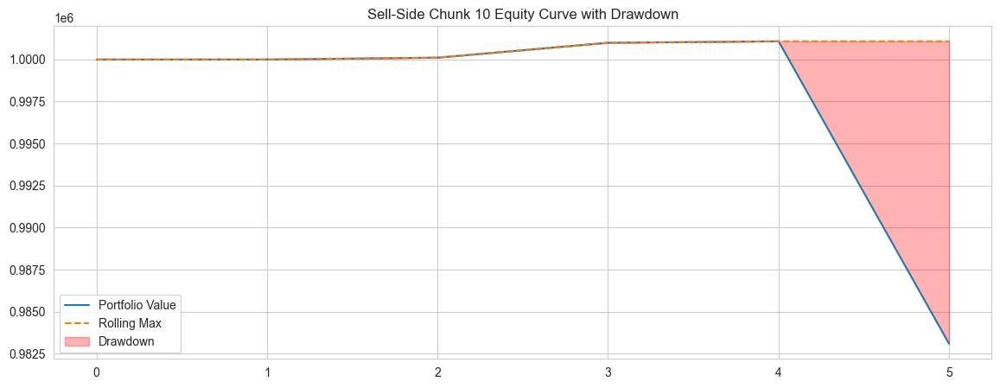

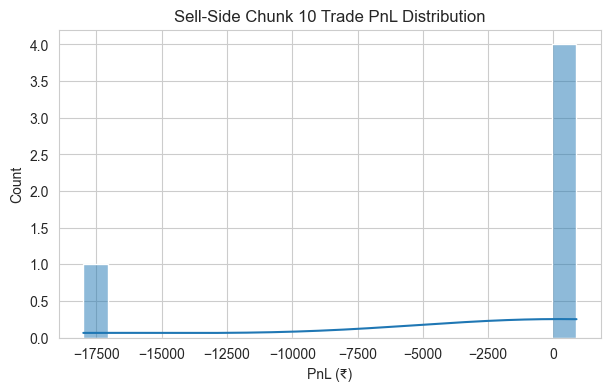

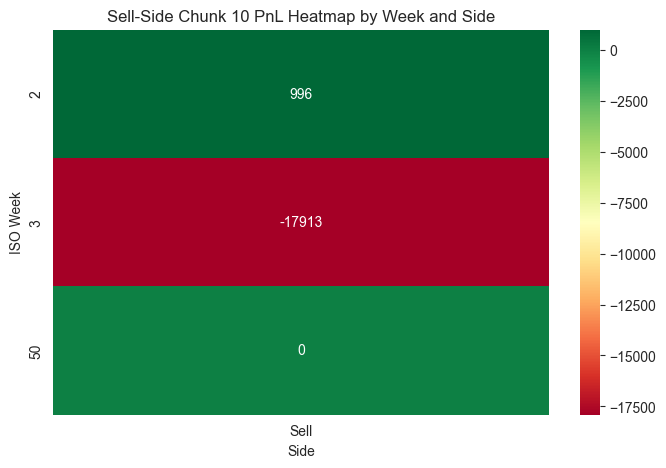

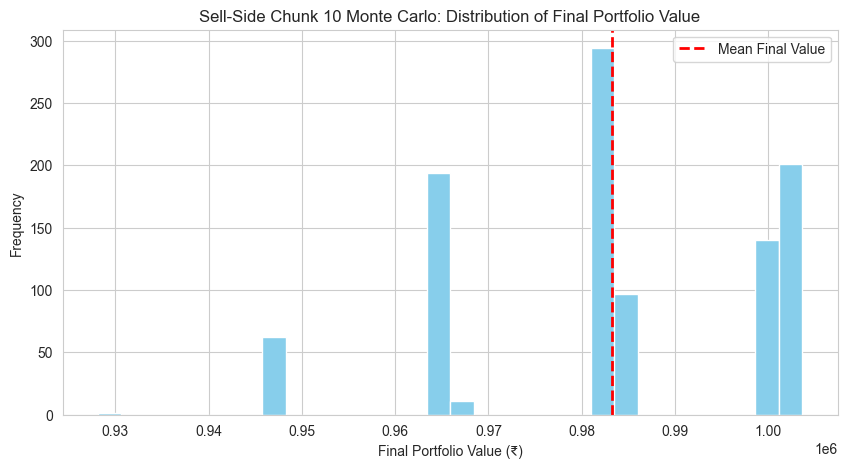

Monte Carlo: Mean Final Value = ₹983,231.75, 5th Percentile = ₹946,996.38, 95th Percentile = ₹1,002,032.82


C:\Users\cmman\AppData\Local\Temp\ipykernel_28480\437400957.py:271: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: compute_atr(x, BUY_ATR_PERIOD)).reset_index(level=[0,1,2], drop=True)



Buy-Side Chunk 10 Strategy Performance Report:
-----------------------------
Initial Capital:    ₹1,000,000.00
Final Portfolio:    ₹912,751.74
Total Return:       -8.72%
Max Drawdown:       ₹87,248.26
Sharpe Ratio:       -3.64
Sortino Ratio:      -7.08
Calmar Ratio:       -7.42

Trade Statistics:
-----------------
Total Trades:       35
Winning Trades:     18
Losing Trades:      17
Avg PnL:            ₹-2,492.81
Best Trade:         ₹13,985.00
Worst Trade:        ₹-15,000.00
Trade Period:       2024-12-02 to 2025-01-03



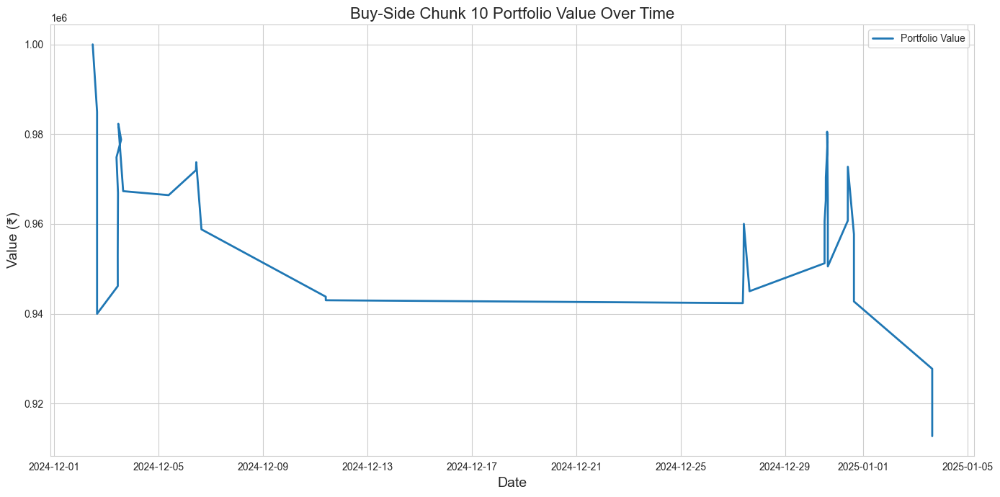

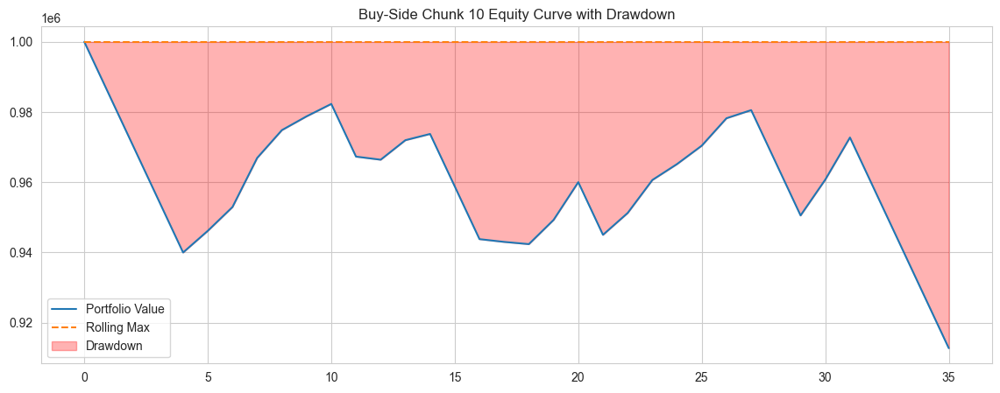

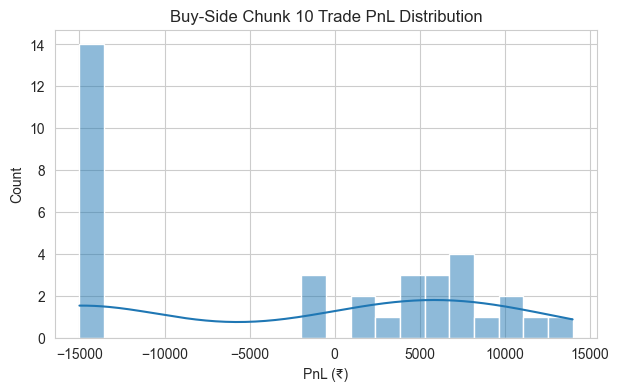

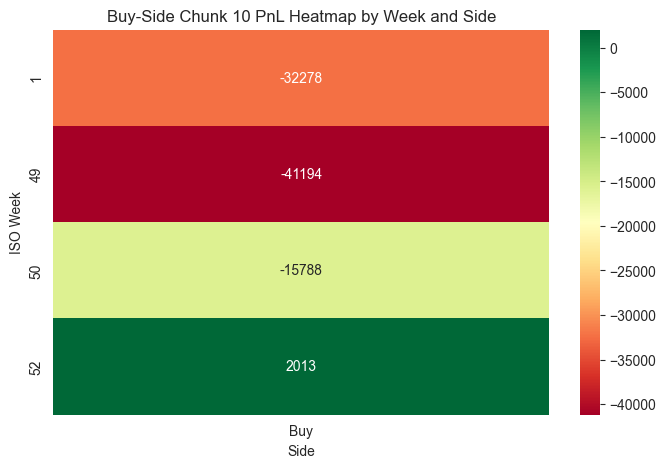

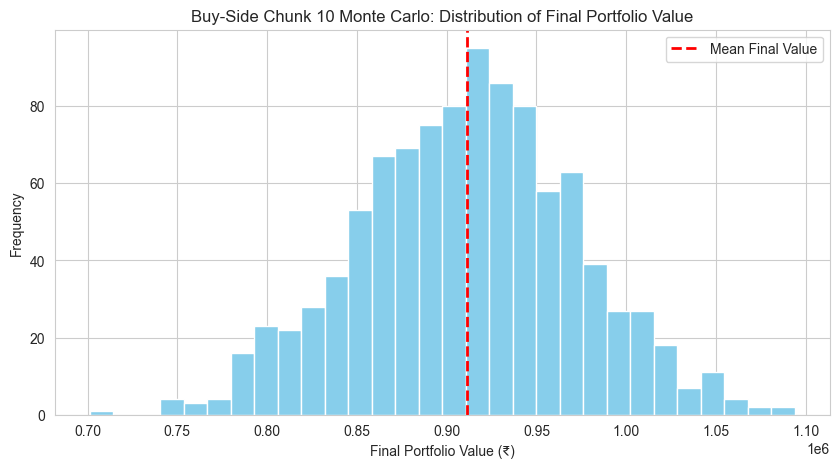

Monte Carlo: Mean Final Value = ₹911,304.53, 5th Percentile = ₹805,711.34, 95th Percentile = ₹1,011,867.47

===== CUMULATIVE REPORT AFTER CHUNK 10 =====

Combined Strategy Performance Report:
-----------------------------
Initial Capital:    1,000,000.00
Final Portfolio:    3,700,761.03
Total Return:       270.08%
Max Drawdown:       124,049.77
Sharpe Ratio:       3.11
Sortino Ratio:      6.62
Calmar Ratio:       10.01
Total Trades:       976
Winning Trades:     673
Losing Trades:      303
Avg PnL:            2,767.17
Best Trade:         146,082.03
Worst Trade:        -18,000.00
Trade Period:       2023-06-02 to 2025-01-15



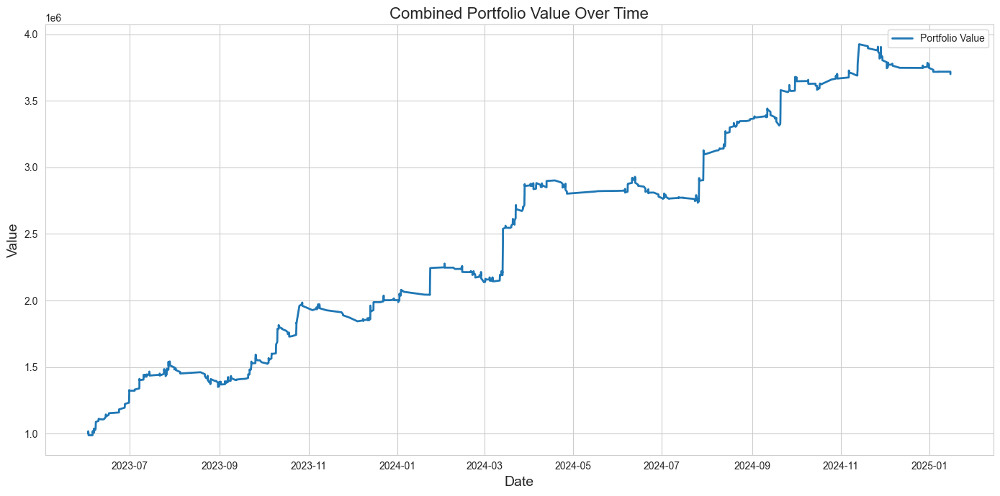

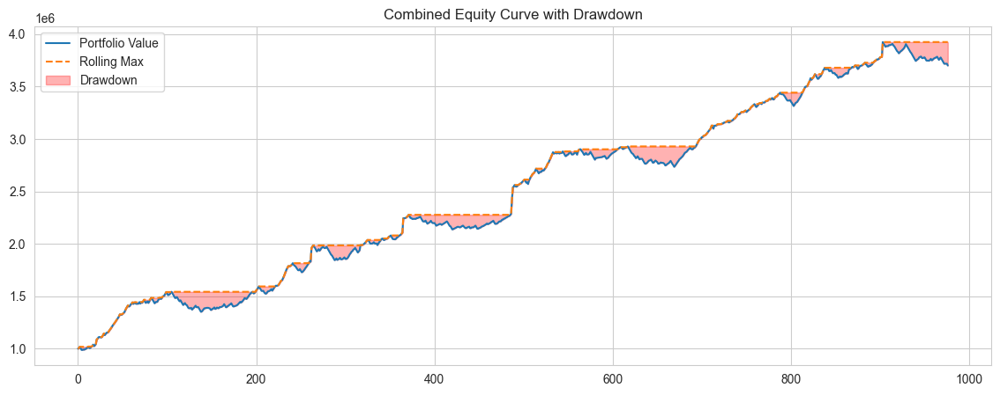

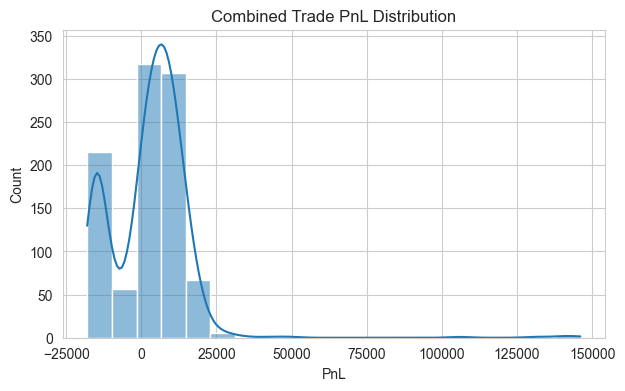

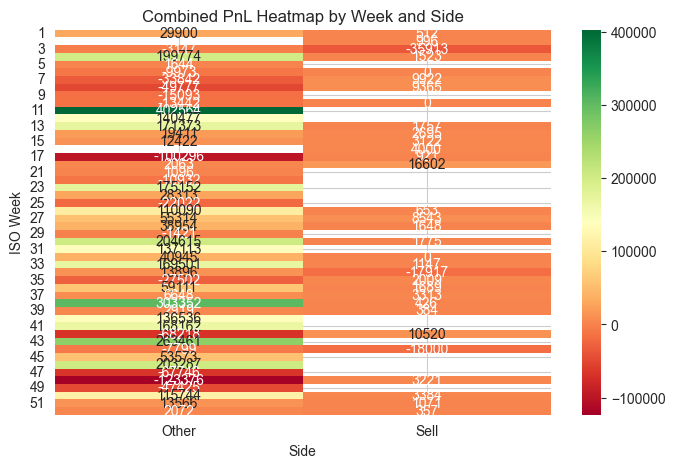

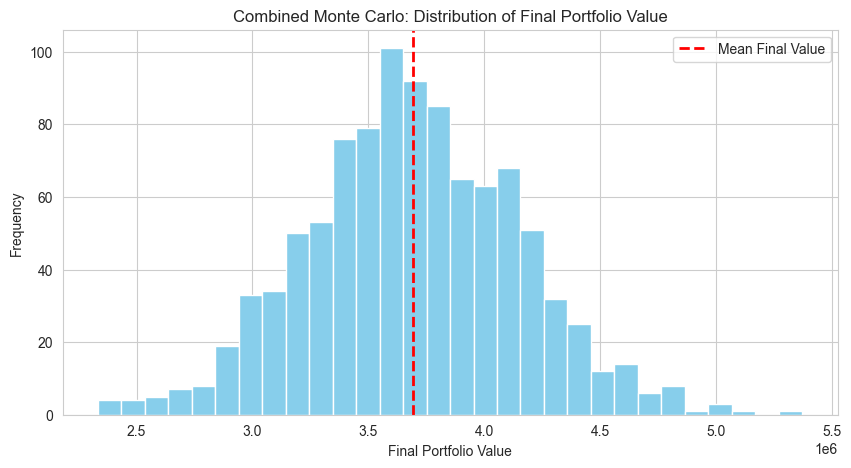

Monte Carlo: Mean Final Value = 3,692,928.50, 5th Percentile = 2,948,773.02, 95th Percentile = 4,443,706.79


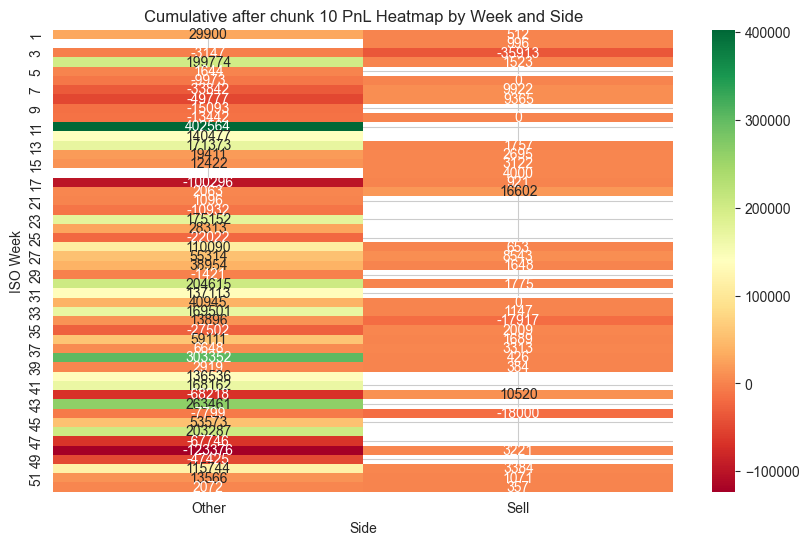

In [8]:
import pandas as pd
import numpy as np
import os
from datetime import datetime, timedelta
import matplotlib.pyplot as plt
import seaborn as sns
import random

# =========================
# CONFIGURATION
# =========================
initial_capital = 1_000_000
lot_size = 50
ATR_PERIOD = 10
ATR_MULTIPLIER = 2.5
BROKERAGE_PER_ORDER = 20
SLIPPAGE_PCT = 0.001
MARKET_CLOSE_TIME = '15:25:00'
VIX_LOW = 14
VIX_HIGH = 22
RISK_LOW = 0.15
RISK_MED = 0.10
RISK_HIGH = 0.05
CONFIRM_LOOKBACK = 10
MAX_LOSS = 18000
PARTIAL_BOOK_PCT = 0.2

BUY_PARTIAL_TP_PCT = 0.15
BUY_FINAL_TP_PCT_LOW = 0.20
BUY_FINAL_TP_PCT_HIGH = 0.40
BUY_ATR_PERIOD = 10
BUY_ATR_MULTIPLIER = 2.5
BUY_MAX_LOSS = 15000
BUY_BROKERAGE_PER_ORDER = 20
BUY_SLIPPAGE_PCT = 0.001
BUY_MARKET_CLOSE_TIME = '15:25:00'
BUY_VIX_LOW = 13
BUY_VIX_MED = 17
BUY_RISK_LOW = 0.15
BUY_RISK_MED = 0.10
BUY_RISK_HIGH = 0.05
BUY_IVR_THRESHOLD = 40

# =========================
# DATA LOADING
# =========================
def load_spot(start_date, end_date):
    df = pd.read_csv(r"D:\Bits Hyderabad_Campus Diaries\PS-1\AlgoBulls\Options_Backtest_Local_Data\NIFTY_50_minute_data_Jun23_Feb25.csv", parse_dates=['date'])
    df = df.set_index('date')
    df.index = pd.to_datetime(df.index).tz_localize('Asia/Kolkata')
    df = df.loc[start_date:end_date]
    return df

def load_signals_15min():
    signals_path = r"D:\Bits Hyderabad_Campus Diaries\PS-1\AlgoBulls\Options_Backtest_Local_Data\Nifty_50_signals_15min_2023_25_50_200.csv"
    signals = pd.read_csv(signals_path, parse_dates=['date'])
    signals = signals.set_index('date')
    if signals.index.tz is None:
        signals.index = pd.to_datetime(signals.index).tz_localize('Asia/Kolkata')
    else:
        signals.index = signals.index.tz_convert('Asia/Kolkata')
    if 'Signal' not in signals.columns:
        signals.columns = ['Signal']
    return signals

def load_options_sample():
    sample_path = r"D:\Bits Hyderabad_Campus Diaries\PS-1\AlgoBulls\Options_Backtest_Local_Data\Jun23_Feb25_options_sample_ALL_EXPIRIES.csv"
    options_sample = pd.read_csv(sample_path)
    options_sample['TimeStamp'] = pd.to_datetime(options_sample['TimeStamp'])
    if options_sample['TimeStamp'].dt.tz is None:
        options_sample['TimeStamp'] = options_sample['TimeStamp'].dt.tz_localize('Asia/Kolkata')
    else:
        options_sample['TimeStamp'] = options_sample['TimeStamp'].dt.tz_convert('Asia/Kolkata')
    options_sample['Expiry'] = pd.to_datetime(options_sample['Expiry'])
    return options_sample

def load_vix(start_date, end_date):
    vix_path = r"D:\Bits Hyderabad_Campus Diaries\PS-1\AlgoBulls\Options_Backtest_Local_Data\filtered_INDIA_VIX_Jun23_Feb25.csv"
    vix = pd.read_csv(vix_path, parse_dates=['TimeStamp'])
    vix = vix.set_index('TimeStamp')
    vix.index = pd.to_datetime(vix.index).tz_localize('Asia/Kolkata')
    vix = vix.loc[start_date:end_date]
    return vix

# =========================
# ADAPTIVE VIX FILTER (10th/90th percentile)
# =========================
def adaptive_vix_trend_filter(vix_series, current_time, window=252, low_pct=0.1, high_pct=0.9):
    vix_hist = vix_series.loc[:current_time].tail(window)
    if len(vix_hist) < window // 2:
        return False
    low_thr = np.percentile(vix_hist, low_pct*100)
    high_thr = np.percentile(vix_hist, high_pct*100)
    curr_vix = vix_series.loc[current_time]
    return (curr_vix > low_thr) and (curr_vix < high_thr)

# =========================
# STRATEGY HELPERS
# =========================
def get_nearest_strike(strikes, target):
    return min(strikes, key=lambda x: abs(x - target))

def get_nearest_expiry(expiry_list, ts):
    future_expiries = [e for e in expiry_list if e >= ts.date()]
    return min(future_expiries) if future_expiries else None

def compute_atr(df, period=ATR_PERIOD):
    high = df['High']
    low = df['Low']
    close = df['Close']
    prev_close = close.shift(1)
    tr = pd.concat([high - low, (high - prev_close).abs(), (low - prev_close).abs()], axis=1).max(axis=1)
    atr = tr.rolling(window=period, min_periods=1).mean()
    return atr

def price_breakout_confirmation(spot_data, ts, direction, lookback=CONFIRM_LOOKBACK, sma_period=21):
    window = spot_data.loc[:ts].iloc[-lookback:]
    if len(window) < lookback:
        return False
    last_close = window['close'].iloc[-1]
    mean_high = window['high'][:-1].mean()
    mean_low = window['low'][:-1].mean()
    sma21 = window['close'].rolling(window=sma_period, min_periods=1).mean().iloc[-1]
    if direction == 1:
        return last_close > mean_high and last_close > sma21
    elif direction == -1:
        return last_close < mean_low and last_close < sma21
    return False

def trend_filter(spot_data, ts, direction, sma_period=50):
    window = spot_data.loc[:ts].iloc[-sma_period:]
    if len(window) < sma_period:
        return False
    last_close = window['close'].iloc[-1]
    sma = window['close'].mean()
    if direction == 1:
        return last_close > sma
    elif direction == -1:
        return last_close < sma
    return False

def get_dynamic_tp(vix_val):
    if vix_val <= VIX_LOW + 1:
        return 0.15
    elif vix_val <= VIX_HIGH - 1:
        return 0.25
    else:
        return 0.35

def get_risk_per_trade_buy(vix_value):
    if vix_value <= BUY_VIX_LOW:
        return BUY_RISK_LOW
    elif vix_value <= BUY_VIX_MED:
        return BUY_RISK_MED
    else:
        return BUY_RISK_HIGH
    
def choose_best_liquid_strike(options_data, atm_strike, expiry, ts):
    today = ts.date()
    expiry = pd.to_datetime(expiry)
    filtered = options_data[
        (options_data['Expiry'] == expiry) &
        (options_data['TimeStamp'] <= ts) &
        (abs(options_data['Strike'] - atm_strike) <= 100)
    ].copy()
    if expiry.date() == today:
        return None, None, None, None
    if not filtered.empty:
        filtered['liq_score'] = filtered['OI'] + filtered['Volume']
        best_row = filtered.sort_values('liq_score', ascending=False).iloc[0]
        return int(best_row['Strike']), best_row['Type'], int(best_row['Volume']), int(best_row['OI'])
    return None, None, None, None

def calculate_realistic_costs(entry_price, lots, trade_type, option_volume, option_oi):
    brokerage = 20
    stt = 0.0 if trade_type == 'buy' else entry_price * lots * 50 * 0.001
    exchange_charges = max(20, entry_price * lots * 50 * 0.00053)
    if entry_price < 10 or option_volume < 100 or option_oi < 100:
        spread_impact = entry_price * 0.15
    elif entry_price < 50:
        spread_impact = entry_price * 0.08
    else:
        spread_impact = entry_price * 0.03
    base_slippage = 0.005
    size_penalty = min(0.002 * (lots / 10), 0.01)
    total_slippage = (base_slippage + size_penalty) * entry_price * lots * 50
    return brokerage + stt + exchange_charges + spread_impact + total_slippage

def check_liquidity_constraint(strike, option_type, lots, entry_price, atm_strike, option_volume, option_oi, current_time):
    strike_distance_from_atm = abs(strike - atm_strike)
    if strike_distance_from_atm > 300 and lots > 5:
        return False
    if entry_price < 5 and lots > 20:
        return False
    if current_time.hour == 9 and current_time.minute < 30:
        return random.random() < 0.7
    if option_oi < 50 or option_volume < 50:
        return False
    return True

def simulate_realistic_execution(order_size, option_volume, option_oi):
    if order_size > 50:
        fill_probability = max(0.6, 1 - (order_size - 50) * 0.01)
        if random.random() > fill_probability:
            return None
        else:
            fill_ratio = random.uniform(0.3, 0.8)
            return int(order_size * fill_ratio)
    if option_volume < 100 or option_oi < 100:
        fill_ratio = random.uniform(0.5, 1.0)
        return int(order_size * fill_ratio)
    return order_size

def calculate_realistic_position_size(entry_price, account_balance, risk_per_trade, option_volume, option_oi):
    base_lots = int((account_balance * risk_per_trade) / (entry_price * 50))
    if entry_price < 5:
        max_lots = 10
    elif entry_price < 20:
        max_lots = 25
    elif entry_price < 50:
        max_lots = 50
    else:
        max_lots = 100
    if option_volume < 100 or option_oi < 100:
        max_lots = min(max_lots, 5)
    final_lots = min(base_lots, max_lots)
    if random.random() < 0.1:
        final_lots = int(final_lots * random.uniform(0.5, 0.8))
    return max(1, final_lots)

def simulate_trading_problems():
    problems = {
        'data_feed_issues': 0.01,
        'broker_rejection': 0.03,
    }
    for problem, probability in problems.items():
        if random.random() < probability:
            return problem
    return None

def compute_iv_rank(option_df, window=252):
    option_df = option_df.copy()
    option_df['IVR'] = option_df['IV'].rolling(window).apply(
        lambda x: 100 * (x[-1] - x.min()) / (x.max() - x.min()) if (x.max() - x.min()) > 0 else 0,
        raw=True
    )
    return option_df



# =========================
# BUY-SIDE STRATEGY (REALISTIC)
# =========================
def execute_trades_15min_atr_trailing_vix_realistic(
    spot_data, signals, options_data, vix_data,
    partial_tp_pct=BUY_PARTIAL_TP_PCT, tp_pct_low=BUY_FINAL_TP_PCT_LOW, tp_pct_high=BUY_FINAL_TP_PCT_HIGH,
    brokerage_per_order=BUY_BROKERAGE_PER_ORDER, slippage_pct=BUY_SLIPPAGE_PCT
):
    portfolio_cash = initial_capital
    trade_log = []
    total_brokerage = 0
    total_slippage = 0
    expiry_list = sorted(options_data['Expiry'].dt.date.unique())
    signals_15min = signals.reindex(spot_data.index, method='ffill').dropna()
    vix_data = vix_data.reindex(spot_data.index, method='ffill').dropna()
    open_positions = []
    previous_entry_price = None
    max_profitable_lots = 0

    options_data['ATR'] = options_data.groupby(['Strike', 'Type', 'Expiry'])\
        .apply(lambda x: compute_atr(x, BUY_ATR_PERIOD)).reset_index(level=[0,1,2], drop=True)
    if 'IV' in options_data.columns:
        options_data = options_data.groupby(['Strike', 'Type', 'Expiry']).apply(compute_iv_rank).reset_index(drop=True)
    else:
        options_data['IVR'] = 0

    for ts, row in spot_data.iterrows():
        if ts.time() >= datetime.strptime(BUY_MARKET_CLOSE_TIME, '%H:%M:%S').time():
            for pos in open_positions[:]:
                exit_row = options_data[
                    (options_data['Strike'] == pos['strike']) &
                    (options_data['Type'] == pos['type']) &
                    (options_data['Expiry'].dt.date == pos['expiry']) &
                    (options_data['TimeStamp'] >= ts)
                ].sort_values('TimeStamp')
                if not exit_row.empty:
                    exit_price = float(exit_row.iloc[0]['Close'])
                    exit_time = exit_row.iloc[0]['TimeStamp']
                    costs = calculate_realistic_costs(exit_price, pos['lots'], 'buy', pos['option_volume'], pos['option_oi'])
                    pnl = (exit_price - pos['entry_price']) * lot_size * pos['lots'] - costs
                    if pnl < -BUY_MAX_LOSS:
                        pnl = -BUY_MAX_LOSS
                    portfolio_cash += pnl
                    trade_log.append({
                        'entry_date': pos['entry_date'],
                        'entry_time': pos['entry_time'],
                        'exit_date': exit_time,
                        'action': pos['action'],
                        'type': pos['type'],
                        'strike': pos['strike'],
                        'entry_price': pos['entry_price'],
                        'exit_price': exit_price,
                        'lots': pos['lots'],
                        'pnl': pnl,
                        'holding_days': 0,
                        'spot': pos['spot'],
                        'expiry': pos['expiry'],
                        'exit_reason': 'EOD Close'
                    })
                    if pnl > 0:
                        max_profitable_lots = max(max_profitable_lots, pos['lots'])
                    open_positions.remove(pos)
            continue

        if ts not in signals_15min.index or pd.isna(row['close']):
            continue
        signal = signals_15min.loc[ts, 'Signal']
        if signal == 0:
            continue
        spot_price = row['close']
        atm_strike = int(round(spot_price / 50) * 50)
        expiry = get_nearest_expiry(expiry_list, ts)
        if expiry is None:
            continue
        vix_val = vix_data.loc[ts, 'Close'] if ts in vix_data.index else None
        if vix_val is None or np.isnan(vix_val):
            continue
        if not adaptive_vix_trend_filter(vix_data['Close'], ts):
            continue
        vix_ma20 = vix_data['Close'].rolling(20*24*4, min_periods=1).mean().loc[ts]
        ivr = 0
        best_strike, best_type, option_volume, option_oi = choose_best_liquid_strike(options_data, atm_strike, expiry, ts)
        if best_strike is None:
            continue
        option_type = 'CE' if signal == 1 else 'PE'
        # IVR filter (skip if IVR is high or VIX is above MA20)
        if vix_val >= vix_ma20 or ivr >= BUY_IVR_THRESHOLD:
            continue
        # Dynamic TP
        if vix_val <= BUY_VIX_LOW:
            final_tp_pct = tp_pct_low
        elif vix_val > BUY_VIX_MED:
            final_tp_pct = tp_pct_high
        else:
            final_tp_pct = tp_pct_low + (tp_pct_high - tp_pct_low) * ((vix_val - BUY_VIX_LOW)/(BUY_VIX_MED - BUY_VIX_LOW))
        risk_per_trade = get_risk_per_trade_buy(vix_val)
        # Only one open position per strike/expiry/type
        if not any(pos['strike'] == best_strike and pos['expiry'] == expiry and pos['type'] == option_type for pos in open_positions):
            entry_row = options_data[
                (options_data['Strike'] == best_strike) &
                (options_data['Type'] == option_type) &
                (options_data['Expiry'].dt.date == expiry) &
                (options_data['TimeStamp'] >= ts)
            ].sort_values('TimeStamp')
            if entry_row.empty:
                continue
            entry_price = float(entry_row.iloc[0]['Close'])
            entry_time = entry_row.iloc[0]['TimeStamp']
            lots = calculate_realistic_position_size(entry_price, portfolio_cash, risk_per_trade, option_volume, option_oi)
            if previous_entry_price is not None and entry_price < 0.2 * previous_entry_price:
                if max_profitable_lots > 0:
                    lots = min(lots, max_profitable_lots)
            if not check_liquidity_constraint(best_strike, option_type, lots, entry_price, atm_strike, option_volume, option_oi, ts):
                continue
            lots_filled = simulate_realistic_execution(lots, option_volume, option_oi)
            if lots_filled is None or lots_filled < 1:
                continue
            if simulate_trading_problems() is not None:
                continue
            partial_tp_price = entry_price * (1 + partial_tp_pct)
            final_tp_price = entry_price * (1 + final_tp_pct)
            atr = float(entry_row.iloc[0]['ATR'])
            trailing_stop = entry_price - BUY_ATR_MULTIPLIER * atr
            open_positions.append({
                'entry_date': ts,
                'entry_time': entry_time,
                'action': 'Buy',
                'type': option_type,
                'strike': best_strike,
                'entry_price': entry_price,
                'lots': lots_filled,
                'spot': spot_price,
                'expiry': expiry,
                'signal': signal,
                'option_volume': option_volume,
                'option_oi': option_oi,
                'partial_tp_price': partial_tp_price,
                'final_tp_price': final_tp_price,
                'trailing_stop': trailing_stop,
                'max_loss_stop': entry_price - (BUY_MAX_LOSS / (lot_size * lots_filled)),
                'highest_price': entry_price,
                'risk_per_trade': risk_per_trade,
                'vix_at_entry': vix_val,
                'ivr_at_entry': ivr,
                'partial_booked': False,
                'partial_lots': lots_filled // 2,
                'final_lots': lots_filled - (lots_filled // 2)
            })
            previous_entry_price = entry_price

        for pos in open_positions[:]:
            exit_reason = None
            exit_price = None
            exit_time = None
            option_rows = options_data[
                (options_data['Strike'] == pos['strike']) &
                (options_data['Type'] == pos['type']) &
                (options_data['Expiry'].dt.date == pos['expiry']) &
                (options_data['TimeStamp'] >= pos['entry_time']) &
                (options_data['TimeStamp'] <= ts)
            ].sort_values('TimeStamp')
            for _, opt_row in option_rows.iterrows():
                price = float(opt_row['Close'])
                atr = float(opt_row['ATR'])
                if price > pos['highest_price']:
                    pos['highest_price'] = price
                trailing_stop = pos['highest_price'] - BUY_ATR_MULTIPLIER * atr
                pos['trailing_stop'] = max(pos['trailing_stop'], trailing_stop)
                if not pos['partial_booked'] and price >= pos['partial_tp_price']:
                    costs = calculate_realistic_costs(price, pos['partial_lots'], 'buy', pos['option_volume'], pos['option_oi'])
                    pnl = (price - pos['entry_price']) * lot_size * pos['partial_lots'] - costs
                    if pnl < -BUY_MAX_LOSS:
                        pnl = -BUY_MAX_LOSS
                    portfolio_cash += pnl
                    trade_log.append({
                        'entry_date': pos['entry_date'],
                        'entry_time': pos['entry_time'],
                        'exit_date': opt_row['TimeStamp'],
                        'action': pos['action'],
                        'type': pos['type'],
                        'strike': pos['strike'],
                        'entry_price': pos['entry_price'],
                        'exit_price': price,
                        'lots': pos['partial_lots'],
                        'pnl': pnl,
                        'holding_days': 0,
                        'spot': pos['spot'],
                        'expiry': pos['expiry'],
                        'exit_reason': 'Partial TP',
                        'risk_per_trade': pos['risk_per_trade'],
                        'vix_at_entry': pos['vix_at_entry'],
                        'ivr_at_entry': pos['ivr_at_entry']
                    })
                    if pnl > 0:
                        max_profitable_lots = max(max_profitable_lots, pos['partial_lots'])
                    pos['partial_booked'] = True
                    pos['final_lots'] = pos['final_lots']
                    continue
                if pos['partial_booked'] and price >= pos['final_tp_price']:
                    exit_price = pos['final_tp_price']
                    exit_time = opt_row['TimeStamp']
                    exit_reason = 'Final TP'
                    break
                elif pos['partial_booked'] and price <= pos['trailing_stop']:
                    exit_price = pos['trailing_stop']
                    exit_time = opt_row['TimeStamp']
                    exit_reason = 'Trailing Stop'
                    break
                elif pos['partial_booked'] and price <= pos['max_loss_stop']:
                    exit_price = pos['max_loss_stop']
                    exit_time = opt_row['TimeStamp']
                    exit_reason = 'Max Loss Stop'
                    break
            if pos['partial_booked'] and exit_reason is not None and exit_price is not None:
                costs = calculate_realistic_costs(exit_price, pos['final_lots'], 'buy', pos['option_volume'], pos['option_oi'])
                pnl = (exit_price - pos['entry_price']) * lot_size * pos['final_lots'] - costs
                if pnl < -BUY_MAX_LOSS:
                    pnl = -BUY_MAX_LOSS
                portfolio_cash += pnl
                trade_log.append({
                    'entry_date': pos['entry_date'],
                    'entry_time': pos['entry_time'],
                    'exit_date': exit_time,
                    'action': pos['action'],
                    'type': pos['type'],
                    'strike': pos['strike'],
                    'entry_price': pos['entry_price'],
                    'exit_price': exit_price,
                    'lots': pos['final_lots'],
                    'pnl': pnl,
                    'holding_days': 0,
                    'spot': pos['spot'],
                    'expiry': pos['expiry'],
                    'exit_reason': exit_reason,
                    'risk_per_trade': pos['risk_per_trade'],
                    'vix_at_entry': pos['vix_at_entry'],
                    'ivr_at_entry': pos['ivr_at_entry']
                })
                if pnl > 0:
                    max_profitable_lots = max(max_profitable_lots, pos['final_lots'])
                open_positions.remove(pos)
    return trade_log, total_brokerage, total_slippage
# =========================
# SELL-SIDE STRATEGY (ROBUST)
# =========================
def execute_sell_side(spot_data, signals, options_data, vix_data):
    portfolio_cash = initial_capital
    trade_log = []
    total_brokerage = 0
    total_slippage = 0
    available_strikes = np.sort(options_data['Strike'].unique())
    expiry_list = sorted(options_data['Expiry'].dt.date.unique())
    signals_15min = signals.reindex(spot_data.index, method='ffill').dropna()
    vix_data = vix_data.reindex(spot_data.index, method='ffill').dropna()
    open_spread = None
    prev_signal = 0
    atr_series = options_data.groupby(['Strike', 'Type', 'Expiry'], group_keys=False)[['High', 'Low', 'Close']].apply(
        lambda x: compute_atr(x, ATR_PERIOD)
    )
    options_data['ATR'] = atr_series.values 
    for ts, row in spot_data.iterrows():
        if ts not in signals_15min.index or pd.isna(row['close']):
            continue
        signal = signals_15min.loc[ts, 'Signal']
        spot_price = row['close']
        atm_strike = int(round(spot_price / 50) * 50)
        expiry = get_nearest_expiry(expiry_list, ts)
        vix_val = vix_data.loc[ts, 'Close'] if ts in vix_data.index else None
        if expiry is None or vix_val is None or np.isnan(vix_val):
            prev_signal = signal
            continue
        risk_per_trade = get_risk_per_trade_buy(vix_val)
        if not adaptive_vix_trend_filter(vix_data['Close'], ts):
            prev_signal = signal
            continue
        if not trend_filter(spot_data, ts, signal, sma_period=50):
            prev_signal = signal
            continue
        if open_spread is None and signal != 0 and signal != prev_signal and price_breakout_confirmation(spot_data, ts, signal):
            if signal == 1:
                short_strike = atm_strike
                long_strike = atm_strike - 100
                short_leg = options_data[
                    (options_data['Strike'] == short_strike) &
                    (options_data['Type'] == 'PE') &
                    (options_data['Expiry'].dt.date == expiry) &
                    (options_data['TimeStamp'] >= ts)
                ].sort_values('TimeStamp')
                long_leg = options_data[
                    (options_data['Strike'] == long_strike) &
                    (options_data['Type'] == 'PE') &
                    (options_data['Expiry'].dt.date == expiry) &
                    (options_data['TimeStamp'] >= ts)
                ].sort_values('TimeStamp')
            else:
                short_strike = atm_strike
                long_strike = atm_strike + 100
                short_leg = options_data[
                    (options_data['Strike'] == short_strike) &
                    (options_data['Type'] == 'CE') &
                    (options_data['Expiry'].dt.date == expiry) &
                    (options_data['TimeStamp'] >= ts)
                ].sort_values('TimeStamp')
                long_leg = options_data[
                    (options_data['Strike'] == long_strike) &
                    (options_data['Type'] == 'CE') &
                    (options_data['Expiry'].dt.date == expiry) &
                    (options_data['TimeStamp'] >= ts)
                ].sort_values('TimeStamp')
            if short_leg.empty or long_leg.empty:
                prev_signal = signal
                continue
            short_price = float(short_leg.iloc[0]['Close'])
            long_price = float(long_leg.iloc[0]['Close'])
            credit = (short_price - long_price) * lot_size
            margin_per_lot = abs(short_strike - long_strike) * lot_size - credit
            lots = int((portfolio_cash * risk_per_trade) // margin_per_lot)
            if lots < 1:
                prev_signal = signal
                continue
            tp_pct = get_dynamic_tp(vix_val)
            open_spread = {
                'entry_date': ts,
                'short_leg': {'strike': short_strike, 'type': short_leg.iloc[0]['Type'], 'expiry': expiry, 'price': short_price},
                'long_leg': {'strike': long_strike, 'type': long_leg.iloc[0]['Type'], 'expiry': expiry, 'price': long_price},
                'credit': credit,
                'lots': lots,
                'direction': 'bull_put' if signal == 1 else 'bear_call',
                'risk_per_trade': risk_per_trade,
                'vix_at_entry': vix_val,
                'tp_pct': tp_pct,
                'partial_booked': False
            }
            prev_signal = signal
            continue
        if open_spread is not None:
            short_leg, long_leg = open_spread['short_leg'], open_spread['long_leg']
            spread_rows_short = options_data[
                (options_data['Strike'] == short_leg['strike']) &
                (options_data['Type'] == short_leg['type']) &
                (options_data['Expiry'].dt.date == short_leg['expiry']) &
                (options_data['TimeStamp'] >= open_spread['entry_date']) &
                (options_data['TimeStamp'] <= ts)
            ].sort_values('TimeStamp')
            spread_rows_long = options_data[
                (options_data['Strike'] == long_leg['strike']) &
                (options_data['Type'] == long_leg['type']) &
                (options_data['Expiry'].dt.date == long_leg['expiry']) &
                (options_data['TimeStamp'] >= open_spread['entry_date']) &
                (options_data['TimeStamp'] <= ts)
            ].sort_values('TimeStamp')
            for i in range(min(len(spread_rows_short), len(spread_rows_long))):
                short_price = float(spread_rows_short.iloc[i]['Close'])
                long_price = float(spread_rows_long.iloc[i]['Close'])
                spread_value = (short_price - long_price) * lot_size
                pnl = (open_spread['credit'] - spread_value) * open_spread['lots']
                tp_level = open_spread['credit'] * open_spread['tp_pct']
                if not open_spread['partial_booked'] and pnl > tp_level:
                    booked_pnl = tp_level * PARTIAL_BOOK_PCT
                    portfolio_cash += booked_pnl
                    open_spread['credit'] -= booked_pnl
                    open_spread['lots'] = int(open_spread['lots'] * (1 - PARTIAL_BOOK_PCT))
                    open_spread['partial_booked'] = True
                    trade_log.append({**open_spread, 'exit_date': spread_rows_short.iloc[i]['TimeStamp'], 'exit_pnl': booked_pnl, 'exit_reason': 'Partial TP'})
                elif pnl > tp_level and open_spread['partial_booked']:
                    exit_time = spread_rows_short.iloc[i]['TimeStamp']
                    portfolio_cash += pnl
                    trade_log.append({**open_spread, 'exit_date': exit_time, 'exit_pnl': pnl, 'exit_reason': 'Full TP'})
                    open_spread = None
                    break
                elif pnl < -MAX_LOSS:
                    exit_time = spread_rows_short.iloc[i]['TimeStamp']
                    portfolio_cash += -MAX_LOSS
                    trade_log.append({**open_spread, 'exit_date': exit_time, 'exit_pnl': -MAX_LOSS, 'exit_reason': 'Max Loss'})
                    open_spread = None
                    break
                elif ts.date() >= open_spread['short_leg']['expiry']:
                    exit_time = spread_rows_short.iloc[i]['TimeStamp']
                    pnl = (open_spread['credit'] - spread_value) * open_spread['lots']
                    if pnl < -MAX_LOSS:
                        pnl = -MAX_LOSS
                    portfolio_cash += pnl
                    trade_log.append({**open_spread, 'exit_date': exit_time, 'exit_pnl': pnl, 'exit_reason': 'Expiry'})
                    open_spread = None
                    break
        prev_signal = signal
    return trade_log, total_brokerage, total_slippage

# =========================
# REPORTING AND VISUALIZATION
# =========================
def strategy_report_and_visualizations(trade_log_df, initial_capital, title_prefix=""):
    if trade_log_df.empty:
        print("No trades to report.")
        return
    portfolio_values = [initial_capital]
    portfolio_dates = [trade_log_df['entry_date'].iloc[0]]
    current_value = initial_capital
    for i, row in trade_log_df.iterrows():
        current_value += row['exit_pnl']
        portfolio_values.append(current_value)
        portfolio_dates.append(row['exit_date'])
    returns = pd.Series(portfolio_values).pct_change().dropna()
    rf = 0.01  # risk-free rate (annual)
    sharpe = ((returns.mean() - rf/252) / returns.std()) * np.sqrt(252) if returns.std() > 0 else 0
    downside_std = returns[returns < 0].std()
    sortino = ((returns.mean() - rf/252) / downside_std) * np.sqrt(252) if downside_std > 0 else 0
    cumulative = pd.Series(portfolio_values)
    rolling_max = cumulative.cummax()
    drawdown = (cumulative - rolling_max) / rolling_max
    max_drawdown = abs(drawdown.min()) * initial_capital
    years = (portfolio_dates[-1] - portfolio_dates[0]).days / 365.25 if isinstance(portfolio_dates[0], pd.Timestamp) else len(portfolio_values) / 252
    cagr = (portfolio_values[-1]/portfolio_values[0])**(1/years) - 1 if years > 0 else 0
    calmar = cagr / abs(drawdown.min()) if drawdown.min() != 0 else 0

    print(f"""
{title_prefix} Strategy Performance Report:
-----------------------------
Initial Capital:    ₹{initial_capital:,.2f}
Final Portfolio:    ₹{portfolio_values[-1]:,.2f}
Total Return:       {(portfolio_values[-1]/initial_capital-1)*100:.2f}%
Max Drawdown:       ₹{max_drawdown:,.2f}
Sharpe Ratio:       {sharpe:.2f}
Sortino Ratio:      {sortino:.2f}
Calmar Ratio:       {calmar:.2f}

Trade Statistics:
-----------------
Total Trades:       {len(trade_log_df)}
Winning Trades:     {(trade_log_df['exit_pnl'] > 0).sum()}
Losing Trades:      {(trade_log_df['exit_pnl'] <= 0).sum()}
Avg PnL:            ₹{trade_log_df['exit_pnl'].mean():,.2f}
Best Trade:         ₹{trade_log_df['exit_pnl'].max():,.2f}
Worst Trade:        ₹{trade_log_df['exit_pnl'].min():,.2f}
Trade Period:       {trade_log_df['entry_date'].min().date()} to {trade_log_df['exit_date'].max().date()}
""")

    sns.set_style("whitegrid")
    plt.figure(figsize=(14, 7))
    plt.plot(portfolio_dates, portfolio_values, label='Portfolio Value', linewidth=2)
    plt.title(f'{title_prefix} Portfolio Value Over Time', fontsize=16)
    plt.ylabel('Value (₹)', fontsize=14)
    plt.xlabel('Date', fontsize=14)
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(14, 5))
    plt.plot(cumulative, label='Portfolio Value')
    plt.plot(rolling_max, '--', label='Rolling Max')
    plt.fill_between(cumulative.index, cumulative, rolling_max, color='red', alpha=0.3, label='Drawdown')
    plt.title(f"{title_prefix} Equity Curve with Drawdown")
    plt.legend()
    plt.show()

    plt.figure(figsize=(7, 4))
    sns.histplot(trade_log_df['exit_pnl'], bins=20, kde=True)
    plt.title(f"{title_prefix} Trade PnL Distribution")
    plt.xlabel("PnL (₹)")
    plt.ylabel("Count")
    plt.show()

    # --- Heatmap: Buy/Sell by week and direction ---
    trade_log_df['exit_week'] = pd.to_datetime(trade_log_df['exit_date']).dt.isocalendar().week
    if 'direction' in trade_log_df.columns:
        trade_log_df['side'] = trade_log_df['direction'].map({
            'bull_put': 'Sell',
            'bear_call': 'Sell',
            'bull_call': 'Buy',
            'bear_put': 'Buy',
            'buy_call': 'Buy',
            'buy_put': 'Buy'
        }).fillna('Other')
    elif 'action' in trade_log_df.columns:
        trade_log_df['side'] = trade_log_df['action'].str.capitalize()
    else:
        trade_log_df['side'] = 'Unknown'
    heatmap_data = trade_log_df.pivot_table(index='exit_week', columns='side', values='exit_pnl', aggfunc='sum')
    plt.figure(figsize=(8, 5))
    sns.heatmap(heatmap_data, annot=True, fmt=".0f", cmap='RdYlGn')
    plt.title(f"{title_prefix} PnL Heatmap by Week and Side")
    plt.xlabel("Side")
    plt.ylabel("ISO Week")
    plt.show()

    # --- Monte Carlo Simulation ---
    n_sim = 1000
    sim_length = len(trade_log_df)
    sim_results = []
    for _ in range(n_sim):
        sim_pnls = np.random.choice(trade_log_df['exit_pnl'], size=sim_length, replace=True)
        sim_curve = np.cumsum(np.insert(sim_pnls, 0, initial_capital))
        sim_results.append(sim_curve[-1])
    plt.figure(figsize=(10, 5))
    plt.hist(sim_results, bins=30, color='skyblue')
    plt.axvline(np.mean(sim_results), color='red', linestyle='dashed', linewidth=2, label='Mean Final Value')
    plt.title(f"{title_prefix} Monte Carlo: Distribution of Final Portfolio Value")
    plt.xlabel("Final Portfolio Value (₹)")
    plt.ylabel("Frequency")
    plt.legend()
    plt.show()
    print(f"Monte Carlo: Mean Final Value = ₹{np.mean(sim_results):,.2f}, 5th Percentile = ₹{np.percentile(sim_results, 5):,.2f}, 95th Percentile = ₹{np.percentile(sim_results, 95):,.2f}")

def combined_cumulative_report_and_visualizations(sell_log_df, buy_log_df, initial_capital):
    combined_df = pd.concat([sell_log_df, buy_log_df], ignore_index=True)
    if combined_df.empty:
        print("No trades to report in combined logs.")
        return
    combined_df = combined_df.sort_values('exit_date')
    portfolio_values = [initial_capital]
    portfolio_dates = [combined_df['entry_date'].min()]
    current_value = initial_capital
    for i, row in combined_df.iterrows():
        current_value += row['exit_pnl']
        portfolio_values.append(current_value)
        portfolio_dates.append(row['exit_date'])
    returns = pd.Series(portfolio_values).pct_change().dropna()
    rf = 0.01
    sharpe = ((returns.mean() - rf/252) / returns.std()) * np.sqrt(252) if returns.std() > 0 else 0
    downside_std = returns[returns < 0].std()
    sortino = ((returns.mean() - rf/252) / downside_std) * np.sqrt(252) if downside_std > 0 else 0
    cumulative = pd.Series(portfolio_values)
    rolling_max = cumulative.cummax()
    drawdown = (cumulative - rolling_max) / rolling_max
    max_drawdown = abs(drawdown.min()) * initial_capital
    years = (portfolio_dates[-1] - portfolio_dates[0]).days / 365.25 if isinstance(portfolio_dates[0], pd.Timestamp) else len(portfolio_values) / 252
    cagr = (portfolio_values[-1]/portfolio_values[0])**(1/years) - 1 if years > 0 else 0
    calmar = cagr / abs(drawdown.min()) if drawdown.min() != 0 else 0
    print(f"""
Combined Strategy Performance Report:
-----------------------------
Initial Capital:    {initial_capital:,.2f}
Final Portfolio:    {portfolio_values[-1]:,.2f}
Total Return:       {(portfolio_values[-1]/initial_capital-1)*100:.2f}%
Max Drawdown:       {max_drawdown:,.2f}
Sharpe Ratio:       {sharpe:.2f}
Sortino Ratio:      {sortino:.2f}
Calmar Ratio:       {calmar:.2f}
Total Trades:       {len(combined_df)}
Winning Trades:     {(combined_df['exit_pnl'] > 0).sum()}
Losing Trades:      {(combined_df['exit_pnl'] <= 0).sum()}
Avg PnL:            {combined_df['exit_pnl'].mean():,.2f}
Best Trade:         {combined_df['exit_pnl'].max():,.2f}
Worst Trade:        {combined_df['exit_pnl'].min():,.2f}
Trade Period:       {combined_df['entry_date'].min().date()} to {combined_df['exit_date'].max().date()}
""")
    sns.set_style("whitegrid")
    plt.figure(figsize=(14, 7))
    plt.plot(portfolio_dates, portfolio_values, label='Portfolio Value', linewidth=2)
    plt.title('Combined Portfolio Value Over Time', fontsize=16)
    plt.ylabel('Value', fontsize=14)
    plt.xlabel('Date', fontsize=14)
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()
    plt.figure(figsize=(14, 5))
    plt.plot(cumulative, label='Portfolio Value')
    plt.plot(rolling_max, '--', label='Rolling Max')
    plt.fill_between(cumulative.index, cumulative, rolling_max, color='red', alpha=0.3, label='Drawdown')
    plt.title('Combined Equity Curve with Drawdown')
    plt.legend()
    plt.show()
    plt.figure(figsize=(7, 4))
    sns.histplot(combined_df['exit_pnl'], bins=20, kde=True)
    plt.title('Combined Trade PnL Distribution')
    plt.xlabel('PnL')
    plt.ylabel('Count')
    plt.show()
    # --- Heatmap: Buy/Sell by week and side ---
    combined_df['exit_week'] = pd.to_datetime(combined_df['exit_date']).dt.isocalendar().week
    if 'direction' in combined_df.columns:
        combined_df['side'] = combined_df['direction'].map({
            'bull_put': 'Sell',
            'bear_call': 'Sell',
            'bull_call': 'Buy',
            'bear_put': 'Buy',
            'buy_call': 'Buy',
            'buy_put': 'Buy'
        }).fillna('Other')
    elif 'action' in combined_df.columns:
        combined_df['side'] = combined_df['action'].str.capitalize()
    else:
        combined_df['side'] = 'Unknown'
    heatmap_data = combined_df.pivot_table(index='exit_week', columns='side', values='exit_pnl', aggfunc='sum')
    plt.figure(figsize=(8, 5))
    sns.heatmap(heatmap_data, annot=True, fmt=".0f", cmap='RdYlGn')
    plt.title("Combined PnL Heatmap by Week and Side")
    plt.xlabel("Side")
    plt.ylabel("ISO Week")
    plt.show()
    n_sim = 1000
    sim_length = len(combined_df)
    sim_results = []
    for _ in range(n_sim):
        sim_pnls = np.random.choice(combined_df['exit_pnl'], size=sim_length, replace=True)
        sim_curve = np.cumsum(np.insert(sim_pnls, 0, initial_capital))
        sim_results.append(sim_curve[-1])
    plt.figure(figsize=(10, 5))
    plt.hist(sim_results, bins=30, color='skyblue')
    plt.axvline(np.mean(sim_results), color='red', linestyle='dashed', linewidth=2, label='Mean Final Value')
    plt.title('Combined Monte Carlo: Distribution of Final Portfolio Value')
    plt.xlabel('Final Portfolio Value')
    plt.ylabel('Frequency')
    plt.legend()
    plt.show()
    print(f"Monte Carlo: Mean Final Value = {np.mean(sim_results):,.2f}, 5th Percentile = {np.percentile(sim_results, 5):,.2f}, 95th Percentile = {np.percentile(sim_results, 95):,.2f}")

def combined_cumulative_heatmap(sell_log_df, buy_log_df, title_prefix="Cumulative"):
    combined_df = pd.concat([sell_log_df, buy_log_df], ignore_index=True)
    if combined_df.empty:
        print("No trades to report in combined logs.")
        return
    combined_df['exit_week'] = pd.to_datetime(combined_df['exit_date']).dt.isocalendar().week
    if 'direction' in combined_df.columns:
        combined_df['side'] = combined_df['direction'].map({
            'bull_put': 'Sell',
            'bear_call': 'Sell',
            'bull_call': 'Buy',
            'bear_put': 'Buy',
            'buy_call': 'Buy',
            'buy_put': 'Buy'
        }).fillna('Other')
    elif 'action' in combined_df.columns:
        combined_df['side'] = combined_df['action'].str.capitalize()
    else:
        combined_df['side'] = 'Unknown'
    heatmap_data = combined_df.pivot_table(index='exit_week', columns='side', values='exit_pnl', aggfunc='sum')
    plt.figure(figsize=(10, 6))
    sns.heatmap(heatmap_data, annot=True, fmt=".0f", cmap='RdYlGn')
    plt.title(f"{title_prefix} PnL Heatmap by Week and Side")
    plt.xlabel("Side")
    plt.ylabel("ISO Week")
    plt.show()

# =========================
# MAIN CHUNKED BACKTEST LOOP
# =========================
signals = load_signals_15min()
options_sample = load_options_sample()
start_date = pd.Timestamp('2023-06-01 09:15:00', tz='Asia/Kolkata')
final_end_date = pd.Timestamp('2025-01-16 15:30:00', tz='Asia/Kolkata')
chunk_length = pd.DateOffset(months=2)
chunk_idx = 1
current_start = start_date
all_sell_logs = []
all_buy_logs = []
while current_start < final_end_date:
    current_end = min(current_start + chunk_length - pd.Timedelta(minutes=1), final_end_date)
    print(f"\n=== Processing chunk {chunk_idx}: {current_start} to {current_end} ===")
    spot_data = load_spot(current_start, current_end)
    vix_data = load_vix(current_start, current_end)
    chunk_signals = signals.loc[(signals.index >= current_start) & (signals.index <= current_end)]
    chunk_options = options_sample[
        (options_sample['TimeStamp'] >= current_start) &
        (options_sample['TimeStamp'] <= current_end)
    ]
    if spot_data.empty or vix_data.empty or chunk_signals.empty or chunk_options.empty:
        print(f"Chunk {chunk_idx} skipped due to missing data.")
        current_start = current_end + pd.Timedelta(minutes=1)
        chunk_idx += 1
        continue
    # SELL SIDE
    sell_log, sell_brokerage, sell_slippage = execute_sell_side(spot_data, chunk_signals, chunk_options.copy(), vix_data)
    sell_log_df = pd.DataFrame(sell_log)
    if not sell_log_df.empty:
        all_sell_logs.append(sell_log_df)
        strategy_report_and_visualizations(sell_log_df, initial_capital, title_prefix=f"Sell-Side Chunk {chunk_idx}")
    else:
        print(f"No sell-side trades in chunk {chunk_idx}")
    # BUY SIDE (REALISTIC)
    buy_log, buy_brokerage, buy_slippage = execute_trades_15min_atr_trailing_vix_realistic(
        spot_data, chunk_signals, chunk_options.copy(), vix_data
    )
    buy_log_df = pd.DataFrame(buy_log)
    if not buy_log_df.empty:
        if 'exit_pnl' not in buy_log_df.columns and 'pnl' in buy_log_df.columns:
            buy_log_df = buy_log_df.rename(columns={'pnl': 'exit_pnl'})
        all_buy_logs.append(buy_log_df)
        strategy_report_and_visualizations(buy_log_df, initial_capital, title_prefix=f"Buy-Side Chunk {chunk_idx}")
    else:
        print(f"No buy-side trades in chunk {chunk_idx}")

    # CUMULATIVE REPORT AND HEATMAP AFTER EACH CHUNK (combined)
    if all_sell_logs or all_buy_logs:
        cumulative_sell_log = pd.concat(all_sell_logs, ignore_index=True) if all_sell_logs else pd.DataFrame()
        cumulative_buy_log = pd.concat(all_buy_logs, ignore_index=True) if all_buy_logs else pd.DataFrame()
        print(f"\n===== CUMULATIVE REPORT AFTER CHUNK {chunk_idx} =====")
        combined_cumulative_report_and_visualizations(cumulative_sell_log, cumulative_buy_log, initial_capital)
        combined_cumulative_heatmap(cumulative_sell_log, cumulative_buy_log, title_prefix=f"Cumulative after chunk {chunk_idx}")
    current_start = current_end + pd.Timedelta(minutes=1)
    chunk_idx += 1


In [9]:
import pandas as pd

# Combine all sell logs
cumulative_sell_log = pd.concat(all_sell_logs, ignore_index=True) if all_sell_logs else pd.DataFrame()

# Combine all buy logs
cumulative_buy_log = pd.concat(all_buy_logs, ignore_index=True) if all_buy_logs else pd.DataFrame()
# Save sell log
cumulative_sell_log.to_csv('sell_trade_log.csv', index=False)

# Save buy log
cumulative_buy_log.to_csv('buy_trade_log.csv', index=False)

combined_log = pd.concat([cumulative_sell_log, cumulative_buy_log], ignore_index=True)
combined_log.to_csv('combined_trade_log.csv', index=False)


In [10]:
import pandas as pd

# Example: Suppose you have these lists from your backtest loop
# (Replace these with your actual lists if the variable names differ)
sell_brokerage_list = []  # e.g. [sell_brokerage_chunk1, sell_brokerage_chunk2, ...]
buy_brokerage_list = []   # e.g. [buy_brokerage_chunk1, buy_brokerage_chunk2, ...]
sell_slippage_list = []   # e.g. [sell_slippage_chunk1, sell_slippage_chunk2, ...]
buy_slippage_list = []    # e.g. [buy_slippage_chunk1, buy_slippage_chunk2, ...]

# Calculate totals
total_brokerage = sum(sell_brokerage_list) + sum(buy_brokerage_list)
total_slippage = sum(sell_slippage_list) + sum(buy_slippage_list)

# Print results
print(f"Total Brokerage Paid: ₹{total_brokerage:,.2f}")
print(f"Total Slippage Incurred: ₹{total_slippage:,.2f}")

# Save as a CSV for record-keeping
costs_df = pd.DataFrame({
    'Cost_Type': ['Total_Brokerage', 'Total_Slippage'],
    'Amount': [total_brokerage, total_slippage]
})
costs_df.to_csv('total_brokerage_slippage.csv', index=False)


Total Brokerage Paid: ₹0.00
Total Slippage Incurred: ₹0.00


C:\Users\cmman\AppData\Local\Temp\ipykernel_28480\3152920107.py:17: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  combined_df['month'] = pd.to_datetime(combined_df['exit_date']).dt.to_period('M')


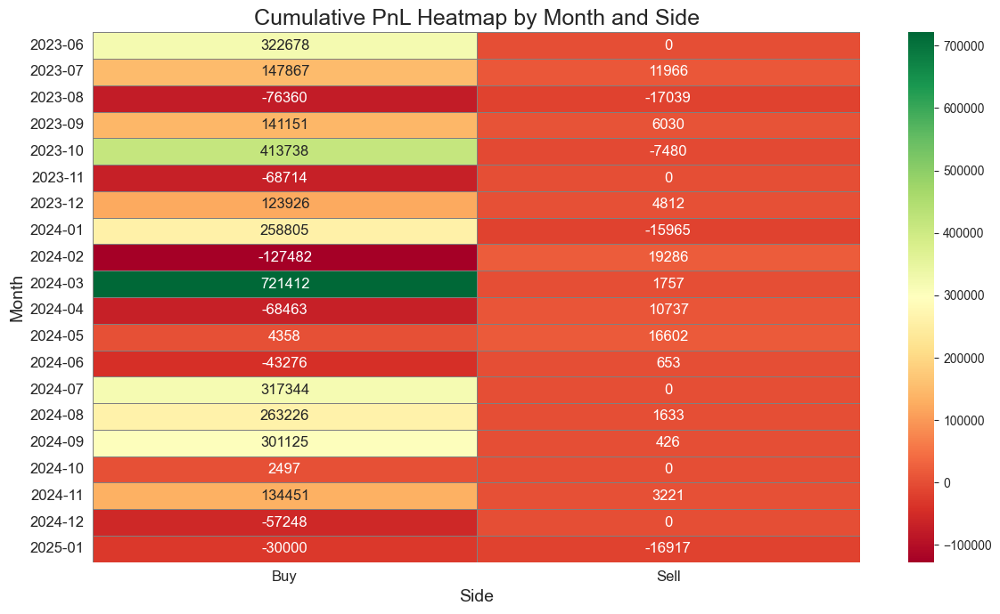

In [11]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load your buy and sell logs
buy_log_df = pd.read_csv(r"D:\Bits Hyderabad_Campus Diaries\PS-1\AlgoBulls\buy_trade_log.csv", parse_dates=['exit_date'])
sell_log_df = pd.read_csv(r"D:\Bits Hyderabad_Campus Diaries\PS-1\AlgoBulls\sell_trade_log.csv", parse_dates=['exit_date'])

# Assign side labels
buy_log_df['side'] = 'Buy'
sell_log_df['side'] = 'Sell'

# Combine logs
combined_df = pd.concat([buy_log_df, sell_log_df], ignore_index=True)

# Convert exit_date to month period for grouping
combined_df['month'] = pd.to_datetime(combined_df['exit_date']).dt.to_period('M')

# Pivot table: index=month, columns=side, values=sum of exit_pnl
heatmap_data = combined_df.pivot_table(index='month', columns='side', values='exit_pnl', aggfunc='sum').fillna(0)

# Plot heatmap
plt.figure(figsize=(12, 7))
sns.heatmap(
    heatmap_data,
    annot=True,
    fmt='.0f',
    cmap='RdYlGn',
    linewidths=0.5,
    linecolor='gray',
    annot_kws={"size": 12}
)
plt.title('Cumulative PnL Heatmap by Month and Side', fontsize=18)
plt.xlabel('Side', fontsize=14)
plt.ylabel('Month', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()
